# PREMIERE PROJECT : Academic Ranking of World Universities Analytics

Team DeepLearning
© 2022 Hamoye Data Science Internship

---

I **Oladimeji WILLIAMS**, confirm - by submitting this document - that the solutions in this notebook are a result of my team's work (team Deep Learning), and that I abide by the [Code of Conduct](https://drive.google.com/file/d/1sbR80aowp1daCnElwx3kNm0fxids0e6b/view) contained therein.



### Overview: QS World University Rankings
> This dataset contains rankings of the world universities as maintained by Quacquarelli Symmonds. QS is a British think-tank company specializing in the analysis of higher education institutions throughout the world. QS uses 6 factors for their ranking framework wiz. Academic Reputation, Employer Reputation, Faculty to Student Ratio, Number of citations per faculty, International Faculty, International Students. Another feature included in this data was Classification (which is not used for ranking) which included the institution's size, subject range, research intensity, age, and status.
>This data can be used to analyze a specific set of universities' performances over the years as seen by QS. The scores can be an indicator of how well or bad have the universities performed in comparison to the last year.


Attribute Information:

1.   `Academic reputation` – Accounting for 40 per cent of the overall score, academic reputation looks at the teaching and research quality at the world’s universities. We collate over 130,000 expert opinions from the higher education space, creating the largest survey of academic opinion in the world. 
2.   `Employer reputation` – We know that students want to graduate with the skills and knowledge required for the employment market. We assess how institutions prepare students for successful careers, and which institutions provide the most competent, innovative, and effective graduates. 
3.   `Faculty/student ratio` – This indicator recognizes that a high number of academics per student reduces the teaching burden and creates a more supportive student experience. We assess how institutions provide students with meaningful access to lecturers and tutors. 
4.   `Citations per faculty` – We measure university research quality with a citation per faculty metric, taking the total number of academic citations in papers produced by a university in a five-year period.
5.   `International student ratio & International faculty ratio` – A highly international university creates a number of benefits. It demonstrates the ability to attract quality students and staff from across the world, and it implies a highly global outlook. Strong international institutions provide a multinational environment, building international sympathies and global awareness. 

The set of indicators for our World University Ranking and their weights are shown below, linking to 
their fuller descriptions in our methods section.
- Academic Reputation 40%
- Employer Reputation 10%
- Faculty Student Ratio 20%
- Citations per Faculty 20%
- International Faculty Ratio 5%
- International Student Ratio 5%
- International Research Network0% (for 2023 edition)
- Employment Outcomes 0% (for 2023 edition


Based on Classifications
1. Size
Based on the (full time equivalent) size of the degree-seeking student body. Where an FTE number is not 
provided or available, one will be estimated based on common characteristics of other institutions in the 
country or region in question.
Size Students
XL Extra Large More than 30,000
L Large >=12,000
M Medium >=5,000
S Small Fewer than 5,000

2. FOCUS/Subject Range
Four categories based on the institution’s provision of programs in the five broad faculty areas used in
the university rankings. Due to radically different publication habits and patterns in medicine, an 
additional category is added based on whether the subject institution has a medical school.
 
    - Focus Faculty Area
        - FC Full comprehensive: All 5 faculty areas + medical school
        - CO Comprehensive: All 5 faculty areas
        - FO Focused: 3 or 4 faculty areas
        - SP Specialist: 2 or fewer faculty areas
3. Age
    - Classification Age
        - 5 Historic: 100 years old and more
        - 4 Mature: 50-99 years old
        - 3 Established: 25-49 years old
        - 2 Young: 10-24 years old
        - 1 New: Less than 10 years old


4. Research Intensity
Four levels of research activity evaluated based on the number of documents retrievable from Scopus in 
the five-year period preceding the application of the classification. The thresholds required to reach the 
different levels are different depending on the institution's pre-classifications.
    - RESEARCH INTENSITY
        - VH Very High
        - HI High
        - MD Medium
        - LO Low
        
        
- **The supporting visualization of this project on *tableau dashboard* can be found  [here](https://www.canva.com/design/DAFJ9cXZSTM/w4seT4KLSbzOLsHxh3VfKg/view?utm_content=DAFJ9cXZSTM&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton).**

# 1. Preliminaries

In [1]:
# Load All Possible Libraries
import pandas as pd
import numpy as np
import random
import statistics
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow
from tensorflow import keras
from sklearn.compose import make_column_transformer
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import MinMaxScaler, StandardScaler, Normalizer, OneHotEncoder
from sklearn.model_selection import train_test_split, KFold, cross_val_score, GridSearchCV
from sklearn.preprocessing import LabelEncoder
from imblearn.over_sampling import SMOTE
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from xgboost import XGBRegressor
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsClassifier
from catboost import CatBoostRegressor
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, mean_squared_error, mean_absolute_error, r2_score, roc_curve, roc_auc_score, classification_report, confusion_matrix
import chardet
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

c:\users\williams\appdata\local\programs\python\python39\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.6) or chardet (5.0.0)/charset_normalizer (2.0.4) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


###### Load the dateset

In [2]:
with open("2018-QS-World-University-Rankings.csv", 'rb') as f:
    res = chardet.detect(f.read(100000))
res

{'encoding': None, 'confidence': 0.0, 'language': None}

In [3]:
df_2018 = pd.read_csv("2018-QS-World-University-Rankings.csv", encoding = 'unicode_escape', header = [0,1])
df_2019 = pd.read_csv("2019-QS-World-University-Rankings.csv", encoding = 'unicode_escape', header = [0,1])
df_2020 = pd.read_csv("2020-QS-World-University-Rankings.csv", encoding = 'unicode_escape', header = [0,1])

###### Peak the first few observations of each of the dataset

In [4]:
df_2018.head()

,2018,2017,Institution Name,Country,Classification,Unnamed: 5_level_0,Unnamed: 6_level_0,Unnamed: 7_level_0,Unnamed: 8_level_0,Academic Reputation,...,Unnamed: 12_level_0,Faculty Student,Unnamed: 14_level_0,Citations per Faculty,Unnamed: 16_level_0,International Faculty,Unnamed: 18_level_0,International Students,Unnamed: 20_level_0,Overall Score
,Unnamed: 0_level_1,Unnamed: 1_level_1,Unnamed: 2_level_1,Unnamed: 3_level_1,SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,SCORE,...,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,Unnamed: 21_level_1
0,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,14,99.9,8,100,36,96.1,70,100
1,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,5,100,12,99.4,12,99.6,54,72.7,177,98.7
2,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,3,98.3,38,99.9,9,96.5,103,75.2,165,98.4
3,4,5,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5.0,B,99.5,...,77,100,3,100,4,93.4,126,89.2,106,97.7
4,5,4,UNIVERSITY OF CAMBRIDGE,United Kingdom,L,FC,VH,5.0,A,100,...,1,100,10,78.3,75,97.4,87,97.7,57,95.6


In [5]:
df_2019.head()

,2019,2018,Institution Name,Country,Classification,Unnamed: 5_level_0,Unnamed: 6_level_0,Unnamed: 7_level_0,Unnamed: 8_level_0,Academic Reputation,...,Unnamed: 12_level_0,Faculty Student,Unnamed: 14_level_0,Citations per Faculty,Unnamed: 16_level_0,International Faculty,Unnamed: 18_level_0,International Students,Unnamed: 20_level_0,Overall Score
,Unnamed: 0_level_1,Unnamed: 1_level_1,Unnamed: 2_level_1,Unnamed: 3_level_1,SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,SCORE,...,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,Unnamed: 21_level_1
0,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,17,99.8,8,100,41,95.5,77,100
1,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,5,100,16,99,13,99.8,56,70.5,190,98.6
2,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,1,99.3,40,99.8,9,92.1,151,75.7,164,98.5
3,4,4,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5.0,B,98.7,...,72,100,4,100,5,96.8,115,90.3,103,97.2
4,5,6,UNIVERSITY OF OXFORD,United Kingdom,L,FC,VH,5.0,A,100,...,3,100,7,83,56,99.6,63,98.8,43,96.8


In [6]:
df_2020.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification,Unnamed: 5_level_0,Unnamed: 6_level_0,Unnamed: 7_level_0,Unnamed: 8_level_0,Academic Reputation,...,Unnamed: 12_level_0,Faculty Student,Unnamed: 14_level_0,Citations per Faculty,Unnamed: 16_level_0,International Faculty,Unnamed: 18_level_0,International Students,Unnamed: 20_level_0,Overall Score
,Unnamed: 0_level_1,Unnamed: 1_level_1,Unnamed: 2_level_1,Unnamed: 3_level_1,SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,SCORE,...,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,Unnamed: 21_level_1
0,1,1,Massachusetts Institute of Technology (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,15,99.8,7,100,43,94.1,87,100
1,2,2,Stanford University,United States,L,FC,VH,5.0,B,100,...,5,100,12,98.6,13,99.8,62,67.7,196,98.4
2,3,3,Harvard University,United States,L,FC,VH,5.0,B,100,...,1,98.7,40,99.6,8,86.3,186,62.2,221,97.4
3,4,5,University of Oxford,United Kingdom,L,FC,VH,5.0,A,100,...,3,100,8,84.7,45,99.7,64,98.5,50,97.2
4,5,4,California Institute of Technology (Caltech),United States,S,CO,VH,5.0,B,97.8,...,74,100,4,100,4,99.4,72,87.3,121,96.9


###### Correct the headers of each of the dataset and confirm

In [7]:
for d in [df_2018, df_2019, df_2020]:
    cols = []
    for column in d:
        if column[0].startswith('Unnamed'):
            cols.append(column[1])
        elif column[1].startswith('Unnamed'):
            cols.append(column[0])
        else:
            cols.append(column[0]+'_'+column[1])
    d.columns = cols

In [8]:
df_2018.head()

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,...,RANK,Faculty Student_SCORE,RANK,Citations per Faculty_SCORE,RANK,International Faculty_SCORE,RANK,International Students_SCORE,RANK,Overall Score
0,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,14,99.9,8,100,36,96.1,70,100
1,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,5,100,12,99.4,12,99.6,54,72.7,177,98.7
2,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,3,98.3,38,99.9,9,96.5,103,75.2,165,98.4
3,4,5,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5.0,B,99.5,...,77,100,3,100,4,93.4,126,89.2,106,97.7
4,5,4,UNIVERSITY OF CAMBRIDGE,United Kingdom,L,FC,VH,5.0,A,100,...,1,100,10,78.3,75,97.4,87,97.7,57,95.6


In [9]:
df_2019.head()

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,...,RANK,Faculty Student_SCORE,RANK,Citations per Faculty_SCORE,RANK,International Faculty_SCORE,RANK,International Students_SCORE,RANK,Overall Score
0,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,17,99.8,8,100,41,95.5,77,100
1,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,5,100,16,99,13,99.8,56,70.5,190,98.6
2,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5.0,B,100,...,1,99.3,40,99.8,9,92.1,151,75.7,164,98.5
3,4,4,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5.0,B,98.7,...,72,100,4,100,5,96.8,115,90.3,103,97.2
4,5,6,UNIVERSITY OF OXFORD,United Kingdom,L,FC,VH,5.0,A,100,...,3,100,7,83,56,99.6,63,98.8,43,96.8


In [10]:
df_2020.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,...,RANK,Faculty Student_SCORE,RANK,Citations per Faculty_SCORE,RANK,International Faculty_SCORE,RANK,International Students_SCORE,RANK,Overall Score
0,1,1,Massachusetts Institute of Technology (MIT),United States,M,CO,VH,5.0,B,100,...,4,100,15,99.8,7,100,43,94.1,87,100
1,2,2,Stanford University,United States,L,FC,VH,5.0,B,100,...,5,100,12,98.6,13,99.8,62,67.7,196,98.4
2,3,3,Harvard University,United States,L,FC,VH,5.0,B,100,...,1,98.7,40,99.6,8,86.3,186,62.2,221,97.4
3,4,5,University of Oxford,United Kingdom,L,FC,VH,5.0,A,100,...,3,100,8,84.7,45,99.7,64,98.5,50,97.2
4,5,4,California Institute of Technology (Caltech),United States,S,CO,VH,5.0,B,97.8,...,74,100,4,100,4,99.4,72,87.3,121,96.9


# 2. INTUITIVE  DATA CLEANING FOR ANALYSIS

In [11]:
df_2020.isna().sum()

Rank in 2020                    22
Rank in 2019                    72
Institution Name                 0
Country                          0
Classification_SIZE              0
FOCUS                           23
RESEARCH INTENSITY              24
AGE                             23
STATUS                          42
Academic Reputation_SCORE        0
RANK                             0
Employer Reputation_SCORE        0
RANK                             0
Faculty Student_SCORE            0
RANK                             0
Citations per Faculty_SCORE      0
RANK                             0
International Faculty_SCORE     46
RANK                             5
International Students_SCORE     6
RANK                             1
Overall Score                    0
dtype: int64

In [12]:
df_2020 = df_2020.drop(['RANK'], axis = 1)
df_2018 = df_2018.drop(['RANK'], axis = 1)
df_2019 = df_2019.drop(['RANK'], axis = 1)

In [13]:
cleaned_2020 = df_2020.copy()

In [14]:
cleaned_2020 = cleaned_2020[~cleaned_2020['Rank in 2020'].isna()] # remove the institutions without rank in 2020

In [15]:
cleaned_2020 = cleaned_2020[~cleaned_2020['Rank in 2019'].isna()] # remove the institutions without rank in 2020

In [16]:
cleaned_2020.isna().sum()

Rank in 2020                     0
Rank in 2019                     0
Institution Name                 0
Country                          0
Classification_SIZE              0
FOCUS                           14
RESEARCH INTENSITY              15
AGE                             18
STATUS                          21
Academic Reputation_SCORE        0
Employer Reputation_SCORE        0
Faculty Student_SCORE            0
Citations per Faculty_SCORE      0
International Faculty_SCORE     39
International Students_SCORE     5
Overall Score                    0
dtype: int64

In [17]:
cleaned_2020.isna().sum()

Rank in 2020                     0
Rank in 2019                     0
Institution Name                 0
Country                          0
Classification_SIZE              0
FOCUS                           14
RESEARCH INTENSITY              15
AGE                             18
STATUS                          21
Academic Reputation_SCORE        0
Employer Reputation_SCORE        0
Faculty Student_SCORE            0
Citations per Faculty_SCORE      0
International Faculty_SCORE     39
International Students_SCORE     5
Overall Score                    0
dtype: int64

In [18]:
for c in cleaned_2020.columns:
    if c != 'AGE':
        print('-------')
        print(f'unique{c}')
        print(np.unique(cleaned_2020[c].astype('str')))
    else:
        continue

-------
uniqueRank in 2020
['  104=' '  108=' '  116=' '  11=' '  120=' '  125=' '  130=' '  132='
 '  140=' '  154=' '  156=' '  160=' '  163=' '  165=' '  167=' '  169='
 '  170=' '  173=' '  177=' '  179=' '  186=' '  189=' '  18=' '  192='
 '  198=' '  200=' '  207=' '  212=' '  215=' '  217=' '  219=' '  227='
 '  22=' '  231=' '  234=' '  239=' '  247=' '  251=' '  253=' '  257='
 '  25=' '  262=' '  266=' '  268=' '  271=' '  274=' '  277=' '  281='
 '  285=' '  287=' '  291=' '  296=' '  298=' '  29=' '  302=' '  305='
 '  312=' '  314=' '  320=' '  322=' '  324=' '  329=' '  331=' '  336='
 '  338=' '  33=' '  340=' '  344=' '  349=' '  351=' '  353=' '  356='
 '  359=' '  35=' '  364=' '  368=' '  371=' '  372=' '  377=' '  379='
 '  383=' '  387=' '  389=' '  392=' '  395=' '  398=' '  400=' '  407='
 '  410=' '  412=' '  419=' '  421=' '  424=' '  427=' '  429=' '  432='
 '  436=' '  439=' '  442=' '  448=' '  451=' '  454=' '  458=' '  462='
 '  468=' '  474=' '  478=' '  

In [19]:
cleaned_na = cleaned_2020.dropna()

In [20]:
cleaned_na.replace('-', np.nan).isna().sum()

Rank in 2020                      0
Rank in 2019                      0
Institution Name                  0
Country                           0
Classification_SIZE               0
FOCUS                             0
RESEARCH INTENSITY                0
AGE                               0
STATUS                            0
Academic Reputation_SCORE       326
Employer Reputation_SCORE       300
Faculty Student_SCORE           233
Citations per Faculty_SCORE     256
International Faculty_SCORE     250
International Students_SCORE    251
Overall Score                     0
dtype: int64

In [21]:
cleaned_na = cleaned_na.replace('-', np.nan).dropna() # some values represented null value with -

In [22]:
cleaned_na.isna().sum()

Rank in 2020                    0
Rank in 2019                    0
Institution Name                0
Country                         0
Classification_SIZE             0
FOCUS                           0
RESEARCH INTENSITY              0
AGE                             0
STATUS                          0
Academic Reputation_SCORE       0
Employer Reputation_SCORE       0
Faculty Student_SCORE           0
Citations per Faculty_SCORE     0
International Faculty_SCORE     0
International Students_SCORE    0
Overall Score                   0
dtype: int64

In [23]:
for c in cleaned_2020.columns:
    if c != 'AGE':
        print('-------')
        print(f'unique{c}')
        print(np.unique(cleaned_na[c].astype('str')))
    else:
        continue

-------
uniqueRank in 2020
['  104=' '  108=' '  116=' '  11=' '  120=' '  125=' '  130=' '  132='
 '  140=' '  154=' '  156=' '  160=' '  163=' '  165=' '  167=' '  169='
 '  170=' '  173=' '  177=' '  179=' '  186=' '  189=' '  18=' '  192='
 '  198=' '  200=' '  207=' '  212=' '  215=' '  217=' '  219=' '  227='
 '  22=' '  231=' '  234=' '  239=' '  247=' '  251=' '  253=' '  257='
 '  25=' '  262=' '  266=' '  268=' '  271=' '  274=' '  277=' '  281='
 '  285=' '  287=' '  291=' '  296=' '  298=' '  29=' '  302=' '  305='
 '  312=' '  314=' '  320=' '  322=' '  324=' '  329=' '  331=' '  336='
 '  338=' '  33=' '  340=' '  344=' '  349=' '  351=' '  353=' '  356='
 '  359=' '  35=' '  364=' '  368=' '  371=' '  372=' '  377=' '  379='
 '  383=' '  387=' '  389=' '  392=' '  395=' '  398=' '  400=' '  407='
 '  410=' '  412=' '  419=' '  421=' '  424=' '  427=' '  429=' '  432='
 '  436=' '  439=' '  442=' '  448=' '  451=' '  454=' '  458=' '  462='
 '  468=' '  474=' '  478=' '  

In [24]:
cleaned_na[cleaned_na['Rank in 2019'] == '551-560']

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
473,474=,551-560,Pontificia Universidad Católica del Perú,Peru,L,FO,HI,5.0,B,36.5,56.3,19.2,1.7,7,2.3,25


In [25]:
cleaned_na['Rank in 2020'] = cleaned_na['Rank in 2020'].str.strip().str.replace('=','')
cleaned_na['Rank in 2019'] = cleaned_na['Rank in 2019'].str.strip().str.replace('=','') # remove = in columns with = alongside rank value

In [26]:
cleaned_na

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,Massachusetts Institute of Technology (MIT),United States,M,CO,VH,5.0,B,100,100,100,99.8,100,94.1,100
1,2,2,Stanford University,United States,L,FC,VH,5.0,B,100,100,100,98.6,99.8,67.7,98.4
2,3,3,Harvard University,United States,L,FC,VH,5.0,B,100,100,98.7,99.6,86.3,62.2,97.4
3,4,5,University of Oxford,United Kingdom,L,FC,VH,5.0,A,100,100,100,84.7,99.7,98.5,97.2
4,5,4,California Institute of Technology (Caltech),United States,S,CO,VH,5.0,B,97.8,81.2,100,100,99.4,87.3,96.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,491,439,University of Delaware,United States,L,CO,VH,5.0,A,11,10.2,11.6,67.1,39.3,22.5,24.3
496,491,481,V.N. Karazin Kharkiv National University,Ukraine,L,FC,MD,5.0,A,10.8,11.4,72.2,1.8,1.3,78.4,24.3
497,498,531-540,Czech Technical University In Prague,Czech Republic,L,SP,VH,5.0,A,18.7,39.7,33.9,10.6,18.2,57.5,24.2
498,498,422,Université de Montpellier,France,XL,CO,VH,1.0,A,20.3,18.8,13.1,42.8,20.1,39.3,24.2


In [27]:
cleaned_na.tail(10)

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
488,489,498,Amirkabir University of Technology,Iran,M,FO,VH,4.0,A,4.7,15,7.4,94.9,7,2.6,24.4
489,489,511-520,Universidad de Santiago de Chile (USACH),Chile,L,FC,MD,5.0,A,35.6,60.2,13.1,4.7,8.2,2.2,24.4
492,491,480,M.O.Auezov South Kazakhstan State University,Kazakhstan,L,CO,MD,4.0,A,7,6.1,94.1,1,17.1,17.7,24.3
493,491,531-540,Universidad de Montevideo,Uruguay,S,FC,LO,2.0,B,13.4,17.3,79.1,1.3,18.1,3.7,24.3
494,491,453,Université Aix-Marseille,France,XL,FC,VH,1.0,A,33.9,4.9,13.5,25,23.6,26.6,24.3
495,491,439,University of Delaware,United States,L,CO,VH,5.0,A,11,10.2,11.6,67.1,39.3,22.5,24.3
496,491,481,V.N. Karazin Kharkiv National University,Ukraine,L,FC,MD,5.0,A,10.8,11.4,72.2,1.8,1.3,78.4,24.3
497,498,531-540,Czech Technical University In Prague,Czech Republic,L,SP,VH,5.0,A,18.7,39.7,33.9,10.6,18.2,57.5,24.2
498,498,422,Université de Montpellier,France,XL,CO,VH,1.0,A,20.3,18.8,13.1,42.8,20.1,39.3,24.2
499,498,481,University of Eastern Finland,Finland,M,CO,VH,3.0,A,14.5,10.5,43.8,33.5,27.9,9.1,24.2


In [28]:
cleaned_2019 = df_2019.copy()

In [29]:
cleaned_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1025 entries, 0 to 1024
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2019                          1003 non-null   object 
 1   2018                          939 non-null    object 
 2   Institution Name              1022 non-null   object 
 3   Country                       1021 non-null   object 
 4   Classification_SIZE           1021 non-null   object 
 5   FOCUS                         1021 non-null   object 
 6   RESEARCH INTENSITY            1021 non-null   object 
 7   AGE                           1021 non-null   float64
 8   STATUS                        1021 non-null   object 
 9   Academic Reputation_SCORE     1021 non-null   object 
 10  Employer Reputation_SCORE     1019 non-null   object 
 11  Faculty Student_SCORE         1021 non-null   object 
 12  Citations per Faculty_SCORE   1021 non-null   object 
 13  Int

In [30]:
cleaned_2019 = cleaned_2019.dropna()

In [31]:
cleaned_2019.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 895 entries, 0 to 999
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2019                          895 non-null    object 
 1   2018                          895 non-null    object 
 2   Institution Name              895 non-null    object 
 3   Country                       895 non-null    object 
 4   Classification_SIZE           895 non-null    object 
 5   FOCUS                         895 non-null    object 
 6   RESEARCH INTENSITY            895 non-null    object 
 7   AGE                           895 non-null    float64
 8   STATUS                        895 non-null    object 
 9   Academic Reputation_SCORE     895 non-null    object 
 10  Employer Reputation_SCORE     895 non-null    object 
 11  Faculty Student_SCORE         895 non-null    object 
 12  Citations per Faculty_SCORE   895 non-null    object 
 13  Inter

In [32]:
for c in cleaned_2019.columns:
    if c != 'AGE':
        print('-------')
        print(f'unique{c}')
        print(np.unique(cleaned_2019[c].astype('str')))
    else:
        continue

-------
unique2019
['  100=' '  104=' '  122=' '  126=' '  128=' '  132=' '  141=' '  149='
 '  151=' '  154=' '  156=' '  160=' '  163=' '  172=' '  175=' '  180='
 '  184=' '  186=' '  193=' '  195=' '  200=' '  204=' '  208=' '  212='
 '  214=' '  218=' '  221=' '  223=' '  231=' '  237=' '  239=' '  242='
 '  244=' '  250=' '  253=' '  257=' '  260=' '  264=' '  269=' '  272='
 '  275=' '  277=' '  279=' '  283=' '  285=' '  289=' '  292=' '  295='
 '  299=' '  302=' '  306=' '  310=' '  313=' '  315=' '  317=' '  319='
 '  321=' '  323=' '  326=' '  329=' '  332=' '  336=' '  338=' '  343='
 '  345=' '  352=' '  355=' '  359=' '  363=' '  367=' '  369=' '  373='
 '  376=' '  381=' '  384=' '  387=' '  391=' '  394=' '  397=' '  402='
 '  405=' '  407=' '  412=' '  415=' '  417=' '  420=' '  422=' '  426='
 '  429=' '  432=' '  435=' '  439=' '  443=' '  446=' '  448=' '  450='
 '  453=' '  456=' '  461=' '  464=' '  470=' '  472=' '  476=' '  478='
 '  481=' '  489=' '  491=' '  4

 '99.7' '99.8' '99.9']
-------
uniqueOverall Score
['100' '14.3 - 15.3' '15.4 - 17.1' '17.2 - 18.6' '18.7 - 20.2'
 '20.3 - 20.4' '20.5 - 20.8' '20.9 - 21' '21.1 - 21.4' '21.5 - 21.8'
 '21.9 - 22.1' '22.2 - 22.5' '22.6 - 22.8' '22.9 - 23' '23.1 - 23.4'
 '23.5' '23.6' '23.7' '23.8' '23.9' '24' '24.1' '24.2' '24.4' '24.5'
 '24.6' '24.7' '24.8' '25' '25.1' '25.2' '25.3' '25.4' '25.5' '25.6'
 '25.7' '25.8' '25.9' '26' '26.2' '26.4' '26.5' '26.7' '26.8' '26.9' '27'
 '27.1' '27.2' '27.3' '27.4' '27.5' '27.6' '27.7' '27.9' '28' '28.1'
 '28.2' '28.3' '28.5' '28.6' '28.7' '28.8' '29' '29.1' '29.2' '29.3'
 '29.4' '29.6' '29.7' '29.9' '30' '30.1' '30.2' '30.3' '30.4' '30.7'
 '30.8' '30.9' '31' '31.1' '31.2' '31.3' '31.5' '31.6' '31.7' '31.9' '32'
 '32.1' '32.2' '32.3' '32.5' '32.7' '32.8' '33.1' '33.2' '33.3' '33.4'
 '33.6' '33.7' '34' '34.1' '34.2' '34.3' '34.4' '34.5' '34.6' '34.7'
 '34.8' '34.9' '35' '35.1' '35.2' '35.3' '35.6' '35.7' '35.8' '35.9' '36'
 '36.1' '36.3' '36.4' '36.6' '36.7' '37' 

In [33]:
cleaned_2019.replace('-', np.nan).isna().sum()

2019                              0
2018                              0
Institution Name                  0
Country                           0
Classification_SIZE               0
FOCUS                             0
RESEARCH INTENSITY                0
AGE                               0
STATUS                            0
Academic Reputation_SCORE       325
Employer Reputation_SCORE       312
Faculty Student_SCORE           248
Citations per Faculty_SCORE     252
International Faculty_SCORE     247
International Students_SCORE    244
Overall Score                     0
dtype: int64

In [34]:
cleaned_2019 = cleaned_2019.replace('-', np.nan).dropna()

In [35]:
cleaned_2019[cleaned_2019['2019'] == '351']

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
350,351,343,CITY UNIVERSITY LONDON,United Kingdom,L,CO,HI,5.0,A,15.4,24.8,13.4,49.2,95.3,99.8,31


In [36]:
cleaned_2019['2019'] = cleaned_2019['2019'].str.strip().str.replace('=','')
cleaned_2019['2018'] = cleaned_2019['2018'].str.strip().str.replace('=','')

In [37]:
cleaned_2019.tail(10)

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
492,491,481-490,UNIVERSITÀ CATTOLICA DEL SACRO CUORE,Italy,L,CO,VH,4.0,B,23.2,50.2,17.7,18.9,21.1,24.1,23.9
493,494,461-470,UNIVERSITY OF NEW MEXICO,United States,L,FC,VH,5.0,A,15.6,11.3,10.4,67.3,9.9,6.2,23.8
494,495,501-550,UNIVERSIDAD DE GRANADA,Spain,XL,FC,VH,5.0,A,34.9,14,12.8,21.4,5.1,23.7,23.7
495,495,501-550,UNIVERSITÄT HOHENHEIM,Germany,M,FO,VH,5.0,A,8.2,11.2,7.8,74.4,24.3,31.5,23.7
496,495,501-550,UNIVERSITY OF OKLAHOMA,United States,L,FC,VH,5.0,A,10.7,13,61,17.6,37.1,10.6,23.7
497,498,501-550,AMIRKABIR UNIVERSITY OF TECHNOLOGY,Iran,M,FO,VH,4.0,A,4.9,9.8,8.6,92.7,4.2,2.5,23.6
498,498,551-600,WESTERN SYDNEY UNIVERSITY,Australia,XL,FC,HI,3.0,A,15.9,26.4,9.9,25.9,100,47.8,23.6
499,500,441-450,SINGAPORE MANAGEMENT UNIVERSITY,Singapore,M,SP,HI,2.0,A,12.7,29,13.8,21.2,100,69.4,23.5
501,500,491-500,UNIVERSITÉ SAINT-JOSEPH DE BEYROUTH,Lebanon,M,FC,MD,5.0,B,7.7,26.9,68.1,2.3,62.2,10.2,23.5
502,500,551-600,UNIVERSITY OF SCIENCE AND TECHNOLOGY BEIJING,China,L,CO,VH,4.0,A,18.2,6,18.9,56.3,5,4.6,23.5


In [38]:
cleaned_2018 = df_2018.copy()

In [39]:
cleaned_2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 984 entries, 0 to 983
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2018                          962 non-null    object 
 1   2017                          914 non-null    object 
 2   Institution Name              981 non-null    object 
 3   Country                       980 non-null    object 
 4   Classification_SIZE           980 non-null    object 
 5   FOCUS                         969 non-null    object 
 6   RESEARCH INTENSITY            968 non-null    object 
 7   AGE                           959 non-null    float64
 8   STATUS                        962 non-null    object 
 9   Academic Reputation_SCORE     980 non-null    object 
 10  Employer Reputation_SCORE     980 non-null    object 
 11  Faculty Student_SCORE         980 non-null    object 
 12  Citations per Faculty_SCORE   979 non-null    object 
 13  Inter

In [40]:
cleaned_2018 = cleaned_2018.dropna()

In [41]:
cleaned_2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 895 entries, 0 to 957
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2018                          895 non-null    object 
 1   2017                          895 non-null    object 
 2   Institution Name              895 non-null    object 
 3   Country                       895 non-null    object 
 4   Classification_SIZE           895 non-null    object 
 5   FOCUS                         895 non-null    object 
 6   RESEARCH INTENSITY            895 non-null    object 
 7   AGE                           895 non-null    float64
 8   STATUS                        895 non-null    object 
 9   Academic Reputation_SCORE     895 non-null    object 
 10  Employer Reputation_SCORE     895 non-null    object 
 11  Faculty Student_SCORE         895 non-null    object 
 12  Citations per Faculty_SCORE   895 non-null    object 
 13  Inter

In [42]:
for c in cleaned_2018.columns:
    if c != 'AGE':
        print('-------')
        print(f'unique{c}')
        print(np.unique(cleaned_2018[c].astype('str')))
    else:
        continue

-------
unique2018
['  102=' '  109=' '  114=' '  116=' '  122=' '  125=' '  135=' '  137='
 '  142=' '  147=' '  149=' '  158=' '  161=' '  164=' '  173=' '  179='
 '  182=' '  188=' '  192=' '  195=' '  205=' '  207=' '  210=' '  21='
 '  224=' '  230=' '  236=' '  23=' '  240=' '  243=' '  245=' '  247='
 '  250=' '  254=' '  256=' '  259=' '  264=' '  267=' '  270=' '  272='
 '  277=' '  279=' '  283=' '  287=' '  289=' '  28=' '  293=' '  296='
 '  299=' '  301=' '  305=' '  308=' '  314=' '  316=' '  319=' '  323='
 '  325=' '  331=' '  334=' '  339=' '  341=' '  344=' '  346=' '  349='
 '  352=' '  355=' '  357=' '  361=' '  364=' '  367=' '  36=' '  373='
 '  382=' '  386=' '  388=' '  38=' '  391=' '  395=' '  398=' '  41='
 '  47=' '  71=' '  73=' '  76=' '  78=' '  801-1000' '  82=' '  84='
 '  90=' '  93=' '  95=' '  98=' '1' '10' '100' '101' '104' '105' '106'
 '107' '108' '11' '112' '113' '118' '119' '12' '120' '121' '124' '127'
 '128' '129' '13' '130' '131' '132' '133' '1

In [43]:
cleaned_2018.replace('-', np.nan).isna().sum()

2018                              0
2017                              0
Institution Name                  0
Country                           0
Classification_SIZE               0
FOCUS                             0
RESEARCH INTENSITY                0
AGE                               0
STATUS                            0
Academic Reputation_SCORE       502
Employer Reputation_SCORE       502
Faculty Student_SCORE           406
Citations per Faculty_SCORE     406
International Faculty_SCORE     406
International Students_SCORE    406
Overall Score                   406
dtype: int64

In [44]:
cleaned_2018 = cleaned_2018.replace('-', np.nan).dropna()

In [45]:
cleaned_2018.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 393 entries, 0 to 399
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2018                          393 non-null    object 
 1   2017                          393 non-null    object 
 2   Institution Name              393 non-null    object 
 3   Country                       393 non-null    object 
 4   Classification_SIZE           393 non-null    object 
 5   FOCUS                         393 non-null    object 
 6   RESEARCH INTENSITY            393 non-null    object 
 7   AGE                           393 non-null    float64
 8   STATUS                        393 non-null    object 
 9   Academic Reputation_SCORE     393 non-null    object 
 10  Employer Reputation_SCORE     393 non-null    object 
 11  Faculty Student_SCORE         393 non-null    object 
 12  Citations per Faculty_SCORE   393 non-null    object 
 13  Inter

In [46]:
cleaned_2018['2018'] = cleaned_2018['2018'].str.strip().str.replace('=','')
cleaned_2018['2017'] = cleaned_2018['2017'].str.strip().str.replace('=','')

In [47]:
cleaned_2018.tail(10)

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
390,391,380,DUBLIN CITY UNIVERSITY (DCU),Ireland,L,CO,HI,3.0,A,22.2,46.3,35.8,17.3,78.4,57.2,31
391,391,411-420,NATIONAL CENTRAL UNIVERSITY,Taiwan,M,CO,VH,4.0,A,32.5,17.3,31.7,40.3,15.6,19.6,31
392,391,411-420,UNIVERSITY OF UTAH,United States,L,FC,VH,5.0,A,21.2,11.1,60.1,38.2,16.3,17.2,31
393,394,374,UNIVERSITY OF COLORADO AT DENVER,United States,L,FC,VH,5.0,A,12.1,11.5,100,18.8,4.4,15.5,30.8
394,395,365,AMERICAN UNIVERSITY IN CAIRO,Egypt,M,CO,HI,4.0,B,31,49.3,37.1,5.1,90.7,5.8,30.7
395,395,401-410,ILLINOIS INSTITUTE OF TECHNOLOGY,United States,M,CO,VH,5.0,B,23.6,13.9,19,49.7,21.4,100,30.7
396,397,431-440,HUFS  HANKUK (KOREA) UNIVERSITY OF FOREIGN ST...,South Korea,L,CO,MD,4.0,B,18.7,31.5,78.3,2.1,37.9,39,30.6
397,398,421-430,"GOLDSMITHS, UNIVERSITY OF LONDON",United Kingdom,M,FO,VH,5.0,A,27.3,13.2,25.5,19.7,85,97.2,30.5
398,398,401-410,JOHANNES GUTENBERG UNIVERSITÄT MAINZ,Germany,XL,FC,HI,5.0,A,27.9,25.2,48.7,20.1,35.1,24.6,30.5
399,398,401-410,TAIPEI MEDICAL UNIVERSITY,Taiwan,M,FO,VH,4.0,B,15.5,14.8,84.7,18.7,24.4,17.3,30.5


In [48]:
cleaned_na['Institution Name'] = cleaned_na['Institution Name'].str.replace(',','')
cleaned_na['Institution Name'] = cleaned_na['Institution Name'].str.replace('.','')
cleaned_na['Institution Name'] = cleaned_na['Institution Name'].str.lower()
cleaned_na['Institution Name'].head()

0     massachusetts institute of technology (mit)
1                             stanford university
2                              harvard university
3                            university of oxford
4    california institute of technology (caltech)
Name: Institution Name, dtype: object

In [49]:
cleaned_2019['Institution Name'] = cleaned_2019['Institution Name'].str.replace(',','')
cleaned_2019['Institution Name'] = cleaned_2019['Institution Name'].str.replace('.','')
cleaned_2019['Institution Name'] = cleaned_2019['Institution Name'].str.lower()
cleaned_2019['Institution Name'].head()

0     massachusetts institute of technology (mit)
1                             stanford university
2                              harvard university
3    california institute of technology (caltech)
4                            university of oxford
Name: Institution Name, dtype: object

In [50]:
cleaned_2018['Institution Name'] = cleaned_2018['Institution Name'].str.replace(',','')
cleaned_2018['Institution Name'] = cleaned_2018['Institution Name'].str.replace('.','')
cleaned_2018['Institution Name'] = cleaned_2018['Institution Name'].str.lower()
cleaned_2018['Institution Name'].head()

0    massachusetts institute of technology (mit) 
1                             stanford university
2                              harvard university
3    california institute of technology (caltech)
4                         university of cambridge
Name: Institution Name, dtype: object

In [51]:
names_2019 = list(cleaned_2019['Institution Name'])
names_2018 = list(cleaned_2018['Institution Name'])
names_2020 = list(cleaned_na['Institution Name'])

In [52]:
for i in range(len(names_2020)):
    names_2020[i] = names_2020[i].lower()
for i in range(len(names_2019)):
    names_2019[i] = names_2019[i].lower()

In [53]:
names_2020

['massachusetts institute of technology (mit)',
 'stanford university',
 'harvard university',
 'university of oxford',
 'california institute of technology (caltech)',
 'eth zurich (swiss federal institute of technology)',
 'university of cambridge',
 'ucl (university college london)',
 'imperial college london',
 'university of chicago',
 'nanyang technological university (ntu)',
 'national university of singapore (nus)',
 'princeton university',
 'cornell university',
 'university of pennsylvania',
 'tsinghua university',
 'yale university',
 'columbia university',
 'ecole polytechnique fédérale de lausanne (epfl)',
 'university of edinburgh',
 'university of michigan',
 'peking university',
 'the university of tokyo',
 'johns hopkins university',
 'duke university',
 'university of hong kong (hku)',
 'the university of manchester',
 'university of california berkeley (ucb)',
 'australian national university (anu)',
 'university of toronto',
 'northwestern university',
 'the hong ko

### check the number of universities in one year that do not occur in the next immediate year

In [54]:
a = []
for i, name in enumerate(names_2020):
    if name not in names_2019:
        a.append(name)
print(len(a))
print(len(names_2020))

25
485


In [55]:
b = []
for name in names_2019:
    if name not in names_2020:
        b.append(name)
print(len(b))
print(len(names_2019))

30
490


In [56]:
c = []
for i, name in enumerate(names_2018):
    if name not in names_2019:
        c.append(name)
print(len(c))
print(len(names_2018))

25
393


In [57]:
# Save the each of the cleaned datasets
cleaned_na.to_csv('df2020.csv', index = False)
cleaned_2019.to_csv('df2019.csv', index = False)
cleaned_2018.to_csv('df2018.csv', index = False)

# 3. EXPLORATORY ANALYSIS

In [58]:
df2018 = pd.read_csv("df2018.csv")
df2019 = pd.read_csv("df2019.csv")
df2020 = pd.read_csv("df2020.csv")

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [59]:
df2018.head()

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.9,100.0,96.1,100.0
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,99.4,99.6,72.7,98.7
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,98.3,99.9,96.5,75.2,98.4
3,4,5,california institute of technology (caltech),United States,S,CO,VH,5.0,B,99.5,85.4,100.0,100.0,93.4,89.2,97.7
4,5,4,university of cambridge,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,78.3,97.4,97.7,95.6


In [60]:
df2018.dtypes

2018                              int64
2017                             object
Institution Name                 object
Country                          object
Classification_SIZE              object
FOCUS                            object
RESEARCH INTENSITY               object
AGE                             float64
STATUS                           object
Academic Reputation_SCORE       float64
Employer Reputation_SCORE       float64
Faculty Student_SCORE           float64
Citations per Faculty_SCORE     float64
International Faculty_SCORE     float64
International Students_SCORE    float64
Overall Score                   float64
dtype: object

In [61]:
df2018.shape

(393, 16)

In [62]:
print(f'"Classification_SIZE": {df2018["Classification_SIZE"].unique()}')
print(f'"FOCUS": {df2018["FOCUS"].unique()}')
print(f'"RESEARCH INTENSITY": {df2018["RESEARCH INTENSITY"].unique()}')
print(f'"STATUS": {df2018["STATUS"].unique()}')

"Classification_SIZE": ['M' 'L' 'S' 'XL']
"FOCUS": ['CO' 'FC' 'FO' 'SP']
"RESEARCH INTENSITY": ['VH' 'HI' 'MD' 'LO']
"STATUS": ['B' 'A']


In [63]:
df2018.nunique()

2018                            274
2017                            277
Institution Name                393
Country                          47
Classification_SIZE               4
FOCUS                             4
RESEARCH INTENSITY                4
AGE                               4
STATUS                            2
Academic Reputation_SCORE       312
Employer Reputation_SCORE       313
Faculty Student_SCORE           313
Citations per Faculty_SCORE     326
International Faculty_SCORE     290
International Students_SCORE    317
Overall Score                   274
dtype: int64

In [64]:
df2018.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 393 entries, 0 to 392
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2018                          393 non-null    int64  
 1   2017                          393 non-null    object 
 2   Institution Name              393 non-null    object 
 3   Country                       393 non-null    object 
 4   Classification_SIZE           393 non-null    object 
 5   FOCUS                         393 non-null    object 
 6   RESEARCH INTENSITY            393 non-null    object 
 7   AGE                           393 non-null    float64
 8   STATUS                        393 non-null    object 
 9   Academic Reputation_SCORE     393 non-null    float64
 10  Employer Reputation_SCORE     393 non-null    float64
 11  Faculty Student_SCORE         393 non-null    float64
 12  Citations per Faculty_SCORE   393 non-null    float64
 13  Inter

In [65]:
df2018.isnull().sum()

2018                            0
2017                            0
Institution Name                0
Country                         0
Classification_SIZE             0
FOCUS                           0
RESEARCH INTENSITY              0
AGE                             0
STATUS                          0
Academic Reputation_SCORE       0
Employer Reputation_SCORE       0
Faculty Student_SCORE           0
Citations per Faculty_SCORE     0
International Faculty_SCORE     0
International Students_SCORE    0
Overall Score                   0
dtype: int64

In [66]:
df2018.describe()

,2018,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
count,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000,393.000000
mean,198.941476,4.506361,53.875064,54.522646,50.707379,48.138422,56.630534,51.541221,52.293384
std,115.700723,0.725333,26.063683,26.664467,30.353074,26.949525,34.743174,31.701622,17.766704
min,1.000000,2.000000,10.900000,5.400000,3.200000,1.000000,1.300000,1.000000,30.500000
25%,98.000000,4.000000,31.600000,33.900000,23.800000,26.000000,22.100000,23.200000,37.700000
50%,200.000000,5.000000,48.900000,50.200000,46.200000,48.300000,57.200000,47.800000,47.900000
75%,299.000000,5.000000,74.500000,77.000000,79.400000,69.300000,92.400000,82.400000,64.700000
max,398.000000,5.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [67]:
df2018.corr()

,2018,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
2018,1.000000,-0.324658,-0.874113,-0.712758,-0.317348,-0.569035,-0.292591,-0.292456,-0.957707
AGE,-0.324658,1.000000,0.328722,0.252877,0.018833,0.161245,0.030665,0.096186,0.298185
Academic Reputation_SCORE,-0.874113,0.328722,1.000000,0.741867,0.123453,0.407950,0.107108,0.115993,0.886779
Employer Reputation_SCORE,-0.712758,0.252877,0.741867,1.000000,0.087730,0.257639,0.191406,0.227509,0.734094
Faculty Student_SCORE,-0.317348,0.018833,0.123453,0.087730,1.000000,-0.138229,-0.079192,0.026453,0.380754
Citations per Faculty_SCORE,-0.569035,0.161245,0.407950,0.257639,-0.138229,1.000000,0.300724,0.212569,0.583853
International Faculty_SCORE,-0.292591,0.030665,0.107108,0.191406,-0.079192,0.300724,1.000000,0.663189,0.313375
International Students_SCORE,-0.292456,0.096186,0.115993,0.227509,0.026453,0.212569,0.663189,1.000000,0.330443
Overall Score,-0.957707,0.298185,0.886779,0.734094,0.380754,0.583853,0.313375,0.330443,1.000000


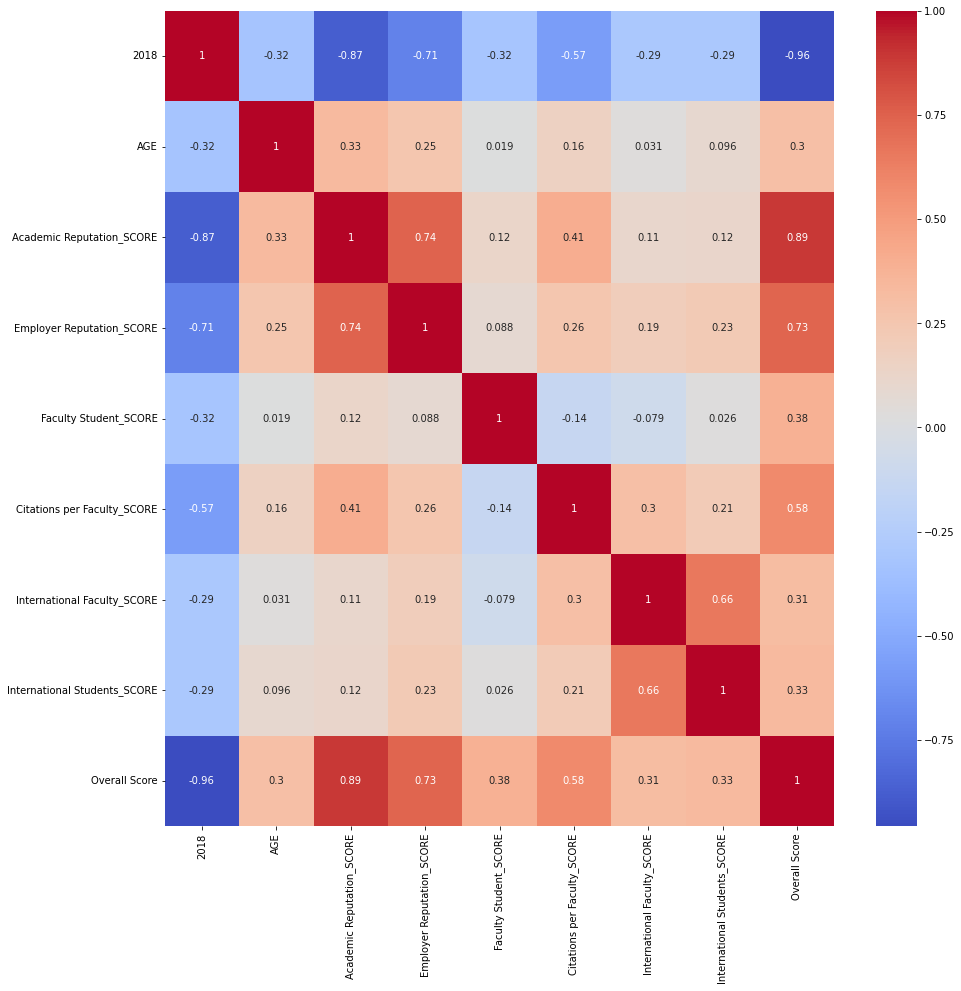

In [68]:
plt.figure(figsize=(15,15))
sns.heatmap(df2018.corr(), cmap='coolwarm', annot=True)
plt.show()

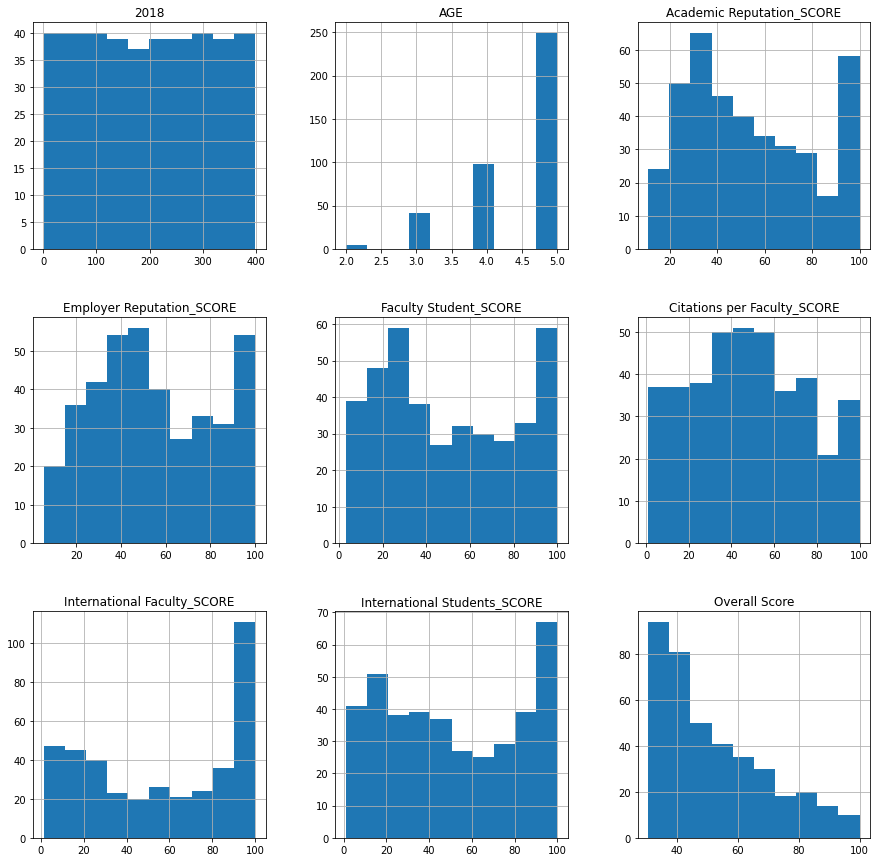

In [69]:
df2018.hist(figsize=(15,15))
plt.show()

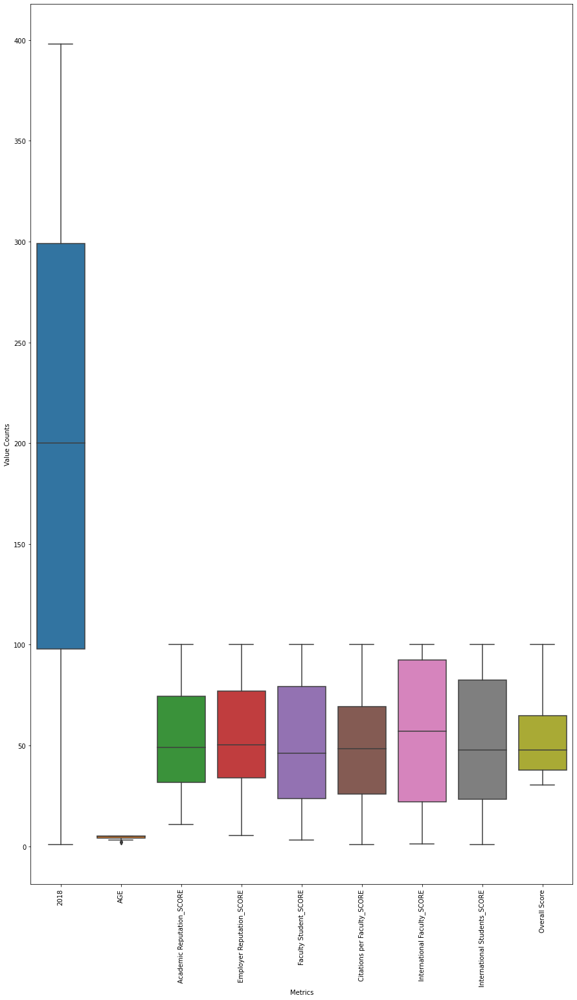

In [70]:
# Checking for outliers
fig,axis= plt.subplots(figsize=(15,25))
sns.boxplot(data=df2018)
plt.xticks(rotation=90)
plt.xlabel('Metrics')
plt.ylabel('Value Counts')
plt.show()

### Visualizations based on the six main metrics

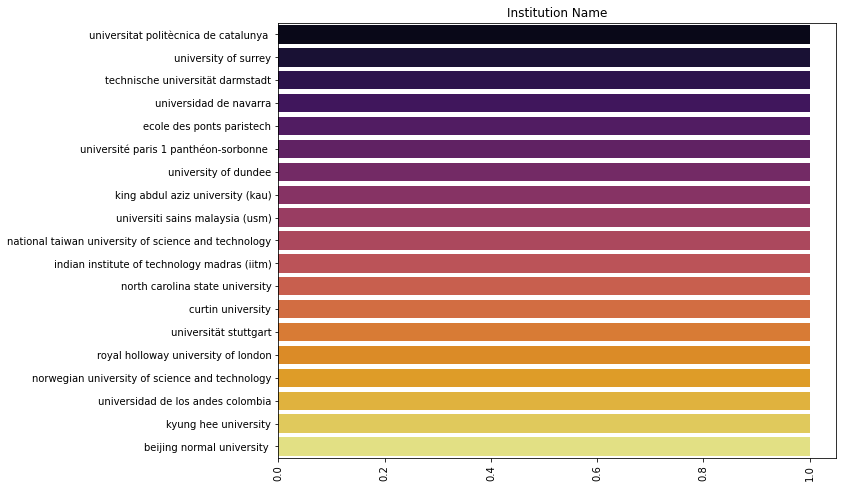

In [71]:
sns.barplot(df2018['Institution Name'].value_counts()[1:20].values,df2018['Institution Name'].value_counts()[1:20].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Institution Name')
plt.show()

Text(0.5, 1.0, 'Country')

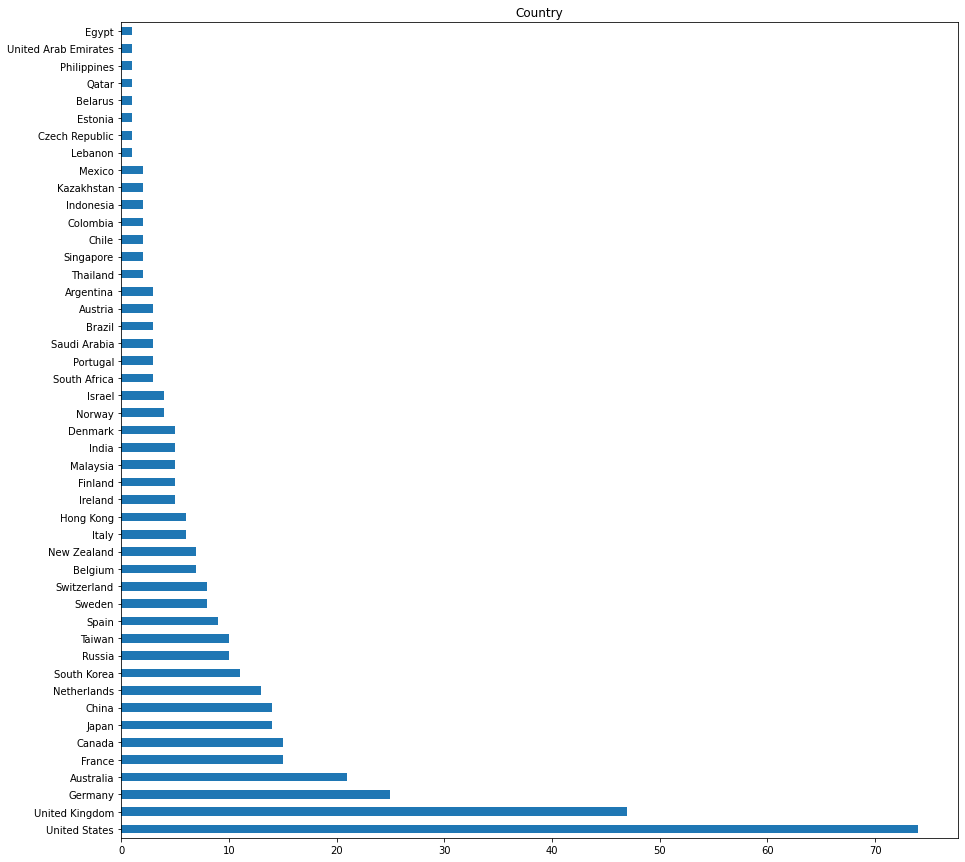

In [72]:
df2018['Country'].value_counts().head(1000).plot(kind='barh',figsize=[15,15])
plt.title('Country')

 In the year 2018, United States tends to be the continent with more number of universities.
It is followed by United Kingdom, then Germany, then Austrialia and least being Egypt(which happened to be the only represented African on this list)

In [73]:
print('Number of countries with ranked universities: ',df2018['Country'].nunique())

Number of countries with ranked universities:  47


 In the year 2018, out of the 195 countries in the world, only 47 countries have universities that are ranked.
Note:The number of countries in the world, comprises 193 countries that are member states of the United Nations and 2 countries that are non-member observer states: the Holy See and the State of Palestine

United States consists of more number of universities that have been ranked over the years followed by United Kingdom and Germany

### EDA FOR 2019 DATASET

In [74]:
df2019.head()

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.8,100.0,95.5,100.0
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,99.0,99.8,70.5,98.6
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,99.3,99.8,92.1,75.7,98.5
3,4,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,98.7,81.2,100.0,100.0,96.8,90.3,97.2
4,5,6,university of oxford,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,83.0,99.6,98.8,96.8


In [75]:
df2019.dtypes

2019                              int64
2018                             object
Institution Name                 object
Country                          object
Classification_SIZE              object
FOCUS                            object
RESEARCH INTENSITY               object
AGE                             float64
STATUS                           object
Academic Reputation_SCORE       float64
Employer Reputation_SCORE       float64
Faculty Student_SCORE           float64
Citations per Faculty_SCORE     float64
International Faculty_SCORE     float64
International Students_SCORE    float64
Overall Score                   float64
dtype: object

In [76]:
df2019.shape

(490, 16)

In [77]:
print(df2019["Classification_SIZE"].unique())
print(df2019["FOCUS"].unique())
print(df2019["RESEARCH INTENSITY"].unique())
print(df2019["STATUS"].unique())

['M' 'L' 'S' 'XL']
['CO' 'FC' 'FO' 'SP']
['VH' 'HI' 'MD' 'LO']
['B' 'A']


In [78]:
df2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 490 entries, 0 to 489
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   2019                          490 non-null    int64  
 1   2018                          490 non-null    object 
 2   Institution Name              490 non-null    object 
 3   Country                       490 non-null    object 
 4   Classification_SIZE           490 non-null    object 
 5   FOCUS                         490 non-null    object 
 6   RESEARCH INTENSITY            490 non-null    object 
 7   AGE                           490 non-null    float64
 8   STATUS                        490 non-null    object 
 9   Academic Reputation_SCORE     490 non-null    float64
 10  Employer Reputation_SCORE     490 non-null    float64
 11  Faculty Student_SCORE         490 non-null    float64
 12  Citations per Faculty_SCORE   490 non-null    float64
 13  Inter

In [79]:
df2019.isnull().sum()

2019                            0
2018                            0
Institution Name                0
Country                         0
Classification_SIZE             0
FOCUS                           0
RESEARCH INTENSITY              0
AGE                             0
STATUS                          0
Academic Reputation_SCORE       0
Employer Reputation_SCORE       0
Faculty Student_SCORE           0
Citations per Faculty_SCORE     0
International Faculty_SCORE     0
International Students_SCORE    0
Overall Score                   0
dtype: int64

In [80]:
df2019.describe()

,2019,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
count,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000,490.000000
mean,248.614286,4.418367,39.974898,40.228980,51.575918,44.437347,54.044490,47.555714,44.412041
std,144.127529,0.805445,26.717052,28.107388,30.178951,26.807194,35.070831,32.565898,18.647095
min,1.000000,1.000000,3.000000,2.500000,4.000000,1.000000,1.500000,1.000000,23.500000
25%,125.250000,4.000000,18.925000,16.725000,24.475000,22.750000,20.225000,17.525000,29.450000
50%,247.500000,5.000000,31.750000,32.550000,47.500000,44.000000,55.600000,42.150000,38.350000
75%,372.750000,5.000000,56.700000,58.400000,81.075000,62.375000,92.350000,79.250000,54.325000
max,500.000000,5.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [81]:
df2019.corr()

,2019,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
2019,1.000000,-0.288461,-0.843618,-0.738337,-0.329242,-0.553341,-0.387310,-0.366071,-0.931279
AGE,-0.288461,1.000000,0.332966,0.198127,0.046367,0.155303,-0.036445,0.028346,0.280123
Academic Reputation_SCORE,-0.843618,0.332966,1.000000,0.800386,0.155495,0.434470,0.207380,0.205002,0.908832
Employer Reputation_SCORE,-0.738337,0.198127,0.800386,1.000000,0.141180,0.300173,0.260293,0.284343,0.792828
Faculty Student_SCORE,-0.329242,0.046367,0.155495,0.141180,1.000000,-0.180350,-0.066467,0.013614,0.378178
Citations per Faculty_SCORE,-0.553341,0.155303,0.434470,0.300173,-0.180350,1.000000,0.315012,0.235440,0.575048
International Faculty_SCORE,-0.387310,-0.036445,0.207380,0.260293,-0.066467,0.315012,1.000000,0.666796,0.380348
International Students_SCORE,-0.366071,0.028346,0.205002,0.284343,0.013614,0.235440,0.666796,1.000000,0.383434
Overall Score,-0.931279,0.280123,0.908832,0.792828,0.378178,0.575048,0.380348,0.383434,1.000000


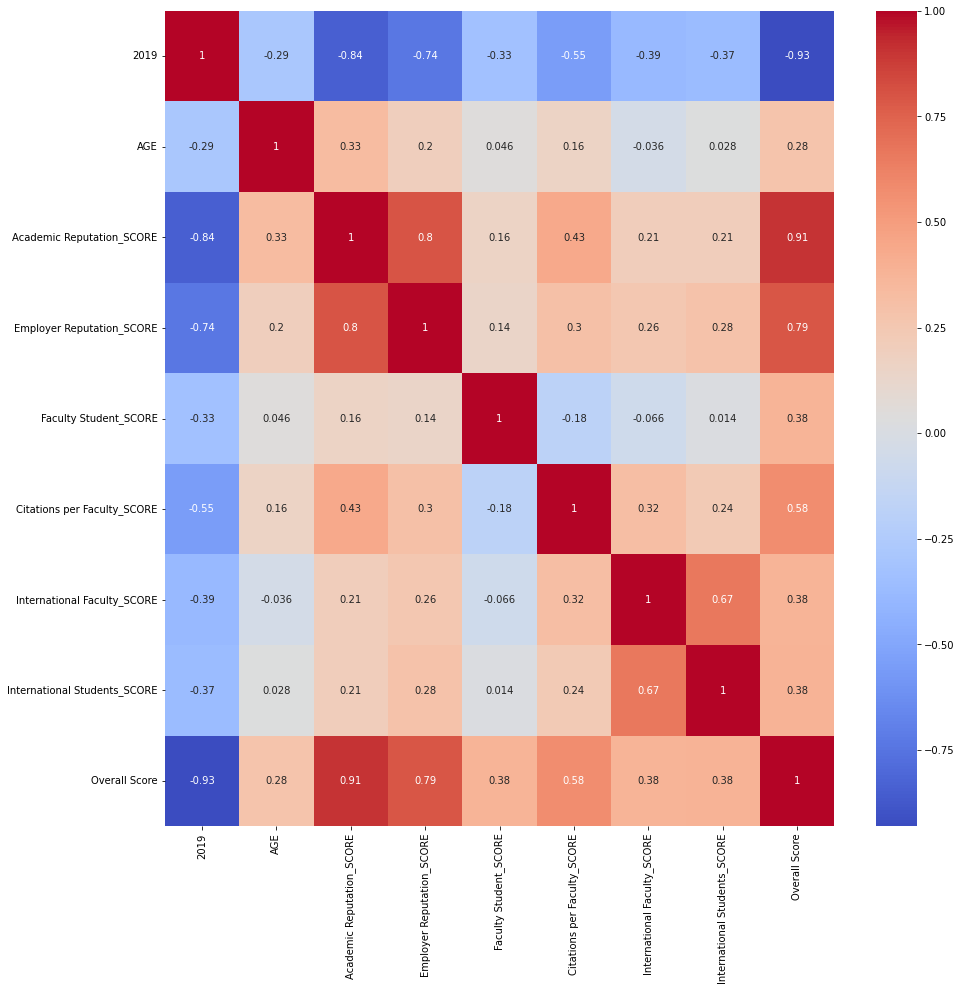

In [82]:
plt.figure(figsize=(15,15))
sns.heatmap(df2019.corr(), cmap='coolwarm', annot=True)
plt.show()

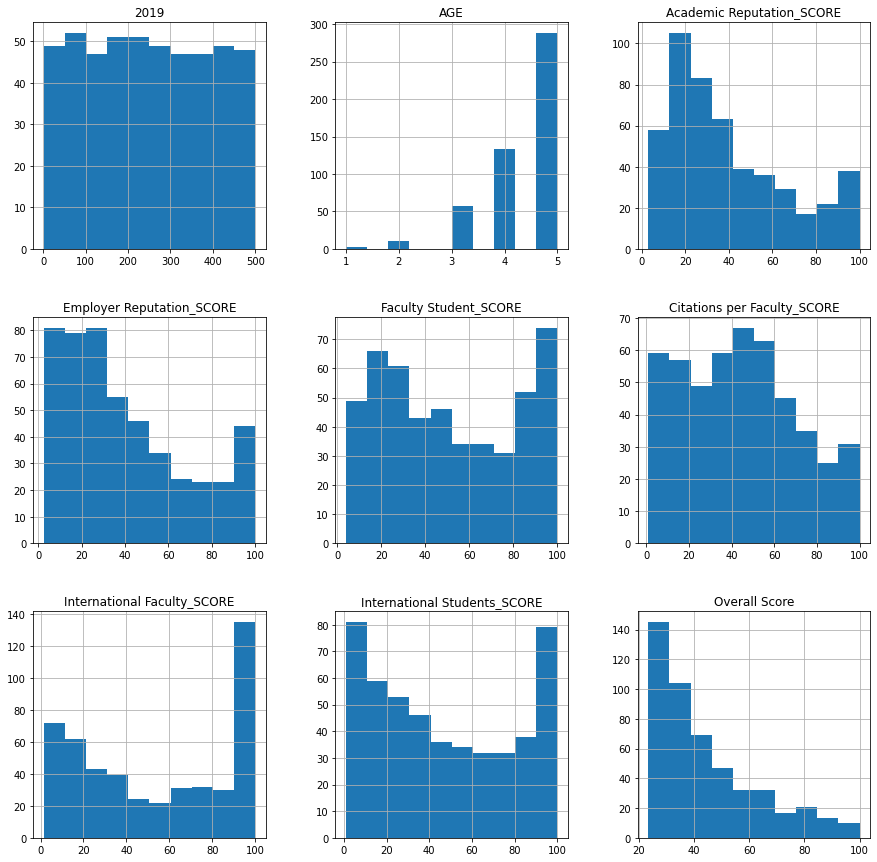

In [83]:
df2019.hist(figsize=(15,15))
plt.show()

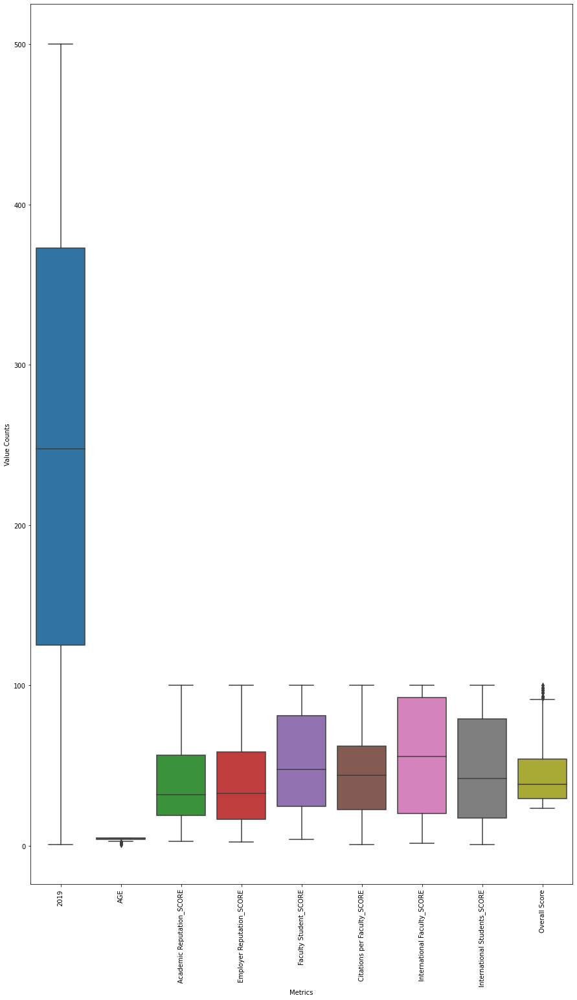

In [84]:
fig,axis= plt.subplots(figsize=(15,25))
sns.boxplot(data=df2019)
plt.xticks(rotation=90)
plt.xlabel('Metrics')
plt.ylabel('Value Counts')
plt.show()

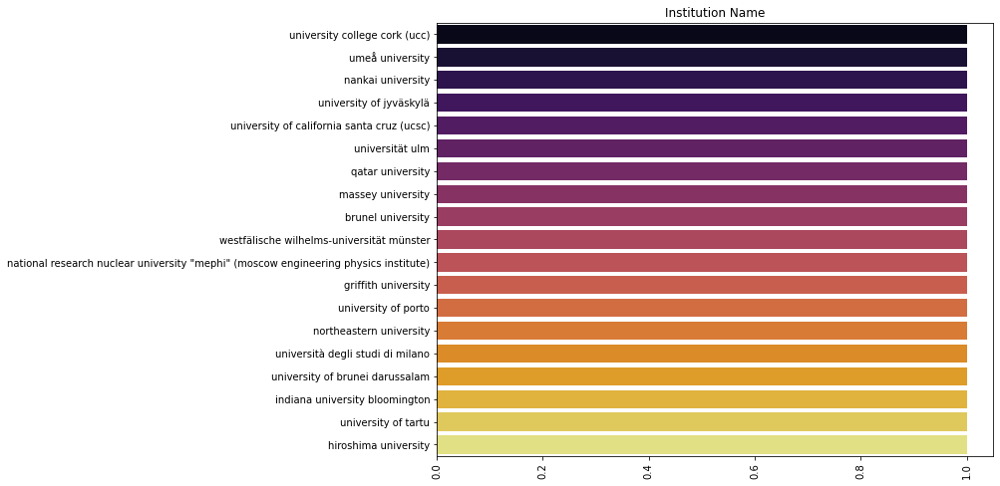

In [85]:
sns.barplot(df2019['Institution Name'].value_counts()[1:20].values,df2019['Institution Name'].value_counts()[1:20].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Institution Name')
plt.show()

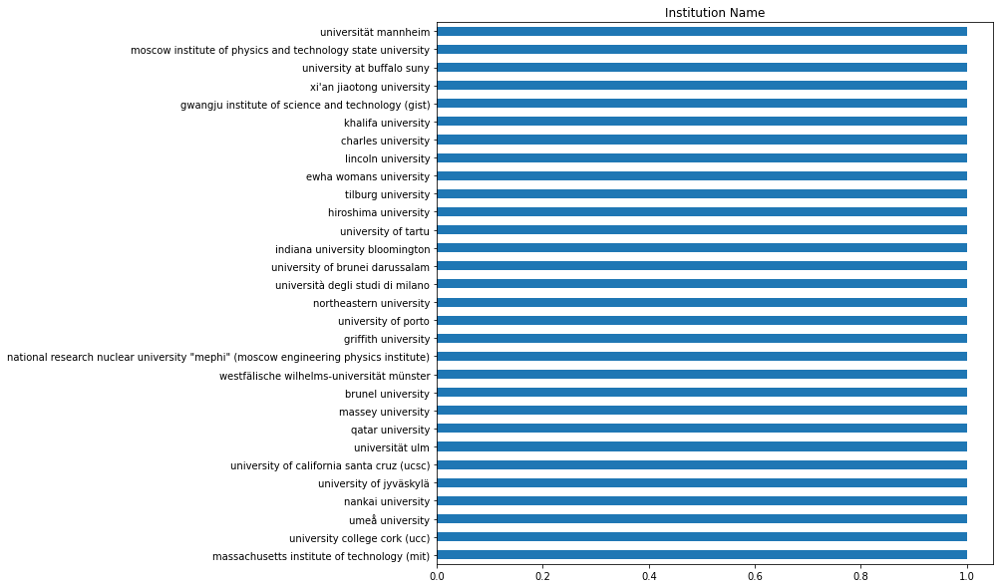

In [86]:
df2019['Institution Name'].value_counts().head(30).plot(kind='barh',figsize=[10,10])
plt.title('Institution Name')
plt.show()

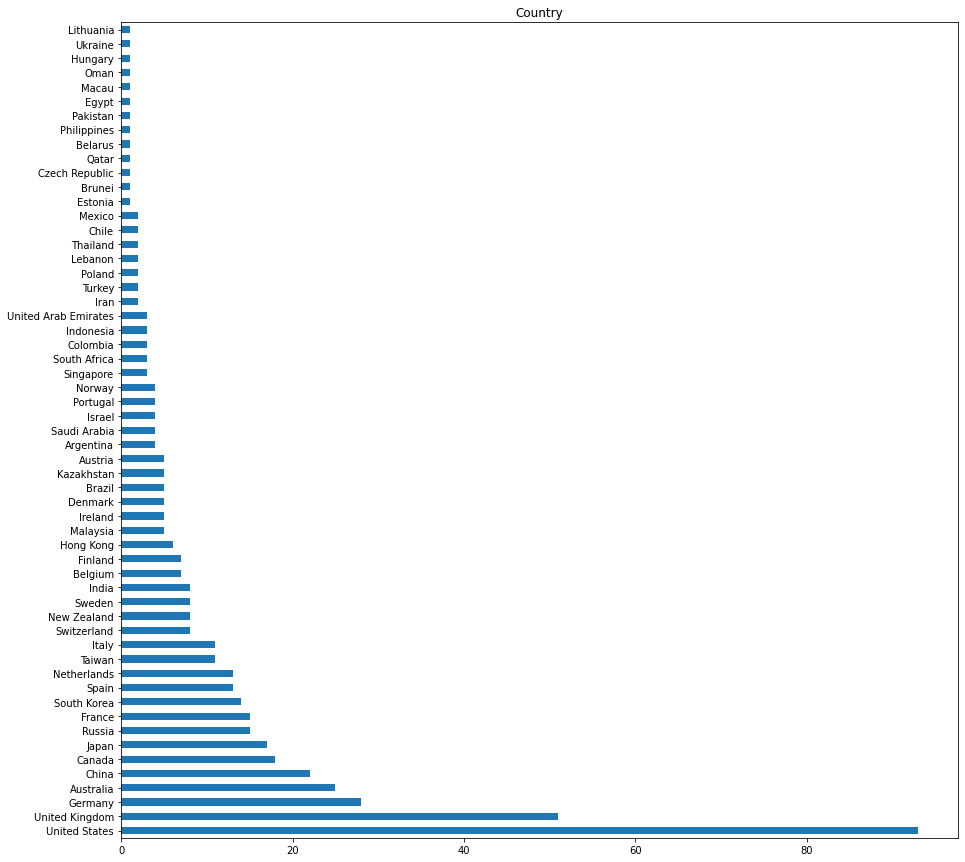

In [87]:
df2019['Country'].value_counts().head(1000).plot(kind='barh',figsize=[15,15])
plt.title('Country')
plt.show()

 In the year 2019, United States tends to be the continent with more number of universities.
It is followed by United Kingdom and least being Egypt.

In [88]:
print('Number of countries with ranked universities: ',df2019['Country'].nunique())

Number of countries with ranked universities:  57


In the year 2019, out of the 195 countries in the world, only 57 countries have universities that are ranked.
Note:The number of countries in the world, comprises 193 countries that are member states of the United Nations and 2 countries that are non-member observer states: the Holy See and the State of Palestine

### EDA FOR 2020 DATASET

In [89]:
df2020.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.8,100.0,94.1,100.0
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,98.6,99.8,67.7,98.4
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,98.7,99.6,86.3,62.2,97.4
3,4,5,university of oxford,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,84.7,99.7,98.5,97.2
4,5,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,97.8,81.2,100.0,100.0,99.4,87.3,96.9


In [90]:
df2020.dtypes

Rank in 2020                      int64
Rank in 2019                     object
Institution Name                 object
Country                          object
Classification_SIZE              object
FOCUS                            object
RESEARCH INTENSITY               object
AGE                             float64
STATUS                           object
Academic Reputation_SCORE       float64
Employer Reputation_SCORE       float64
Faculty Student_SCORE           float64
Citations per Faculty_SCORE     float64
International Faculty_SCORE     float64
International Students_SCORE    float64
Overall Score                   float64
dtype: object

In [91]:
df2020.shape

(485, 16)

In [92]:
print(df2020["Classification_SIZE"].unique())
print(df2020["FOCUS"].unique())
print(df2020["RESEARCH INTENSITY"].unique())
print(df2020["STATUS"].unique())

['M' 'L' 'S' 'XL']
['CO' 'FC' 'FO' 'SP']
['VH' 'HI' 'MD' 'LO']
['B' 'A' 'C']


In [93]:
df2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 485 entries, 0 to 484
Data columns (total 16 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Rank in 2020                  485 non-null    int64  
 1   Rank in 2019                  485 non-null    object 
 2   Institution Name              485 non-null    object 
 3   Country                       485 non-null    object 
 4   Classification_SIZE           485 non-null    object 
 5   FOCUS                         485 non-null    object 
 6   RESEARCH INTENSITY            485 non-null    object 
 7   AGE                           485 non-null    float64
 8   STATUS                        485 non-null    object 
 9   Academic Reputation_SCORE     485 non-null    float64
 10  Employer Reputation_SCORE     485 non-null    float64
 11  Faculty Student_SCORE         485 non-null    float64
 12  Citations per Faculty_SCORE   485 non-null    float64
 13  Inter

In [94]:
df2020.describe()

,Rank in 2020,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
count,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000,485.000000
mean,247.635052,4.387629,41.305773,40.708247,50.191959,43.934433,53.832784,46.307010,44.572577
std,144.345362,0.875665,26.834000,28.457222,30.307686,26.172425,35.597958,32.749819,18.633264
min,1.000000,1.000000,3.800000,1.900000,2.500000,1.000000,1.300000,1.000000,24.200000
25%,123.000000,4.000000,19.300000,16.800000,23.600000,22.300000,18.000000,17.000000,29.400000
50%,246.000000,5.000000,33.900000,33.900000,45.800000,44.300000,51.900000,39.700000,38.400000
75%,372.000000,5.000000,58.600000,59.600000,79.500000,62.000000,92.100000,75.400000,54.300000
max,498.000000,5.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000


In [95]:
df2020.isnull().sum()

Rank in 2020                    0
Rank in 2019                    0
Institution Name                0
Country                         0
Classification_SIZE             0
FOCUS                           0
RESEARCH INTENSITY              0
AGE                             0
STATUS                          0
Academic Reputation_SCORE       0
Employer Reputation_SCORE       0
Faculty Student_SCORE           0
Citations per Faculty_SCORE     0
International Faculty_SCORE     0
International Students_SCORE    0
Overall Score                   0
dtype: int64

In [96]:
df2020.corr()

,Rank in 2020,AGE,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score
Rank in 2020,1.000000,-0.299107,-0.853298,-0.741307,-0.324204,-0.528713,-0.393857,-0.375066,-0.932437
AGE,-0.299107,1.000000,0.289762,0.230669,0.102235,0.167269,-0.016210,0.023406,0.283956
Academic Reputation_SCORE,-0.853298,0.289762,1.000000,0.799148,0.159652,0.419841,0.210199,0.208908,0.909432
Employer Reputation_SCORE,-0.741307,0.230669,0.799148,1.000000,0.139503,0.306879,0.230772,0.269114,0.793012
Faculty Student_SCORE,-0.324204,0.102235,0.159652,0.139503,1.000000,-0.200431,-0.075757,0.020407,0.378022
Citations per Faculty_SCORE,-0.528713,0.167269,0.419841,0.306879,-0.200431,1.000000,0.348576,0.240387,0.560721
International Faculty_SCORE,-0.393857,-0.016210,0.210199,0.230772,-0.075757,0.348576,1.000000,0.684255,0.386537
International Students_SCORE,-0.375066,0.023406,0.208908,0.269114,0.020407,0.240387,0.684255,1.000000,0.390183
Overall Score,-0.932437,0.283956,0.909432,0.793012,0.378022,0.560721,0.386537,0.390183,1.000000


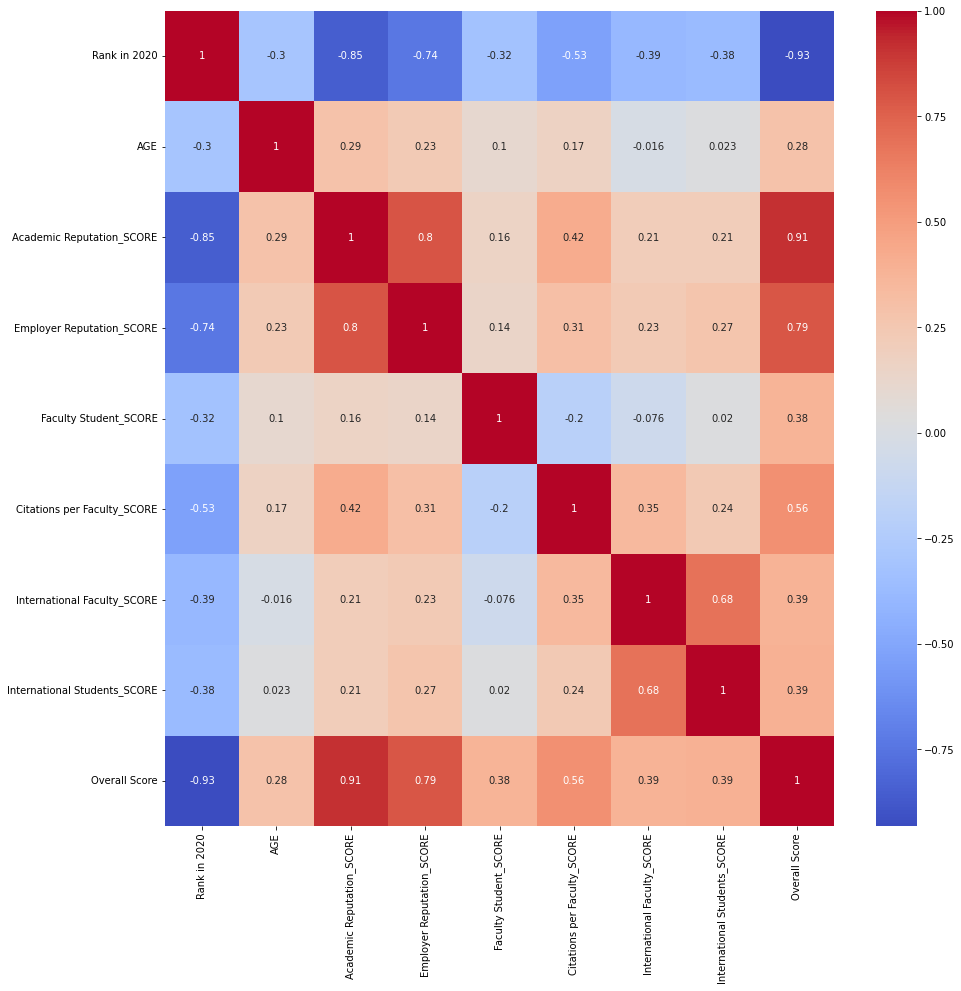

In [97]:
plt.figure(figsize=(15,15))
sns.heatmap(df2020.corr(), cmap='coolwarm', annot=True)
plt.show()

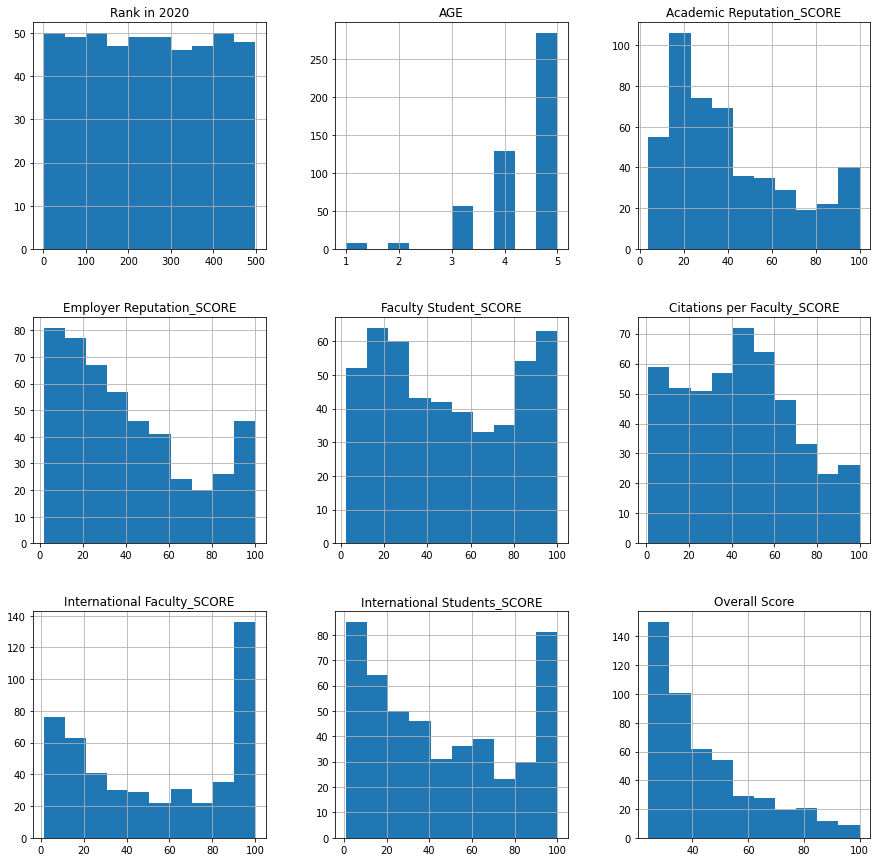

In [98]:
df2020.hist(figsize=(15,15))
plt.show()

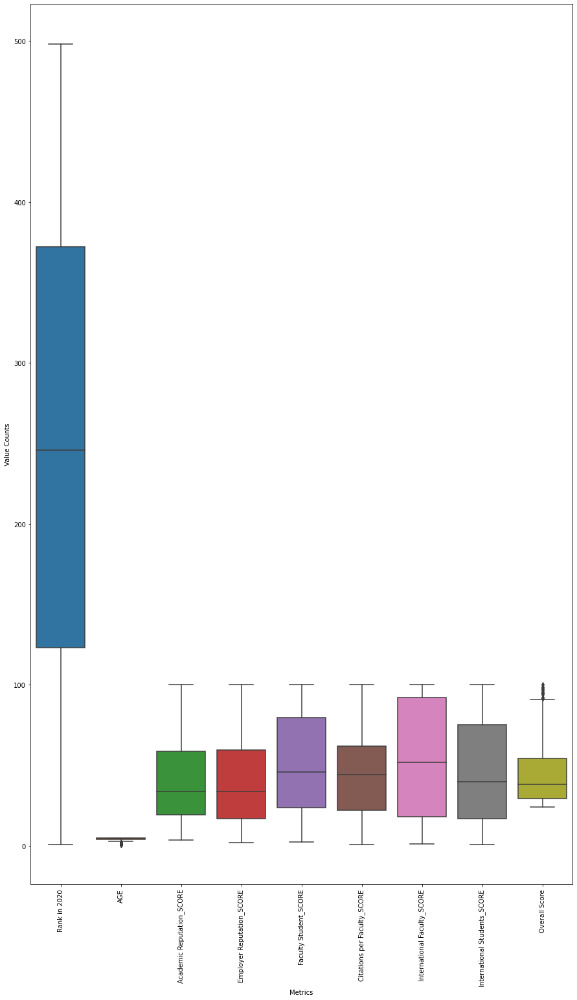

In [99]:
fig,axis= plt.subplots(figsize=(15,25))
sns.boxplot(data=df2020)
plt.xticks(rotation=90)
plt.xlabel('Metrics')
plt.ylabel('Value Counts')
plt.show()

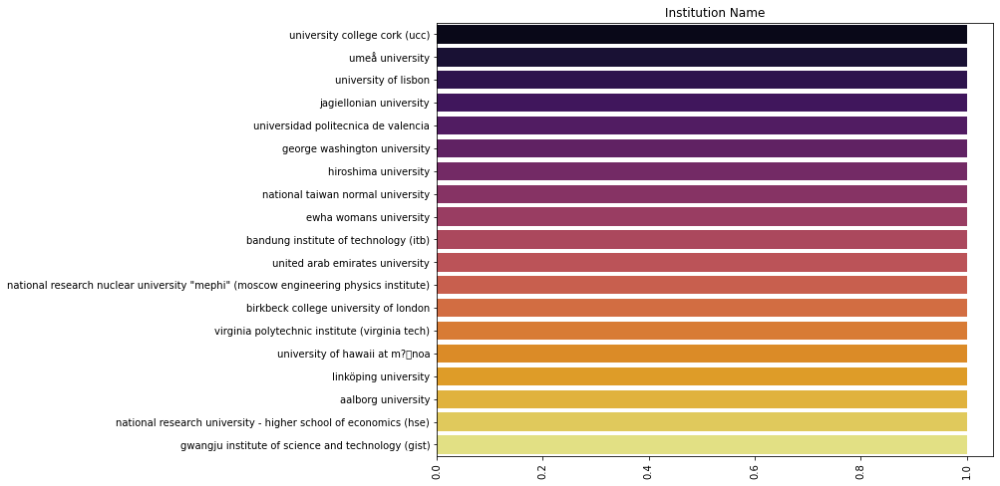

In [100]:
sns.barplot(df2020['Institution Name'].value_counts()[1:20].values,df2020['Institution Name'].value_counts()[1:20].index,palette=('inferno'))
plt.xticks(rotation=90)
fig=plt.gcf()
fig.set_size_inches(10,8)
plt.title('Institution Name')
plt.show()

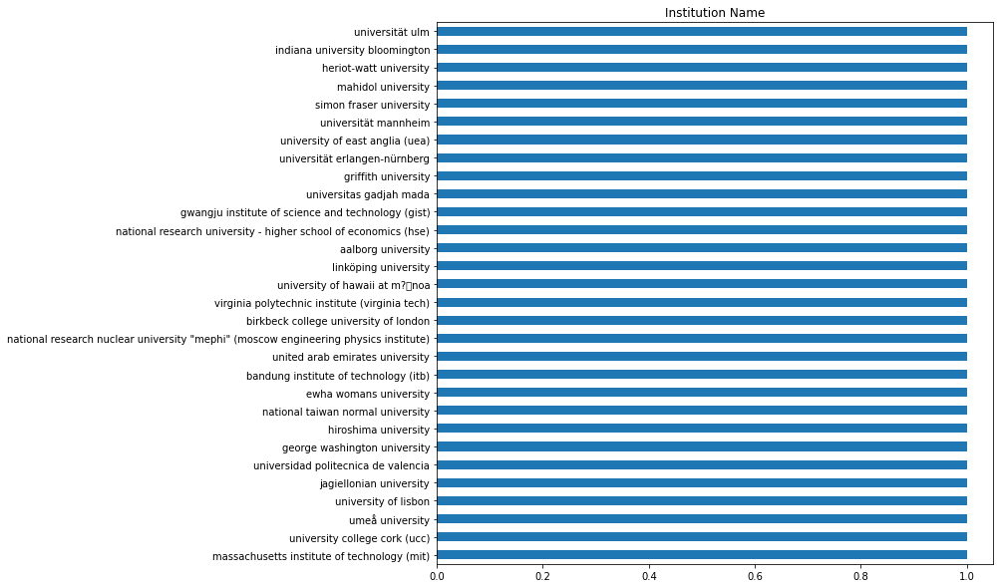

In [101]:
df2020['Institution Name'].value_counts().head(30).plot(kind='barh',figsize=[10,10])
plt.title('Institution Name')
plt.show()

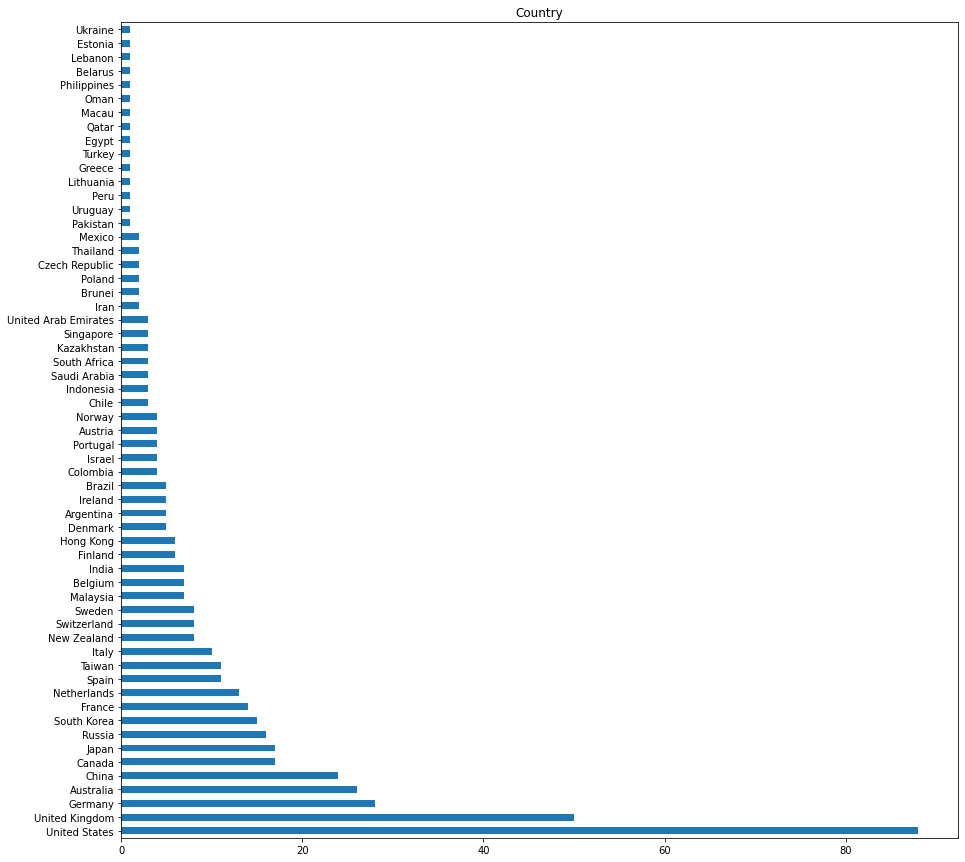

In [102]:
df2020['Country'].value_counts().head(1000).plot(kind='barh',figsize=[15,15])
plt.title('Country')
plt.show()

 In the year 2020, United States tends to be the continent with more number of universities.
It is followed by United Kingdom and least being Egypt.

In [103]:
print('Number of countries with ranked universities: ',df2020['Country'].nunique())

Number of countries with ranked universities:  59


In the year 2020, out of the 195 countries in the world, only 59 countries have universities that are ranked. Note:The number of countries in the world, comprises 193 countries that are member states of the United Nations and 2 countries that are non-member observer states: the Holy See and the State of Palestine

### 2018 UNIVARIATE

In [104]:
bill_pay = df2018.loc[:,['2018', '2017', 'Institution Name', 'Country', 'Classification_SIZE',
       'FOCUS', 'RESEARCH INTENSITY', 'AGE', 'STATUS',
       'Academic Reputation_SCORE', 'Employer Reputation_SCORE',
       'Faculty Student_SCORE', 'Citations per Faculty_SCORE',
       'International Faculty_SCORE', 'International Students_SCORE',
       'Overall Score']]
for i in bill_pay:
    print('The maximum value for', i,' is:',df2018[i].max(),'while the minimum value is:',df2018[i].min())

The maximum value for 2018  is: 398 while the minimum value is: 1
The maximum value for 2017  is: 98 while the minimum value is: 1
The maximum value for Institution Name  is: zhejiang university while the minimum value is: aalborg university
The maximum value for Country  is: United States while the minimum value is: Argentina
The maximum value for Classification_SIZE  is: XL while the minimum value is: L
The maximum value for FOCUS  is: SP while the minimum value is: CO
The maximum value for RESEARCH INTENSITY  is: VH while the minimum value is: HI
The maximum value for AGE  is: 5.0 while the minimum value is: 2.0
The maximum value for STATUS  is: B while the minimum value is: A
The maximum value for Academic Reputation_SCORE  is: 100.0 while the minimum value is: 10.9
The maximum value for Employer Reputation_SCORE  is: 100.0 while the minimum value is: 5.4
The maximum value for Faculty Student_SCORE  is: 100.0 while the minimum value is: 3.2
The maximum value for Citations per Facul

In [105]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['Academic Reputation SCORE'] = pd.cut(df2018['Academic Reputation_SCORE'], bin_edges, labels=bin_names)

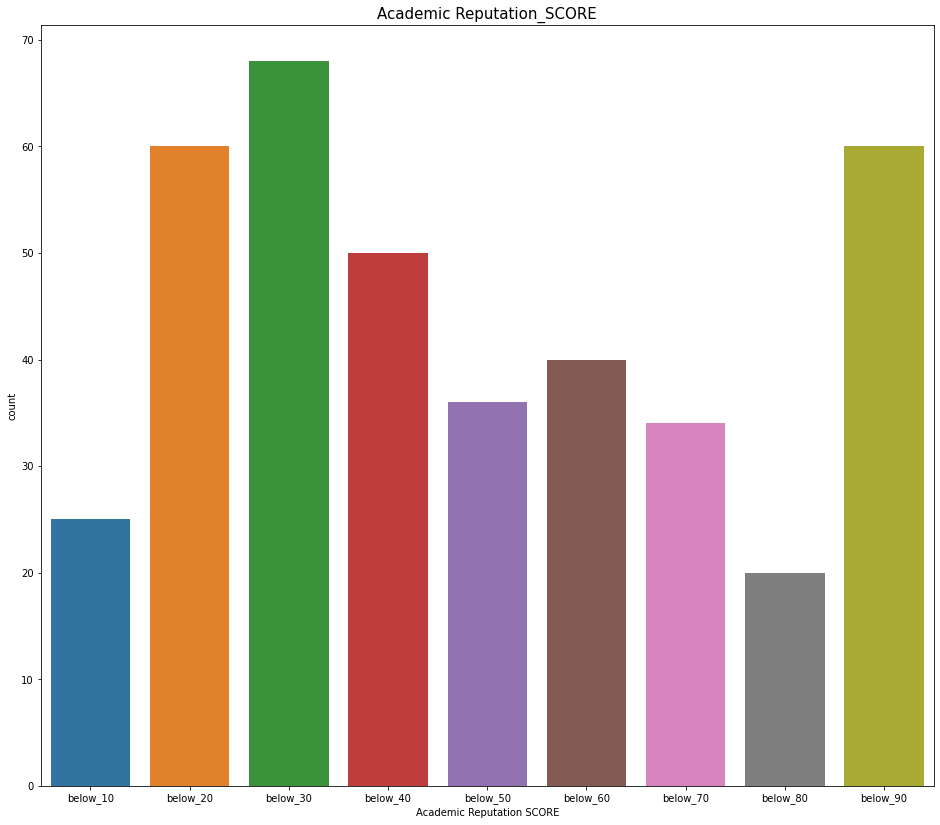

In [106]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Academic Reputation SCORE'])
plt.title('Academic Reputation_SCORE', fontsize = 15)
plt.show()

In [107]:
pd.DataFrame(df2018['Academic Reputation SCORE'].value_counts())

,Academic Reputation SCORE
below_30,68
below_20,60
below_90,60
below_40,50
below_60,40
below_50,36
below_70,34
below_10,25
below_80,20


Just 68 universities had academic reputation score of below 30

In [108]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['Employer Reputation SCORE'] = pd.cut(df2018['Employer Reputation_SCORE'], bin_edges, labels=bin_names)

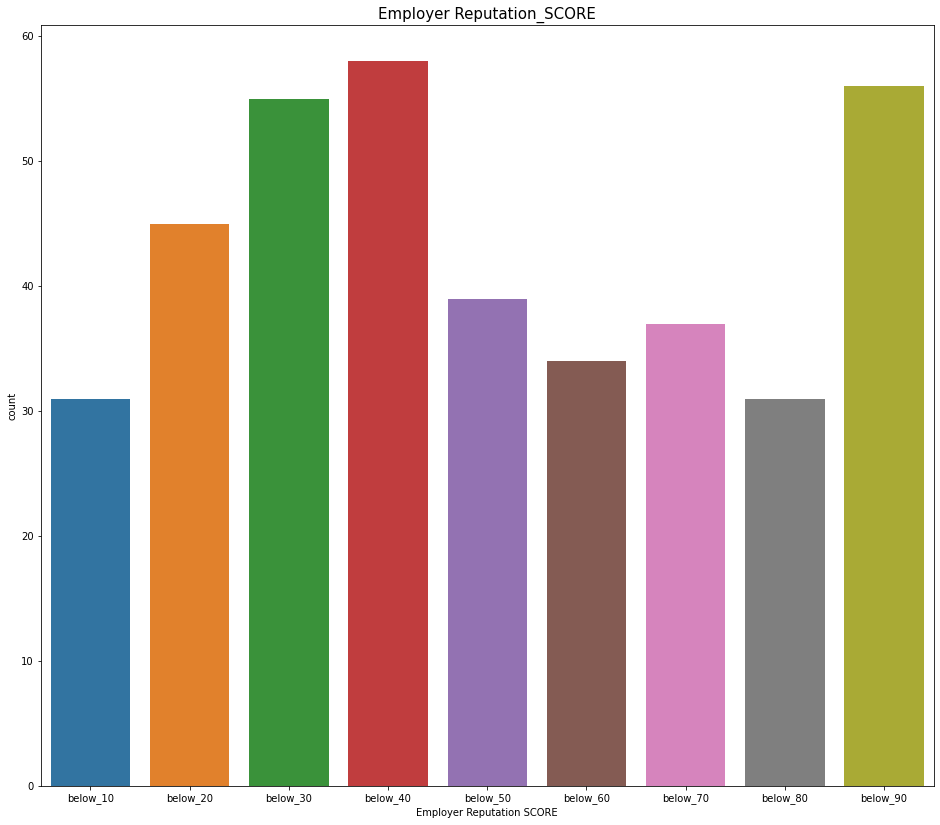

In [109]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Employer Reputation SCORE'])
plt.title('Employer Reputation_SCORE', fontsize = 15)
plt.show()

In [110]:
pd.DataFrame(df2018['Employer Reputation SCORE'].value_counts())

,Employer Reputation SCORE
below_40,58
below_90,56
below_30,55
below_20,45
below_50,39
below_70,37
below_60,34
below_10,31
below_80,31


In [111]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['Faculty Student SCORE'] = pd.cut(df2018['Faculty Student_SCORE'], bin_edges, labels=bin_names)

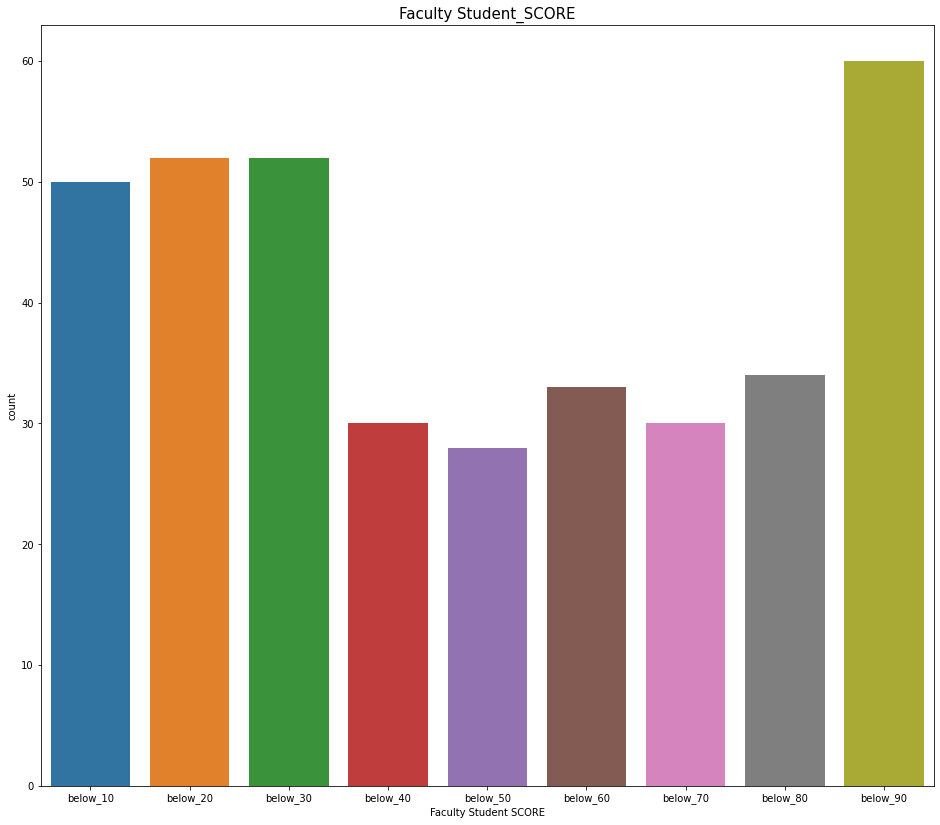

In [112]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Faculty Student SCORE'])
plt.title('Faculty Student_SCORE', fontsize = 15)
plt.show()

In [113]:
pd.DataFrame(df2018['Faculty Student SCORE'].value_counts())

,Faculty Student SCORE
below_90,60
below_20,52
below_30,52
below_10,50
below_80,34
below_60,33
below_40,30
below_70,30
below_50,28


In [114]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['Citations per Faculty SCORE'] = pd.cut(df2018['Citations per Faculty_SCORE'], bin_edges, labels=bin_names)

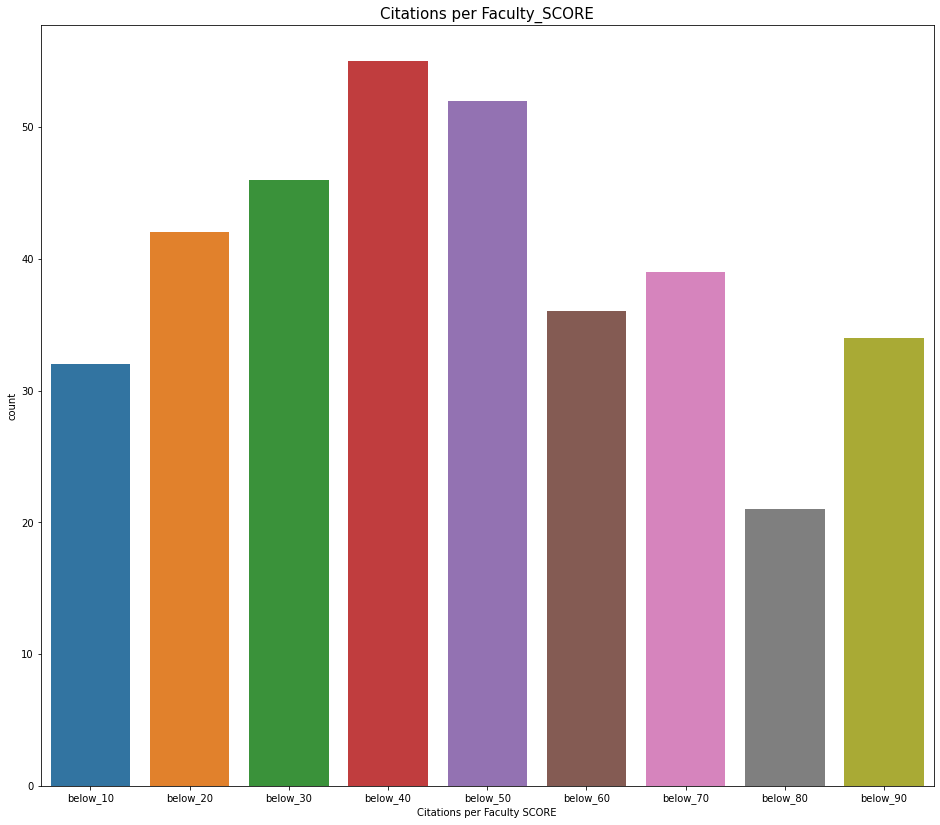

In [115]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Citations per Faculty SCORE'])
plt.title('Citations per Faculty_SCORE', fontsize = 15)
plt.show()

In [116]:
pd.DataFrame(df2018['Citations per Faculty SCORE'].value_counts())

,Citations per Faculty SCORE
below_40,55
below_50,52
below_30,46
below_20,42
below_70,39
below_60,36
below_90,34
below_10,32
below_80,21


In [117]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['International Faculty SCORE'] = pd.cut(df2018['International Faculty_SCORE'], bin_edges, labels=bin_names)

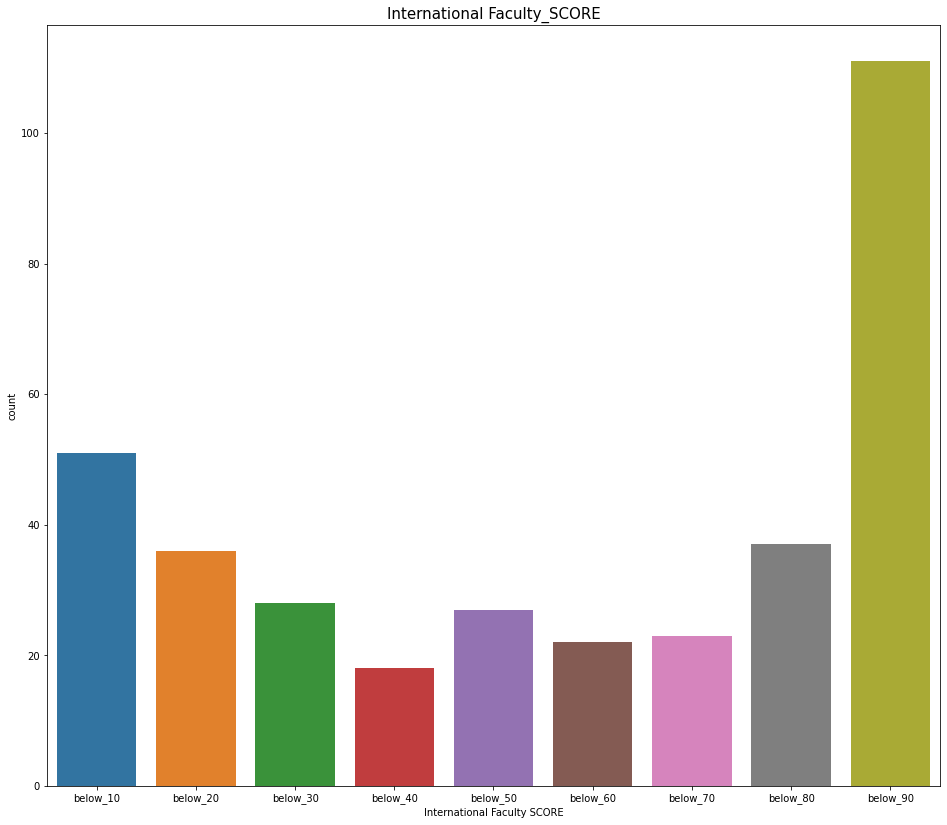

In [118]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['International Faculty SCORE'])
plt.title('International Faculty_SCORE', fontsize = 15)
plt.show()

In [119]:
pd.DataFrame(df2018['International Faculty SCORE'].value_counts())

,International Faculty SCORE
below_90,111
below_10,51
below_80,37
below_20,36
below_30,28
below_50,27
below_70,23
below_60,22
below_40,18


In [120]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2018['International Students SCORE'] = pd.cut(df2018['International Students_SCORE'], bin_edges, labels=bin_names)

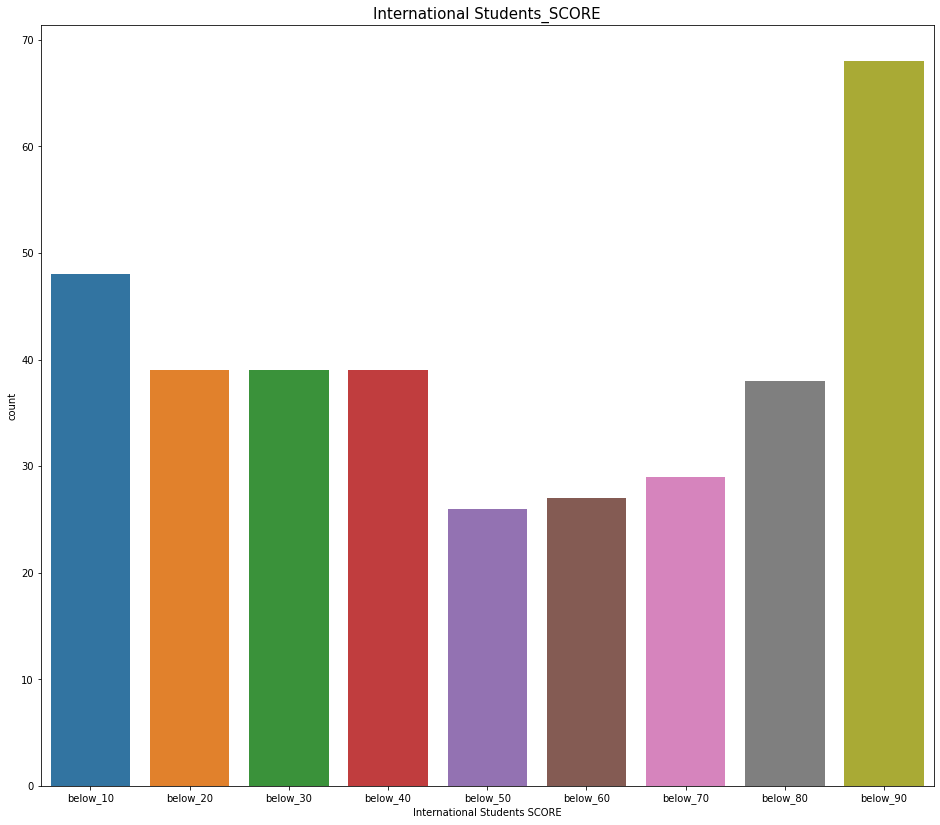

In [121]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['International Students SCORE'])
plt.title('International Students_SCORE', fontsize = 15)
plt.show()

In [122]:
pd.DataFrame(df2018['International Students SCORE'].value_counts())

,International Students SCORE
below_90,68
below_10,48
below_20,39
below_30,39
below_40,39
below_80,38
below_70,29
below_60,27
below_50,26


In [123]:
bin_edges = [30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
bin_names = ['below_30','below_35','below_40','below_45','below_50','below_55','below_60','below_65','below_70','below_75','below_80','below_85','below_90','below_95']
df2018['Overall_Score'] = pd.cut(df2018['Overall Score'], bin_edges, labels=bin_names)

In [124]:
#pd.DataFrame(df2018['Score_class'].value_counts(normalize=True)*100)

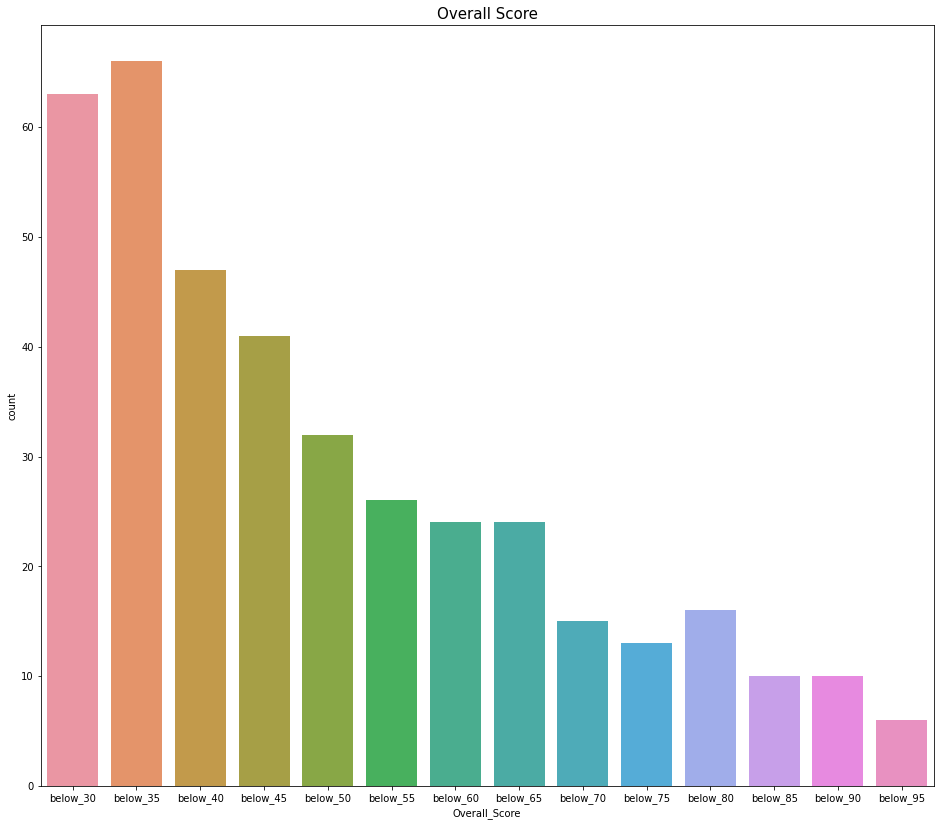

In [125]:
plt.figure(figsize=(16,14))
sns.countplot(df2018['Overall_Score'])
plt.title('Overall Score', fontsize = 15)
plt.show()

In [126]:
pd.DataFrame(df2018['Overall_Score'].value_counts())

,Overall_Score
below_35,66
below_30,63
below_40,47
below_45,41
below_50,32
below_55,26
below_60,24
below_65,24
below_80,16
below_70,15


In [127]:
grouped_country = pd.DataFrame(df2018.groupby('Country')['International Faculty_SCORE', 'International Students_SCORE'].mean()).reset_index()

In [128]:
grouped_country.sort_values(['International Faculty_SCORE', 'International Students_SCORE'],
                            ascending = False).head(10).style.bar(subset = ['International Faculty_SCORE',
                                                                            'International Students_SCORE'], color = 'green').set_properties(**{"border" : "2px solid white"})

,Country,International Faculty_SCORE,International Students_SCORE
33,Qatar,100.000000,99.900000
36,Singapore,100.000000,87.150000
44,United Arab Emirates,100.000000,76.300000
17,Hong Kong,99.966667,90.216667
41,Switzerland,99.950000,82.262500
25,Lebanon,99.200000,68.000000
35,Saudi Arabia,99.066667,43.300000
1,Australia,97.438095,82.695238
29,New Zealand,96.285714,76.885714
45,United Kingdom,91.772340,92.063830


The above Chart shows the top 10 countries with the highest mean International Faculty and International Student Scores. This provides an idea of how accessible these universites could be for international candidates. There are other factors which contribute to this, which are not covered in this analysis. For example, a University may be open to all, but barriers such as tuition, language, scholarship opportunities etc might be of hindrance for some candidates.

### 2019 UNIVARIATE

In [129]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['Academic Reputation SCORE'] = pd.cut(df2019['Academic Reputation_SCORE'], bin_edges, labels=bin_names)

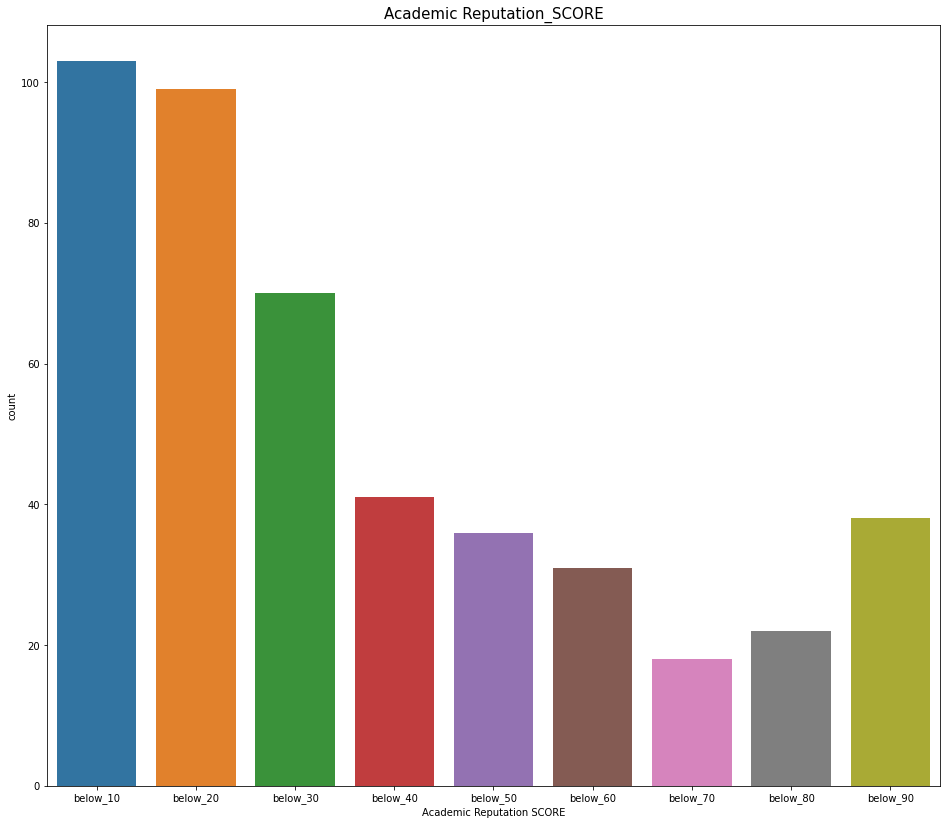

In [130]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Academic Reputation SCORE'])
plt.title('Academic Reputation_SCORE', fontsize = 15)
plt.show()

In [131]:
pd.DataFrame(df2019['Academic Reputation SCORE'].value_counts())

,Academic Reputation SCORE
below_10,103
below_20,99
below_30,70
below_40,41
below_90,38
below_50,36
below_60,31
below_80,22
below_70,18


In [132]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['Employer Reputation SCORE'] = pd.cut(df2019['Employer Reputation_SCORE'], bin_edges, labels=bin_names)

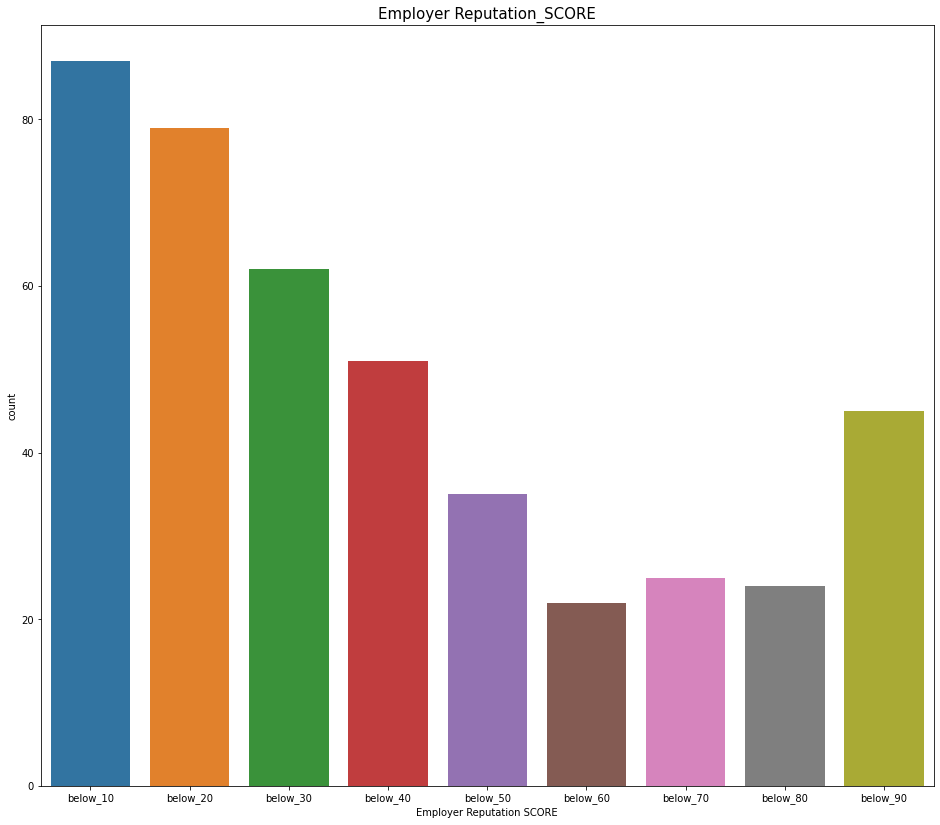

In [133]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Employer Reputation SCORE'])
plt.title('Employer Reputation_SCORE', fontsize = 15)
plt.show()

In [134]:
pd.DataFrame(df2019['Employer Reputation SCORE'].value_counts())

,Employer Reputation SCORE
below_10,87
below_20,79
below_30,62
below_40,51
below_90,45
below_50,35
below_70,25
below_80,24
below_60,22


In [135]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['Faculty Student SCORE'] = pd.cut(df2019['Faculty Student_SCORE'], bin_edges, labels=bin_names)

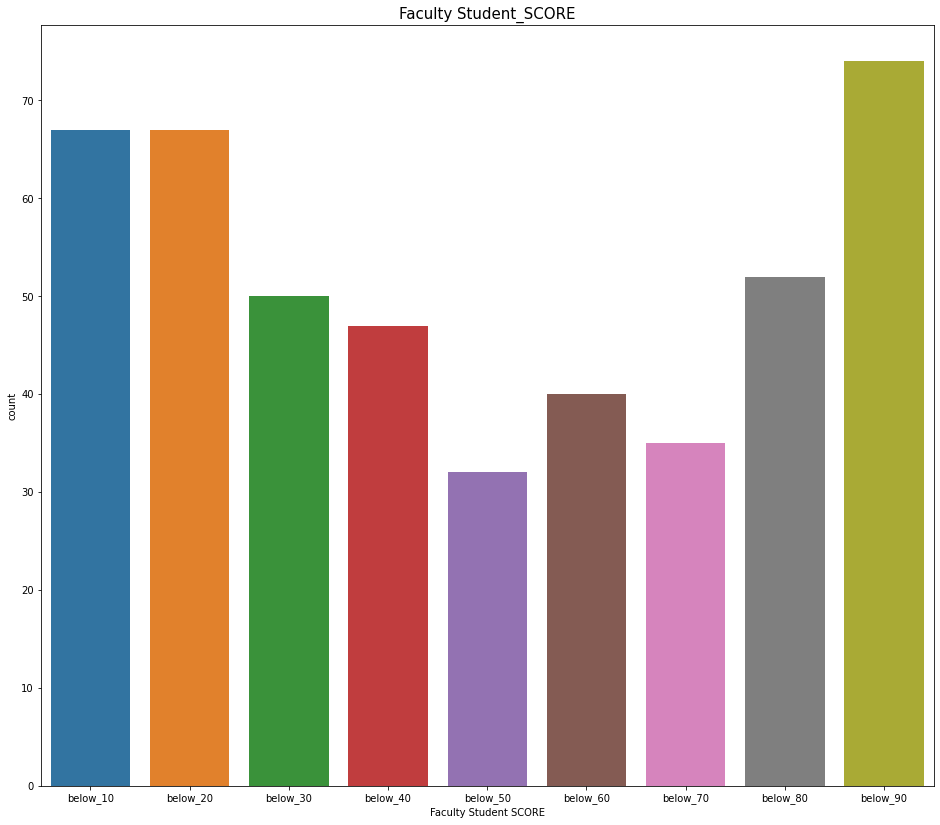

In [136]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Faculty Student SCORE'])
plt.title('Faculty Student_SCORE', fontsize = 15)
plt.show()

In [137]:
pd.DataFrame(df2019['Faculty Student SCORE'].value_counts())

,Faculty Student SCORE
below_90,74
below_10,67
below_20,67
below_80,52
below_30,50
below_40,47
below_60,40
below_70,35
below_50,32


In [138]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['Citations per Faculty SCORE'] = pd.cut(df2019['Citations per Faculty_SCORE'], bin_edges, labels=bin_names)

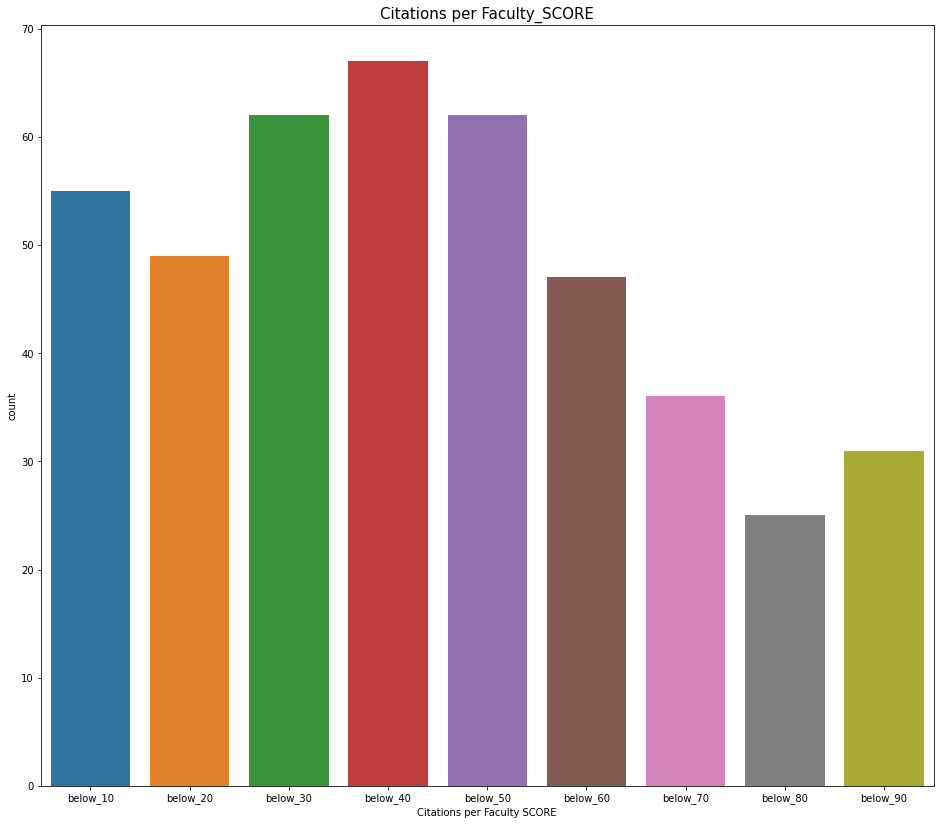

In [139]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Citations per Faculty SCORE'])
plt.title('Citations per Faculty_SCORE', fontsize = 15)
plt.show()

In [140]:
pd.DataFrame(df2019['Citations per Faculty SCORE'].value_counts())

,Citations per Faculty SCORE
below_40,67
below_30,62
below_50,62
below_10,55
below_20,49
below_60,47
below_70,36
below_90,31
below_80,25


In [141]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['International Faculty SCORE'] = pd.cut(df2019['International Faculty_SCORE'], bin_edges, labels=bin_names)

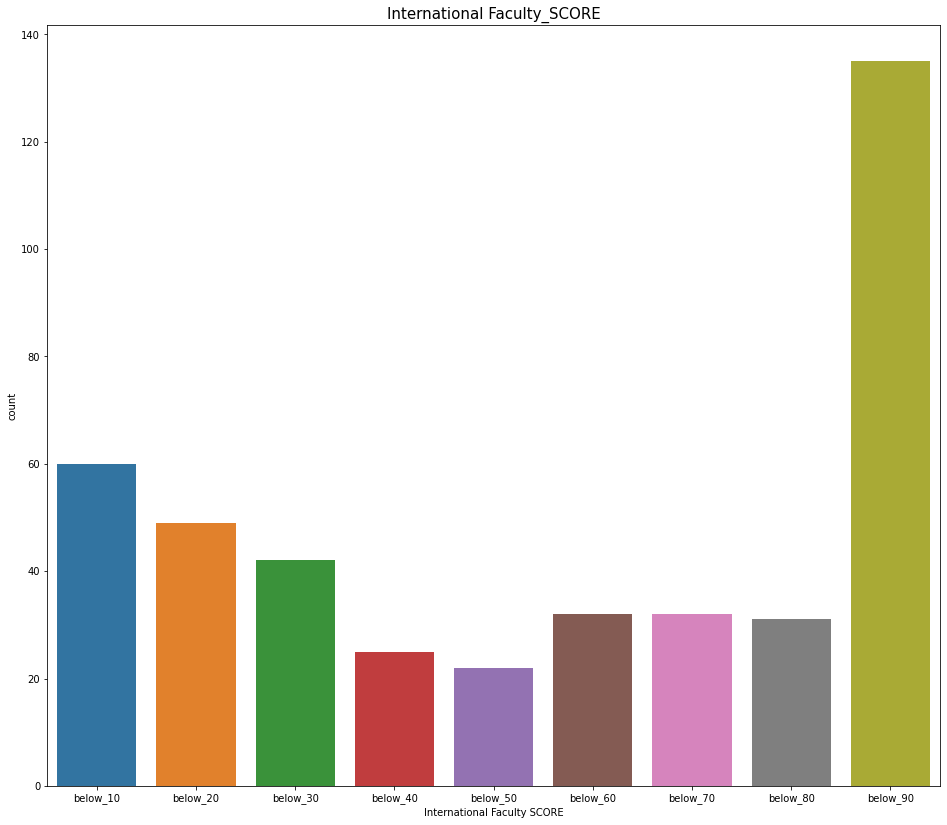

In [142]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['International Faculty SCORE'])
plt.title('International Faculty_SCORE', fontsize = 15)
plt.show()

In [143]:
pd.DataFrame(df2019['International Faculty SCORE'].value_counts())

,International Faculty SCORE
below_90,135
below_10,60
below_20,49
below_30,42
below_60,32
below_70,32
below_80,31
below_40,25
below_50,22


In [144]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2019['International Students SCORE'] = pd.cut(df2019['International Students_SCORE'], bin_edges, labels=bin_names)

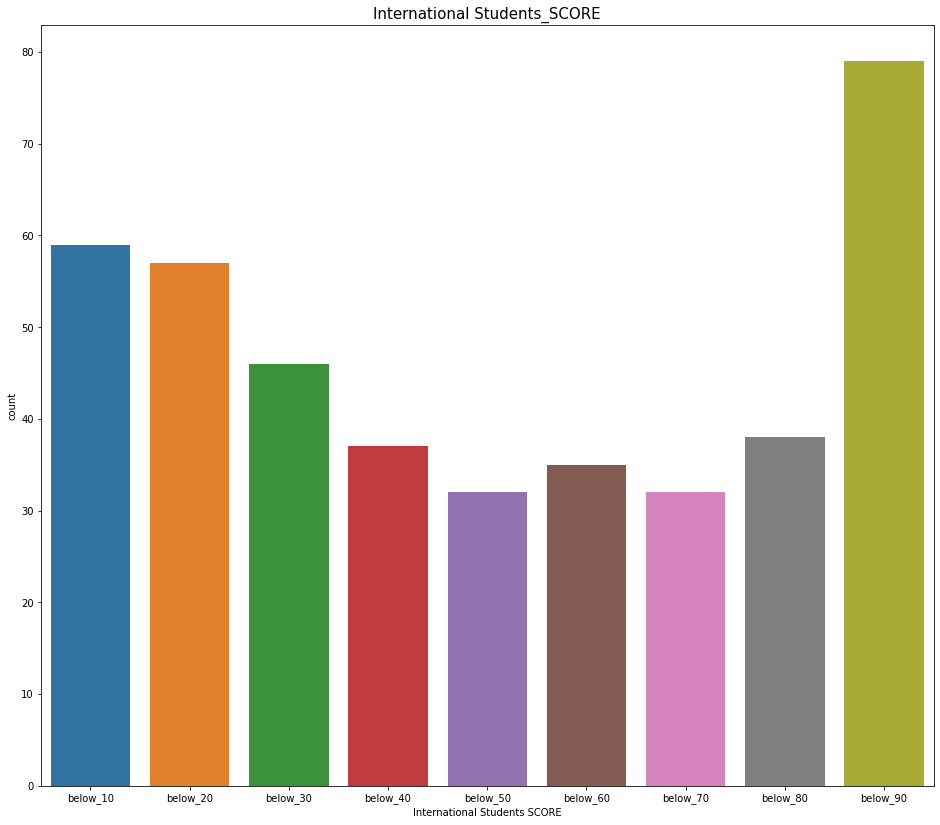

In [145]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['International Students SCORE'])
plt.title('International Students_SCORE', fontsize = 15)
plt.show()

In [146]:
pd.DataFrame(df2019['International Students SCORE'].value_counts())

,International Students SCORE
below_90,79
below_10,59
below_20,57
below_30,46
below_80,38
below_40,37
below_60,35
below_50,32
below_70,32


In [147]:
bin_edges = [30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
bin_names = ['below_30','below_35','below_40','below_45','below_50','below_55','below_60','below_65','below_70','below_75','below_80','below_85','below_90','below_95']
df2019['Overall_Score'] = pd.cut(df2019['Overall Score'], bin_edges, labels=bin_names)

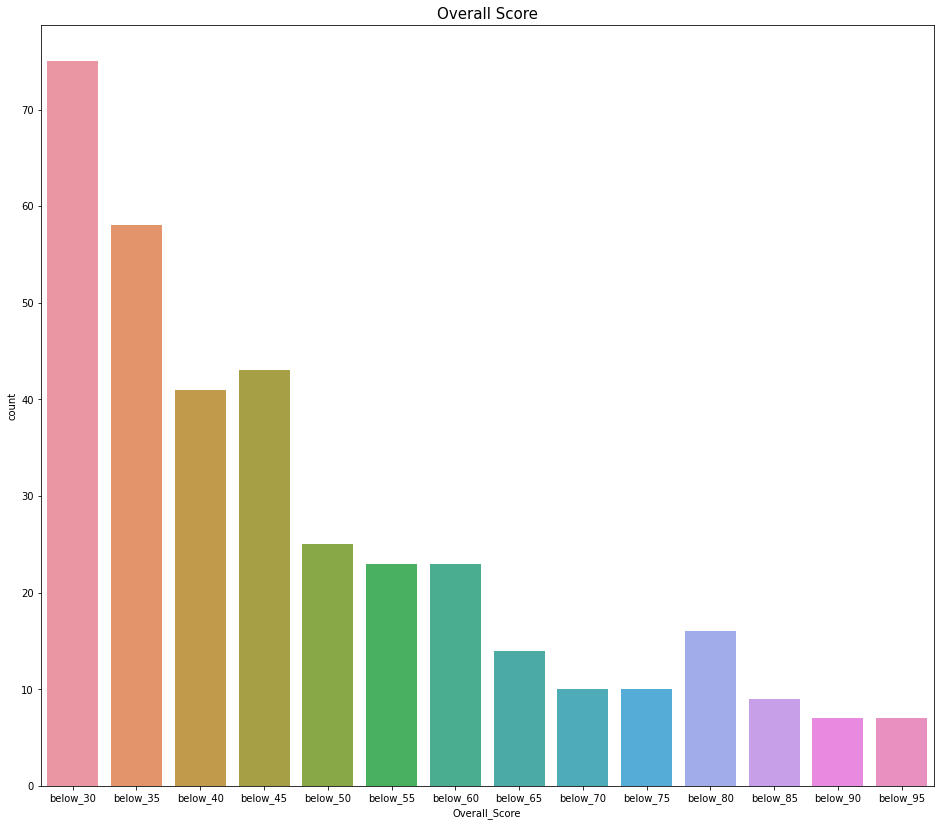

In [148]:
plt.figure(figsize=(16,14))
sns.countplot(df2019['Overall_Score'])
plt.title('Overall Score', fontsize = 15)
plt.show()

In [149]:
pd.DataFrame(df2019['Overall_Score'].value_counts())

,Overall_Score
below_30,75
below_35,58
below_45,43
below_40,41
below_50,25
below_55,23
below_60,23
below_80,16
below_65,14
below_70,10


In [150]:
grouped_country_2= pd.DataFrame(df2019.groupby('Country')['International Faculty_SCORE', 'International Students_SCORE'].mean()).reset_index()

In [151]:
grouped_country_2.sort_values(['International Faculty_SCORE', 'International Students_SCORE'],
                            ascending = False).head(10).style.bar(subset = ['International Faculty_SCORE','International Students_SCORE'], color = 'green').set_properties(**{"border" : "2px solid white"})

,Country,International Faculty_SCORE,International Students_SCORE
41,Qatar,100.000000,99.500000
30,Macau,100.000000,96.700000
44,Singapore,100.000000,77.866667
54,United Arab Emirates,100.000000,73.266667
6,Brunei,100.000000,65.700000
36,Oman,100.000000,4.800000
49,Switzerland,99.937500,82.087500
18,Hong Kong,99.933333,90.683333
43,Saudi Arabia,98.825000,33.875000
1,Australia,97.524000,84.632000


The above Chart shows the tope 10 countries with the highest mean International Faculty and International Student Scores. This provides an idea of how accessible these universites could be for international candidates. There are other factors which contribute to this, which are not covered in this analysis. For example, a University may be open to all but barriers such as tuition, language, scholarship opportunities etc might be of hindrance for some candidates.¶

### 2020 UNIVARIATE

In [152]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['Academic Reputation SCORE'] = pd.cut(df2020['Academic Reputation_SCORE'], bin_edges, labels=bin_names)

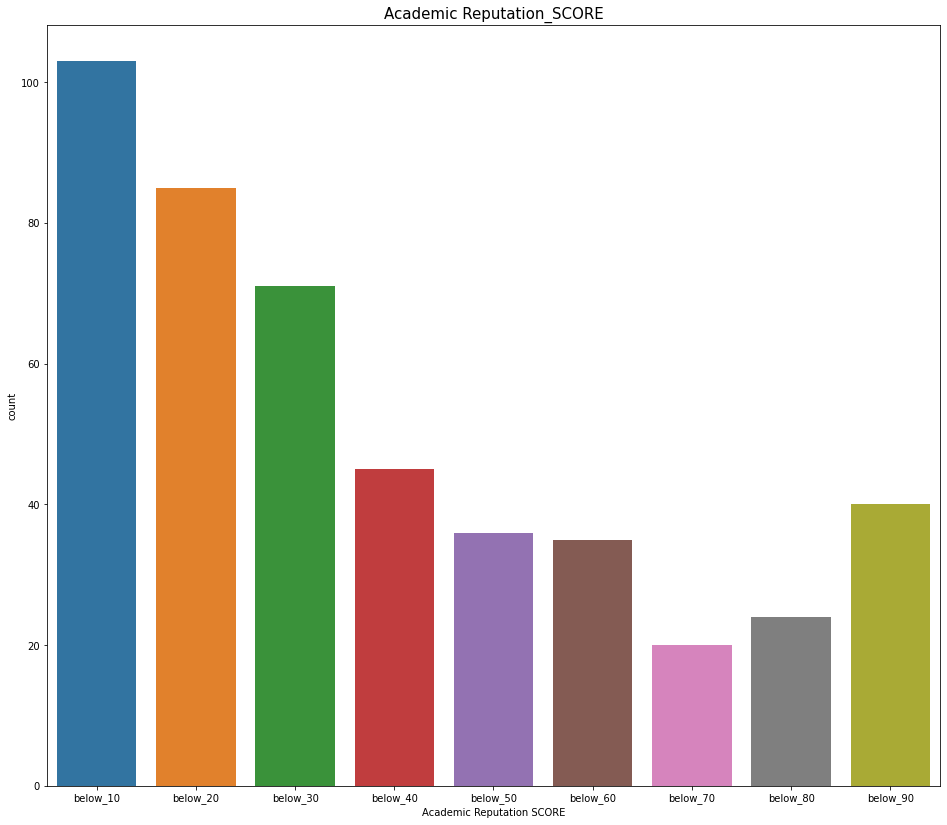

In [153]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Academic Reputation SCORE'])
plt.title('Academic Reputation_SCORE', fontsize = 15)
plt.show()

In [154]:
pd.DataFrame(df2020['Academic Reputation SCORE'].value_counts())

,Academic Reputation SCORE
below_10,103
below_20,85
below_30,71
below_40,45
below_90,40
below_50,36
below_60,35
below_80,24
below_70,20


In [155]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['Employer Reputation SCORE'] = pd.cut(df2020['Employer Reputation_SCORE'], bin_edges, labels=bin_names)

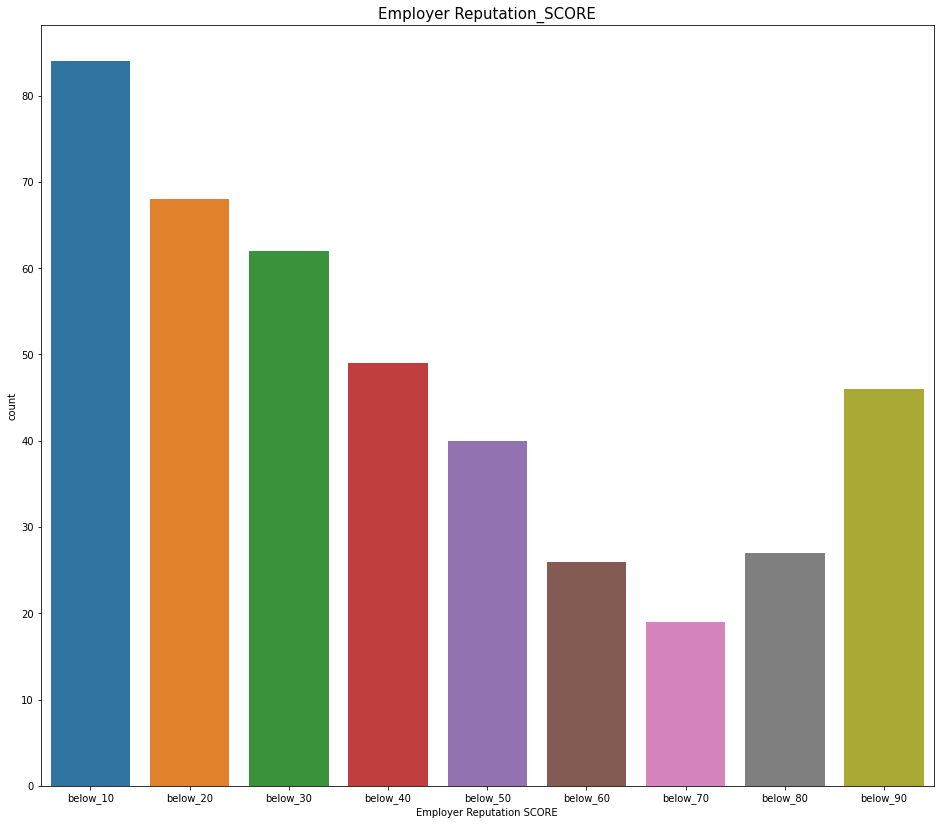

In [156]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Employer Reputation SCORE'])
plt.title('Employer Reputation_SCORE', fontsize = 15)
plt.show()

In [157]:
pd.DataFrame(df2020['Employer Reputation SCORE'].value_counts())

,Employer Reputation SCORE
below_10,84
below_20,68
below_30,62
below_40,49
below_90,46
below_50,40
below_80,27
below_60,26
below_70,19


In [158]:
in_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['Faculty Student SCORE'] = pd.cut(df2020['Faculty Student_SCORE'], bin_edges, labels=bin_names)

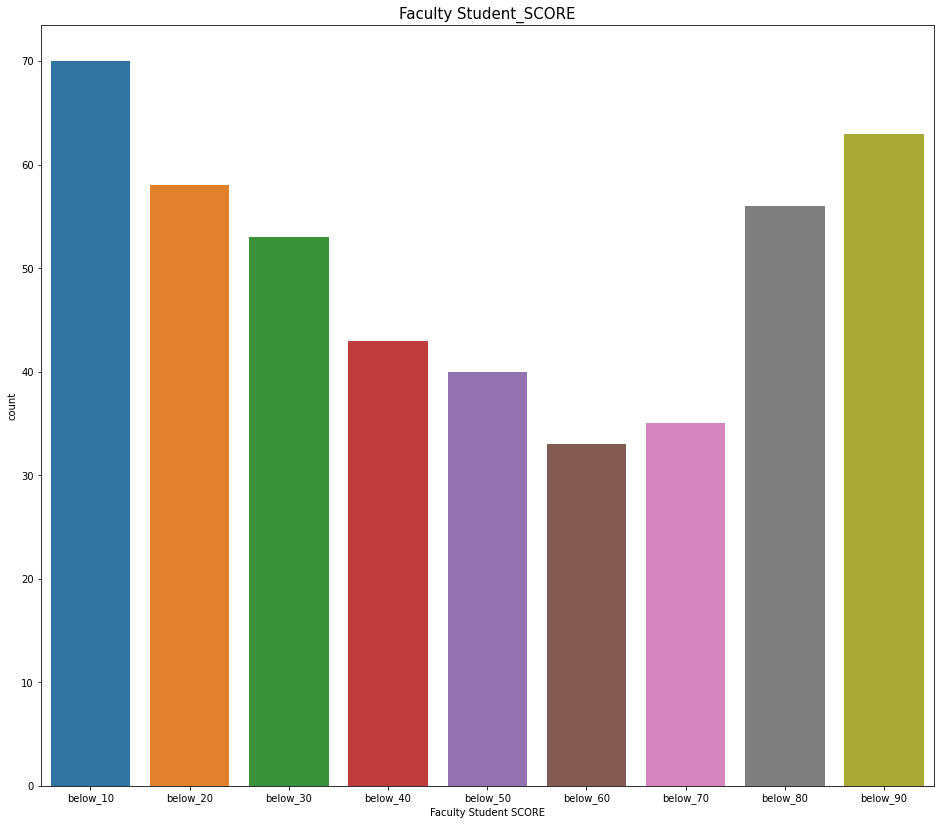

In [159]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Faculty Student SCORE'])
plt.title('Faculty Student_SCORE', fontsize = 15)
plt.show()

In [160]:
pd.DataFrame(df2020['Faculty Student SCORE'].value_counts())

,Faculty Student SCORE
below_10,70
below_90,63
below_20,58
below_80,56
below_30,53
below_40,43
below_50,40
below_70,35
below_60,33


In [161]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['Citations per Faculty SCORE'] = pd.cut(df2020['Citations per Faculty_SCORE'], bin_edges, labels=bin_names)

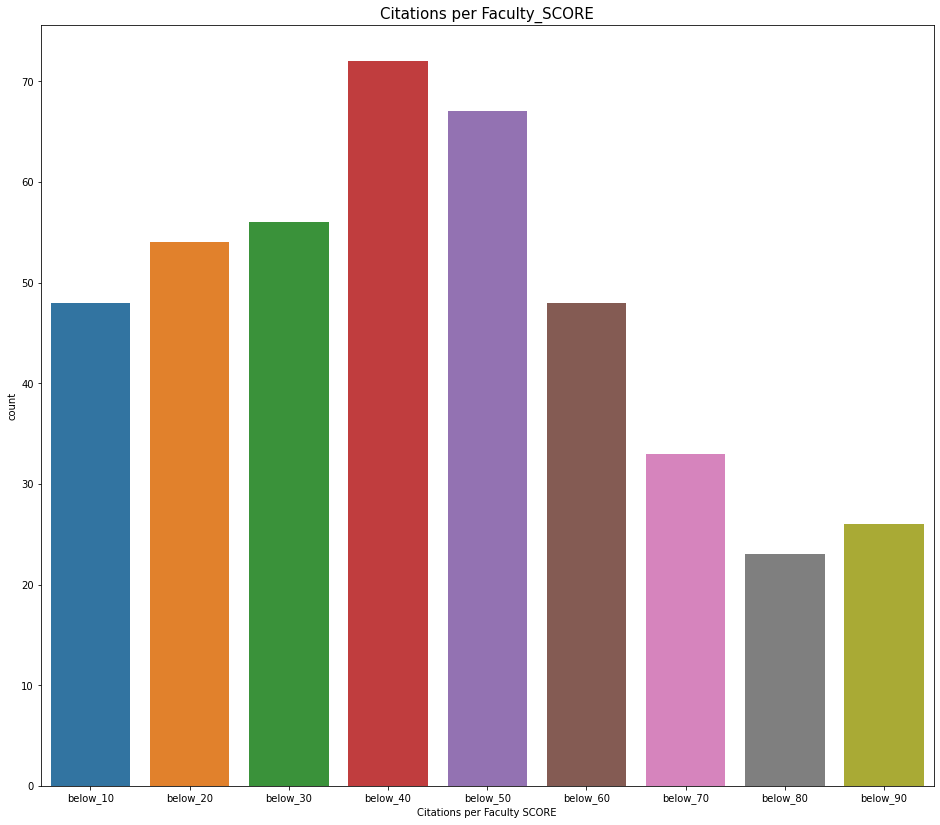

In [162]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Citations per Faculty SCORE'])
plt.title('Citations per Faculty_SCORE', fontsize = 15)
plt.show()

In [163]:
pd.DataFrame(df2020['Citations per Faculty SCORE'].value_counts())

,Citations per Faculty SCORE
below_40,72
below_50,67
below_30,56
below_20,54
below_10,48
below_60,48
below_70,33
below_90,26
below_80,23


In [164]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['International Faculty SCORE'] = pd.cut(df2020['International Faculty_SCORE'], bin_edges, labels=bin_names)

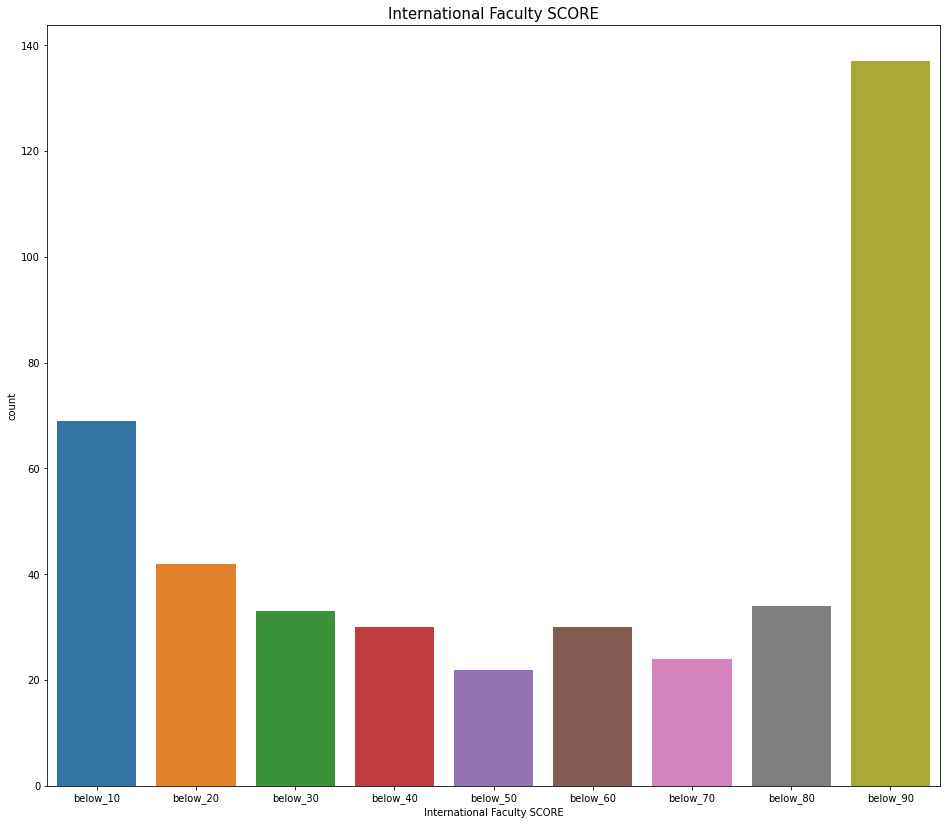

In [165]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['International Faculty SCORE'])
plt.title('International Faculty SCORE', fontsize = 15)
plt.show()

In [166]:
pd.DataFrame(df2020['International Faculty SCORE'].value_counts())

,International Faculty SCORE
below_90,137
below_10,69
below_20,42
below_80,34
below_30,33
below_40,30
below_60,30
below_70,24
below_50,22


In [167]:
bin_edges = [10,20,30,40,50,60,70,80,90,100]
bin_names = ['below_10','below_20','below_30','below_40','below_50','below_60','below_70','below_80','below_90']
df2020['International Students SCORE'] = pd.cut(df2020['International Students_SCORE'], bin_edges, labels=bin_names)

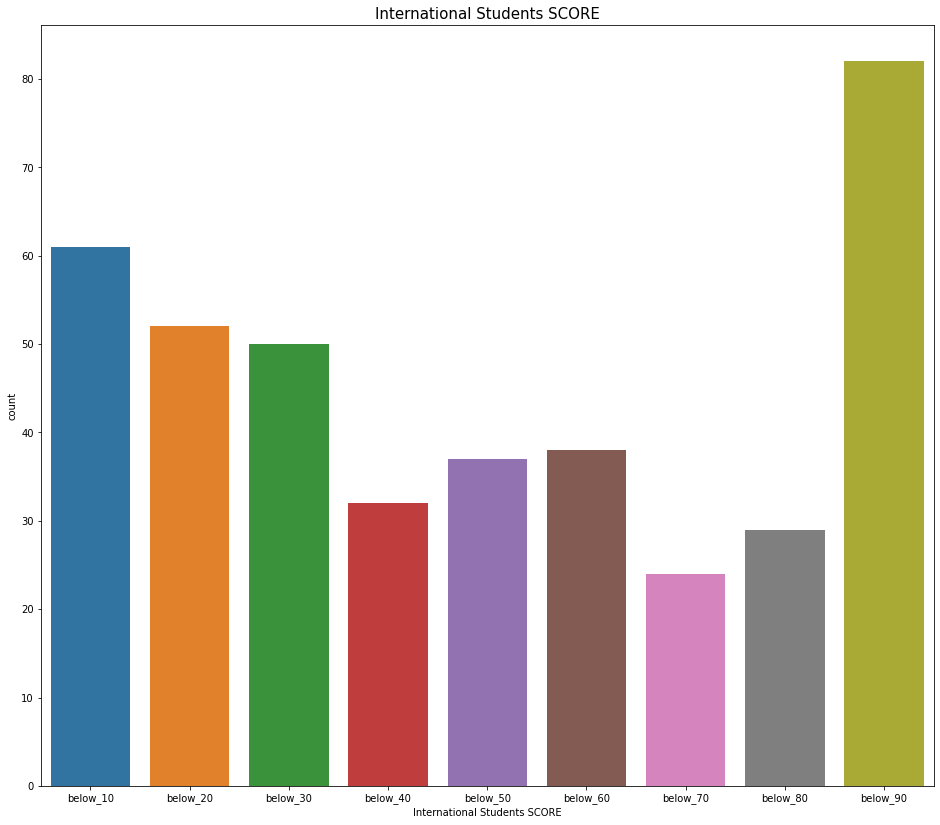

In [168]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['International Students SCORE'])
plt.title('International Students SCORE', fontsize = 15)
plt.show()

In [169]:
pd.DataFrame(df2020['International Students SCORE'].value_counts())

,International Students SCORE
below_90,82
below_10,61
below_20,52
below_30,50
below_60,38
below_50,37
below_40,32
below_80,29
below_70,24


In [170]:
bin_edges = [30,35,40,45,50,55,60,65,70,75,80,85,90,95,100]
bin_names = ['below_30','below_35','below_40','below_45','below_50','below_55','below_60','below_65','below_70','below_75','below_80','below_85','below_90','below_95']
df2020['Overall_Score'] = pd.cut(df2020['Overall Score'], bin_edges, labels=bin_names)

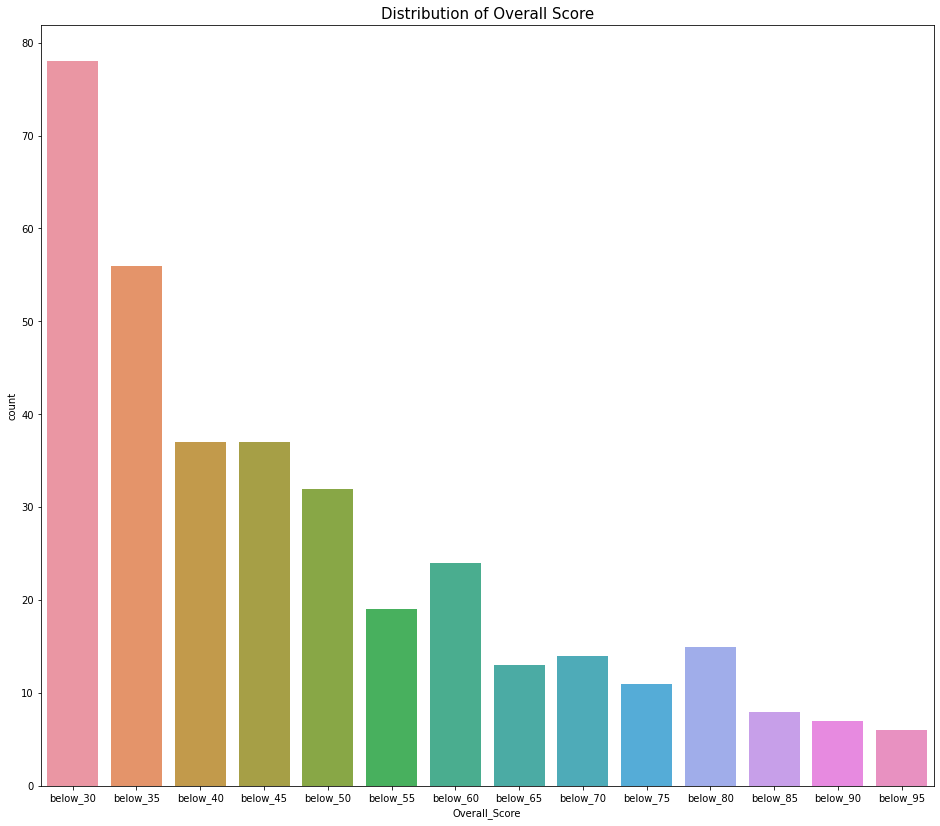

In [171]:
plt.figure(figsize=(16,14))
sns.countplot(df2020['Overall_Score'])
plt.title('Distribution of Overall Score', fontsize = 15)
plt.savefig("overall_score.png", bbox_inches='tight', dpi=500)
plt.show()

In [172]:
pd.DataFrame(df2020['Overall_Score'].value_counts())

,Overall_Score
below_30,78
below_35,56
below_40,37
below_45,37
below_50,32
below_60,24
below_55,19
below_80,15
below_70,14
below_65,13


In [173]:
df2020.head()

,Rank in 2020,Rank in 2019,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score,Academic Reputation SCORE,Employer Reputation SCORE,Faculty Student SCORE,Citations per Faculty SCORE,International Faculty SCORE,International Students SCORE,Overall_Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.8,100.0,94.1,100.0,below_90,below_90,below_90,below_90,below_90,below_90,below_95
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,98.6,99.8,67.7,98.4,below_90,below_90,below_90,below_90,below_90,below_60,below_95
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,98.7,99.6,86.3,62.2,97.4,below_90,below_90,below_90,below_90,below_80,below_60,below_95
3,4,5,university of oxford,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,84.7,99.7,98.5,97.2,below_90,below_90,below_90,below_80,below_90,below_90,below_95
4,5,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,97.8,81.2,100.0,100.0,99.4,87.3,96.9,below_90,below_80,below_90,below_90,below_90,below_80,below_95


In [174]:
grouped_country_3 = pd.DataFrame(df2020.groupby('Country')['International Faculty_SCORE', 'International Students_SCORE'].mean()).reset_index()

In [175]:
grouped_country_3.sort_values(['International Faculty_SCORE', 'International Students_SCORE'],
                            ascending = False).head(10).style.bar(subset = ['International Faculty_SCORE',
                                                                            'International Students_SCORE'], color = 'green').set_properties(**{"border" : "2px solid white"})

,Country,International Faculty_SCORE,International Students_SCORE
42,Qatar,100.000000,98.300000
30,Macau,100.000000,96.200000
45,Singapore,100.000000,72.800000
55,United Arab Emirates,100.000000,68.000000
36,Oman,100.000000,7.600000
19,Hong Kong,99.983333,89.800000
50,Switzerland,99.900000,81.337500
6,Brunei,99.600000,41.550000
34,New Zealand,98.187500,81.300000
1,Australia,97.923077,83.884615


The above Chart shows the tope 10 countries with the highest mean International Faculty and International Student Scores. This provides an idea of how accessible these universites could be for international candidates. There are other factors which contribute to this, which are not covered in this analysis. For example, a University may be open to all but barriers such as tuition, language, scholarship opportunities etc might be of hindrance for some candidates.

In [176]:
top_10_countries_1 = df2018.groupby('Country')['Institution Name'].count().sort_values(ascending = False).head(10).index
list(top_10_countries_1)

['United States',
 'United Kingdom',
 'Germany',
 'Australia',
 'France',
 'Canada',
 'China',
 'Japan',
 'Netherlands',
 'South Korea']

In [177]:
top_10_countries_2 = df2019.groupby('Country')['Institution Name'].count().sort_values(ascending = False).head(10).index
list(top_10_countries_2)

['United States',
 'United Kingdom',
 'Germany',
 'Australia',
 'China',
 'Canada',
 'Japan',
 'Russia',
 'France',
 'South Korea']

In [178]:
top_10_countries_3 = df2020.groupby('Country')['Institution Name'].count().sort_values(ascending = False).head(10).index
list(top_10_countries_3)

['United States',
 'United Kingdom',
 'Germany',
 'Australia',
 'China',
 'Japan',
 'Canada',
 'Russia',
 'South Korea',
 'France']

The top ten countries have maintained their position amongst the top 10 with only Netherland losing its position, amongst the top 10, to Russia.
Qatar maintained the first position based on the International Faulty and International Students scores from 2018-2020 with Macau making a lot progress from 2018 to maintain the second position from 2019-2020¶

### 2018 BIVARIATE

In [179]:
df2018.head()

,2018,2017,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score,Academic Reputation SCORE,Employer Reputation SCORE,Faculty Student SCORE,Citations per Faculty SCORE,International Faculty SCORE,International Students SCORE,Overall_Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.9,100.0,96.1,100.0,below_90,below_90,below_90,below_90,below_90,below_90,below_95
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,99.4,99.6,72.7,98.7,below_90,below_90,below_90,below_90,below_90,below_70,below_95
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,98.3,99.9,96.5,75.2,98.4,below_90,below_90,below_90,below_90,below_90,below_70,below_95
3,4,5,california institute of technology (caltech),United States,S,CO,VH,5.0,B,99.5,85.4,100.0,100.0,93.4,89.2,97.7,below_90,below_80,below_90,below_90,below_90,below_80,below_95
4,5,4,university of cambridge,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,78.3,97.4,97.7,95.6,below_90,below_90,below_90,below_70,below_90,below_90,below_95


<Figure size 864x576 with 0 Axes>

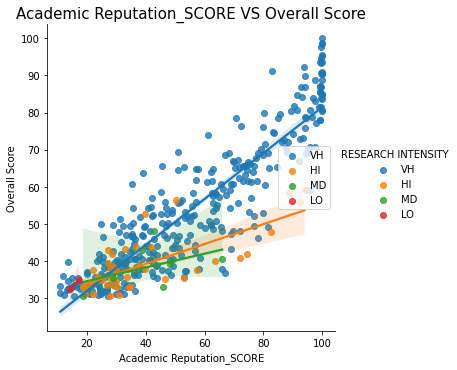

In [180]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Academic Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title('Academic Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the academic score and  overall score.
As academic score increase, the overall score increase. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

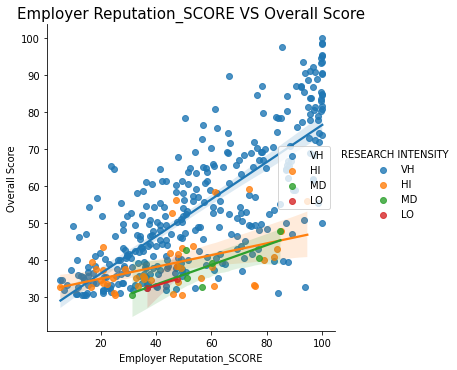

In [181]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Employer Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title('Employer Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the Employe Reputation score and overall score.
As Employer Repuation score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

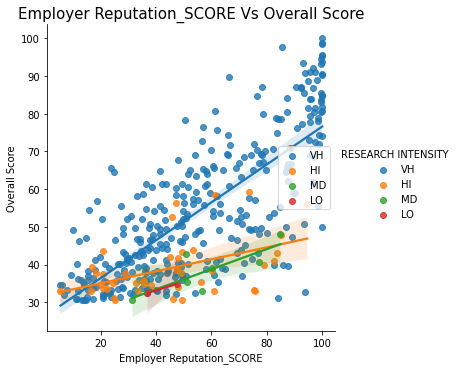

In [182]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Employer Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("Employer Reputation_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is strong relationship between the employer reputaion and  overall score.
As employer reputaion score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

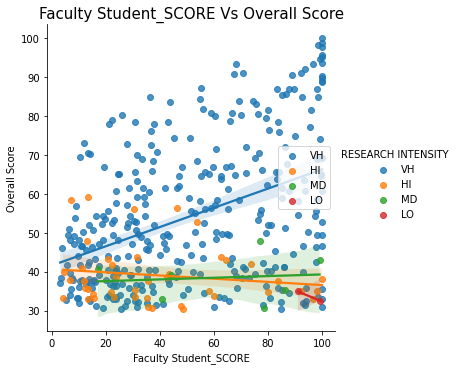

In [183]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Faculty Student_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("Faculty Student_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is strong relationship between the faculty student and  overall score.
As faculty student score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

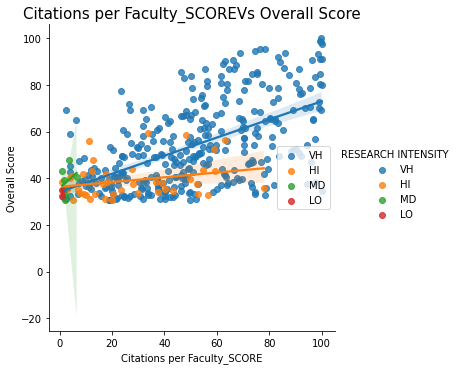

In [184]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Citations per Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("Citations per Faculty_SCOREVs Overall Score", fontsize = 15)
plt.show()

There is strong relationship between the Citation per faculty score and  overall score.
As Citation per faculty score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

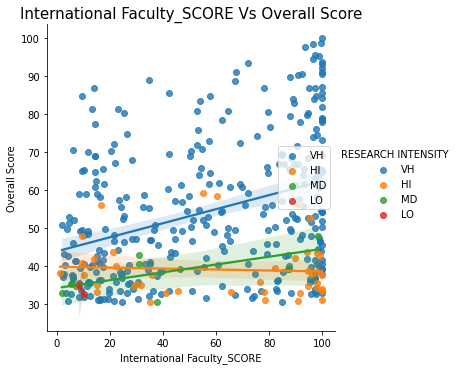

In [185]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("International Faculty_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the international faculty score and overall score. 
As international faculty score does not really affect the overall score. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

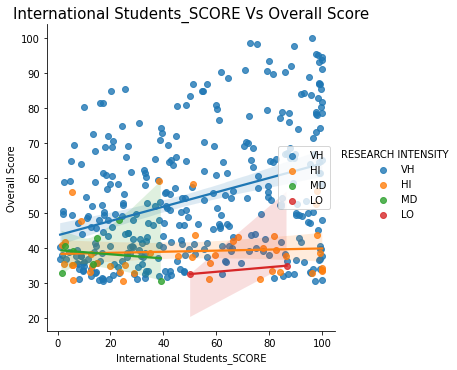

In [186]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Students_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2018)
plt.legend(loc='right')
plt.title("International Students_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the internationalstudents score and overall score. 
As international student score does not really affect the overall score. 
However, Universities having very high research intensity tend to have high overall score.

### 2019 BIVARIATE

In [187]:
df2019.head()

,2019,2018,Institution Name,Country,Classification_SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,Academic Reputation_SCORE,Employer Reputation_SCORE,Faculty Student_SCORE,Citations per Faculty_SCORE,International Faculty_SCORE,International Students_SCORE,Overall Score,Academic Reputation SCORE,Employer Reputation SCORE,Faculty Student SCORE,Citations per Faculty SCORE,International Faculty SCORE,International Students SCORE,Overall_Score
0,1,1,massachusetts institute of technology (mit),United States,M,CO,VH,5.0,B,100.0,100.0,100.0,99.8,100.0,95.5,100.0,below_90,below_90,below_90,below_90,below_90,below_90,below_95
1,2,2,stanford university,United States,L,FC,VH,5.0,B,100.0,100.0,100.0,99.0,99.8,70.5,98.6,below_90,below_90,below_90,below_90,below_90,below_70,below_95
2,3,3,harvard university,United States,L,FC,VH,5.0,B,100.0,100.0,99.3,99.8,92.1,75.7,98.5,below_90,below_90,below_90,below_90,below_90,below_70,below_95
3,4,4,california institute of technology (caltech),United States,S,CO,VH,5.0,B,98.7,81.2,100.0,100.0,96.8,90.3,97.2,below_90,below_80,below_90,below_90,below_90,below_90,below_95
4,5,6,university of oxford,United Kingdom,L,FC,VH,5.0,A,100.0,100.0,100.0,83.0,99.6,98.8,96.8,below_90,below_90,below_90,below_80,below_90,below_90,below_95


<Figure size 864x576 with 0 Axes>

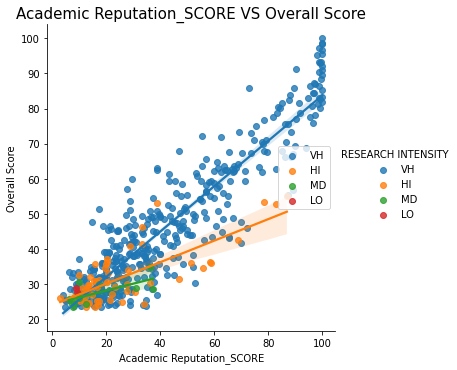

In [188]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Academic Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title('Academic Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the academic reputation score and overall score.
As academic reputation score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

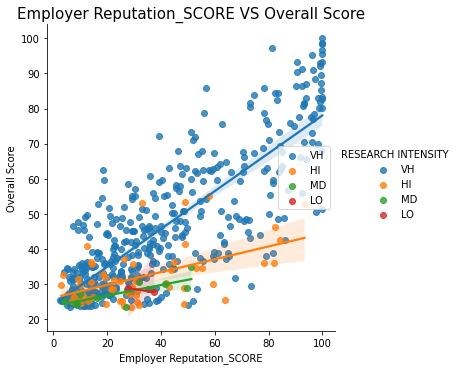

In [189]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Employer Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title('Employer Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the Employe Reputation score and overall score.
As Employer Repuation score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x720 with 0 Axes>

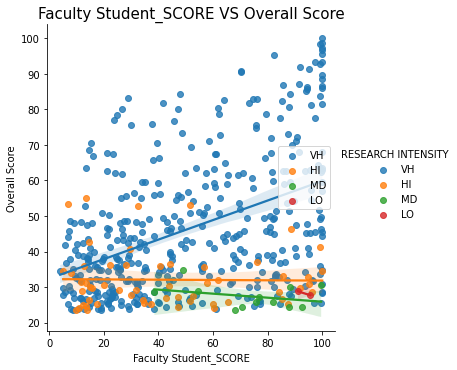

In [190]:
plt.figure(figsize=(12,10))
g = sns.lmplot(x="Faculty Student_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title('Faculty Student_SCORE VS Overall Score', fontsize = 15)
plt.show()

<Figure size 864x576 with 0 Axes>

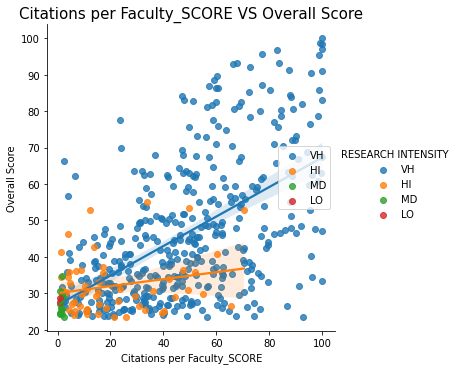

In [191]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Citations per Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title('Citations per Faculty_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the citation per faculty score and overall score.
As Citations per faculty score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

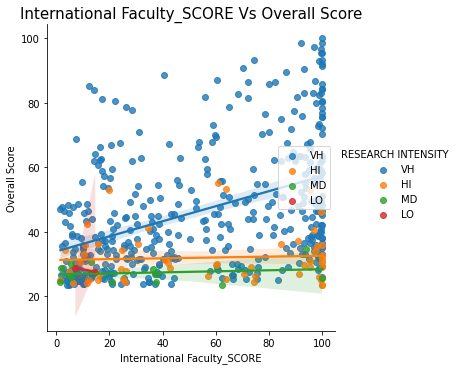

In [192]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title("International Faculty_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the international faculty score and overall score. 
As international faculty score does not really affect the overall score. 
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

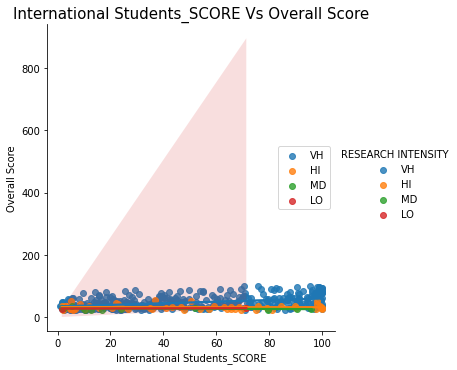

In [193]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Students_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2019)
plt.legend(loc='right')
plt.title("International Students_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is no relationship between the international students score and overall score. 
As international students score does not really affect the overall score. 

### 2020 BIVARIATE

<Figure size 864x576 with 0 Axes>

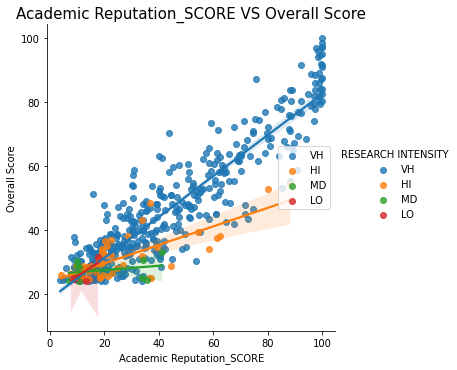

In [194]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Academic Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title('Academic Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the academic reputaion score and overall score.
As academic reputaion score  increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

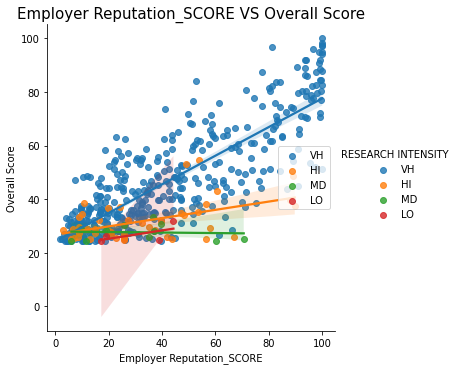

In [195]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Employer Reputation_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title('Employer Reputation_SCORE VS Overall Score', fontsize = 15)
plt.show()

<Figure size 864x576 with 0 Axes>

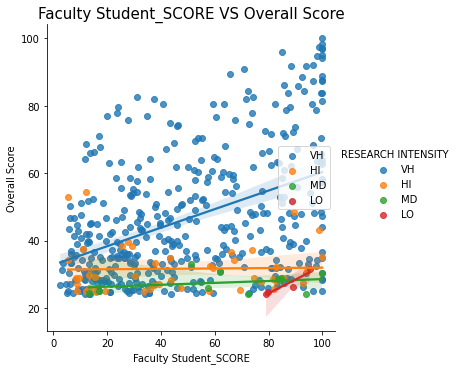

In [196]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Faculty Student_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title('Faculty Student_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the faculty student score and overall score.
As faculty student score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

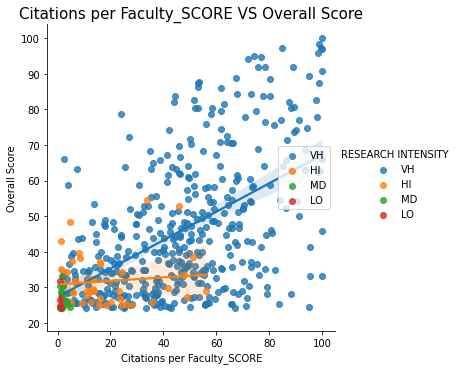

In [197]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="Citations per Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title('Citations per Faculty_SCORE VS Overall Score', fontsize = 15)
plt.show()

There is strong relationship between the citation per faculty score and overall score.
As citation per faculty score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

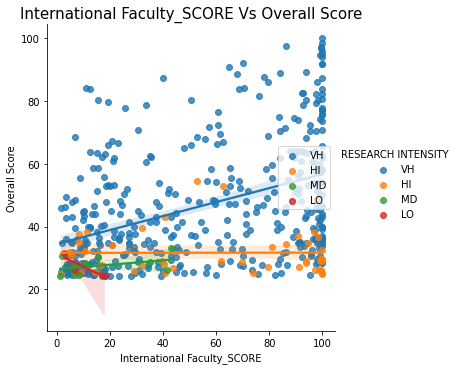

In [198]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Faculty_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title("International Faculty_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the international faculty score and overall score.
As international faculty score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

<Figure size 864x576 with 0 Axes>

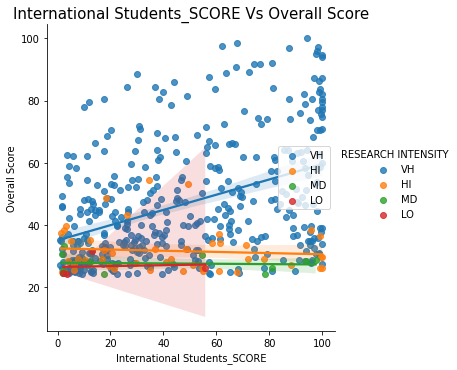

In [199]:
plt.figure(figsize=(12,8))
g = sns.lmplot(x="International Students_SCORE", y="Overall Score", hue="RESEARCH INTENSITY", data=df2020)
plt.legend(loc='right')
plt.title("International Students_SCORE Vs Overall Score", fontsize = 15)
plt.show()

There is weak relationship between the international faculty score and overall score. 
As international faculty score does not really affect the overall score. 
However, Universities having very high research intensity tend to have high overall score.

#### SUMMARY FROM BIVARIATE ANALYSIS OF 3YEARS DATASET

1. There is strong relationship between the academic reputaion score and overall score. 
As academic reputaion score increase, the overall score increase and vice versa. 
However, Universities having very high research intensity tend to have high overall score.

2. There is strong relationship between the Employe Reputation score and overall score.
As Employer Repuation score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

3. There is strong relationship between the faculty student and overall score. 
As faculty student score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score

4. There is strong relationship between the citation per faculty score and overall score.
As citation per faculty score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

5. There is weak relationship between the international faculty score and overall score. 
As international faculty score increase, the overall score increase and vice versa.
However, Universities having very high research intensity tend to have high overall score.

6. There is weak relationship between the international faculty score and overall score. 
As international faculty score does not really affect the overall score.
However, Universities having very high research intensity tend to have high overall score.

# 4. INTUITIVE CLEANING FOR MODELLING

In [200]:
# Load the dateset
df_2018 = pd.read_csv("2018-QS-World-University-Rankings.csv", encoding="latin")
df_2019 = pd.read_csv(r"2019-QS-World-University-Rankings.csv", encoding="latin")
df_2020 = pd.read_csv(r"2020-QS-World-University-Rankings.csv", encoding="latin")

In [201]:
df_2018.head()

,2018,2017,Institution Name,Country,Classification,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8,Academic Reputation,Unnamed: 10,Employer Reputation,Unnamed: 12,Faculty Student,Unnamed: 14,Citations per Faculty,Unnamed: 16,International Faculty,Unnamed: 18,International Students,Unnamed: 20,Overall Score
0,NaN,NaN,NaN,NaN,SIZE,FOCUS,RESEARCH INTENSITY,AGE,STATUS,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,SCORE,RANK,NaN
1,1,1,MASSACHUSETTS INSTITUTE OF TECHNOLOGY (MIT),United States,M,CO,VH,5,B,100,6,100,4,100,14,99.9,8,100,36,96.1,70,100
2,2,2,STANFORD UNIVERSITY,United States,L,FC,VH,5,B,100,5,100,5,100,12,99.4,12,99.6,54,72.7,177,98.7
3,3,3,HARVARD UNIVERSITY,United States,L,FC,VH,5,B,100,1,100,3,98.3,38,99.9,9,96.5,103,75.2,165,98.4
4,4,5,CALIFORNIA INSTITUTE OF TECHNOLOGY (CALTECH),United States,S,CO,VH,5,B,99.5,22,85.4,77,100,3,100,4,93.4,126,89.2,106,97.7


In [202]:
# Reload the dateset with Proper Headers
df_2018 = pd.read_csv("2018-QS-World-University-Rankings.csv", names=[2018, 2017, "Institution", "Country", "Classification_Size", "Classification_Focus", "Research_Intensity", "Age", "Status", "Academic_Reputation_Score", "Academic_Reputation_Rank", "Employer_Reputation_Score", "Employer_Reputation_Rank", "Faculty_Student_Score", "Faculty_Student_Rank", "Citations_Per_Faculty_Score", "Citations_Per_Faculty_Rank", "International_Faculty_Score", "International_Faculty_Rank", "International_Student_Score", "International_Student_Rank", "Overall_Score"], skiprows=2, encoding="latin")
df_2019 = pd.read_csv(r"2019-QS-World-University-Rankings.csv", names=[2019, 2018, "Institution", "Country", "Classification_Size", "Classification_Focus", "Research_Intensity", "Age", "Status", "Academic_Reputation_Score", "Academic_Reputation_Rank", "Employer_Reputation_Score", "Employer_Reputation_Rank", "Faculty_Student_Score", "Faculty_Student_Rank", "Citations_Per_Faculty_Score", "Citations_Per_Faculty_Rank", "International_Faculty_Score", "International_Faculty_Rank", "International_Student_Score", "International_Student_Rank", "Overall_Score"], skiprows=2, encoding="latin")
df_2020 = pd.read_csv(r"2020-QS-World-University-Rankings.csv", names=[2020, 2019, "Institution", "Country", "Classification_Size", "Classification_Focus", "Research_Intensity", "Age", "Status", "Academic_Reputation_Score", "Academic_Reputation_Rank", "Employer_Reputation_Score", "Employer_Reputation_Rank", "Faculty_Student_Score", "Faculty_Student_Rank", "Citations_Per_Faculty_Score", "Citations_Per_Faculty_Rank", "International_Faculty_Score", "International_Faculty_Rank", "International_Student_Score", "International_Student_Rank", "Overall_Score"], skiprows=2, encoding="latin")

In [203]:
# Take out rows whose almost 60% of the observations are missing
df_2018.drop(df_2018.index[501:], inplace=True)
df_2018.tail()

,2018,2017,Institution,Country,Classification_Size,Classification_Focus,Research_Intensity,Age,Status,Academic_Reputation_Score,Academic_Reputation_Rank,Employer_Reputation_Score,Employer_Reputation_Rank,Faculty_Student_Score,Faculty_Student_Rank,Citations_Per_Faculty_Score,Citations_Per_Faculty_Rank,International_Faculty_Score,International_Faculty_Rank,International_Student_Score,International_Student_Rank,Overall_Score
496,491-500,451-460,PUSAN NATIONAL UNIVERSITY,South Korea,L,FC,VH,4.0,A,-,-,-,-,34.7,376,21.8,401+,8.1,401+,11.1,401+,25.2
497,491-500,501-550,"UNIVERSIDADE ESTADUAL PAULISTA ""JÚLIO DE MESQU...",Brazil,XL,FC,VH,3.0,A,-,-,-,-,27.4,401+,10.8,401+,5.9,401+,3.3,401+,25.8
498,491-500,491-500,UNIVERSITÉ SAINT-JOSEPH DE BEYROUTH,Lebanon,M,FC,MD,5.0,B,-,-,-,-,70.2,165,2.2,401+,59.9,265,9.3,401+,25.6
499,491-500,501-550,UNIVERSITY OF GUELPH,Canada,L,CO,VH,4.0,A,-,-,-,-,9.5,401+,40.9,311,46.9,320,15.5,401+,25.3
500,491-500,601-650,URAL FEDERAL UNIVERSITY,Russia,L,CO,HI,4.0,A,-,-,-,-,73.5,152,1.7,401+,13.5,401+,19.2,401+,25.3


In [204]:
df_2019.drop(df_2019.index[1000:], inplace=True)
df_2019.tail()

,2019,2018,Institution,Country,Classification_Size,Classification_Focus,Research_Intensity,Age,Status,Academic_Reputation_Score,Academic_Reputation_Rank,Employer_Reputation_Score,Employer_Reputation_Rank,Faculty_Student_Score,Faculty_Student_Rank,Citations_Per_Faculty_Score,Citations_Per_Faculty_Rank,International_Faculty_Score,International_Faculty_Rank,International_Student_Score,International_Student_Rank,Overall_Score
995,801-1000,801-1000,VORONEZH STATE UNIVERSITY,Russia,L,CO,MD,5.0,A,-,-,-,-,40.2,383,-,-,-,-,18.1,547,7.2 - 14.2
996,801-1000,801-1000,VYTAUTAS MAGNUS UNIVERSITY,Lithuania,M,FO,HI,4.0,A,-,-,-,-,-,-,-,-,28.1,464,-,-,7.2 - 14.2
997,801-1000,801-1000,WEST UNIVERSITY OF TIMISOARA,Romania,L,FO,HI,4.0,A,-,-,-,-,-,-,-,-,-,-,-,-,7.2 - 14.2
998,801-1000,801-1000,WROCLAW UNIVERSITY OF TECHNOLOGY,Poland,L,FO,VH,5.0,A,-,-,17.9,499,-,-,-,-,NaN,-,NaN,-,7.2 - 14.2
999,801-1000,751-800,YEUNGNAM UNIVERSITY,South Korea,L,FC,HI,4.0,C,-,-,-,-,-,-,19.1,564,27.8,468,-,-,7.2 - 14.2


In [205]:
df_2020.drop(df_2020.index[1002:], inplace=True)
df_2020.tail()

,2020,2019,Institution,Country,Classification_Size,Classification_Focus,Research_Intensity,Age,Status,Academic_Reputation_Score,Academic_Reputation_Rank,Employer_Reputation_Score,Employer_Reputation_Rank,Faculty_Student_Score,Faculty_Student_Rank,Citations_Per_Faculty_Score,Citations_Per_Faculty_Rank,International_Faculty_Score,International_Faculty_Rank,International_Student_Score,International_Student_Rank,Overall_Score
997,801-1000,NaN,Warsaw University of Life Sciences,Poland,L,FO,VH,5.0,A,-,-,-,-,28.8,521,-,-,-,-,-,-,9 - 14.1
998,801-1000,801-1000,Wroc?aw University of Science and Technology,Poland,L,FO,VH,5.0,A,-,-,-,-,26.3,564,-,-,-,-,-,-,9 - 14.1
999,801-1000,NaN,Wuhan University of Technology,China,XL,FO,VH,2.0,A,-,-,-,-,-,-,18.9,569,-,-,-,-,9 - 14.1
1000,801-1000,NaN,Xi'an Jiaotong-Liverpool University,China,M,CO,HI,2.0,B,-,-,-,-,-,-,-,-,100,33,-,-,9 - 14.1
1001,801-1000,801-1000,Yeungnam University,South Korea,L,FC,HI,4.0,C,-,-,-,-,-,-,23.4,503,21.9,524,-,-,9 - 14.1


### The score should be independent of the previous years' ranks, institution's name, and Age. We drop all the columns that should not affect the overall score

In [206]:
df_2018.columns

Index([                         2018,                          2017,
                       'Institution',                     'Country',
               'Classification_Size',        'Classification_Focus',
                'Research_Intensity',                         'Age',
                            'Status',   'Academic_Reputation_Score',
          'Academic_Reputation_Rank',   'Employer_Reputation_Score',
          'Employer_Reputation_Rank',       'Faculty_Student_Score',
              'Faculty_Student_Rank', 'Citations_Per_Faculty_Score',
        'Citations_Per_Faculty_Rank', 'International_Faculty_Score',
        'International_Faculty_Rank', 'International_Student_Score',
        'International_Student_Rank',               'Overall_Score'],
      dtype='object')

In [207]:
list(df_2018.filter(regex="Rank$", axis=1).columns)

['Academic_Reputation_Rank',
 'Employer_Reputation_Rank',
 'Faculty_Student_Rank',
 'Citations_Per_Faculty_Rank',
 'International_Faculty_Rank',
 'International_Student_Rank']

In [208]:
df_2018 = df_2018.drop(columns=[2018, 2017, "Institution", "Country", "Age", 'Academic_Reputation_Rank', 'Employer_Reputation_Rank', 'Faculty_Student_Rank', 'Citations_Per_Faculty_Rank', 'International_Faculty_Rank', 'International_Student_Rank'], axis=1)

In [209]:
df_2019.columns

Index([                         2019,                          2018,
                       'Institution',                     'Country',
               'Classification_Size',        'Classification_Focus',
                'Research_Intensity',                         'Age',
                            'Status',   'Academic_Reputation_Score',
          'Academic_Reputation_Rank',   'Employer_Reputation_Score',
          'Employer_Reputation_Rank',       'Faculty_Student_Score',
              'Faculty_Student_Rank', 'Citations_Per_Faculty_Score',
        'Citations_Per_Faculty_Rank', 'International_Faculty_Score',
        'International_Faculty_Rank', 'International_Student_Score',
        'International_Student_Rank',               'Overall_Score'],
      dtype='object')

In [210]:
list(df_2019.filter(regex="Rank$", axis=1).columns)

['Academic_Reputation_Rank',
 'Employer_Reputation_Rank',
 'Faculty_Student_Rank',
 'Citations_Per_Faculty_Rank',
 'International_Faculty_Rank',
 'International_Student_Rank']

In [211]:
df_2019 = df_2019.drop(columns=[2019, 2018, "Institution", "Country", "Age", 'Academic_Reputation_Rank', 'Employer_Reputation_Rank', 'Faculty_Student_Rank', 'Citations_Per_Faculty_Rank', 'International_Faculty_Rank', 'International_Student_Rank'], axis=1)

In [212]:
df_2020.columns

Index([                         2020,                          2019,
                       'Institution',                     'Country',
               'Classification_Size',        'Classification_Focus',
                'Research_Intensity',                         'Age',
                            'Status',   'Academic_Reputation_Score',
          'Academic_Reputation_Rank',   'Employer_Reputation_Score',
          'Employer_Reputation_Rank',       'Faculty_Student_Score',
              'Faculty_Student_Rank', 'Citations_Per_Faculty_Score',
        'Citations_Per_Faculty_Rank', 'International_Faculty_Score',
        'International_Faculty_Rank', 'International_Student_Score',
        'International_Student_Rank',               'Overall_Score'],
      dtype='object')

In [213]:
list(df_2020.filter(regex="Rank$", axis=1).columns)

['Academic_Reputation_Rank',
 'Employer_Reputation_Rank',
 'Faculty_Student_Rank',
 'Citations_Per_Faculty_Rank',
 'International_Faculty_Rank',
 'International_Student_Rank']

In [214]:
df_2020 = df_2020.drop(columns=[2020, 2019, "Institution", "Country", "Age", 'Academic_Reputation_Rank', 'Employer_Reputation_Rank', 'Faculty_Student_Rank', 'Citations_Per_Faculty_Rank', 'International_Faculty_Rank', 'International_Student_Rank'], axis=1)

In [215]:
df_2018.tail()

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
496,L,FC,VH,A,-,-,34.7,21.8,8.1,11.1,25.2
497,XL,FC,VH,A,-,-,27.4,10.8,5.9,3.3,25.8
498,M,FC,MD,B,-,-,70.2,2.2,59.9,9.3,25.6
499,L,CO,VH,A,-,-,9.5,40.9,46.9,15.5,25.3
500,L,CO,HI,A,-,-,73.5,1.7,13.5,19.2,25.3


In [216]:
df_2018.shape

(501, 11)

In [217]:
df_2018.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         3
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    1
International_Faculty_Score    6
International_Student_Score    1
Overall_Score                  0
dtype: int64

In [218]:
df_2018.replace(to_replace="-", value=np.nan, inplace=True)

In [219]:
df_2018.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           3
Academic_Reputation_Score      101
Employer_Reputation_Score      101
Faculty_Student_Score            0
Citations_Per_Faculty_Score      1
International_Faculty_Score      6
International_Student_Score      1
Overall_Score                    0
dtype: int64

In [220]:
df_2018.columns

Index(['Classification_Size', 'Classification_Focus', 'Research_Intensity',
       'Status', 'Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score',
       'Overall_Score'],
      dtype='object')

In [221]:
# Convert to appropriate datatype
df_2018[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']] = df_2018[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']].astype("float64")

In [222]:
df_2018[df_2018.Status.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
192,S,FO,VH,NaN,20.8,11.1,91.2,98.3,2.4,18.2,48.5
193,S,FC,VH,NaN,18.8,18.7,86.3,96.0,2.0,49.8,48.5
467,L,FO,VH,NaN,NaN,NaN,2.8,81.1,NaN,25.7,27.1


In [223]:
df_2018.Status.iloc[186:200]

186      A
187      A
188      A
189      A
190      A
191      B
192    NaN
193    NaN
194      A
195      A
196      A
197      A
198      B
199      A
Name: Status, dtype: object

In [224]:
df_2018.Status.iloc[192] = df_2018.Status.iloc[186:192].mode().iat[0]

In [225]:
df_2018.Status.iloc[193] = df_2018.Status.iloc[194:200].mode().iat[0]

In [226]:
df_2018.Status.iloc[467] = df_2018.Status.iloc[462:467].mode().iat[0]

In [227]:
df_2018.Status.isnull().sum()

0

In [228]:
df_2018[df_2018.Academic_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
400,L,CO,VH,A,NaN,NaN,2.3,79.5,10.4,26.9,30.1
401,L,FO,VH,A,NaN,NaN,11.3,63.7,1.6,2.6,30.3
402,L,FO,VH,A,NaN,NaN,93.8,2.2,12.7,56.5,29.9
403,XL,FC,VH,A,NaN,NaN,6.3,56.7,27.3,35.3,30.2
404,M,CO,MD,B,NaN,NaN,99.8,1.0,10.6,NaN,30
405,XL,FC,MD,A,NaN,NaN,24.0,1.5,23.5,2.4,30.2
406,L,FC,VH,A,NaN,NaN,17.7,25.3,8.3,41.2,29.8
407,L,FC,MD,A,NaN,NaN,78.0,1.8,1.3,89.9,29.9
408,L,FC,HI,A,NaN,NaN,69.1,5.1,7.0,4.6,30
409,L,FC,VH,A,NaN,NaN,22.5,32.0,66.8,12.7,30.4


In [229]:
print(df_2018.Academic_Reputation_Score.iloc[300:400].mode())
print(df_2018["Academic_Reputation_Score"].max())
print(df_2018["Academic_Reputation_Score"].min())

0     13.7
1     15.5
2     17.6
3     20.2
4     22.2
5     23.6
6     26.7
7     27.1
8     28.8
9     29.9
10    31.3
11    31.4
12    52.9
Name: Academic_Reputation_Score, dtype: float64
100.0
3.2


In [230]:
def feature_score(df=None, col=None, start_index=None, stop_index=None, min_n=None, max_n=None, ndigits=None):
    for i in df[col][df[col].isnull()==True].index[start_index:stop_index]:
        df[col].iloc[i] = round(random.uniform(min_n, max_n), ndigits)

In [231]:
feature_score(df=df_2018, col="Academic_Reputation_Score", start_index=0, stop_index=20, min_n=13.7, max_n=31.3, ndigits=1)
feature_score(df=df_2018, col="Academic_Reputation_Score", start_index=0, stop_index=20, min_n=13.7, max_n=31.3, ndigits=1)
feature_score(df=df_2018, col="Academic_Reputation_Score", start_index=0, stop_index=-1, min_n=3.2, max_n=31.3, ndigits=1)
df_2018.Academic_Reputation_Score.fillna(round(random.uniform(1, 5), 1), inplace=True)

In [232]:
df_2018.Employer_Reputation_Score.isnull().sum()

101

In [233]:
df_2018[df_2018.Employer_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
400,L,CO,VH,A,17.1,NaN,2.3,79.5,10.4,26.9,30.1
401,L,FO,VH,A,28.4,NaN,11.3,63.7,1.6,2.6,30.3
402,L,FO,VH,A,28.2,NaN,93.8,2.2,12.7,56.5,29.9
403,XL,FC,VH,A,21.1,NaN,6.3,56.7,27.3,35.3,30.2
404,M,CO,MD,B,29.5,NaN,99.8,1.0,10.6,NaN,30
405,XL,FC,MD,A,28.9,NaN,24.0,1.5,23.5,2.4,30.2
406,L,FC,VH,A,29.3,NaN,17.7,25.3,8.3,41.2,29.8
407,L,FC,MD,A,29.6,NaN,78.0,1.8,1.3,89.9,29.9
408,L,FC,HI,A,25.7,NaN,69.1,5.1,7.0,4.6,30
409,L,FC,VH,A,15.9,NaN,22.5,32.0,66.8,12.7,30.4


In [234]:
print(df_2018.Employer_Reputation_Score.iloc[300:400].mode())
print(df_2018["Employer_Reputation_Score"].max())
print(df_2018["Employer_Reputation_Score"].min())

0    20.7
1    22.2
Name: Employer_Reputation_Score, dtype: float64
100.0
1.9


In [235]:
feature_score(df=df_2018, col="Employer_Reputation_Score", start_index=0, stop_index=20, min_n=10, max_n=22.2, ndigits=1)
feature_score(df=df_2018, col="Employer_Reputation_Score",start_index=0, stop_index=20, min_n=5, max_n=20, ndigits=1)
feature_score(df=df_2018, col="Employer_Reputation_Score", start_index=0, stop_index=-1, min_n=1.9, max_n=10, ndigits=1)
df_2018.Employer_Reputation_Score.fillna(round(random.uniform(1, 5), 1), inplace=True)

In [236]:
df_2018[df_2018.Citations_Per_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
494,M,CO,LO,A,8.7,5.1,92.6,NaN,19.5,9.4,25.3


In [237]:
df_2018.Citations_Per_Faculty_Score.fillna(round(random.uniform(10, 20), 1), inplace=True)

In [238]:
df_2018[df_2018.International_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
189,S,SP,VH,A,38.3,22.3,56.1,100.0,NaN,2.1,49
327,M,FC,VH,B,3.2,6.4,96.3,65.9,NaN,24.2,35.6
363,L,FC,LO,B,24.2,66.9,76.9,1.2,NaN,19.5,33
415,XL,CO,MD,A,23.6,11.3,37.2,1.8,NaN,1.8,29.4
467,L,FO,VH,A,21.0,7.8,2.8,81.1,NaN,25.7,27.1
478,M,FO,VH,A,13.2,9.0,9.7,84.3,NaN,1.3,26.4


In [239]:
print(df_2018.International_Faculty_Score.mode())
print(df_2018["International_Faculty_Score"].max())
print(df_2018["International_Faculty_Score"].min())

0    100.0
Name: International_Faculty_Score, dtype: float64
100.0
1.3


In [240]:
feature_score(df=df_2018, col="International_Faculty_Score", start_index=0, stop_index=-1, min_n=1.3, max_n=80, ndigits=1)
df_2018.International_Faculty_Score.fillna(round(random.uniform(1, 10), 1), inplace=True)

In [241]:
df_2018[df_2018.International_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
404,M,CO,MD,B,29.5,20.4,99.8,1.0,10.6,NaN,30


In [242]:
print(df_2018.International_Student_Score.mode())
print(df_2018["International_Student_Score"].max())
print(df_2018["International_Student_Score"].min())

0    100.0
Name: International_Student_Score, dtype: float64
100.0
1.0


In [243]:
feature_score(df=df_2018, col="International_Student_Score", start_index=0, stop_index=-1, min_n=1, max_n=80, ndigits=1)
df_2018.International_Student_Score.fillna(round(random.uniform(1, 10), 1), inplace=True)

In [244]:
df_2018.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         0
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    0
International_Faculty_Score    0
International_Student_Score    0
Overall_Score                  0
dtype: int64

In [245]:
df_2019.isnull().sum()

Classification_Size             0
Classification_Focus            0
Research_Intensity              0
Status                          0
Academic_Reputation_Score       0
Employer_Reputation_Score       2
Faculty_Student_Score           0
Citations_Per_Faculty_Score     0
International_Faculty_Score    53
International_Student_Score    12
Overall_Score                   0
dtype: int64

In [246]:
df_2019.replace(to_replace="-", value=np.nan, inplace=True)

In [247]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score      411
Employer_Reputation_Score      385
Faculty_Student_Score          293
Citations_Per_Faculty_Score    322
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [248]:
# Convert to appropriate datatype
df_2019[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']] = df_2019[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']].astype("float64")

In [249]:
df_2019[df_2019.Academic_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
503,L,FC,VH,B,NaN,NaN,43.0,27.9,41.9,48.4,23.1 - 23.4
504,L,CO,VH,A,NaN,NaN,36.2,27.2,49.9,44.7,23.1 - 23.4
505,M,FC,HI,B,NaN,NaN,88.6,NaN,NaN,NaN,23.1 - 23.4
506,M,CO,VH,B,NaN,NaN,37.9,45.2,NaN,47.0,23.1 - 23.4
507,M,CO,HI,A,NaN,NaN,99.4,NaN,NaN,14.9,23.1 - 23.4
509,S,FO,VH,B,NaN,23.6,38.6,21.1,39.5,17.1,23.1 - 23.4
512,L,FC,VH,B,NaN,NaN,71.9,30.6,NaN,NaN,23.1 - 23.4
513,M,FO,VH,A,NaN,NaN,74.2,NaN,17.2,36.9,22.9 - 23
514,M,FC,VH,A,NaN,NaN,82.5,NaN,NaN,NaN,22.9 - 23
515,L,FC,HI,A,NaN,NaN,74.9,NaN,NaN,NaN,22.9 - 23


In [250]:
print(df_2019.Academic_Reputation_Score.mode())
print(df_2019["Academic_Reputation_Score"].max())
print(df_2019["Academic_Reputation_Score"].min())

0    100.0
Name: Academic_Reputation_Score, dtype: float64
100.0
3.0


In [251]:
feature_score(df=df_2019, col="Academic_Reputation_Score", start_index=0, stop_index=-1, min_n=3, max_n=60, ndigits=1)
df_2019.Academic_Reputation_Score.fillna(round(random.uniform(10, 35), 1), inplace=True)

In [252]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score      385
Faculty_Student_Score          293
Citations_Per_Faculty_Score    322
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [253]:
df_2019[df_2019.Employer_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
503,L,FC,VH,B,49.7,NaN,43.0,27.9,41.9,48.4,23.1 - 23.4
504,L,CO,VH,A,3.9,NaN,36.2,27.2,49.9,44.7,23.1 - 23.4
505,M,FC,HI,B,41.9,NaN,88.6,NaN,NaN,NaN,23.1 - 23.4
506,M,CO,VH,B,48.3,NaN,37.9,45.2,NaN,47.0,23.1 - 23.4
507,M,CO,HI,A,50.3,NaN,99.4,NaN,NaN,14.9,23.1 - 23.4
508,L,FC,VH,A,19.8,NaN,42.2,21.1,NaN,NaN,23.1 - 23.4
511,XL,FC,VH,A,32.7,NaN,NaN,30.0,NaN,NaN,23.1 - 23.4
512,L,FC,VH,B,52.5,NaN,71.9,30.6,NaN,NaN,23.1 - 23.4
513,M,FO,VH,A,12.2,NaN,74.2,NaN,17.2,36.9,22.9 - 23
514,M,FC,VH,A,56.1,NaN,82.5,NaN,NaN,NaN,22.9 - 23


In [254]:
print(df_2019.Employer_Reputation_Score.mode())
print(df_2019["Employer_Reputation_Score"].max())
print(df_2019["Employer_Reputation_Score"].min())

0    100.0
Name: Employer_Reputation_Score, dtype: float64
100.0
2.5


In [255]:
feature_score(df=df_2019, col="Employer_Reputation_Score", start_index=0, stop_index=-1, min_n=2.5, max_n=50, ndigits=1)
df_2019.Employer_Reputation_Score.fillna(round(random.uniform(5, 25), 1), inplace=True)

In [256]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score          293
Citations_Per_Faculty_Score    322
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [257]:
df_2019[df_2019.Faculty_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
511,XL,FC,VH,A,32.7,47.0,NaN,30.0,NaN,NaN,23.1 - 23.4
518,L,FC,MD,A,33.1,52.2,NaN,NaN,NaN,NaN,22.9 - 23
519,XL,CO,VH,A,29.1,17.9,NaN,33.0,NaN,17.4,22.9 - 23
522,XL,FC,VH,A,30.8,55.0,NaN,NaN,NaN,NaN,22.6 - 22.8
523,L,FC,VH,A,19.2,5.9,NaN,47.3,38.9,NaN,22.6 - 22.8
526,L,FC,MD,B,32.4,58.0,NaN,NaN,NaN,NaN,22.6 - 22.8
530,XL,CO,VH,A,25.0,6.1,NaN,47.4,47.8,34.3,22.6 - 22.8
533,L,CO,VH,A,36.8,44.2,NaN,70.3,NaN,NaN,22.2 - 22.5
545,XL,FC,VH,A,16.8,15.6,NaN,45.2,NaN,NaN,21.9 - 22.1
546,XL,CO,VH,A,25.8,41.6,NaN,62.1,NaN,NaN,21.9 - 22.1


In [258]:
print(df_2019.Faculty_Student_Score[500:].mode())
print(df_2019["Faculty_Student_Score"].iloc[500:].max())
print(df_2019["Faculty_Student_Score"].iloc[500:].min())

0    23.9
1    28.2
2    28.7
3    28.8
4    31.4
5    39.0
Name: Faculty_Student_Score, dtype: float64
99.4
18.9


In [259]:
feature_score(df=df_2019, col="Faculty_Student_Score", start_index=0, stop_index=-1, min_n=18.9, max_n=99.4, ndigits=1)
df_2019.Faculty_Student_Score.fillna(round(random.uniform(18.9, 50), 1), inplace=True)

In [260]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score    322
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [261]:
df_2019[df_2019.Citations_Per_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
505,M,FC,HI,B,41.9,33.4,88.6,NaN,NaN,NaN,23.1 - 23.4
507,M,CO,HI,A,50.3,43.4,99.4,NaN,NaN,14.9,23.1 - 23.4
510,XL,CO,MD,A,27.4,36.4,41.5,NaN,NaN,NaN,23.1 - 23.4
513,M,FO,VH,A,12.2,23.4,74.2,NaN,17.2,36.9,22.9 - 23
514,M,FC,VH,A,56.1,32.2,82.5,NaN,NaN,NaN,22.9 - 23
515,L,FC,HI,A,22.2,33.1,74.9,NaN,NaN,NaN,22.9 - 23
517,M,CO,HI,A,4.2,25.8,66.6,NaN,NaN,NaN,22.9 - 23
518,L,FC,MD,A,33.1,52.2,54.1,NaN,NaN,NaN,22.9 - 23
522,XL,FC,VH,A,30.8,55.0,38.9,NaN,NaN,NaN,22.6 - 22.8
525,M,CO,VH,A,29.7,42.6,87.8,NaN,NaN,NaN,22.6 - 22.8


In [262]:
print(df_2019.Citations_Per_Faculty_Score[505:].mode())
print(df_2019["Citations_Per_Faculty_Score"].iloc[505:].max())
print(df_2019["Citations_Per_Faculty_Score"].iloc[505:].min())

0    18.8
1    18.9
2    30.0
3    30.6
4    32.3
5    32.8
Name: Citations_Per_Faculty_Score, dtype: float64
80.2
16.6


In [263]:
feature_score(df=df_2019, col="Citations_Per_Faculty_Score", start_index=0, stop_index=-1, min_n=16.6, max_n=80.2, ndigits=1)
df_2019.Citations_Per_Faculty_Score.fillna(round(random.uniform(16.6, 50), 1), inplace=True)

In [264]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score      0
International_Faculty_Score    327
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [265]:
df_2019[df_2019.International_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
310,M,FC,VH,B,3.3,2.9,97.5,59.3,NaN,13.3,33.7
326,L,FC,VH,A,18.5,7.1,92.7,20.8,NaN,28.2,32.3
369,L,FC,LO,B,16.2,44.7,86.9,1.2,NaN,20.6,29.7
381,M,FO,VH,A,13.5,21.6,16.8,89.5,NaN,2.6,29
398,S,FO,VH,A,5.8,7.3,91.9,33.2,NaN,1.1,28.2
445,L,FO,VH,A,19.4,41.1,8.9,59.9,NaN,4.7,25.9
500,L,CO,VH,A,9.5,26.9,66.4,10.3,NaN,33.1,23.5
505,M,FC,HI,B,41.9,33.4,88.6,26.2,NaN,NaN,23.1 - 23.4
506,M,CO,VH,B,48.3,33.9,37.9,45.2,NaN,47.0,23.1 - 23.4
507,M,CO,HI,A,50.3,43.4,99.4,31.9,NaN,14.9,23.1 - 23.4


In [266]:
print(df_2019.International_Faculty_Score[300:450].mode())
print(df_2019["International_Faculty_Score"].iloc[300:450].max())
print(df_2019["International_Faculty_Score"].iloc[300:450].min())

0    100.0
Name: International_Faculty_Score, dtype: float64
100.0
1.9


In [267]:
print(df_2019.International_Faculty_Score[500:].mode())
print(df_2019["International_Faculty_Score"].iloc[500:].max())
print(df_2019["International_Faculty_Score"].iloc[500:].min())

0    100.0
Name: International_Faculty_Score, dtype: float64
100.0
5.0


In [268]:
df_2019[df_2019.International_Faculty_Score.isnull()==True].index

Int64Index([310, 326, 369, 381, 398, 445, 500, 505, 506, 507,
            ...
            987, 988, 989, 991, 992, 993, 994, 995, 997, 998],
           dtype='int64', length=327)

In [269]:
feature_score(df=df_2019, col="International_Faculty_Score", start_index=0, stop_index=7, min_n=1.9, max_n=80.2, ndigits=1)
feature_score(df=df_2019, col="International_Faculty_Score", start_index=0, stop_index=-1, min_n=5, max_n=80.2, ndigits=1)
df_2019.International_Faculty_Score.fillna(round(random.uniform(5, 50), 1), inplace=True)

In [270]:
df_2019.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score      0
International_Faculty_Score      0
International_Student_Score    309
Overall_Score                    0
dtype: int64

In [271]:
df_2019[df_2019.International_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
473,XL,FC,VH,A,28.9,17.4,5.8,51.8,3.1,NaN,25
505,M,FC,HI,B,41.9,33.4,88.6,26.2,38.0,NaN,23.1 - 23.4
508,L,FC,VH,A,19.8,15.9,42.2,21.1,44.1,NaN,23.1 - 23.4
510,XL,CO,MD,A,27.4,36.4,41.5,75.9,20.2,NaN,23.1 - 23.4
511,XL,FC,VH,A,32.7,47.0,45.6,30.0,65.7,NaN,23.1 - 23.4
512,L,FC,VH,B,52.5,2.9,71.9,30.6,67.3,NaN,23.1 - 23.4
514,M,FC,VH,A,56.1,32.2,82.5,45.5,51.9,NaN,22.9 - 23
515,L,FC,HI,A,22.2,33.1,74.9,21.0,62.2,NaN,22.9 - 23
516,XL,FC,VH,A,19.6,10.5,33.9,50.1,47.8,NaN,22.9 - 23
517,M,CO,HI,A,4.2,25.8,66.6,46.5,43.7,NaN,22.9 - 23


In [272]:
print(df_2019.International_Student_Score[450:].mode())
print(df_2019["International_Student_Score"].iloc[450:].max())
print(df_2019["International_Student_Score"].iloc[450:].min())

0     14.8
1    100.0
Name: International_Student_Score, dtype: float64
100.0
1.6


In [273]:
feature_score(df=df_2019, col="International_Student_Score", start_index=0, stop_index=-1, min_n=10, max_n=60, ndigits=1)
df_2019.International_Student_Score.fillna(round(random.uniform(1, 50), 1), inplace=True)

In [274]:
df_2019.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         0
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    0
International_Faculty_Score    0
International_Student_Score    0
Overall_Score                  0
dtype: int64

In [275]:
df_2019.Overall_Score.iloc[500:520]

500           23.5
501           23.5
502           23.5
503    23.1 - 23.4
504    23.1 - 23.4
505    23.1 - 23.4
506    23.1 - 23.4
507    23.1 - 23.4
508    23.1 - 23.4
509    23.1 - 23.4
510    23.1 - 23.4
511    23.1 - 23.4
512    23.1 - 23.4
513      22.9 - 23
514      22.9 - 23
515      22.9 - 23
516      22.9 - 23
517      22.9 - 23
518      22.9 - 23
519      22.9 - 23
Name: Overall_Score, dtype: object

In [276]:
df_2019.Overall_Score.iloc[503:].value_counts()

7.2 - 14.2     199
14.3 - 15.3     50
17.2 - 18.6     49
15.4 - 17.1     49
18.7 - 20.2     48
20.5 - 20.8     12
20.3 - 20.4     12
22.2 - 22.5     11
23.1 - 23.4     10
21.5 - 21.8     10
21.1 - 21.4     10
20.9 - 21       10
22.9 - 23        9
22.6 - 22.8      9
21.9 - 22.1      9
Name: Overall_Score, dtype: int64

In [277]:
df_2019.Overall_Score.iloc[503:513] = sorted([round(np.random.uniform(23.1,23.5), 1) for i in range(10)], reverse=True)

In [278]:
df_2019.Overall_Score.iloc[513:522] = sorted([round(np.random.uniform(22.9,23), 1) for i in range(9)], reverse=True)

In [279]:
df_2019.Overall_Score.iloc[513:522] = sorted([round(np.random.uniform(22.9,23), 1) for i in range(9)], reverse=True)

In [280]:
df_2019.Overall_Score.iloc[522:531] = sorted([round(np.random.uniform(22.6,22.8), 1) for i in range(9)], reverse=True)

In [281]:
df_2019.Overall_Score.iloc[531:542] = sorted([round(np.random.uniform(22.2,22.5), 1) for i in range(11)], reverse=True)

In [282]:
df_2019.Overall_Score.iloc[542:551] = sorted([round(np.random.uniform(21.9,22.1), 1) for i in range(9)], reverse=True)

In [283]:
df_2019.Overall_Score.iloc[551:561] = sorted([round(np.random.uniform(21.5,21.8), 1) for i in range(10)], reverse=True)

In [284]:
df_2019.Overall_Score.iloc[561:571] = sorted([round(np.random.uniform(21.1,21.4), 1) for i in range(10)], reverse=True)

In [285]:
df_2019.Overall_Score.iloc[571:581] = sorted([round(np.random.uniform(20.9,21), 1) for i in range(10)], reverse=True)

In [286]:
df_2019.Overall_Score.iloc[581:593] = sorted([round(np.random.uniform(20.5,20.8), 1) for i in range(12)], reverse=True)

In [287]:
df_2019.Overall_Score.iloc[593:605] = sorted([round(np.random.uniform(20.3,20.4), 1) for i in range(12)], reverse=True)

In [288]:
df_2019.Overall_Score.iloc[605:653] = sorted([round(np.random.uniform(18.7,20.2), 1) for i in range(48)], reverse=True)

In [289]:
df_2019.Overall_Score.iloc[653:702] = sorted([round(np.random.uniform(17.2,18.6), 1) for i in range(49)], reverse=True)

In [290]:
df_2019.Overall_Score.iloc[702:751] = sorted([round(np.random.uniform(15.4,17.1), 1) for i in range(49)], reverse=True)

In [291]:
df_2019.Overall_Score.iloc[751:801] = sorted([round(np.random.uniform(14.3,15.3), 1) for i in range(50)], reverse=True)

In [292]:
df_2019.Overall_Score.iloc[801:1000] = sorted([round(np.random.uniform(7.2,14.2), 1) for i in range(199)], reverse=True)

In [293]:
df_2019[['Overall_Score']] = df_2019[['Overall_Score']].astype("float64")

In [294]:
df_2019.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Classification_Size          1000 non-null   object 
 1   Classification_Focus         1000 non-null   object 
 2   Research_Intensity           1000 non-null   object 
 3   Status                       1000 non-null   object 
 4   Academic_Reputation_Score    1000 non-null   float64
 5   Employer_Reputation_Score    1000 non-null   float64
 6   Faculty_Student_Score        1000 non-null   float64
 7   Citations_Per_Faculty_Score  1000 non-null   float64
 8   International_Faculty_Score  1000 non-null   float64
 9   International_Student_Score  1000 non-null   float64
 10  Overall_Score                1000 non-null   float64
dtypes: float64(7), object(4)
memory usage: 86.1+ KB


In [295]:
df_2020.isnull().sum()

Classification_Size             0
Classification_Focus           23
Research_Intensity             24
Status                         40
Academic_Reputation_Score       0
Employer_Reputation_Score       0
Faculty_Student_Score           0
Citations_Per_Faculty_Score     0
International_Faculty_Score    41
International_Student_Score     5
Overall_Score                   0
dtype: int64

In [296]:
df_2020.replace(to_replace="-", value=np.nan, inplace=True)

In [297]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus            23
Research_Intensity              24
Status                          40
Academic_Reputation_Score      421
Employer_Reputation_Score      382
Faculty_Student_Score          293
Citations_Per_Faculty_Score    325
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [298]:
# Convert to appropriate datatype
df_2020[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']] = df_2020[['Academic_Reputation_Score', 'Employer_Reputation_Score',
       'Faculty_Student_Score', 'Citations_Per_Faculty_Score',
       'International_Faculty_Score', 'International_Student_Score']].astype("float64")

In [299]:
df_2020[df_2020.Classification_Focus.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
52,L,NaN,NaN,NaN,77.7,98.6,100.0,26.2,67.1,72.1,73.4
254,XL,NaN,NaN,NaN,48.5,7.6,33.5,46.1,19.1,7.5,37.5
396,L,NaN,NaN,NaN,24.8,30.7,29.0,38.1,29.2,8.6,28.4
491,S,NaN,NaN,A,6.6,17.2,23.6,56.3,49.4,28.6,24.3
599,XL,NaN,NaN,NaN,NaN,NaN,NaN,29.8,66.2,68.2,20.3 - 20.4
659,L,NaN,NaN,NaN,NaN,NaN,53.9,NaN,NaN,NaN,16.7 - 18.4
684,XL,NaN,NaN,NaN,NaN,NaN,44.7,NaN,NaN,NaN,16.7 - 18.4
690,M,NaN,NaN,NaN,NaN,NaN,NaN,42.5,NaN,34.4,16.7 - 18.4
697,L,NaN,NaN,NaN,NaN,NaN,31.4,NaN,21.9,NaN,16.7 - 18.4
718,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,60.2,92.7,15.2 - 16.6


In [300]:
df_2020.Classification_Focus.iloc[52] = df_2020.Classification_Focus.iloc[:100].mode().iat[0]

In [301]:
df_2020.Classification_Focus.iloc[254] = df_2020.Classification_Focus.iloc[200:300].mode().iat[0]

In [302]:
df_2020.Classification_Focus.iloc[396] = df_2020.Classification_Focus.iloc[300:400].mode().iat[0]

In [303]:
df_2020.Classification_Focus.iloc[491] = df_2020.Classification_Focus.iloc[400:500].mode().iat[0]

In [304]:
df_2020.Classification_Focus.iloc[599] = df_2020.Classification_Focus.iloc[500:600].mode().iat[0]

In [305]:
print(df_2020.Classification_Focus.value_counts())
print(df_2020.Classification_Focus.value_counts().sum())

FC    476
CO    336
FO    134
SP     38
Name: Classification_Focus, dtype: int64
984


In [306]:
missing_no = df_2020.Classification_Focus.isnull().sum()
missing_no

18

In [307]:
df_2020.Classification_Focus.fillna(value="FC", limit=round(476/984*missing_no), inplace=True)
df_2020.Classification_Focus.fillna(value="CO", limit=round(336/984*missing_no), inplace=True)
df_2020.Classification_Focus.fillna(value="FO", limit=round(134/984*missing_no), inplace=True)
df_2020.Classification_Focus.fillna(value="SP", inplace=True)

In [308]:
df_2020.Classification_Focus.isnull().sum()

0

In [309]:
df_2020[df_2020.Research_Intensity.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
52,L,FC,NaN,NaN,77.7,98.6,100.0,26.2,67.1,72.1,73.4
254,XL,FC,NaN,NaN,48.5,7.6,33.5,46.1,19.1,7.5,37.5
396,L,FC,NaN,NaN,24.8,30.7,29.0,38.1,29.2,8.6,28.4
491,S,FC,NaN,A,6.6,17.2,23.6,56.3,49.4,28.6,24.3
599,XL,CO,NaN,NaN,NaN,NaN,NaN,29.8,66.2,68.2,20.3 - 20.4
659,L,FC,NaN,NaN,NaN,NaN,53.9,NaN,NaN,NaN,16.7 - 18.4
684,XL,FC,NaN,NaN,NaN,NaN,44.7,NaN,NaN,NaN,16.7 - 18.4
690,M,FC,NaN,NaN,NaN,NaN,NaN,42.5,NaN,34.4,16.7 - 18.4
697,L,FC,NaN,NaN,NaN,NaN,31.4,NaN,21.9,NaN,16.7 - 18.4
718,M,FC,NaN,NaN,NaN,NaN,NaN,NaN,60.2,92.7,15.2 - 16.6


In [310]:
df_2020.Classification_Focus.iloc[52] = df_2020.Classification_Focus.iloc[:100].mode().iat[0]

In [311]:
df_2020.Research_Intensity.iloc[254] = df_2020.Research_Intensity.iloc[200:300].mode().iat[0]

In [312]:
df_2020.Research_Intensity.iloc[396] = df_2020.Research_Intensity.iloc[300:400].mode().iat[0]

In [313]:
df_2020.Research_Intensity.iloc[491] = df_2020.Research_Intensity.iloc[400:500].mode().iat[0]

In [314]:
df_2020.Research_Intensity.iloc[599] = df_2020.Research_Intensity.iloc[500:600].mode().iat[0]

In [315]:
print(df_2020.Research_Intensity.value_counts())
print(df_2020.Research_Intensity.value_counts().sum())

VH    631
HI    256
MD     78
LO     17
Name: Research_Intensity, dtype: int64
982


In [316]:
missing_no = df_2020.Research_Intensity.isnull().sum()
missing_no

20

In [317]:
df_2020.Research_Intensity.fillna(value="VH", limit=round(631/982*missing_no), inplace=True)
df_2020.Research_Intensity.fillna(value="HI", limit=round(256/982*missing_no), inplace=True)
df_2020.Research_Intensity.fillna(value="MD", limit=round(78/982*missing_no), inplace=True)
df_2020.Research_Intensity.fillna(value="LO", inplace=True)

In [318]:
df_2020.Research_Intensity.isnull().sum()

0

In [319]:
df_2020[df_2020.Status.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
52,L,FC,VH,NaN,77.7,98.6,100.0,26.2,67.1,72.1,73.4
177,S,FC,VH,NaN,14.6,8.0,86.2,99.3,2.1,52.5,46.6
203,S,FO,VH,NaN,22.4,7.3,100.0,57.7,19.7,21.1,43.4
224,S,SP,HI,NaN,4.7,43.2,95.1,28.2,95.0,99.7,40.7
254,XL,FC,VH,NaN,48.5,7.6,33.5,46.1,19.1,7.5,37.5
310,M,FO,VH,NaN,12.8,11.2,88.4,17.4,67.1,54.5,33.6
396,L,FC,VH,NaN,24.8,30.7,29.0,38.1,29.2,8.6,28.4
514,M,FO,HI,NaN,NaN,46.0,32.3,NaN,55.4,75.2,22.9 - 23.4
545,M,FO,MD,NaN,NaN,23.4,47.3,NaN,50.6,41.7,21.8 - 21.9
558,L,SP,VH,NaN,NaN,NaN,NaN,59.4,NaN,NaN,21.5 - 21.7


In [320]:
df_2020.Status.iloc[52] = df_2020.Status.iloc[:100].mode().iat[0]

In [321]:
df_2020.Status.iloc[177] = df_2020.Status.iloc[100:200].mode().iat[0]

In [322]:
print(df_2020.Status.value_counts())
print(df_2020.Status.value_counts().sum())

A    795
B    161
C      8
Name: Status, dtype: int64
964


In [323]:
missing_no = df_2020.Status.isnull().sum()
missing_no

38

In [324]:
df_2020.Status.fillna(value="A", limit=round(795/964*missing_no), inplace=True)
df_2020.Status.fillna(value="B", limit=round(161/964*missing_no), inplace=True)
df_2020.Status.fillna(value="C", inplace=True)

In [325]:
df_2020.Research_Intensity.isnull().sum()

0

In [326]:
df_2020[df_2020.Academic_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
501,M,FO,VH,A,NaN,25.7,46.9,NaN,40.5,84.0,23.5 - 24.1
502,XL,FC,MD,A,NaN,NaN,72.5,NaN,100.0,23.2,23.5 - 24.1
503,XL,FC,VH,A,NaN,NaN,39.7,50.0,NaN,NaN,23.5 - 24.1
504,XL,FC,MD,A,NaN,NaN,64.1,NaN,100.0,22.6,23.5 - 24.1
505,L,FC,HI,A,NaN,17.9,55.8,NaN,24.7,74.3,23.5 - 24.1
507,L,CO,VH,A,NaN,27.3,37.7,NaN,80.1,38.5,23.5 - 24.1
509,L,CO,VH,A,NaN,NaN,NaN,52.2,NaN,66.4,23.5 - 24.1
511,L,FC,HI,A,NaN,NaN,76.6,NaN,NaN,NaN,22.9 - 23.4
512,M,FO,VH,A,NaN,19.1,38.0,32.0,27.0,18.9,22.9 - 23.4
513,L,CO,VH,A,NaN,NaN,NaN,77.4,NaN,NaN,22.9 - 23.4


In [327]:
print(df_2020.Academic_Reputation_Score.iloc[500:].mode())
print(df_2020["Academic_Reputation_Score"].iloc[500:].max())
print(df_2020["Academic_Reputation_Score"].iloc[500:].min())

0    16.7
1    17.2
Name: Academic_Reputation_Score, dtype: float64
35.8
16.5


In [328]:
feature_score(df=df_2020, col="Academic_Reputation_Score", start_index=0, stop_index=-1, min_n=16.5, max_n=35.8, ndigits=1)
df_2020.Academic_Reputation_Score.fillna(round(random.uniform(16.5, 20), 1), inplace=True)

In [329]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score      382
Faculty_Student_Score          293
Citations_Per_Faculty_Score    325
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [330]:
df_2020[df_2020.Employer_Reputation_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
502,XL,FC,MD,A,30.7,NaN,72.5,NaN,100.0,23.2,23.5 - 24.1
503,XL,FC,VH,A,20.0,NaN,39.7,50.0,NaN,NaN,23.5 - 24.1
504,XL,FC,MD,A,24.1,NaN,64.1,NaN,100.0,22.6,23.5 - 24.1
508,L,FC,HI,A,17.8,NaN,53.9,NaN,NaN,58.4,23.5 - 24.1
509,L,CO,VH,A,31.6,NaN,NaN,52.2,NaN,66.4,23.5 - 24.1
510,XL,CO,VH,A,19.7,NaN,NaN,38.3,31.5,19.5,22.9 - 23.4
511,L,FC,HI,A,21.8,NaN,76.6,NaN,NaN,NaN,22.9 - 23.4
513,L,CO,VH,A,16.5,NaN,NaN,77.4,NaN,NaN,22.9 - 23.4
516,XL,FC,VH,A,35.8,NaN,NaN,21.3,NaN,21.5,22.9 - 23.4
518,XL,CO,VH,A,31.4,NaN,NaN,32.6,NaN,17.6,22.9 - 23.4


In [331]:
print(df_2020.Employer_Reputation_Score.iloc[500:].mode())
print(df_2020["Employer_Reputation_Score"].iloc[500:].max())
print(df_2020["Employer_Reputation_Score"].iloc[500:].min())

0    20.7
1    22.0
2    23.0
3    26.4
Name: Employer_Reputation_Score, dtype: float64
63.6
17.9


In [332]:
feature_score(df=df_2020, col="Employer_Reputation_Score", start_index=0, stop_index=150, min_n=26.4, max_n=63.6, ndigits=1)
feature_score(df=df_2020, col="Employer_Reputation_Score", start_index=0, stop_index=-1, min_n=17.9, max_n=30, ndigits=1)
df_2020.Employer_Reputation_Score.fillna(round(random.uniform(17.9, 30), 1), inplace=True)

In [333]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score          293
Citations_Per_Faculty_Score    325
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [334]:
df_2020[df_2020.Faculty_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
500,M,CO,VH,B,20.0,28.8,NaN,24.0,58.6,14.9,23.5 - 24.1
509,L,CO,VH,A,31.6,38.6,NaN,52.2,NaN,66.4,23.5 - 24.1
510,XL,CO,VH,A,19.7,53.9,NaN,38.3,31.5,19.5,22.9 - 23.4
513,L,CO,VH,A,16.5,57.0,NaN,77.4,NaN,NaN,22.9 - 23.4
516,XL,FC,VH,A,35.8,47.4,NaN,21.3,NaN,21.5,22.9 - 23.4
517,L,CO,VH,B,24.8,39.5,NaN,19.9,19.5,NaN,22.9 - 23.4
518,XL,CO,VH,A,31.4,45.0,NaN,32.6,NaN,17.6,22.9 - 23.4
521,XL,CO,VH,A,21.3,31.9,NaN,19.7,30.4,71.4,22.9 - 23.4
522,M,FC,HI,A,18.3,37.1,NaN,51.5,50.4,70.5,22.4 - 22.8
523,XL,FC,VH,A,34.1,44.3,NaN,NaN,NaN,NaN,22.4 - 22.8


In [335]:
print(df_2020.Faculty_Student_Score.iloc[500:].mode())
print(df_2020["Faculty_Student_Score"].iloc[500:].max())
print(df_2020["Faculty_Student_Score"].iloc[500:].min())

0    28.5
1    45.2
Name: Faculty_Student_Score, dtype: float64
98.1
23.4


In [336]:
feature_score(df=df_2020, col="Faculty_Student_Score", start_index=0, stop_index=150, min_n=30, max_n=98.1, ndigits=1)
feature_score(df=df_2020, col="Faculty_Student_Score", start_index=0, stop_index=-1, min_n=23.4, max_n=45, ndigits=1)
df_2020.Faculty_Student_Score.fillna(round(random.uniform(10, 30), 1), inplace=True)

In [337]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score    325
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [338]:
df_2020[df_2020.Citations_Per_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
501,M,FO,VH,A,23.0,25.7,46.9,NaN,40.5,84.0,23.5 - 24.1
502,XL,FC,MD,A,30.7,30.0,72.5,NaN,100.0,23.2,23.5 - 24.1
504,XL,FC,MD,A,24.1,34.8,64.1,NaN,100.0,22.6,23.5 - 24.1
505,L,FC,HI,A,21.7,17.9,55.8,NaN,24.7,74.3,23.5 - 24.1
506,M,CO,HI,A,16.5,26.8,68.9,NaN,NaN,NaN,23.5 - 24.1
507,L,CO,VH,A,23.3,27.3,37.7,NaN,80.1,38.5,23.5 - 24.1
508,L,FC,HI,A,17.8,52.2,53.9,NaN,NaN,58.4,23.5 - 24.1
511,L,FC,HI,A,21.8,27.2,76.6,NaN,NaN,NaN,22.9 - 23.4
514,M,FO,HI,A,32.4,46.0,32.3,NaN,55.4,75.2,22.9 - 23.4
515,XL,CO,HI,A,27.5,45.2,35.3,NaN,NaN,NaN,22.9 - 23.4


In [339]:
print(df_2020.Citations_Per_Faculty_Score.iloc[500:].mode())
print(df_2020["Citations_Per_Faculty_Score"].iloc[500:].max())
print(df_2020["Citations_Per_Faculty_Score"].iloc[500:].min())

0    18.6
1    21.8
Name: Citations_Per_Faculty_Score, dtype: float64
80.2
17.5


In [340]:
feature_score(df=df_2020, col="Citations_Per_Faculty_Score", start_index=0, stop_index=150, min_n=21.8, max_n=80.2, ndigits=1)
feature_score(df=df_2020, col="Citations_Per_Faculty_Score", start_index=0, stop_index=-1, min_n=17.5, max_n=60, ndigits=1)
df_2020.Citations_Per_Faculty_Score.fillna(round(random.uniform(10, 45), 1), inplace=True)

In [341]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score      0
International_Faculty_Score    320
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [342]:
df_2020[df_2020.International_Faculty_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
340,L,FC,VH,A,18.8,3.7,98.0,14.0,NaN,28.6,31.8
362,M,FC,VH,B,2.6,3.3,99.3,42.9,NaN,11.6,30.5
375,S,FO,VH,A,5.4,4.6,96.4,36.2,NaN,NaN,29.2
383,M,FO,VH,A,13.7,19.6,11.7,93.8,NaN,3.0,28.8
490,M,CO,VH,A,11.7,15.2,18.7,71.2,NaN,1.5,24.3
503,XL,FC,VH,A,20.0,43.1,39.7,50.0,NaN,NaN,23.5 - 24.1
506,M,CO,HI,A,16.5,26.8,68.9,59.0,NaN,NaN,23.5 - 24.1
508,L,FC,HI,A,17.8,52.2,53.9,34.9,NaN,58.4,23.5 - 24.1
509,L,CO,VH,A,31.6,38.6,91.8,52.2,NaN,66.4,23.5 - 24.1
511,L,FC,HI,A,21.8,27.2,76.6,56.2,NaN,NaN,22.9 - 23.4


In [343]:
print(df_2020.International_Faculty_Score.iloc[300:].mode())
print(df_2020["International_Faculty_Score"].iloc[300:].max())
print(df_2020["International_Faculty_Score"].iloc[300:].min())

0    100.0
Name: International_Faculty_Score, dtype: float64
100.0
1.3


In [344]:
feature_score(df=df_2020, col="International_Faculty_Score", start_index=0, stop_index=100, min_n=10, max_n=80, ndigits=1)
feature_score(df=df_2020, col="International_Faculty_Score", start_index=0, stop_index=-1, min_n=1, max_n=60, ndigits=1)
df_2020.International_Faculty_Score.fillna(round(random.uniform(1, 45), 1), inplace=True)

In [345]:
df_2020.isnull().sum()

Classification_Size              0
Classification_Focus             0
Research_Intensity               0
Status                           0
Academic_Reputation_Score        0
Employer_Reputation_Score        0
Faculty_Student_Score            0
Citations_Per_Faculty_Score      0
International_Faculty_Score      0
International_Student_Score    314
Overall_Score                    0
dtype: int64

In [346]:
df_2020[df_2020.International_Student_Score.isnull()==True]

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
375,S,FO,VH,A,5.4,4.6,96.4,36.2,68.3,NaN,29.2
503,XL,FC,VH,A,20.0,43.1,39.7,50.0,32.7,NaN,23.5 - 24.1
506,M,CO,HI,A,16.5,26.8,68.9,59.0,45.9,NaN,23.5 - 24.1
511,L,FC,HI,A,21.8,27.2,76.6,56.2,18.9,NaN,22.9 - 23.4
513,L,CO,VH,A,16.5,57.0,44.2,77.4,33.6,NaN,22.9 - 23.4
515,XL,CO,HI,A,27.5,45.2,35.3,27.1,76.1,NaN,22.9 - 23.4
517,L,CO,VH,B,24.8,39.5,65.4,19.9,19.5,NaN,22.9 - 23.4
520,L,FC,VH,B,29.9,58.3,67.8,31.0,48.8,NaN,22.9 - 23.4
523,XL,FC,VH,A,34.1,44.3,86.7,54.6,26.4,NaN,22.4 - 22.8
524,L,FC,HI,B,34.5,46.9,78.3,23.3,14.5,NaN,22.4 - 22.8


In [347]:
print(df_2020.International_Student_Score.iloc[300:].mode())
print(df_2020["International_Student_Score"].iloc[300:].max())
print(df_2020["International_Student_Score"].iloc[300:].min())

0    100.0
Name: International_Student_Score, dtype: float64
100.0
1.1


In [348]:
feature_score(df=df_2020, col="International_Student_Score", start_index=0, stop_index=100, min_n=10, max_n=80, ndigits=1)
feature_score(df=df_2020, col="International_Student_Score", start_index=0, stop_index=-1, min_n=1, max_n=60, ndigits=1)
df_2020.International_Student_Score.fillna(round(random.uniform(1, 45), 1), inplace=True)

In [349]:
df_2020.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         0
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    0
International_Faculty_Score    0
International_Student_Score    0
Overall_Score                  0
dtype: int64

In [350]:
df_2020.Overall_Score.iloc[500:]

500     23.5 - 24.1
501     23.5 - 24.1
502     23.5 - 24.1
503     23.5 - 24.1
504     23.5 - 24.1
505     23.5 - 24.1
506     23.5 - 24.1
507     23.5 - 24.1
508     23.5 - 24.1
509     23.5 - 24.1
510     22.9 - 23.4
511     22.9 - 23.4
512     22.9 - 23.4
513     22.9 - 23.4
514     22.9 - 23.4
515     22.9 - 23.4
516     22.9 - 23.4
517     22.9 - 23.4
518     22.9 - 23.4
519     22.9 - 23.4
520     22.9 - 23.4
521     22.9 - 23.4
522     22.4 - 22.8
523     22.4 - 22.8
524     22.4 - 22.8
525     22.4 - 22.8
526     22.4 - 22.8
527     22.4 - 22.8
528     22.4 - 22.8
529     22.4 - 22.8
530     22.4 - 22.8
531     22.4 - 22.8
532     22.4 - 22.8
533       22 - 22.3
534       22 - 22.3
535       22 - 22.3
536       22 - 22.3
537       22 - 22.3
538       22 - 22.3
539       22 - 22.3
540       22 - 22.3
541       22 - 22.3
542     21.8 - 21.9
543     21.8 - 21.9
544     21.8 - 21.9
545     21.8 - 21.9
546     21.8 - 21.9
547     21.8 - 21.9
548     21.8 - 21.9
549     21.8 - 21.9


In [351]:
df_2020.Overall_Score.iloc[561:].value_counts()

9 - 14.1       198
16.7 - 18.4     54
18.5 - 20.2     51
14.2 - 15.1     50
15.2 - 16.6     49
21.1 - 21.4     12
20.3 - 20.5     10
20.8 - 21        8
20.6 - 20.7      8
20.3 - 20.4      1
Name: Overall_Score, dtype: int64

In [352]:
df_2020.Overall_Score.iloc[500:510] = sorted([round(np.random.uniform(23.5,24.1), 1) for i in range(10)], reverse=True)

In [353]:
df_2020.Overall_Score.iloc[510:522] = sorted([round(np.random.uniform(22.9,23.4), 1) for i in range(12)], reverse=True)

In [354]:
df_2020.Overall_Score.iloc[522:533] = sorted([round(np.random.uniform(22.4,22.8), 1) for i in range(11)], reverse=True)

In [355]:
df_2020.Overall_Score.iloc[533:542] = sorted([round(np.random.uniform(22,22.3), 1) for i in range(9)], reverse=True)

In [356]:
df_2020.Overall_Score.iloc[542:550] = sorted([round(np.random.uniform(21.8,21.9), 1) for i in range(8)], reverse=True)

In [357]:
df_2020.Overall_Score.iloc[550:561] = sorted([round(np.random.uniform(21.5,21.7), 1) for i in range(11)], reverse=True)

In [358]:
df_2020.Overall_Score.iloc[561:573] = sorted([round(np.random.uniform(21.1,21.4), 1) for i in range(12)], reverse=True)

In [359]:
df_2020.Overall_Score.iloc[573:581] = sorted([round(np.random.uniform(20.8,21), 1) for i in range(8)], reverse=True)

In [360]:
df_2020.Overall_Score.iloc[581:589] = sorted([round(np.random.uniform(20.6,20.7), 1) for i in range(8)], reverse=True)

In [361]:
df_2020.Overall_Score.iloc[589:599] = sorted([round(np.random.uniform(20.3,20.5), 1) for i in range(10)], reverse=True)

In [362]:
df_2020.Overall_Score.iloc[599] = 20.3

In [363]:
df_2020.Overall_Score.iloc[600:651] = sorted([round(np.random.uniform(18.5,20.2), 1) for i in range(51)], reverse=True)

In [364]:
df_2020.Overall_Score.iloc[651:705] = sorted([round(np.random.uniform(16.7,18.4), 1) for i in range(54)], reverse=True)

In [365]:
df_2020.Overall_Score.iloc[705:754] = sorted([round(np.random.uniform(15.2,16.6), 1) for i in range(49)], reverse=True)

In [366]:
df_2020.Overall_Score.iloc[754:804] = sorted([round(np.random.uniform(14.2,15.1), 1) for i in range(50)], reverse=True)

In [367]:
df_2020.Overall_Score.iloc[804:1002] = sorted([round(np.random.uniform(9,14.1), 1) for i in range(198)], reverse=True)

In [368]:
df_2020.Overall_Score.iloc[804:1002] = sorted([round(np.random.uniform(9,14.1), 1) for i in range(198)], reverse=True)

In [369]:
df_2020[['Overall_Score']] = df_2020[['Overall_Score']].astype("float64")

In [370]:
df_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1002 entries, 0 to 1001
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Classification_Size          1002 non-null   object 
 1   Classification_Focus         1002 non-null   object 
 2   Research_Intensity           1002 non-null   object 
 3   Status                       1002 non-null   object 
 4   Academic_Reputation_Score    1002 non-null   float64
 5   Employer_Reputation_Score    1002 non-null   float64
 6   Faculty_Student_Score        1002 non-null   float64
 7   Citations_Per_Faculty_Score  1002 non-null   float64
 8   International_Faculty_Score  1002 non-null   float64
 9   International_Student_Score  1002 non-null   float64
 10  Overall_Score                1002 non-null   float64
dtypes: float64(7), object(4)
memory usage: 86.2+ KB


In [371]:
df_combined = pd.concat([df_2018, df_2019, df_2020], ignore_index=True, axis=0)
df_combined.head()

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
0,M,CO,VH,B,100.0,100.0,100.0,99.9,100.0,96.1,100
1,L,FC,VH,B,100.0,100.0,100.0,99.4,99.6,72.7,98.7
2,L,FC,VH,B,100.0,100.0,98.3,99.9,96.5,75.2,98.4
3,S,CO,VH,B,99.5,85.4,100.0,100.0,93.4,89.2,97.7
4,L,FC,VH,A,100.0,100.0,100.0,78.3,97.4,97.7,95.6


In [372]:
df_combined.isnull().sum()

Classification_Size            0
Classification_Focus           0
Research_Intensity             0
Status                         0
Academic_Reputation_Score      0
Employer_Reputation_Score      0
Faculty_Student_Score          0
Citations_Per_Faculty_Score    0
International_Faculty_Score    0
International_Student_Score    0
Overall_Score                  0
dtype: int64

In [373]:
df_combined.shape

(2503, 11)

In [374]:
df_combined.to_csv('df_combined.csv', index = False, header = True)

# 5. MODELLING

In [375]:
data = pd.read_csv('df_combined.csv')

In [376]:
data.head()

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
0,M,CO,VH,B,100.0,100.0,100.0,99.9,100.0,96.1,100.0
1,L,FC,VH,B,100.0,100.0,100.0,99.4,99.6,72.7,98.7
2,L,FC,VH,B,100.0,100.0,98.3,99.9,96.5,75.2,98.4
3,S,CO,VH,B,99.5,85.4,100.0,100.0,93.4,89.2,97.7
4,L,FC,VH,A,100.0,100.0,100.0,78.3,97.4,97.7,95.6


In [377]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2503 entries, 0 to 2502
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Classification_Size          2503 non-null   object 
 1   Classification_Focus         2503 non-null   object 
 2   Research_Intensity           2503 non-null   object 
 3   Status                       2503 non-null   object 
 4   Academic_Reputation_Score    2503 non-null   float64
 5   Employer_Reputation_Score    2503 non-null   float64
 6   Faculty_Student_Score        2503 non-null   float64
 7   Citations_Per_Faculty_Score  2503 non-null   float64
 8   International_Faculty_Score  2503 non-null   float64
 9   International_Student_Score  2503 non-null   float64
 10  Overall_Score                2503 non-null   float64
dtypes: float64(7), object(4)
memory usage: 215.2+ KB


In [378]:
cat_cols = data.select_dtypes(include = 'object')
num_cols= data.select_dtypes(exclude = 'object')

In [379]:
for col in cat_cols:
    print(col)
    print(np.unique(data[col]))

Classification_Size
['L' 'M' 'S' 'XL']
Classification_Focus
['CO' 'FC' 'FO' 'SP']
Research_Intensity
['HI' 'LO' 'MD' 'VH']
Status
['A' 'B' 'C']


In [380]:
encoding = {
    'Classification_Size' : {
        'XL' : 1,
        'L' : 2,
        'M' : 3,
        'S' : 4},
    'Research_Intensity' : {
        'VH' : 1,
        'HI' : 2,
        'MD' : 3,
        'LO' : 4},
    'Status' : {
        'A' : 1,
        'B' : 2,
        'C' : 3}
    }

In [381]:
encoded_cat = data.copy()
for col in cat_cols:
    if col not in list(encoding.keys()):
        val_dict = {v: i for i, v in enumerate(np.unique(data[col]))}
        print(val_dict)
    else:
        val_dict = encoding[col]
    encoded_cat[col] = encoded_cat[col].map(val_dict)

{'CO': 0, 'FC': 1, 'FO': 2, 'SP': 3}


In [382]:
encoded_cat

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score
0,3,0,1,2,100.0,100.0,100.0,99.9,100.0,96.1,100.0
1,2,1,1,2,100.0,100.0,100.0,99.4,99.6,72.7,98.7
2,2,1,1,2,100.0,100.0,98.3,99.9,96.5,75.2,98.4
3,4,0,1,2,99.5,85.4,100.0,100.0,93.4,89.2,97.7
4,2,1,1,1,100.0,100.0,100.0,78.3,97.4,97.7,95.6
5,2,1,1,1,100.0,100.0,100.0,76.3,98.6,98.5,95.3
6,1,1,1,1,99.7,99.5,99.1,74.7,96.6,100.0,94.6
7,2,1,1,1,99.4,100.0,100.0,68.7,100.0,100.0,93.7
8,2,1,1,2,99.9,92.9,96.5,85.9,71.9,79.8,93.5
9,2,0,1,1,99.6,99.4,68.2,98.7,100.0,98.8,93.3


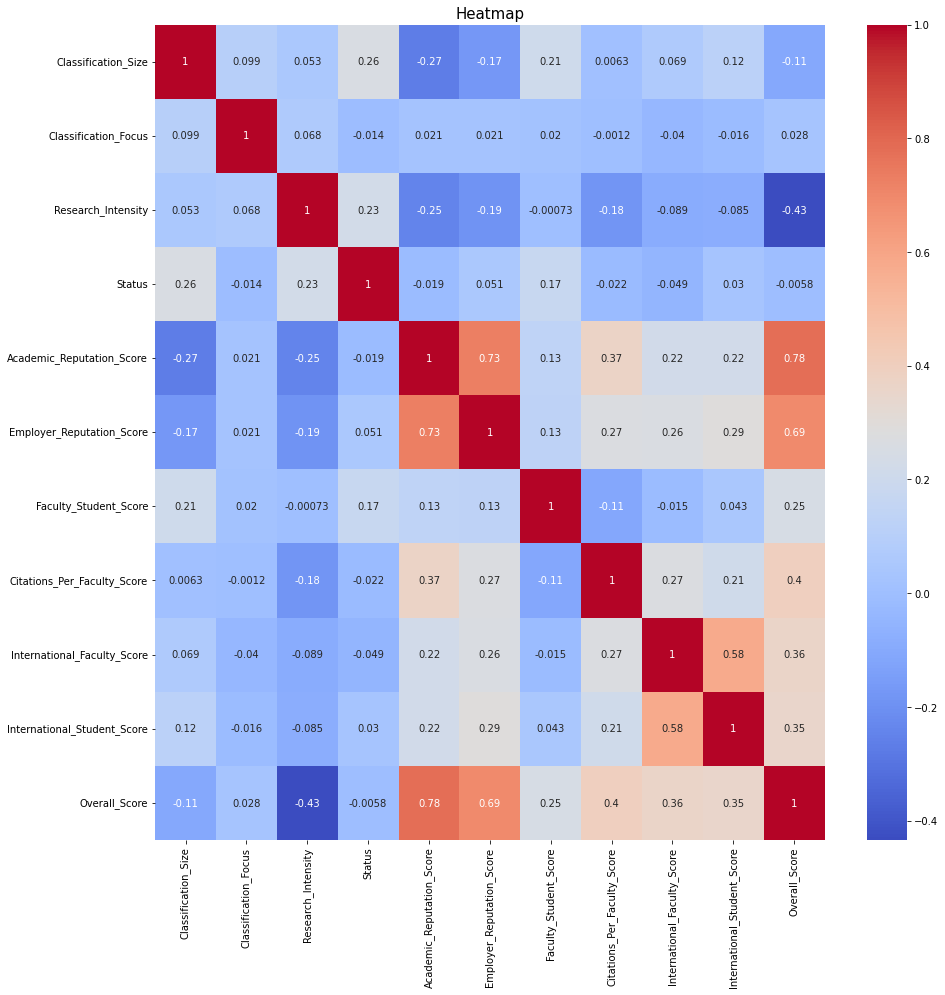

In [383]:
plt.figure(figsize=(15,15))
sns.heatmap(encoded_cat.corr(), cmap='coolwarm', annot=True)
plt.title('Heatmap', fontsize = 15)
plt.show()

### Check for linearity and multicolinearity

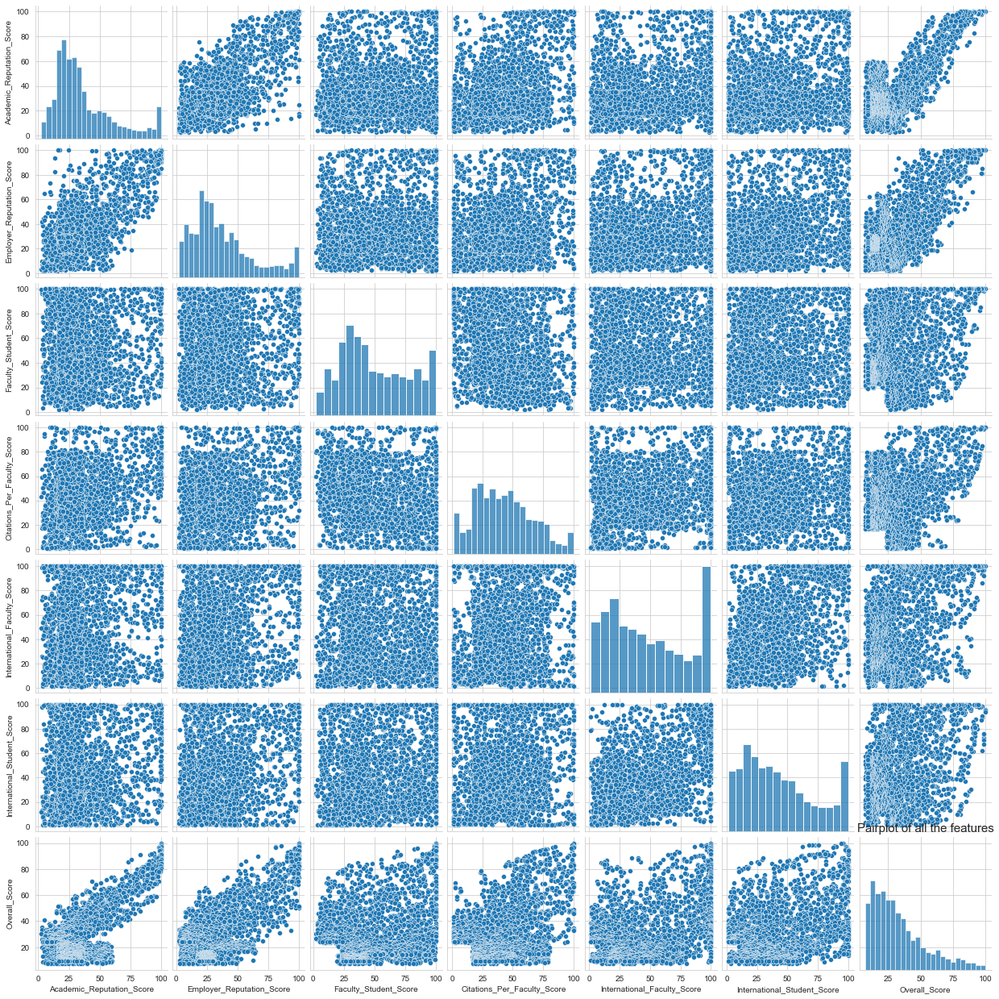

In [384]:
sns.set_style("whitegrid");
sns.pairplot(data);
plt.title('Pairplot of all the features', fontsize = 15)
plt.show();

While a few variables show some sense of relationship (like `academic_reputation_score` and `employer_reputation_score`), it can be said that the dataset is largely not multicolinear.

The bottom row shows that the each of the variables is linearly related to the target variable (`Overall_Score`).

In [385]:
lr = LinearRegression()
dt = DecisionTreeRegressor()
gb = GradientBoostingRegressor()
rf = RandomForestRegressor()
xgb = XGBRegressor()
cbt = CatBoostRegressor()
lass= Lasso()
ridge = Ridge()
models = [lr, dt, gb, rf, xgb, cbt, lass, ridge]
names = ['Linear Regression','DecisionTree','GradientBoosting','RandomForest','XGB','CATBOOST','Lasso','Rige']

In [386]:
def evaluate_models(xTrain, yTrain, xVal, yVal):
    xs = [xTrain, yTrain, xVal, yVal]
    try:
        random_seed= 0
        scores = []
        for i in range(len(models)):
            model = models[i]
            model.fit(xTrain, yTrain)
            y_predicted = model.predict(xVal)
            mse = mean_squared_error(yVal, y_predicted)
            mae = mean_absolute_error(yVal, y_predicted)
            r_squared = r2_score(yVal, y_predicted)
            scores.append({
                'model':names[i],
                'best_score':model.score(xTrain, yTrain),
                'mean_squared_error':mse,
                'mean_absolute_error':mae,
                'R_Squared': r_squared
            })
        return pd.DataFrame(scores, columns=['model','best_score','mean_squared_error','mean_absolute_error', 'R_Squared'])
    except:
        print('Error occured, confirm inputs')

In [387]:
def get_cv(X, y):
    try:
        scores = []
        for i in range(len(models)):
            model = models[i]
            cv = np.mean(np.absolute(cross_val_score(model, X, y, cv = 5, scoring = 'neg_mean_absolute_error')))
            scores.append({'model' : names[i],
                          'CV' : cv})
        return pd.DataFrame(scores, columns = ['model', 'CV'])
    except:
        print('Error occured, confirm inputs')

In [388]:
X = encoded_cat.drop(['Overall_Score'], axis = 1)
y = encoded_cat['Overall_Score']

In [389]:
get_cv(X,y)

Learning rate set to 0.045689
0:	learn: 19.0333539	total: 145ms	remaining: 2m 24s
1:	learn: 18.3993584	total: 148ms	remaining: 1m 13s
2:	learn: 17.8448241	total: 150ms	remaining: 50s
3:	learn: 17.2958519	total: 153ms	remaining: 38.2s
4:	learn: 16.7680738	total: 156ms	remaining: 31.1s
5:	learn: 16.2439518	total: 159ms	remaining: 26.4s
6:	learn: 15.7341445	total: 162ms	remaining: 23s
7:	learn: 15.2873598	total: 170ms	remaining: 21.1s
8:	learn: 14.8631203	total: 174ms	remaining: 19.1s
9:	learn: 14.4604884	total: 177ms	remaining: 17.5s
10:	learn: 14.0587079	total: 180ms	remaining: 16.2s
11:	learn: 13.6770149	total: 183ms	remaining: 15.1s
12:	learn: 13.3162541	total: 187ms	remaining: 14.2s
13:	learn: 13.0254616	total: 191ms	remaining: 13.5s
14:	learn: 12.7303148	total: 194ms	remaining: 12.8s
15:	learn: 12.4165991	total: 197ms	remaining: 12.1s
16:	learn: 12.1661093	total: 201ms	remaining: 11.6s
17:	learn: 11.8967074	total: 204ms	remaining: 11.1s
18:	learn: 11.6621756	total: 206ms	remaining: 

163:	learn: 5.2762981	total: 1.13s	remaining: 5.78s
164:	learn: 5.2659229	total: 1.14s	remaining: 5.76s
165:	learn: 5.2589904	total: 1.14s	remaining: 5.74s
166:	learn: 5.2508135	total: 1.15s	remaining: 5.72s
167:	learn: 5.2419263	total: 1.15s	remaining: 5.7s
168:	learn: 5.2340669	total: 1.16s	remaining: 5.68s
169:	learn: 5.2236330	total: 1.16s	remaining: 5.67s
170:	learn: 5.2207255	total: 1.16s	remaining: 5.65s
171:	learn: 5.2140208	total: 1.17s	remaining: 5.64s
172:	learn: 5.2045852	total: 1.17s	remaining: 5.62s
173:	learn: 5.1992782	total: 1.18s	remaining: 5.59s
174:	learn: 5.1941018	total: 1.18s	remaining: 5.57s
175:	learn: 5.1877198	total: 1.18s	remaining: 5.55s
176:	learn: 5.1791892	total: 1.19s	remaining: 5.52s
177:	learn: 5.1735605	total: 1.19s	remaining: 5.5s
178:	learn: 5.1703793	total: 1.19s	remaining: 5.48s
179:	learn: 5.1612578	total: 1.2s	remaining: 5.46s
180:	learn: 5.1533194	total: 1.2s	remaining: 5.43s
181:	learn: 5.1495025	total: 1.2s	remaining: 5.41s
182:	learn: 5.140

322:	learn: 4.2750495	total: 1.65s	remaining: 3.46s
323:	learn: 4.2706747	total: 1.65s	remaining: 3.45s
324:	learn: 4.2647239	total: 1.66s	remaining: 3.44s
325:	learn: 4.2590340	total: 1.66s	remaining: 3.43s
326:	learn: 4.2524610	total: 1.66s	remaining: 3.42s
327:	learn: 4.2482617	total: 1.66s	remaining: 3.41s
328:	learn: 4.2441303	total: 1.67s	remaining: 3.4s
329:	learn: 4.2391904	total: 1.67s	remaining: 3.39s
330:	learn: 4.2348621	total: 1.67s	remaining: 3.38s
331:	learn: 4.2297215	total: 1.68s	remaining: 3.37s
332:	learn: 4.2261115	total: 1.68s	remaining: 3.36s
333:	learn: 4.2201710	total: 1.68s	remaining: 3.35s
334:	learn: 4.2125345	total: 1.69s	remaining: 3.35s
335:	learn: 4.2086120	total: 1.69s	remaining: 3.34s
336:	learn: 4.2053637	total: 1.69s	remaining: 3.33s
337:	learn: 4.2002047	total: 1.69s	remaining: 3.32s
338:	learn: 4.1934416	total: 1.7s	remaining: 3.31s
339:	learn: 4.1850635	total: 1.7s	remaining: 3.3s
340:	learn: 4.1791995	total: 1.7s	remaining: 3.29s
341:	learn: 4.175

487:	learn: 3.5840363	total: 2.17s	remaining: 2.27s
488:	learn: 3.5808585	total: 2.17s	remaining: 2.27s
489:	learn: 3.5781795	total: 2.17s	remaining: 2.26s
490:	learn: 3.5742121	total: 2.18s	remaining: 2.26s
491:	learn: 3.5700164	total: 2.18s	remaining: 2.25s
492:	learn: 3.5680209	total: 2.18s	remaining: 2.25s
493:	learn: 3.5657108	total: 2.19s	remaining: 2.24s
494:	learn: 3.5623209	total: 2.19s	remaining: 2.23s
495:	learn: 3.5590571	total: 2.19s	remaining: 2.23s
496:	learn: 3.5567827	total: 2.19s	remaining: 2.22s
497:	learn: 3.5540442	total: 2.2s	remaining: 2.22s
498:	learn: 3.5507562	total: 2.2s	remaining: 2.21s
499:	learn: 3.5490576	total: 2.21s	remaining: 2.21s
500:	learn: 3.5431517	total: 2.21s	remaining: 2.2s
501:	learn: 3.5402776	total: 2.21s	remaining: 2.19s
502:	learn: 3.5363030	total: 2.22s	remaining: 2.19s
503:	learn: 3.5310662	total: 2.22s	remaining: 2.18s
504:	learn: 3.5292612	total: 2.22s	remaining: 2.18s
505:	learn: 3.5244611	total: 2.23s	remaining: 2.17s
506:	learn: 3.5

695:	learn: 3.0144862	total: 2.85s	remaining: 1.25s
696:	learn: 3.0129163	total: 2.86s	remaining: 1.24s
697:	learn: 3.0106849	total: 2.86s	remaining: 1.24s
698:	learn: 3.0074325	total: 2.87s	remaining: 1.23s
699:	learn: 3.0059972	total: 2.87s	remaining: 1.23s
700:	learn: 3.0040220	total: 2.87s	remaining: 1.22s
701:	learn: 3.0032504	total: 2.87s	remaining: 1.22s
702:	learn: 3.0003524	total: 2.88s	remaining: 1.22s
703:	learn: 2.9984092	total: 2.88s	remaining: 1.21s
704:	learn: 2.9952963	total: 2.88s	remaining: 1.21s
705:	learn: 2.9948546	total: 2.89s	remaining: 1.2s
706:	learn: 2.9934510	total: 2.89s	remaining: 1.2s
707:	learn: 2.9911100	total: 2.9s	remaining: 1.19s
708:	learn: 2.9904045	total: 2.9s	remaining: 1.19s
709:	learn: 2.9882208	total: 2.9s	remaining: 1.19s
710:	learn: 2.9859736	total: 2.9s	remaining: 1.18s
711:	learn: 2.9834474	total: 2.91s	remaining: 1.18s
712:	learn: 2.9804430	total: 2.91s	remaining: 1.17s
713:	learn: 2.9795841	total: 2.91s	remaining: 1.17s
714:	learn: 2.9782

902:	learn: 2.6190118	total: 3.54s	remaining: 380ms
903:	learn: 2.6173808	total: 3.54s	remaining: 376ms
904:	learn: 2.6155835	total: 3.54s	remaining: 372ms
905:	learn: 2.6146223	total: 3.55s	remaining: 368ms
906:	learn: 2.6123516	total: 3.55s	remaining: 364ms
907:	learn: 2.6101701	total: 3.55s	remaining: 360ms
908:	learn: 2.6085474	total: 3.56s	remaining: 356ms
909:	learn: 2.6074921	total: 3.56s	remaining: 352ms
910:	learn: 2.6060511	total: 3.56s	remaining: 348ms
911:	learn: 2.6049235	total: 3.57s	remaining: 344ms
912:	learn: 2.6031591	total: 3.57s	remaining: 340ms
913:	learn: 2.6002542	total: 3.57s	remaining: 336ms
914:	learn: 2.5978855	total: 3.58s	remaining: 332ms
915:	learn: 2.5971505	total: 3.58s	remaining: 328ms
916:	learn: 2.5959599	total: 3.58s	remaining: 324ms
917:	learn: 2.5945499	total: 3.58s	remaining: 320ms
918:	learn: 2.5934370	total: 3.59s	remaining: 316ms
919:	learn: 2.5912260	total: 3.59s	remaining: 312ms
920:	learn: 2.5899178	total: 3.6s	remaining: 308ms
921:	learn: 2

95:	learn: 6.1563086	total: 341ms	remaining: 3.21s
96:	learn: 6.1339496	total: 345ms	remaining: 3.21s
97:	learn: 6.1213659	total: 351ms	remaining: 3.23s
98:	learn: 6.1059622	total: 362ms	remaining: 3.3s
99:	learn: 6.0891873	total: 366ms	remaining: 3.29s
100:	learn: 6.0733605	total: 369ms	remaining: 3.28s
101:	learn: 6.0650827	total: 372ms	remaining: 3.28s
102:	learn: 6.0498916	total: 375ms	remaining: 3.27s
103:	learn: 6.0406815	total: 381ms	remaining: 3.28s
104:	learn: 6.0270509	total: 384ms	remaining: 3.27s
105:	learn: 6.0218687	total: 387ms	remaining: 3.27s
106:	learn: 6.0018355	total: 391ms	remaining: 3.26s
107:	learn: 5.9946261	total: 394ms	remaining: 3.25s
108:	learn: 5.9832810	total: 397ms	remaining: 3.24s
109:	learn: 5.9749190	total: 403ms	remaining: 3.26s
110:	learn: 5.9628019	total: 408ms	remaining: 3.27s
111:	learn: 5.9528991	total: 411ms	remaining: 3.26s
112:	learn: 5.9376801	total: 414ms	remaining: 3.25s
113:	learn: 5.9201236	total: 418ms	remaining: 3.25s
114:	learn: 5.9098

273:	learn: 4.7692653	total: 1.01s	remaining: 2.69s
274:	learn: 4.7662794	total: 1.02s	remaining: 2.68s
275:	learn: 4.7628204	total: 1.02s	remaining: 2.68s
276:	learn: 4.7574048	total: 1.03s	remaining: 2.68s
277:	learn: 4.7474844	total: 1.03s	remaining: 2.67s
278:	learn: 4.7397882	total: 1.03s	remaining: 2.67s
279:	learn: 4.7343208	total: 1.04s	remaining: 2.67s
280:	learn: 4.7267270	total: 1.04s	remaining: 2.66s
281:	learn: 4.7220542	total: 1.04s	remaining: 2.65s
282:	learn: 4.7144982	total: 1.04s	remaining: 2.65s
283:	learn: 4.7112035	total: 1.05s	remaining: 2.64s
284:	learn: 4.7047376	total: 1.05s	remaining: 2.64s
285:	learn: 4.7001743	total: 1.05s	remaining: 2.63s
286:	learn: 4.6970190	total: 1.06s	remaining: 2.63s
287:	learn: 4.6940645	total: 1.06s	remaining: 2.63s
288:	learn: 4.6873463	total: 1.06s	remaining: 2.62s
289:	learn: 4.6798293	total: 1.07s	remaining: 2.61s
290:	learn: 4.6729920	total: 1.07s	remaining: 2.61s
291:	learn: 4.6659884	total: 1.07s	remaining: 2.6s
292:	learn: 4

474:	learn: 3.9042432	total: 1.71s	remaining: 1.89s
475:	learn: 3.9008721	total: 1.72s	remaining: 1.89s
476:	learn: 3.8974844	total: 1.72s	remaining: 1.89s
477:	learn: 3.8951852	total: 1.73s	remaining: 1.88s
478:	learn: 3.8921656	total: 1.73s	remaining: 1.88s
479:	learn: 3.8878774	total: 1.73s	remaining: 1.88s
480:	learn: 3.8840016	total: 1.73s	remaining: 1.87s
481:	learn: 3.8807834	total: 1.74s	remaining: 1.87s
482:	learn: 3.8789221	total: 1.74s	remaining: 1.86s
483:	learn: 3.8748223	total: 1.74s	remaining: 1.86s
484:	learn: 3.8703106	total: 1.75s	remaining: 1.85s
485:	learn: 3.8647989	total: 1.75s	remaining: 1.85s
486:	learn: 3.8602826	total: 1.75s	remaining: 1.85s
487:	learn: 3.8569055	total: 1.76s	remaining: 1.84s
488:	learn: 3.8511092	total: 1.76s	remaining: 1.84s
489:	learn: 3.8488808	total: 1.76s	remaining: 1.83s
490:	learn: 3.8447174	total: 1.77s	remaining: 1.83s
491:	learn: 3.8396460	total: 1.77s	remaining: 1.83s
492:	learn: 3.8370741	total: 1.77s	remaining: 1.82s
493:	learn: 

681:	learn: 3.3221888	total: 2.4s	remaining: 1.12s
682:	learn: 3.3201539	total: 2.41s	remaining: 1.12s
683:	learn: 3.3182166	total: 2.41s	remaining: 1.11s
684:	learn: 3.3143902	total: 2.41s	remaining: 1.11s
685:	learn: 3.3133336	total: 2.42s	remaining: 1.11s
686:	learn: 3.3109348	total: 2.42s	remaining: 1.1s
687:	learn: 3.3086345	total: 2.42s	remaining: 1.1s
688:	learn: 3.3065815	total: 2.43s	remaining: 1.09s
689:	learn: 3.3052761	total: 2.43s	remaining: 1.09s
690:	learn: 3.3030235	total: 2.43s	remaining: 1.09s
691:	learn: 3.3010733	total: 2.44s	remaining: 1.08s
692:	learn: 3.2992721	total: 2.44s	remaining: 1.08s
693:	learn: 3.2969972	total: 2.44s	remaining: 1.08s
694:	learn: 3.2949685	total: 2.44s	remaining: 1.07s
695:	learn: 3.2928495	total: 2.45s	remaining: 1.07s
696:	learn: 3.2909974	total: 2.45s	remaining: 1.07s
697:	learn: 3.2882165	total: 2.46s	remaining: 1.06s
698:	learn: 3.2872576	total: 2.46s	remaining: 1.06s
699:	learn: 3.2847726	total: 2.46s	remaining: 1.05s
700:	learn: 3.2

866:	learn: 2.9119513	total: 3.07s	remaining: 471ms
867:	learn: 2.9103300	total: 3.07s	remaining: 467ms
868:	learn: 2.9093085	total: 3.08s	remaining: 464ms
869:	learn: 2.9075595	total: 3.08s	remaining: 461ms
870:	learn: 2.9062517	total: 3.09s	remaining: 457ms
871:	learn: 2.9035950	total: 3.09s	remaining: 454ms
872:	learn: 2.9020845	total: 3.1s	remaining: 450ms
873:	learn: 2.9001128	total: 3.1s	remaining: 447ms
874:	learn: 2.8976125	total: 3.11s	remaining: 444ms
875:	learn: 2.8961089	total: 3.11s	remaining: 440ms
876:	learn: 2.8939437	total: 3.11s	remaining: 437ms
877:	learn: 2.8919171	total: 3.12s	remaining: 433ms
878:	learn: 2.8902258	total: 3.12s	remaining: 430ms
879:	learn: 2.8872471	total: 3.12s	remaining: 426ms
880:	learn: 2.8833700	total: 3.13s	remaining: 423ms
881:	learn: 2.8815995	total: 3.13s	remaining: 419ms
882:	learn: 2.8792850	total: 3.14s	remaining: 416ms
883:	learn: 2.8774180	total: 3.14s	remaining: 412ms
884:	learn: 2.8757336	total: 3.14s	remaining: 409ms
885:	learn: 2.

44:	learn: 6.5310028	total: 170ms	remaining: 3.6s
45:	learn: 6.4345744	total: 174ms	remaining: 3.6s
46:	learn: 6.3635860	total: 178ms	remaining: 3.6s
47:	learn: 6.2865586	total: 182ms	remaining: 3.6s
48:	learn: 6.2106925	total: 189ms	remaining: 3.67s
49:	learn: 6.1384507	total: 193ms	remaining: 3.67s
50:	learn: 6.0609524	total: 200ms	remaining: 3.71s
51:	learn: 5.9958122	total: 203ms	remaining: 3.69s
52:	learn: 5.9277843	total: 206ms	remaining: 3.69s
53:	learn: 5.8773573	total: 209ms	remaining: 3.67s
54:	learn: 5.8250561	total: 213ms	remaining: 3.66s
55:	learn: 5.7645064	total: 217ms	remaining: 3.66s
56:	learn: 5.7135615	total: 221ms	remaining: 3.65s
57:	learn: 5.6558358	total: 224ms	remaining: 3.64s
58:	learn: 5.5984268	total: 228ms	remaining: 3.63s
59:	learn: 5.5491081	total: 233ms	remaining: 3.65s
60:	learn: 5.5106495	total: 237ms	remaining: 3.65s
61:	learn: 5.4717528	total: 247ms	remaining: 3.74s
62:	learn: 5.4457233	total: 251ms	remaining: 3.73s
63:	learn: 5.3985563	total: 256ms	r

218:	learn: 3.6466794	total: 847ms	remaining: 3.02s
219:	learn: 3.6411223	total: 851ms	remaining: 3.02s
220:	learn: 3.6351536	total: 855ms	remaining: 3.01s
221:	learn: 3.6292336	total: 858ms	remaining: 3.01s
222:	learn: 3.6268359	total: 861ms	remaining: 3s
223:	learn: 3.6231194	total: 865ms	remaining: 3s
224:	learn: 3.6155849	total: 872ms	remaining: 3s
225:	learn: 3.6112934	total: 876ms	remaining: 3s
226:	learn: 3.6046733	total: 881ms	remaining: 3s
227:	learn: 3.6023029	total: 885ms	remaining: 3s
228:	learn: 3.5984924	total: 888ms	remaining: 2.99s
229:	learn: 3.5925103	total: 891ms	remaining: 2.98s
230:	learn: 3.5848832	total: 895ms	remaining: 2.98s
231:	learn: 3.5803632	total: 898ms	remaining: 2.97s
232:	learn: 3.5711739	total: 901ms	remaining: 2.97s
233:	learn: 3.5671374	total: 904ms	remaining: 2.96s
234:	learn: 3.5613305	total: 908ms	remaining: 2.95s
235:	learn: 3.5573128	total: 911ms	remaining: 2.95s
236:	learn: 3.5514836	total: 914ms	remaining: 2.94s
237:	learn: 3.5492504	total: 9

404:	learn: 2.8814487	total: 1.68s	remaining: 2.47s
405:	learn: 2.8783245	total: 1.68s	remaining: 2.46s
406:	learn: 2.8752892	total: 1.69s	remaining: 2.46s
407:	learn: 2.8738721	total: 1.69s	remaining: 2.45s
408:	learn: 2.8728514	total: 1.69s	remaining: 2.45s
409:	learn: 2.8694321	total: 1.7s	remaining: 2.44s
410:	learn: 2.8684415	total: 1.7s	remaining: 2.44s
411:	learn: 2.8665499	total: 1.7s	remaining: 2.43s
412:	learn: 2.8628099	total: 1.71s	remaining: 2.43s
413:	learn: 2.8594742	total: 1.71s	remaining: 2.42s
414:	learn: 2.8566977	total: 1.72s	remaining: 2.42s
415:	learn: 2.8543719	total: 1.72s	remaining: 2.41s
416:	learn: 2.8490593	total: 1.72s	remaining: 2.41s
417:	learn: 2.8469876	total: 1.73s	remaining: 2.4s
418:	learn: 2.8432756	total: 1.73s	remaining: 2.4s
419:	learn: 2.8390673	total: 1.73s	remaining: 2.39s
420:	learn: 2.8357281	total: 1.74s	remaining: 2.39s
421:	learn: 2.8349379	total: 1.74s	remaining: 2.38s
422:	learn: 2.8318895	total: 1.75s	remaining: 2.38s
423:	learn: 2.829

592:	learn: 2.4140345	total: 2.37s	remaining: 1.62s
593:	learn: 2.4120957	total: 2.37s	remaining: 1.62s
594:	learn: 2.4103503	total: 2.37s	remaining: 1.61s
595:	learn: 2.4065113	total: 2.38s	remaining: 1.61s
596:	learn: 2.4049764	total: 2.38s	remaining: 1.61s
597:	learn: 2.4030324	total: 2.38s	remaining: 1.6s
598:	learn: 2.3993915	total: 2.39s	remaining: 1.6s
599:	learn: 2.3970447	total: 2.4s	remaining: 1.6s
600:	learn: 2.3955965	total: 2.4s	remaining: 1.59s
601:	learn: 2.3931068	total: 2.4s	remaining: 1.59s
602:	learn: 2.3912449	total: 2.41s	remaining: 1.59s
603:	learn: 2.3891616	total: 2.41s	remaining: 1.58s
604:	learn: 2.3876166	total: 2.42s	remaining: 1.58s
605:	learn: 2.3856260	total: 2.42s	remaining: 1.57s
606:	learn: 2.3833840	total: 2.42s	remaining: 1.57s
607:	learn: 2.3811773	total: 2.43s	remaining: 1.57s
608:	learn: 2.3792552	total: 2.44s	remaining: 1.56s
609:	learn: 2.3778621	total: 2.44s	remaining: 1.56s
610:	learn: 2.3758346	total: 2.44s	remaining: 1.55s
611:	learn: 2.3737

789:	learn: 2.0551086	total: 3.22s	remaining: 856ms
790:	learn: 2.0536227	total: 3.22s	remaining: 852ms
791:	learn: 2.0527510	total: 3.23s	remaining: 848ms
792:	learn: 2.0501114	total: 3.23s	remaining: 844ms
793:	learn: 2.0484072	total: 3.23s	remaining: 839ms
794:	learn: 2.0469180	total: 3.24s	remaining: 835ms
795:	learn: 2.0455247	total: 3.24s	remaining: 831ms
796:	learn: 2.0443793	total: 3.25s	remaining: 827ms
797:	learn: 2.0438838	total: 3.25s	remaining: 822ms
798:	learn: 2.0430572	total: 3.25s	remaining: 818ms
799:	learn: 2.0423529	total: 3.25s	remaining: 814ms
800:	learn: 2.0403260	total: 3.26s	remaining: 810ms
801:	learn: 2.0374776	total: 3.26s	remaining: 805ms
802:	learn: 2.0361543	total: 3.26s	remaining: 801ms
803:	learn: 2.0351513	total: 3.27s	remaining: 797ms
804:	learn: 2.0326168	total: 3.27s	remaining: 792ms
805:	learn: 2.0315173	total: 3.27s	remaining: 788ms
806:	learn: 2.0299242	total: 3.28s	remaining: 784ms
807:	learn: 2.0282304	total: 3.28s	remaining: 780ms
808:	learn: 

972:	learn: 1.8019116	total: 4.1s	remaining: 114ms
973:	learn: 1.8007117	total: 4.11s	remaining: 110ms
974:	learn: 1.7990769	total: 4.11s	remaining: 105ms
975:	learn: 1.7984801	total: 4.11s	remaining: 101ms
976:	learn: 1.7974789	total: 4.12s	remaining: 96.9ms
977:	learn: 1.7968242	total: 4.12s	remaining: 92.6ms
978:	learn: 1.7948474	total: 4.12s	remaining: 88.4ms
979:	learn: 1.7936341	total: 4.12s	remaining: 84.2ms
980:	learn: 1.7928011	total: 4.13s	remaining: 79.9ms
981:	learn: 1.7918488	total: 4.13s	remaining: 75.7ms
982:	learn: 1.7913205	total: 4.13s	remaining: 71.5ms
983:	learn: 1.7900816	total: 4.14s	remaining: 67.3ms
984:	learn: 1.7891164	total: 4.14s	remaining: 63.1ms
985:	learn: 1.7873717	total: 4.14s	remaining: 58.8ms
986:	learn: 1.7843406	total: 4.15s	remaining: 54.6ms
987:	learn: 1.7830366	total: 4.15s	remaining: 50.4ms
988:	learn: 1.7819620	total: 4.16s	remaining: 46.2ms
989:	learn: 1.7798379	total: 4.16s	remaining: 42ms
990:	learn: 1.7789453	total: 4.16s	remaining: 37.8ms


177:	learn: 5.3357060	total: 540ms	remaining: 2.49s
178:	learn: 5.3295319	total: 543ms	remaining: 2.49s
179:	learn: 5.3224300	total: 546ms	remaining: 2.49s
180:	learn: 5.3145708	total: 550ms	remaining: 2.49s
181:	learn: 5.3104443	total: 554ms	remaining: 2.49s
182:	learn: 5.2993092	total: 557ms	remaining: 2.49s
183:	learn: 5.2955722	total: 560ms	remaining: 2.48s
184:	learn: 5.2853611	total: 563ms	remaining: 2.48s
185:	learn: 5.2810280	total: 566ms	remaining: 2.48s
186:	learn: 5.2750455	total: 569ms	remaining: 2.47s
187:	learn: 5.2690812	total: 572ms	remaining: 2.47s
188:	learn: 5.2622354	total: 575ms	remaining: 2.47s
189:	learn: 5.2551275	total: 578ms	remaining: 2.47s
190:	learn: 5.2515033	total: 582ms	remaining: 2.46s
191:	learn: 5.2359538	total: 585ms	remaining: 2.46s
192:	learn: 5.2228894	total: 587ms	remaining: 2.46s
193:	learn: 5.2183052	total: 590ms	remaining: 2.45s
194:	learn: 5.2097996	total: 593ms	remaining: 2.45s
195:	learn: 5.2027782	total: 596ms	remaining: 2.44s
196:	learn: 

353:	learn: 4.3297444	total: 1.23s	remaining: 2.25s
354:	learn: 4.3262515	total: 1.24s	remaining: 2.25s
355:	learn: 4.3229540	total: 1.24s	remaining: 2.25s
356:	learn: 4.3152579	total: 1.25s	remaining: 2.24s
357:	learn: 4.3123602	total: 1.25s	remaining: 2.24s
358:	learn: 4.3102276	total: 1.25s	remaining: 2.24s
359:	learn: 4.3038487	total: 1.26s	remaining: 2.24s
360:	learn: 4.2976890	total: 1.26s	remaining: 2.23s
361:	learn: 4.2932339	total: 1.27s	remaining: 2.23s
362:	learn: 4.2880146	total: 1.27s	remaining: 2.23s
363:	learn: 4.2837414	total: 1.27s	remaining: 2.23s
364:	learn: 4.2813904	total: 1.28s	remaining: 2.22s
365:	learn: 4.2765577	total: 1.28s	remaining: 2.22s
366:	learn: 4.2700466	total: 1.28s	remaining: 2.21s
367:	learn: 4.2640229	total: 1.29s	remaining: 2.21s
368:	learn: 4.2600800	total: 1.29s	remaining: 2.21s
369:	learn: 4.2567625	total: 1.29s	remaining: 2.21s
370:	learn: 4.2525066	total: 1.3s	remaining: 2.2s
371:	learn: 4.2469883	total: 1.3s	remaining: 2.2s
372:	learn: 4.23

548:	learn: 3.6205549	total: 1.91s	remaining: 1.57s
549:	learn: 3.6187974	total: 1.92s	remaining: 1.57s
550:	learn: 3.6143438	total: 1.92s	remaining: 1.56s
551:	learn: 3.6128990	total: 1.92s	remaining: 1.56s
552:	learn: 3.6102777	total: 1.92s	remaining: 1.55s
553:	learn: 3.6062103	total: 1.93s	remaining: 1.55s
554:	learn: 3.6034999	total: 1.93s	remaining: 1.55s
555:	learn: 3.6002298	total: 1.93s	remaining: 1.54s
556:	learn: 3.5977950	total: 1.94s	remaining: 1.54s
557:	learn: 3.5944241	total: 1.94s	remaining: 1.54s
558:	learn: 3.5925834	total: 1.94s	remaining: 1.53s
559:	learn: 3.5904479	total: 1.95s	remaining: 1.53s
560:	learn: 3.5880980	total: 1.95s	remaining: 1.52s
561:	learn: 3.5850418	total: 1.95s	remaining: 1.52s
562:	learn: 3.5832301	total: 1.96s	remaining: 1.52s
563:	learn: 3.5805455	total: 1.96s	remaining: 1.51s
564:	learn: 3.5764736	total: 1.96s	remaining: 1.51s
565:	learn: 3.5736913	total: 1.96s	remaining: 1.51s
566:	learn: 3.5717374	total: 1.97s	remaining: 1.5s
567:	learn: 3

742:	learn: 3.1420941	total: 2.77s	remaining: 960ms
743:	learn: 3.1406807	total: 2.78s	remaining: 956ms
744:	learn: 3.1374570	total: 2.78s	remaining: 952ms
745:	learn: 3.1361865	total: 2.78s	remaining: 948ms
746:	learn: 3.1337513	total: 2.79s	remaining: 944ms
747:	learn: 3.1316539	total: 2.79s	remaining: 940ms
748:	learn: 3.1304342	total: 2.79s	remaining: 936ms
749:	learn: 3.1288154	total: 2.8s	remaining: 932ms
750:	learn: 3.1266666	total: 2.8s	remaining: 928ms
751:	learn: 3.1231420	total: 2.8s	remaining: 924ms
752:	learn: 3.1214475	total: 2.81s	remaining: 920ms
753:	learn: 3.1200049	total: 2.81s	remaining: 916ms
754:	learn: 3.1172637	total: 2.81s	remaining: 912ms
755:	learn: 3.1163290	total: 2.81s	remaining: 908ms
756:	learn: 3.1148220	total: 2.82s	remaining: 904ms
757:	learn: 3.1131762	total: 2.82s	remaining: 900ms
758:	learn: 3.1097748	total: 2.82s	remaining: 896ms
759:	learn: 3.1071209	total: 2.83s	remaining: 892ms
760:	learn: 3.1048576	total: 2.83s	remaining: 889ms
761:	learn: 3.1

908:	learn: 2.8056362	total: 3.29s	remaining: 329ms
909:	learn: 2.8052330	total: 3.29s	remaining: 326ms
910:	learn: 2.8033132	total: 3.3s	remaining: 322ms
911:	learn: 2.8019412	total: 3.3s	remaining: 318ms
912:	learn: 2.8010614	total: 3.31s	remaining: 315ms
913:	learn: 2.7972140	total: 3.31s	remaining: 311ms
914:	learn: 2.7943700	total: 3.31s	remaining: 308ms
915:	learn: 2.7928386	total: 3.31s	remaining: 304ms
916:	learn: 2.7918611	total: 3.32s	remaining: 300ms
917:	learn: 2.7911621	total: 3.32s	remaining: 297ms
918:	learn: 2.7888386	total: 3.32s	remaining: 293ms
919:	learn: 2.7876964	total: 3.33s	remaining: 289ms
920:	learn: 2.7851345	total: 3.33s	remaining: 286ms
921:	learn: 2.7833101	total: 3.33s	remaining: 282ms
922:	learn: 2.7816956	total: 3.34s	remaining: 278ms
923:	learn: 2.7803601	total: 3.34s	remaining: 275ms
924:	learn: 2.7790404	total: 3.34s	remaining: 271ms
925:	learn: 2.7762585	total: 3.35s	remaining: 267ms
926:	learn: 2.7754889	total: 3.35s	remaining: 264ms
927:	learn: 2.

78:	learn: 6.0889609	total: 346ms	remaining: 4.04s
79:	learn: 6.0667016	total: 350ms	remaining: 4.03s
80:	learn: 6.0443735	total: 353ms	remaining: 4.01s
81:	learn: 6.0219532	total: 356ms	remaining: 3.99s
82:	learn: 5.9973817	total: 360ms	remaining: 3.97s
83:	learn: 5.9812937	total: 363ms	remaining: 3.95s
84:	learn: 5.9597948	total: 365ms	remaining: 3.93s
85:	learn: 5.9329769	total: 368ms	remaining: 3.91s
86:	learn: 5.9068930	total: 372ms	remaining: 3.9s
87:	learn: 5.8907250	total: 376ms	remaining: 3.89s
88:	learn: 5.8692843	total: 379ms	remaining: 3.87s
89:	learn: 5.8572501	total: 381ms	remaining: 3.86s
90:	learn: 5.8372579	total: 385ms	remaining: 3.85s
91:	learn: 5.8152081	total: 388ms	remaining: 3.83s
92:	learn: 5.8034979	total: 392ms	remaining: 3.82s
93:	learn: 5.7864350	total: 394ms	remaining: 3.8s
94:	learn: 5.7628021	total: 397ms	remaining: 3.78s
95:	learn: 5.7490072	total: 401ms	remaining: 3.77s
96:	learn: 5.7266142	total: 404ms	remaining: 3.76s
97:	learn: 5.7152913	total: 407ms

253:	learn: 4.3742044	total: 1.25s	remaining: 3.66s
254:	learn: 4.3696918	total: 1.25s	remaining: 3.65s
255:	learn: 4.3590012	total: 1.25s	remaining: 3.65s
256:	learn: 4.3537807	total: 1.26s	remaining: 3.64s
257:	learn: 4.3508690	total: 1.26s	remaining: 3.63s
258:	learn: 4.3464960	total: 1.26s	remaining: 3.62s
259:	learn: 4.3420696	total: 1.27s	remaining: 3.61s
260:	learn: 4.3356654	total: 1.27s	remaining: 3.6s
261:	learn: 4.3325025	total: 1.28s	remaining: 3.6s
262:	learn: 4.3231297	total: 1.28s	remaining: 3.59s
263:	learn: 4.3174511	total: 1.28s	remaining: 3.58s
264:	learn: 4.3091605	total: 1.29s	remaining: 3.58s
265:	learn: 4.3000126	total: 1.3s	remaining: 3.58s
266:	learn: 4.2937466	total: 1.3s	remaining: 3.57s
267:	learn: 4.2889641	total: 1.3s	remaining: 3.56s
268:	learn: 4.2828839	total: 1.31s	remaining: 3.55s
269:	learn: 4.2746367	total: 1.31s	remaining: 3.54s
270:	learn: 4.2721059	total: 1.32s	remaining: 3.54s
271:	learn: 4.2680308	total: 1.32s	remaining: 3.54s
272:	learn: 4.264

435:	learn: 3.5671323	total: 1.92s	remaining: 2.49s
436:	learn: 3.5642113	total: 1.93s	remaining: 2.49s
437:	learn: 3.5597978	total: 1.93s	remaining: 2.48s
438:	learn: 3.5574395	total: 1.94s	remaining: 2.48s
439:	learn: 3.5553247	total: 1.94s	remaining: 2.47s
440:	learn: 3.5497782	total: 1.95s	remaining: 2.47s
441:	learn: 3.5458885	total: 1.95s	remaining: 2.46s
442:	learn: 3.5398428	total: 1.95s	remaining: 2.46s
443:	learn: 3.5355307	total: 1.97s	remaining: 2.46s
444:	learn: 3.5330154	total: 1.97s	remaining: 2.46s
445:	learn: 3.5303500	total: 1.98s	remaining: 2.46s
446:	learn: 3.5273200	total: 1.98s	remaining: 2.45s
447:	learn: 3.5226105	total: 1.99s	remaining: 2.45s
448:	learn: 3.5206155	total: 1.99s	remaining: 2.44s
449:	learn: 3.5170682	total: 2s	remaining: 2.44s
450:	learn: 3.5141214	total: 2s	remaining: 2.44s
451:	learn: 3.5113555	total: 2.01s	remaining: 2.44s
452:	learn: 3.5085033	total: 2.01s	remaining: 2.43s
453:	learn: 3.5010082	total: 2.02s	remaining: 2.43s
454:	learn: 3.4964

633:	learn: 3.0068473	total: 2.77s	remaining: 1.6s
634:	learn: 3.0049676	total: 2.77s	remaining: 1.59s
635:	learn: 3.0038207	total: 2.78s	remaining: 1.59s
636:	learn: 2.9998696	total: 2.78s	remaining: 1.58s
637:	learn: 2.9981370	total: 2.78s	remaining: 1.58s
638:	learn: 2.9948955	total: 2.79s	remaining: 1.58s
639:	learn: 2.9932498	total: 2.8s	remaining: 1.57s
640:	learn: 2.9909078	total: 2.8s	remaining: 1.57s
641:	learn: 2.9883371	total: 2.81s	remaining: 1.56s
642:	learn: 2.9837943	total: 2.81s	remaining: 1.56s
643:	learn: 2.9791440	total: 2.82s	remaining: 1.56s
644:	learn: 2.9763571	total: 2.82s	remaining: 1.55s
645:	learn: 2.9738622	total: 2.83s	remaining: 1.55s
646:	learn: 2.9713578	total: 2.83s	remaining: 1.54s
647:	learn: 2.9670531	total: 2.84s	remaining: 1.54s
648:	learn: 2.9652258	total: 2.84s	remaining: 1.54s
649:	learn: 2.9641701	total: 2.85s	remaining: 1.53s
650:	learn: 2.9625838	total: 2.85s	remaining: 1.53s
651:	learn: 2.9604521	total: 2.85s	remaining: 1.52s
652:	learn: 2.9

801:	learn: 2.6334266	total: 3.45s	remaining: 852ms
802:	learn: 2.6326429	total: 3.46s	remaining: 848ms
803:	learn: 2.6311327	total: 3.46s	remaining: 843ms
804:	learn: 2.6299022	total: 3.46s	remaining: 839ms
805:	learn: 2.6275636	total: 3.47s	remaining: 835ms
806:	learn: 2.6259684	total: 3.47s	remaining: 830ms
807:	learn: 2.6247082	total: 3.48s	remaining: 826ms
808:	learn: 2.6227258	total: 3.48s	remaining: 822ms
809:	learn: 2.6216299	total: 3.48s	remaining: 817ms
810:	learn: 2.6200237	total: 3.49s	remaining: 813ms
811:	learn: 2.6186750	total: 3.49s	remaining: 808ms
812:	learn: 2.6172009	total: 3.5s	remaining: 804ms
813:	learn: 2.6157337	total: 3.5s	remaining: 799ms
814:	learn: 2.6123237	total: 3.5s	remaining: 795ms
815:	learn: 2.6109716	total: 3.5s	remaining: 790ms
816:	learn: 2.6097193	total: 3.51s	remaining: 786ms
817:	learn: 2.6086000	total: 3.51s	remaining: 781ms
818:	learn: 2.6083296	total: 3.51s	remaining: 776ms
819:	learn: 2.6049259	total: 3.52s	remaining: 772ms
820:	learn: 2.60

993:	learn: 2.3111044	total: 4.14s	remaining: 25ms
994:	learn: 2.3106685	total: 4.14s	remaining: 20.8ms
995:	learn: 2.3081610	total: 4.14s	remaining: 16.6ms
996:	learn: 2.3064087	total: 4.15s	remaining: 12.5ms
997:	learn: 2.3050783	total: 4.15s	remaining: 8.32ms
998:	learn: 2.3039141	total: 4.15s	remaining: 4.16ms
999:	learn: 2.3022792	total: 4.16s	remaining: 0us


,model,CV
0,Linear Regression,10.105776
1,DecisionTree,7.563331
2,GradientBoosting,7.055420
3,RandomForest,6.412204
4,XGB,6.686012
5,CATBOOST,5.975766
6,Lasso,10.762825
7,Rige,10.107427


In [390]:
xtrain, xtest, ytrain, ytest = train_test_split(X, y, test_size = 0.3)

In [391]:
evaluate_models(xtrain, ytrain, xtest, ytest)

Learning rate set to 0.044736
0:	learn: 19.9306102	total: 3.11ms	remaining: 3.11s
1:	learn: 19.2689636	total: 7.51ms	remaining: 3.75s
2:	learn: 18.7059817	total: 12.8ms	remaining: 4.26s
3:	learn: 18.1243981	total: 15.9ms	remaining: 3.97s
4:	learn: 17.5653498	total: 18.8ms	remaining: 3.74s
5:	learn: 17.0127770	total: 22.4ms	remaining: 3.7s
6:	learn: 16.4782200	total: 25.6ms	remaining: 3.63s
7:	learn: 16.0389673	total: 30.2ms	remaining: 3.75s
8:	learn: 15.5921128	total: 33.7ms	remaining: 3.71s
9:	learn: 15.1624891	total: 36.7ms	remaining: 3.64s
10:	learn: 14.7243845	total: 40ms	remaining: 3.6s
11:	learn: 14.3040262	total: 44.7ms	remaining: 3.68s
12:	learn: 13.9229807	total: 47.7ms	remaining: 3.62s
13:	learn: 13.6146924	total: 51.6ms	remaining: 3.63s
14:	learn: 13.2452706	total: 55ms	remaining: 3.61s
15:	learn: 12.9134992	total: 58.1ms	remaining: 3.57s
16:	learn: 12.5889941	total: 61.2ms	remaining: 3.54s
17:	learn: 12.2871558	total: 64.1ms	remaining: 3.5s
18:	learn: 12.0186542	total: 66.9

183:	learn: 4.9372772	total: 685ms	remaining: 3.04s
184:	learn: 4.9294732	total: 688ms	remaining: 3.03s
185:	learn: 4.9159123	total: 693ms	remaining: 3.03s
186:	learn: 4.9079781	total: 697ms	remaining: 3.03s
187:	learn: 4.9017974	total: 701ms	remaining: 3.03s
188:	learn: 4.8924709	total: 704ms	remaining: 3.02s
189:	learn: 4.8879649	total: 707ms	remaining: 3.01s
190:	learn: 4.8840884	total: 710ms	remaining: 3.01s
191:	learn: 4.8781032	total: 721ms	remaining: 3.03s
192:	learn: 4.8751324	total: 726ms	remaining: 3.03s
193:	learn: 4.8634593	total: 730ms	remaining: 3.03s
194:	learn: 4.8585302	total: 734ms	remaining: 3.03s
195:	learn: 4.8511979	total: 738ms	remaining: 3.03s
196:	learn: 4.8431752	total: 742ms	remaining: 3.02s
197:	learn: 4.8355271	total: 745ms	remaining: 3.02s
198:	learn: 4.8284763	total: 748ms	remaining: 3.01s
199:	learn: 4.8161419	total: 751ms	remaining: 3s
200:	learn: 4.8100992	total: 754ms	remaining: 3s
201:	learn: 4.8037201	total: 757ms	remaining: 2.99s
202:	learn: 4.7953

368:	learn: 3.9622522	total: 1.37s	remaining: 2.34s
369:	learn: 3.9576395	total: 1.37s	remaining: 2.33s
370:	learn: 3.9518368	total: 1.37s	remaining: 2.33s
371:	learn: 3.9475896	total: 1.38s	remaining: 2.33s
372:	learn: 3.9429391	total: 1.38s	remaining: 2.32s
373:	learn: 3.9384571	total: 1.38s	remaining: 2.31s
374:	learn: 3.9344120	total: 1.39s	remaining: 2.31s
375:	learn: 3.9302232	total: 1.39s	remaining: 2.31s
376:	learn: 3.9244607	total: 1.39s	remaining: 2.3s
377:	learn: 3.9214449	total: 1.4s	remaining: 2.3s
378:	learn: 3.9183175	total: 1.4s	remaining: 2.29s
379:	learn: 3.9149680	total: 1.4s	remaining: 2.29s
380:	learn: 3.9120753	total: 1.41s	remaining: 2.29s
381:	learn: 3.9090642	total: 1.41s	remaining: 2.28s
382:	learn: 3.9064430	total: 1.41s	remaining: 2.27s
383:	learn: 3.8995429	total: 1.42s	remaining: 2.27s
384:	learn: 3.8967308	total: 1.42s	remaining: 2.27s
385:	learn: 3.8922350	total: 1.42s	remaining: 2.26s
386:	learn: 3.8889779	total: 1.43s	remaining: 2.26s
387:	learn: 3.886

560:	learn: 3.2644242	total: 2.04s	remaining: 1.6s
561:	learn: 3.2622404	total: 2.04s	remaining: 1.59s
562:	learn: 3.2575603	total: 2.05s	remaining: 1.59s
563:	learn: 3.2555550	total: 2.05s	remaining: 1.59s
564:	learn: 3.2515363	total: 2.06s	remaining: 1.58s
565:	learn: 3.2495226	total: 2.06s	remaining: 1.58s
566:	learn: 3.2457364	total: 2.06s	remaining: 1.57s
567:	learn: 3.2437426	total: 2.06s	remaining: 1.57s
568:	learn: 3.2419821	total: 2.07s	remaining: 1.57s
569:	learn: 3.2375446	total: 2.07s	remaining: 1.56s
570:	learn: 3.2326453	total: 2.08s	remaining: 1.56s
571:	learn: 3.2313356	total: 2.08s	remaining: 1.56s
572:	learn: 3.2297474	total: 2.08s	remaining: 1.55s
573:	learn: 3.2277074	total: 2.09s	remaining: 1.55s
574:	learn: 3.2247975	total: 2.1s	remaining: 1.55s
575:	learn: 3.2231501	total: 2.1s	remaining: 1.55s
576:	learn: 3.2201461	total: 2.1s	remaining: 1.54s
577:	learn: 3.2172470	total: 2.11s	remaining: 1.54s
578:	learn: 3.2122462	total: 2.11s	remaining: 1.53s
579:	learn: 3.21

746:	learn: 2.7749182	total: 2.72s	remaining: 920ms
747:	learn: 2.7729349	total: 2.72s	remaining: 917ms
748:	learn: 2.7713230	total: 2.72s	remaining: 913ms
749:	learn: 2.7692266	total: 2.73s	remaining: 910ms
750:	learn: 2.7671574	total: 2.73s	remaining: 906ms
751:	learn: 2.7644123	total: 2.74s	remaining: 902ms
752:	learn: 2.7624385	total: 2.74s	remaining: 899ms
753:	learn: 2.7607959	total: 2.74s	remaining: 895ms
754:	learn: 2.7576963	total: 2.75s	remaining: 891ms
755:	learn: 2.7545302	total: 2.75s	remaining: 888ms
756:	learn: 2.7521787	total: 2.75s	remaining: 884ms
757:	learn: 2.7484068	total: 2.76s	remaining: 880ms
758:	learn: 2.7461793	total: 2.76s	remaining: 876ms
759:	learn: 2.7450155	total: 2.76s	remaining: 872ms
760:	learn: 2.7431307	total: 2.77s	remaining: 869ms
761:	learn: 2.7412564	total: 2.77s	remaining: 866ms
762:	learn: 2.7405409	total: 2.78s	remaining: 863ms
763:	learn: 2.7394881	total: 2.78s	remaining: 859ms
764:	learn: 2.7385639	total: 2.78s	remaining: 855ms
765:	learn: 

947:	learn: 2.3996924	total: 3.4s	remaining: 187ms
948:	learn: 2.3981333	total: 3.4s	remaining: 183ms
949:	learn: 2.3959600	total: 3.41s	remaining: 179ms
950:	learn: 2.3941050	total: 3.41s	remaining: 176ms
951:	learn: 2.3926732	total: 3.41s	remaining: 172ms
952:	learn: 2.3909426	total: 3.42s	remaining: 168ms
953:	learn: 2.3897061	total: 3.42s	remaining: 165ms
954:	learn: 2.3887216	total: 3.42s	remaining: 161ms
955:	learn: 2.3883994	total: 3.42s	remaining: 158ms
956:	learn: 2.3865133	total: 3.43s	remaining: 154ms
957:	learn: 2.3845870	total: 3.44s	remaining: 151ms
958:	learn: 2.3831110	total: 3.44s	remaining: 147ms
959:	learn: 2.3818363	total: 3.44s	remaining: 143ms
960:	learn: 2.3813096	total: 3.44s	remaining: 140ms
961:	learn: 2.3802401	total: 3.45s	remaining: 136ms
962:	learn: 2.3782880	total: 3.45s	remaining: 133ms
963:	learn: 2.3759911	total: 3.45s	remaining: 129ms
964:	learn: 2.3750900	total: 3.46s	remaining: 125ms
965:	learn: 2.3733139	total: 3.46s	remaining: 122ms
966:	learn: 2.

,model,best_score,mean_squared_error,mean_absolute_error,R_Squared
0,Linear Regression,0.772583,111.187900,8.348661,0.741457
1,DecisionTree,1.000000,71.639760,5.368043,0.833418
2,GradientBoosting,0.940365,44.011814,4.921276,0.897660
3,RandomForest,0.990599,38.988806,4.078897,0.909340
4,XGB,0.998616,40.163583,4.322915,0.906609
5,CATBOOST,0.987355,35.161575,4.024791,0.918240
6,Lasso,0.765421,111.714544,8.624995,0.740233
7,Rige,0.772583,111.186380,8.349480,0.741461


In [392]:
one_hot = pd.concat([data.drop(list(cat_cols.columns), axis = 1),pd.get_dummies(cat_cols)], axis = 1)

In [393]:
one_hot

,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score,Overall_Score,Classification_Size_L,Classification_Size_M,Classification_Size_S,Classification_Size_XL,Classification_Focus_CO,Classification_Focus_FC,Classification_Focus_FO,Classification_Focus_SP,Research_Intensity_HI,Research_Intensity_LO,Research_Intensity_MD,Research_Intensity_VH,Status_A,Status_B,Status_C
0,100.0,100.0,100.0,99.9,100.0,96.1,100.0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0
1,100.0,100.0,100.0,99.4,99.6,72.7,98.7,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
2,100.0,100.0,98.3,99.9,96.5,75.2,98.4,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
3,99.5,85.4,100.0,100.0,93.4,89.2,97.7,0,0,1,0,1,0,0,0,0,0,0,1,0,1,0
4,100.0,100.0,100.0,78.3,97.4,97.7,95.6,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0
5,100.0,100.0,100.0,76.3,98.6,98.5,95.3,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0
6,99.7,99.5,99.1,74.7,96.6,100.0,94.6,0,0,0,1,0,1,0,0,0,0,0,1,1,0,0
7,99.4,100.0,100.0,68.7,100.0,100.0,93.7,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0
8,99.9,92.9,96.5,85.9,71.9,79.8,93.5,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0
9,99.6,99.4,68.2,98.7,100.0,98.8,93.3,1,0,0,0,1,0,0,0,0,0,0,1,1,0,0


In [394]:
X2 = one_hot.drop(['Overall_Score'], axis = 1)
y2 = one_hot['Overall_Score']

xtrain2, xtest2, ytrain2, ytest2 = train_test_split(X2, y2, test_size = 0.3)

In [395]:
get_cv(X2, y2)

Learning rate set to 0.045689
0:	learn: 19.0869101	total: 3.34ms	remaining: 3.34s
1:	learn: 18.4883334	total: 6.36ms	remaining: 3.17s
2:	learn: 17.8703539	total: 9.15ms	remaining: 3.04s
3:	learn: 17.2986332	total: 15.6ms	remaining: 3.88s
4:	learn: 16.7400700	total: 19.5ms	remaining: 3.88s
5:	learn: 16.2358592	total: 22.6ms	remaining: 3.75s
6:	learn: 15.7750894	total: 25.7ms	remaining: 3.65s
7:	learn: 15.3446959	total: 28.8ms	remaining: 3.57s
8:	learn: 14.9464778	total: 31.8ms	remaining: 3.5s
9:	learn: 14.5082140	total: 36.4ms	remaining: 3.6s
10:	learn: 14.1343846	total: 40.2ms	remaining: 3.62s
11:	learn: 13.7709245	total: 43.3ms	remaining: 3.56s
12:	learn: 13.4138574	total: 46.2ms	remaining: 3.5s
13:	learn: 13.0859784	total: 49.1ms	remaining: 3.46s
14:	learn: 12.7605907	total: 52.1ms	remaining: 3.42s
15:	learn: 12.4457719	total: 55.3ms	remaining: 3.4s
16:	learn: 12.1420256	total: 59.7ms	remaining: 3.45s
17:	learn: 11.8426736	total: 62.9ms	remaining: 3.43s
18:	learn: 11.5566298	total: 6

178:	learn: 5.1050384	total: 857ms	remaining: 3.93s
179:	learn: 5.1001324	total: 862ms	remaining: 3.92s
180:	learn: 5.0886095	total: 867ms	remaining: 3.92s
181:	learn: 5.0813503	total: 871ms	remaining: 3.92s
182:	learn: 5.0722235	total: 876ms	remaining: 3.91s
183:	learn: 5.0638908	total: 883ms	remaining: 3.92s
184:	learn: 5.0553051	total: 893ms	remaining: 3.93s
185:	learn: 5.0491558	total: 900ms	remaining: 3.94s
186:	learn: 5.0432173	total: 910ms	remaining: 3.95s
187:	learn: 5.0344935	total: 914ms	remaining: 3.95s
188:	learn: 5.0293270	total: 918ms	remaining: 3.94s
189:	learn: 5.0153774	total: 924ms	remaining: 3.94s
190:	learn: 5.0089452	total: 934ms	remaining: 3.95s
191:	learn: 5.0019977	total: 940ms	remaining: 3.95s
192:	learn: 4.9939175	total: 944ms	remaining: 3.95s
193:	learn: 4.9846714	total: 955ms	remaining: 3.97s
194:	learn: 4.9799383	total: 959ms	remaining: 3.96s
195:	learn: 4.9710992	total: 964ms	remaining: 3.95s
196:	learn: 4.9655555	total: 968ms	remaining: 3.95s
197:	learn: 

337:	learn: 4.1331728	total: 1.74s	remaining: 3.4s
338:	learn: 4.1309665	total: 1.74s	remaining: 3.39s
339:	learn: 4.1257432	total: 1.74s	remaining: 3.38s
340:	learn: 4.1217183	total: 1.75s	remaining: 3.38s
341:	learn: 4.1173583	total: 1.75s	remaining: 3.37s
342:	learn: 4.1142832	total: 1.76s	remaining: 3.37s
343:	learn: 4.1094242	total: 1.76s	remaining: 3.36s
344:	learn: 4.1056673	total: 1.77s	remaining: 3.36s
345:	learn: 4.1016456	total: 1.77s	remaining: 3.35s
346:	learn: 4.0975748	total: 1.78s	remaining: 3.34s
347:	learn: 4.0933782	total: 1.78s	remaining: 3.34s
348:	learn: 4.0898284	total: 1.79s	remaining: 3.33s
349:	learn: 4.0855593	total: 1.79s	remaining: 3.32s
350:	learn: 4.0827626	total: 1.79s	remaining: 3.32s
351:	learn: 4.0800601	total: 1.8s	remaining: 3.31s
352:	learn: 4.0760250	total: 1.8s	remaining: 3.3s
353:	learn: 4.0733847	total: 1.81s	remaining: 3.3s
354:	learn: 4.0683352	total: 1.81s	remaining: 3.29s
355:	learn: 4.0619477	total: 1.82s	remaining: 3.29s
356:	learn: 4.052

520:	learn: 3.4408135	total: 2.74s	remaining: 2.52s
521:	learn: 3.4382367	total: 2.74s	remaining: 2.51s
522:	learn: 3.4370178	total: 2.75s	remaining: 2.51s
523:	learn: 3.4330787	total: 2.75s	remaining: 2.5s
524:	learn: 3.4305483	total: 2.76s	remaining: 2.5s
525:	learn: 3.4281842	total: 2.76s	remaining: 2.49s
526:	learn: 3.4242174	total: 2.77s	remaining: 2.48s
527:	learn: 3.4206309	total: 2.77s	remaining: 2.48s
528:	learn: 3.4182984	total: 2.77s	remaining: 2.47s
529:	learn: 3.4142117	total: 2.78s	remaining: 2.46s
530:	learn: 3.4121578	total: 2.78s	remaining: 2.46s
531:	learn: 3.4101786	total: 2.79s	remaining: 2.45s
532:	learn: 3.4072989	total: 2.79s	remaining: 2.44s
533:	learn: 3.4046176	total: 2.79s	remaining: 2.44s
534:	learn: 3.4020985	total: 2.8s	remaining: 2.43s
535:	learn: 3.3981988	total: 2.8s	remaining: 2.42s
536:	learn: 3.3934925	total: 2.81s	remaining: 2.42s
537:	learn: 3.3913443	total: 2.81s	remaining: 2.41s
538:	learn: 3.3866052	total: 2.81s	remaining: 2.41s
539:	learn: 3.38

727:	learn: 2.9049562	total: 3.81s	remaining: 1.42s
728:	learn: 2.9032023	total: 3.81s	remaining: 1.42s
729:	learn: 2.9008590	total: 3.82s	remaining: 1.41s
730:	learn: 2.8975574	total: 3.82s	remaining: 1.41s
731:	learn: 2.8946220	total: 3.82s	remaining: 1.4s
732:	learn: 2.8930626	total: 3.83s	remaining: 1.39s
733:	learn: 2.8893625	total: 3.83s	remaining: 1.39s
734:	learn: 2.8855391	total: 3.83s	remaining: 1.38s
735:	learn: 2.8823771	total: 3.84s	remaining: 1.38s
736:	learn: 2.8795576	total: 3.84s	remaining: 1.37s
737:	learn: 2.8780012	total: 3.85s	remaining: 1.36s
738:	learn: 2.8757110	total: 3.85s	remaining: 1.36s
739:	learn: 2.8745684	total: 3.85s	remaining: 1.35s
740:	learn: 2.8720508	total: 3.86s	remaining: 1.35s
741:	learn: 2.8701176	total: 3.86s	remaining: 1.34s
742:	learn: 2.8685023	total: 3.86s	remaining: 1.34s
743:	learn: 2.8678556	total: 3.87s	remaining: 1.33s
744:	learn: 2.8639273	total: 3.87s	remaining: 1.32s
745:	learn: 2.8623387	total: 3.87s	remaining: 1.32s
746:	learn: 2

894:	learn: 2.5807940	total: 4.49s	remaining: 526ms
895:	learn: 2.5791813	total: 4.49s	remaining: 521ms
896:	learn: 2.5774737	total: 4.49s	remaining: 516ms
897:	learn: 2.5765760	total: 4.5s	remaining: 511ms
898:	learn: 2.5756473	total: 4.5s	remaining: 505ms
899:	learn: 2.5741583	total: 4.5s	remaining: 500ms
900:	learn: 2.5722599	total: 4.51s	remaining: 495ms
901:	learn: 2.5701911	total: 4.51s	remaining: 490ms
902:	learn: 2.5679106	total: 4.51s	remaining: 485ms
903:	learn: 2.5656317	total: 4.52s	remaining: 480ms
904:	learn: 2.5635838	total: 4.52s	remaining: 475ms
905:	learn: 2.5621789	total: 4.53s	remaining: 470ms
906:	learn: 2.5604580	total: 4.53s	remaining: 465ms
907:	learn: 2.5586765	total: 4.53s	remaining: 459ms
908:	learn: 2.5570580	total: 4.54s	remaining: 454ms
909:	learn: 2.5562047	total: 4.54s	remaining: 449ms
910:	learn: 2.5547674	total: 4.54s	remaining: 444ms
911:	learn: 2.5534431	total: 4.55s	remaining: 439ms
912:	learn: 2.5506893	total: 4.55s	remaining: 434ms
913:	learn: 2.5

82:	learn: 6.2380091	total: 338ms	remaining: 3.73s
83:	learn: 6.2184476	total: 341ms	remaining: 3.72s
84:	learn: 6.2014751	total: 344ms	remaining: 3.71s
85:	learn: 6.1828380	total: 349ms	remaining: 3.71s
86:	learn: 6.1631071	total: 353ms	remaining: 3.71s
87:	learn: 6.1502148	total: 358ms	remaining: 3.71s
88:	learn: 6.1366456	total: 361ms	remaining: 3.69s
89:	learn: 6.1148071	total: 365ms	remaining: 3.69s
90:	learn: 6.0979012	total: 368ms	remaining: 3.67s
91:	learn: 6.0792622	total: 372ms	remaining: 3.67s
92:	learn: 6.0605432	total: 376ms	remaining: 3.67s
93:	learn: 6.0486061	total: 380ms	remaining: 3.66s
94:	learn: 6.0339796	total: 384ms	remaining: 3.65s
95:	learn: 6.0198147	total: 387ms	remaining: 3.65s
96:	learn: 6.0064861	total: 391ms	remaining: 3.64s
97:	learn: 5.9949260	total: 396ms	remaining: 3.64s
98:	learn: 5.9825801	total: 399ms	remaining: 3.63s
99:	learn: 5.9741148	total: 403ms	remaining: 3.62s
100:	learn: 5.9654738	total: 406ms	remaining: 3.62s
101:	learn: 5.9525576	total: 4

248:	learn: 4.8269836	total: 1.02s	remaining: 3.09s
249:	learn: 4.8152720	total: 1.03s	remaining: 3.09s
250:	learn: 4.8086002	total: 1.04s	remaining: 3.09s
251:	learn: 4.7999672	total: 1.04s	remaining: 3.09s
252:	learn: 4.7932443	total: 1.04s	remaining: 3.08s
253:	learn: 4.7890627	total: 1.05s	remaining: 3.08s
254:	learn: 4.7841143	total: 1.05s	remaining: 3.08s
255:	learn: 4.7768653	total: 1.06s	remaining: 3.08s
256:	learn: 4.7723470	total: 1.06s	remaining: 3.08s
257:	learn: 4.7670895	total: 1.07s	remaining: 3.08s
258:	learn: 4.7621592	total: 1.07s	remaining: 3.07s
259:	learn: 4.7574706	total: 1.08s	remaining: 3.07s
260:	learn: 4.7501966	total: 1.08s	remaining: 3.07s
261:	learn: 4.7408967	total: 1.09s	remaining: 3.06s
262:	learn: 4.7330754	total: 1.09s	remaining: 3.06s
263:	learn: 4.7268627	total: 1.1s	remaining: 3.06s
264:	learn: 4.7185329	total: 1.1s	remaining: 3.06s
265:	learn: 4.7120873	total: 1.11s	remaining: 3.06s
266:	learn: 4.7087951	total: 1.11s	remaining: 3.06s
267:	learn: 4.

410:	learn: 4.0191583	total: 1.71s	remaining: 2.45s
411:	learn: 4.0163319	total: 1.71s	remaining: 2.44s
412:	learn: 4.0138467	total: 1.71s	remaining: 2.44s
413:	learn: 4.0070083	total: 1.72s	remaining: 2.43s
414:	learn: 4.0044805	total: 1.72s	remaining: 2.43s
415:	learn: 4.0019497	total: 1.73s	remaining: 2.42s
416:	learn: 3.9997518	total: 1.73s	remaining: 2.42s
417:	learn: 3.9947096	total: 1.74s	remaining: 2.42s
418:	learn: 3.9930972	total: 1.74s	remaining: 2.42s
419:	learn: 3.9876205	total: 1.75s	remaining: 2.41s
420:	learn: 3.9856597	total: 1.75s	remaining: 2.41s
421:	learn: 3.9791575	total: 1.75s	remaining: 2.4s
422:	learn: 3.9766443	total: 1.76s	remaining: 2.4s
423:	learn: 3.9720372	total: 1.76s	remaining: 2.39s
424:	learn: 3.9680835	total: 1.77s	remaining: 2.39s
425:	learn: 3.9642947	total: 1.77s	remaining: 2.38s
426:	learn: 3.9603391	total: 1.77s	remaining: 2.38s
427:	learn: 3.9576635	total: 1.78s	remaining: 2.37s
428:	learn: 3.9563108	total: 1.78s	remaining: 2.37s
429:	learn: 3.

578:	learn: 3.4936561	total: 2.38s	remaining: 1.73s
579:	learn: 3.4914251	total: 2.39s	remaining: 1.73s
580:	learn: 3.4881584	total: 2.39s	remaining: 1.73s
581:	learn: 3.4858127	total: 2.4s	remaining: 1.72s
582:	learn: 3.4831304	total: 2.4s	remaining: 1.72s
583:	learn: 3.4816737	total: 2.4s	remaining: 1.71s
584:	learn: 3.4753521	total: 2.41s	remaining: 1.71s
585:	learn: 3.4732865	total: 2.41s	remaining: 1.7s
586:	learn: 3.4719237	total: 2.42s	remaining: 1.7s
587:	learn: 3.4700976	total: 2.42s	remaining: 1.7s
588:	learn: 3.4670862	total: 2.42s	remaining: 1.69s
589:	learn: 3.4644611	total: 2.43s	remaining: 1.69s
590:	learn: 3.4622288	total: 2.43s	remaining: 1.68s
591:	learn: 3.4601070	total: 2.44s	remaining: 1.68s
592:	learn: 3.4571268	total: 2.44s	remaining: 1.67s
593:	learn: 3.4536380	total: 2.44s	remaining: 1.67s
594:	learn: 3.4510129	total: 2.44s	remaining: 1.66s
595:	learn: 3.4488516	total: 2.45s	remaining: 1.66s
596:	learn: 3.4468011	total: 2.45s	remaining: 1.66s
597:	learn: 3.4431

768:	learn: 3.0236079	total: 3.06s	remaining: 918ms
769:	learn: 3.0205396	total: 3.06s	remaining: 914ms
770:	learn: 3.0184755	total: 3.06s	remaining: 910ms
771:	learn: 3.0164557	total: 3.07s	remaining: 906ms
772:	learn: 3.0134901	total: 3.07s	remaining: 901ms
773:	learn: 3.0120879	total: 3.07s	remaining: 897ms
774:	learn: 3.0098432	total: 3.08s	remaining: 893ms
775:	learn: 3.0082793	total: 3.08s	remaining: 889ms
776:	learn: 3.0056763	total: 3.08s	remaining: 885ms
777:	learn: 3.0032632	total: 3.08s	remaining: 881ms
778:	learn: 3.0027012	total: 3.09s	remaining: 877ms
779:	learn: 3.0020781	total: 3.09s	remaining: 873ms
780:	learn: 3.0003801	total: 3.1s	remaining: 869ms
781:	learn: 2.9989004	total: 3.1s	remaining: 864ms
782:	learn: 2.9952025	total: 3.1s	remaining: 860ms
783:	learn: 2.9911471	total: 3.11s	remaining: 856ms
784:	learn: 2.9879442	total: 3.11s	remaining: 852ms
785:	learn: 2.9864626	total: 3.11s	remaining: 848ms
786:	learn: 2.9852869	total: 3.12s	remaining: 844ms
787:	learn: 2.9

926:	learn: 2.7034178	total: 3.59s	remaining: 283ms
927:	learn: 2.7019524	total: 3.6s	remaining: 279ms
928:	learn: 2.6996585	total: 3.6s	remaining: 275ms
929:	learn: 2.6967628	total: 3.6s	remaining: 271ms
930:	learn: 2.6953420	total: 3.61s	remaining: 267ms
931:	learn: 2.6945099	total: 3.61s	remaining: 263ms
932:	learn: 2.6918655	total: 3.61s	remaining: 260ms
933:	learn: 2.6905128	total: 3.62s	remaining: 256ms
934:	learn: 2.6894564	total: 3.62s	remaining: 252ms
935:	learn: 2.6879366	total: 3.64s	remaining: 249ms
936:	learn: 2.6857504	total: 3.64s	remaining: 245ms
937:	learn: 2.6838103	total: 3.65s	remaining: 241ms
938:	learn: 2.6817074	total: 3.65s	remaining: 237ms
939:	learn: 2.6805557	total: 3.65s	remaining: 233ms
940:	learn: 2.6783840	total: 3.65s	remaining: 229ms
941:	learn: 2.6761797	total: 3.66s	remaining: 225ms
942:	learn: 2.6748939	total: 3.66s	remaining: 221ms
943:	learn: 2.6722276	total: 3.67s	remaining: 217ms
944:	learn: 2.6704736	total: 3.67s	remaining: 214ms
945:	learn: 2.6

102:	learn: 4.5513777	total: 762ms	remaining: 6.63s
103:	learn: 4.5375157	total: 768ms	remaining: 6.61s
104:	learn: 4.5257608	total: 775ms	remaining: 6.6s
105:	learn: 4.5140787	total: 779ms	remaining: 6.57s
106:	learn: 4.5043477	total: 783ms	remaining: 6.54s
107:	learn: 4.4934799	total: 789ms	remaining: 6.51s
108:	learn: 4.4766136	total: 793ms	remaining: 6.48s
109:	learn: 4.4684718	total: 798ms	remaining: 6.46s
110:	learn: 4.4535186	total: 803ms	remaining: 6.43s
111:	learn: 4.4393071	total: 807ms	remaining: 6.4s
112:	learn: 4.4294836	total: 812ms	remaining: 6.37s
113:	learn: 4.4212873	total: 821ms	remaining: 6.38s
114:	learn: 4.4144316	total: 826ms	remaining: 6.36s
115:	learn: 4.4085769	total: 831ms	remaining: 6.33s
116:	learn: 4.4011358	total: 836ms	remaining: 6.31s
117:	learn: 4.3917906	total: 841ms	remaining: 6.28s
118:	learn: 4.3872684	total: 847ms	remaining: 6.27s
119:	learn: 4.3734616	total: 855ms	remaining: 6.27s
120:	learn: 4.3664495	total: 859ms	remaining: 6.24s
121:	learn: 4.

263:	learn: 3.4577062	total: 1.45s	remaining: 4.05s
264:	learn: 3.4527526	total: 1.46s	remaining: 4.04s
265:	learn: 3.4452252	total: 1.46s	remaining: 4.03s
266:	learn: 3.4415852	total: 1.47s	remaining: 4.02s
267:	learn: 3.4374465	total: 1.47s	remaining: 4.01s
268:	learn: 3.4337194	total: 1.47s	remaining: 4s
269:	learn: 3.4317098	total: 1.47s	remaining: 3.99s
270:	learn: 3.4293977	total: 1.48s	remaining: 3.98s
271:	learn: 3.4221631	total: 1.48s	remaining: 3.97s
272:	learn: 3.4163835	total: 1.49s	remaining: 3.96s
273:	learn: 3.4126889	total: 1.49s	remaining: 3.95s
274:	learn: 3.4070197	total: 1.49s	remaining: 3.93s
275:	learn: 3.3999873	total: 1.5s	remaining: 3.93s
276:	learn: 3.3978996	total: 1.51s	remaining: 3.93s
277:	learn: 3.3934660	total: 1.51s	remaining: 3.92s
278:	learn: 3.3853808	total: 1.51s	remaining: 3.91s
279:	learn: 3.3803791	total: 1.52s	remaining: 3.9s
280:	learn: 3.3765357	total: 1.52s	remaining: 3.89s
281:	learn: 3.3717267	total: 1.52s	remaining: 3.88s
282:	learn: 3.367

422:	learn: 2.8954162	total: 2.34s	remaining: 3.19s
423:	learn: 2.8926380	total: 2.34s	remaining: 3.18s
424:	learn: 2.8893200	total: 2.35s	remaining: 3.17s
425:	learn: 2.8877411	total: 2.35s	remaining: 3.17s
426:	learn: 2.8861384	total: 2.35s	remaining: 3.16s
427:	learn: 2.8830151	total: 2.36s	remaining: 3.15s
428:	learn: 2.8801145	total: 2.36s	remaining: 3.14s
429:	learn: 2.8764953	total: 2.36s	remaining: 3.13s
430:	learn: 2.8754066	total: 2.37s	remaining: 3.12s
431:	learn: 2.8729369	total: 2.37s	remaining: 3.11s
432:	learn: 2.8711927	total: 2.37s	remaining: 3.11s
433:	learn: 2.8689646	total: 2.38s	remaining: 3.1s
434:	learn: 2.8678935	total: 2.38s	remaining: 3.1s
435:	learn: 2.8651073	total: 2.39s	remaining: 3.09s
436:	learn: 2.8612378	total: 2.4s	remaining: 3.09s
437:	learn: 2.8596493	total: 2.4s	remaining: 3.08s
438:	learn: 2.8560912	total: 2.41s	remaining: 3.07s
439:	learn: 2.8523511	total: 2.41s	remaining: 3.07s
440:	learn: 2.8502805	total: 2.41s	remaining: 3.06s
441:	learn: 2.84

613:	learn: 2.4435920	total: 3.18s	remaining: 2s
614:	learn: 2.4419045	total: 3.18s	remaining: 1.99s
615:	learn: 2.4379488	total: 3.19s	remaining: 1.99s
616:	learn: 2.4361659	total: 3.19s	remaining: 1.98s
617:	learn: 2.4330661	total: 3.19s	remaining: 1.97s
618:	learn: 2.4311564	total: 3.2s	remaining: 1.97s
619:	learn: 2.4286856	total: 3.2s	remaining: 1.96s
620:	learn: 2.4272833	total: 3.21s	remaining: 1.96s
621:	learn: 2.4254676	total: 3.21s	remaining: 1.95s
622:	learn: 2.4230666	total: 3.21s	remaining: 1.94s
623:	learn: 2.4217472	total: 3.22s	remaining: 1.94s
624:	learn: 2.4194758	total: 3.22s	remaining: 1.93s
625:	learn: 2.4173337	total: 3.23s	remaining: 1.93s
626:	learn: 2.4129924	total: 3.23s	remaining: 1.92s
627:	learn: 2.4125581	total: 3.23s	remaining: 1.92s
628:	learn: 2.4119265	total: 3.23s	remaining: 1.91s
629:	learn: 2.4109176	total: 3.24s	remaining: 1.9s
630:	learn: 2.4095285	total: 3.24s	remaining: 1.9s
631:	learn: 2.4075598	total: 3.25s	remaining: 1.89s
632:	learn: 2.40642

791:	learn: 2.1191160	total: 3.86s	remaining: 1.01s
792:	learn: 2.1177678	total: 3.87s	remaining: 1.01s
793:	learn: 2.1163042	total: 3.87s	remaining: 1s
794:	learn: 2.1153395	total: 3.88s	remaining: 999ms
795:	learn: 2.1136441	total: 3.88s	remaining: 994ms
796:	learn: 2.1128327	total: 3.88s	remaining: 989ms
797:	learn: 2.1095286	total: 3.89s	remaining: 984ms
798:	learn: 2.1084639	total: 3.89s	remaining: 979ms
799:	learn: 2.1080149	total: 3.89s	remaining: 974ms
800:	learn: 2.1072990	total: 3.9s	remaining: 968ms
801:	learn: 2.1059038	total: 3.9s	remaining: 963ms
802:	learn: 2.1038582	total: 3.9s	remaining: 958ms
803:	learn: 2.1018007	total: 3.91s	remaining: 953ms
804:	learn: 2.1001001	total: 3.91s	remaining: 948ms
805:	learn: 2.0987061	total: 3.92s	remaining: 943ms
806:	learn: 2.0968746	total: 3.92s	remaining: 937ms
807:	learn: 2.0956916	total: 3.92s	remaining: 932ms
808:	learn: 2.0937762	total: 3.93s	remaining: 927ms
809:	learn: 2.0909614	total: 3.93s	remaining: 923ms
810:	learn: 2.0899

961:	learn: 1.8782276	total: 4.57s	remaining: 180ms
962:	learn: 1.8770094	total: 4.57s	remaining: 176ms
963:	learn: 1.8762435	total: 4.57s	remaining: 171ms
964:	learn: 1.8745800	total: 4.58s	remaining: 166ms
965:	learn: 1.8733145	total: 4.58s	remaining: 161ms
966:	learn: 1.8719861	total: 4.58s	remaining: 156ms
967:	learn: 1.8701759	total: 4.59s	remaining: 152ms
968:	learn: 1.8693039	total: 4.59s	remaining: 147ms
969:	learn: 1.8655659	total: 4.59s	remaining: 142ms
970:	learn: 1.8640453	total: 4.6s	remaining: 137ms
971:	learn: 1.8633821	total: 4.6s	remaining: 133ms
972:	learn: 1.8624284	total: 4.61s	remaining: 128ms
973:	learn: 1.8608871	total: 4.61s	remaining: 123ms
974:	learn: 1.8589945	total: 4.61s	remaining: 118ms
975:	learn: 1.8579503	total: 4.62s	remaining: 114ms
976:	learn: 1.8560549	total: 4.62s	remaining: 109ms
977:	learn: 1.8548196	total: 4.62s	remaining: 104ms
978:	learn: 1.8540013	total: 4.63s	remaining: 99.2ms
979:	learn: 1.8515575	total: 4.63s	remaining: 94.5ms
980:	learn: 

142:	learn: 5.5347803	total: 527ms	remaining: 3.16s
143:	learn: 5.5261721	total: 531ms	remaining: 3.16s
144:	learn: 5.5216004	total: 534ms	remaining: 3.15s
145:	learn: 5.5158054	total: 537ms	remaining: 3.14s
146:	learn: 5.5074113	total: 540ms	remaining: 3.13s
147:	learn: 5.4969892	total: 546ms	remaining: 3.14s
148:	learn: 5.4843297	total: 549ms	remaining: 3.14s
149:	learn: 5.4775492	total: 552ms	remaining: 3.13s
150:	learn: 5.4703446	total: 555ms	remaining: 3.12s
151:	learn: 5.4648568	total: 558ms	remaining: 3.11s
152:	learn: 5.4472054	total: 562ms	remaining: 3.11s
153:	learn: 5.4390924	total: 565ms	remaining: 3.1s
154:	learn: 5.4319820	total: 569ms	remaining: 3.1s
155:	learn: 5.4263464	total: 573ms	remaining: 3.1s
156:	learn: 5.4209182	total: 576ms	remaining: 3.09s
157:	learn: 5.4136549	total: 579ms	remaining: 3.08s
158:	learn: 5.4044204	total: 582ms	remaining: 3.08s
159:	learn: 5.3947914	total: 585ms	remaining: 3.07s
160:	learn: 5.3889021	total: 592ms	remaining: 3.08s
161:	learn: 5.3

314:	learn: 4.4176795	total: 1.21s	remaining: 2.64s
315:	learn: 4.4121566	total: 1.22s	remaining: 2.63s
316:	learn: 4.4070744	total: 1.22s	remaining: 2.63s
317:	learn: 4.4045493	total: 1.22s	remaining: 2.63s
318:	learn: 4.3974113	total: 1.24s	remaining: 2.64s
319:	learn: 4.3925948	total: 1.24s	remaining: 2.63s
320:	learn: 4.3903751	total: 1.24s	remaining: 2.63s
321:	learn: 4.3869302	total: 1.25s	remaining: 2.62s
322:	learn: 4.3806844	total: 1.25s	remaining: 2.62s
323:	learn: 4.3762432	total: 1.25s	remaining: 2.62s
324:	learn: 4.3702748	total: 1.26s	remaining: 2.62s
325:	learn: 4.3678312	total: 1.26s	remaining: 2.61s
326:	learn: 4.3600999	total: 1.27s	remaining: 2.61s
327:	learn: 4.3524687	total: 1.27s	remaining: 2.6s
328:	learn: 4.3457970	total: 1.28s	remaining: 2.61s
329:	learn: 4.3413475	total: 1.28s	remaining: 2.6s
330:	learn: 4.3370476	total: 1.29s	remaining: 2.6s
331:	learn: 4.3295966	total: 1.3s	remaining: 2.61s
332:	learn: 4.3242915	total: 1.31s	remaining: 2.62s
333:	learn: 4.31

489:	learn: 3.7357448	total: 1.9s	remaining: 1.97s
490:	learn: 3.7327787	total: 1.9s	remaining: 1.97s
491:	learn: 3.7321619	total: 1.9s	remaining: 1.96s
492:	learn: 3.7293054	total: 1.9s	remaining: 1.96s
493:	learn: 3.7265970	total: 1.91s	remaining: 1.95s
494:	learn: 3.7238316	total: 1.91s	remaining: 1.95s
495:	learn: 3.7213163	total: 1.92s	remaining: 1.95s
496:	learn: 3.7181295	total: 1.92s	remaining: 1.94s
497:	learn: 3.7172228	total: 1.92s	remaining: 1.94s
498:	learn: 3.7146760	total: 1.92s	remaining: 1.93s
499:	learn: 3.7109426	total: 1.93s	remaining: 1.93s
500:	learn: 3.7073344	total: 1.93s	remaining: 1.93s
501:	learn: 3.7059020	total: 1.94s	remaining: 1.92s
502:	learn: 3.7042261	total: 1.94s	remaining: 1.92s
503:	learn: 3.7017756	total: 1.95s	remaining: 1.92s
504:	learn: 3.6991667	total: 1.95s	remaining: 1.91s
505:	learn: 3.6963090	total: 1.95s	remaining: 1.91s
506:	learn: 3.6932807	total: 1.96s	remaining: 1.9s
507:	learn: 3.6896023	total: 1.96s	remaining: 1.9s
508:	learn: 3.6875

679:	learn: 3.2185224	total: 2.58s	remaining: 1.22s
680:	learn: 3.2162691	total: 2.59s	remaining: 1.21s
681:	learn: 3.2140896	total: 2.59s	remaining: 1.21s
682:	learn: 3.2110023	total: 2.6s	remaining: 1.2s
683:	learn: 3.2088704	total: 2.6s	remaining: 1.2s
684:	learn: 3.2051039	total: 2.61s	remaining: 1.2s
685:	learn: 3.2010168	total: 2.61s	remaining: 1.2s
686:	learn: 3.1985309	total: 2.62s	remaining: 1.19s
687:	learn: 3.1955227	total: 2.62s	remaining: 1.19s
688:	learn: 3.1925197	total: 2.62s	remaining: 1.18s
689:	learn: 3.1916363	total: 2.63s	remaining: 1.18s
690:	learn: 3.1887458	total: 2.63s	remaining: 1.18s
691:	learn: 3.1868859	total: 2.63s	remaining: 1.17s
692:	learn: 3.1831592	total: 2.64s	remaining: 1.17s
693:	learn: 3.1799160	total: 2.64s	remaining: 1.16s
694:	learn: 3.1782387	total: 2.64s	remaining: 1.16s
695:	learn: 3.1760663	total: 2.65s	remaining: 1.16s
696:	learn: 3.1747579	total: 2.65s	remaining: 1.15s
697:	learn: 3.1723575	total: 2.65s	remaining: 1.15s
698:	learn: 3.1697

863:	learn: 2.8094720	total: 3.27s	remaining: 515ms
864:	learn: 2.8073934	total: 3.27s	remaining: 511ms
865:	learn: 2.8045746	total: 3.27s	remaining: 507ms
866:	learn: 2.8024611	total: 3.28s	remaining: 503ms
867:	learn: 2.7984959	total: 3.28s	remaining: 499ms
868:	learn: 2.7959556	total: 3.29s	remaining: 496ms
869:	learn: 2.7947531	total: 3.29s	remaining: 492ms
870:	learn: 2.7925033	total: 3.29s	remaining: 488ms
871:	learn: 2.7907477	total: 3.3s	remaining: 484ms
872:	learn: 2.7890522	total: 3.3s	remaining: 480ms
873:	learn: 2.7881368	total: 3.3s	remaining: 476ms
874:	learn: 2.7852417	total: 3.31s	remaining: 472ms
875:	learn: 2.7839295	total: 3.31s	remaining: 468ms
876:	learn: 2.7815511	total: 3.31s	remaining: 465ms
877:	learn: 2.7793426	total: 3.31s	remaining: 461ms
878:	learn: 2.7779668	total: 3.32s	remaining: 457ms
879:	learn: 2.7751808	total: 3.32s	remaining: 453ms
880:	learn: 2.7733346	total: 3.33s	remaining: 449ms
881:	learn: 2.7721229	total: 3.33s	remaining: 445ms
882:	learn: 2.7

39:	learn: 7.9366421	total: 173ms	remaining: 4.16s
40:	learn: 7.8305564	total: 178ms	remaining: 4.15s
41:	learn: 7.7410965	total: 182ms	remaining: 4.16s
42:	learn: 7.6388146	total: 188ms	remaining: 4.19s
43:	learn: 7.5480652	total: 203ms	remaining: 4.4s
44:	learn: 7.4762590	total: 207ms	remaining: 4.4s
45:	learn: 7.4001009	total: 217ms	remaining: 4.51s
46:	learn: 7.3317706	total: 221ms	remaining: 4.47s
47:	learn: 7.2640322	total: 225ms	remaining: 4.45s
48:	learn: 7.2070424	total: 228ms	remaining: 4.42s
49:	learn: 7.1244391	total: 231ms	remaining: 4.39s
50:	learn: 7.0543834	total: 237ms	remaining: 4.41s
51:	learn: 7.0020397	total: 241ms	remaining: 4.39s
52:	learn: 6.9489406	total: 245ms	remaining: 4.38s
53:	learn: 6.8884747	total: 250ms	remaining: 4.38s
54:	learn: 6.8429258	total: 253ms	remaining: 4.35s
55:	learn: 6.8012404	total: 259ms	remaining: 4.37s
56:	learn: 6.7677652	total: 264ms	remaining: 4.37s
57:	learn: 6.6968153	total: 268ms	remaining: 4.36s
58:	learn: 6.6432666	total: 273ms

234:	learn: 4.4281746	total: 1.32s	remaining: 4.29s
235:	learn: 4.4221991	total: 1.32s	remaining: 4.28s
236:	learn: 4.4178972	total: 1.32s	remaining: 4.26s
237:	learn: 4.4120113	total: 1.33s	remaining: 4.25s
238:	learn: 4.4037089	total: 1.33s	remaining: 4.25s
239:	learn: 4.3994661	total: 1.34s	remaining: 4.23s
240:	learn: 4.3927935	total: 1.34s	remaining: 4.22s
241:	learn: 4.3858000	total: 1.34s	remaining: 4.21s
242:	learn: 4.3798034	total: 1.34s	remaining: 4.19s
243:	learn: 4.3743140	total: 1.35s	remaining: 4.18s
244:	learn: 4.3699815	total: 1.35s	remaining: 4.17s
245:	learn: 4.3655261	total: 1.36s	remaining: 4.16s
246:	learn: 4.3615712	total: 1.36s	remaining: 4.15s
247:	learn: 4.3566259	total: 1.36s	remaining: 4.13s
248:	learn: 4.3511209	total: 1.37s	remaining: 4.12s
249:	learn: 4.3391776	total: 1.37s	remaining: 4.11s
250:	learn: 4.3280180	total: 1.37s	remaining: 4.1s
251:	learn: 4.3166493	total: 1.38s	remaining: 4.1s
252:	learn: 4.3113480	total: 1.38s	remaining: 4.08s
253:	learn: 4.

413:	learn: 3.5585489	total: 2s	remaining: 2.83s
414:	learn: 3.5523371	total: 2s	remaining: 2.82s
415:	learn: 3.5490459	total: 2.01s	remaining: 2.82s
416:	learn: 3.5433111	total: 2.01s	remaining: 2.81s
417:	learn: 3.5406348	total: 2.02s	remaining: 2.81s
418:	learn: 3.5376022	total: 2.02s	remaining: 2.8s
419:	learn: 3.5345064	total: 2.02s	remaining: 2.79s
420:	learn: 3.5287401	total: 2.02s	remaining: 2.79s
421:	learn: 3.5255559	total: 2.03s	remaining: 2.78s
422:	learn: 3.5227664	total: 2.03s	remaining: 2.77s
423:	learn: 3.5186243	total: 2.04s	remaining: 2.77s
424:	learn: 3.5151151	total: 2.04s	remaining: 2.76s
425:	learn: 3.5091520	total: 2.04s	remaining: 2.75s
426:	learn: 3.5080272	total: 2.05s	remaining: 2.75s
427:	learn: 3.5046296	total: 2.05s	remaining: 2.74s
428:	learn: 3.5004853	total: 2.05s	remaining: 2.73s
429:	learn: 3.4982724	total: 2.06s	remaining: 2.73s
430:	learn: 3.4945647	total: 2.06s	remaining: 2.72s
431:	learn: 3.4910668	total: 2.07s	remaining: 2.72s
432:	learn: 3.48891

592:	learn: 2.9898330	total: 2.69s	remaining: 1.84s
593:	learn: 2.9875135	total: 2.69s	remaining: 1.84s
594:	learn: 2.9853560	total: 2.69s	remaining: 1.83s
595:	learn: 2.9837226	total: 2.7s	remaining: 1.83s
596:	learn: 2.9816186	total: 2.7s	remaining: 1.82s
597:	learn: 2.9802971	total: 2.71s	remaining: 1.82s
598:	learn: 2.9787891	total: 2.71s	remaining: 1.81s
599:	learn: 2.9775572	total: 2.71s	remaining: 1.81s
600:	learn: 2.9761949	total: 2.71s	remaining: 1.8s
601:	learn: 2.9743782	total: 2.72s	remaining: 1.8s
602:	learn: 2.9703638	total: 2.72s	remaining: 1.79s
603:	learn: 2.9678545	total: 2.73s	remaining: 1.79s
604:	learn: 2.9667349	total: 2.73s	remaining: 1.78s
605:	learn: 2.9638646	total: 2.73s	remaining: 1.78s
606:	learn: 2.9600737	total: 2.74s	remaining: 1.77s
607:	learn: 2.9575746	total: 2.74s	remaining: 1.77s
608:	learn: 2.9552493	total: 2.74s	remaining: 1.76s
609:	learn: 2.9524381	total: 2.75s	remaining: 1.76s
610:	learn: 2.9497700	total: 2.75s	remaining: 1.75s
611:	learn: 2.94

757:	learn: 2.6326854	total: 3.38s	remaining: 1.08s
758:	learn: 2.6312291	total: 3.38s	remaining: 1.07s
759:	learn: 2.6305329	total: 3.38s	remaining: 1.07s
760:	learn: 2.6287745	total: 3.39s	remaining: 1.06s
761:	learn: 2.6277995	total: 3.39s	remaining: 1.06s
762:	learn: 2.6254330	total: 3.4s	remaining: 1.05s
763:	learn: 2.6241122	total: 3.4s	remaining: 1.05s
764:	learn: 2.6217916	total: 3.4s	remaining: 1.04s
765:	learn: 2.6189085	total: 3.4s	remaining: 1.04s
766:	learn: 2.6174339	total: 3.41s	remaining: 1.03s
767:	learn: 2.6157204	total: 3.42s	remaining: 1.03s
768:	learn: 2.6139533	total: 3.42s	remaining: 1.03s
769:	learn: 2.6121877	total: 3.42s	remaining: 1.02s
770:	learn: 2.6085129	total: 3.43s	remaining: 1.02s
771:	learn: 2.6061821	total: 3.43s	remaining: 1.01s
772:	learn: 2.6037292	total: 3.43s	remaining: 1.01s
773:	learn: 2.6024758	total: 3.44s	remaining: 1s
774:	learn: 2.6009999	total: 3.44s	remaining: 999ms
775:	learn: 2.5986911	total: 3.44s	remaining: 995ms
776:	learn: 2.59650

938:	learn: 2.3344949	total: 4.06s	remaining: 264ms
939:	learn: 2.3322618	total: 4.07s	remaining: 260ms
940:	learn: 2.3296415	total: 4.07s	remaining: 255ms
941:	learn: 2.3294992	total: 4.07s	remaining: 251ms
942:	learn: 2.3290642	total: 4.08s	remaining: 247ms
943:	learn: 2.3273712	total: 4.08s	remaining: 242ms
944:	learn: 2.3266966	total: 4.08s	remaining: 238ms
945:	learn: 2.3254423	total: 4.09s	remaining: 233ms
946:	learn: 2.3242656	total: 4.09s	remaining: 229ms
947:	learn: 2.3230562	total: 4.09s	remaining: 225ms
948:	learn: 2.3215354	total: 4.1s	remaining: 220ms
949:	learn: 2.3205198	total: 4.1s	remaining: 216ms
950:	learn: 2.3197984	total: 4.11s	remaining: 212ms
951:	learn: 2.3184484	total: 4.11s	remaining: 207ms
952:	learn: 2.3164295	total: 4.11s	remaining: 203ms
953:	learn: 2.3152101	total: 4.12s	remaining: 198ms
954:	learn: 2.3133297	total: 4.12s	remaining: 194ms
955:	learn: 2.3127144	total: 4.13s	remaining: 190ms
956:	learn: 2.3117520	total: 4.13s	remaining: 186ms
957:	learn: 2.

,model,CV
0,Linear Regression,9.065681
1,DecisionTree,7.345113
2,GradientBoosting,6.978675
3,RandomForest,6.326053
4,XGB,6.505955
5,CATBOOST,5.883400
6,Lasso,10.591467
7,Rige,9.069936


In [396]:
evaluate_models(xtrain2, ytrain2, xtest2, ytest2)

Learning rate set to 0.044736
0:	learn: 20.3244409	total: 3.04ms	remaining: 3.04s
1:	learn: 19.6804318	total: 8.72ms	remaining: 4.35s
2:	learn: 19.0368897	total: 12.8ms	remaining: 4.25s
3:	learn: 18.4519766	total: 17.9ms	remaining: 4.46s
4:	learn: 17.8609916	total: 20.9ms	remaining: 4.17s
5:	learn: 17.3327905	total: 23.9ms	remaining: 3.96s
6:	learn: 16.8357911	total: 27ms	remaining: 3.83s
7:	learn: 16.3779913	total: 31.3ms	remaining: 3.88s
8:	learn: 15.9382422	total: 34.7ms	remaining: 3.82s
9:	learn: 15.4516924	total: 37.8ms	remaining: 3.74s
10:	learn: 15.0416333	total: 40.9ms	remaining: 3.68s
11:	learn: 14.6290467	total: 43.9ms	remaining: 3.61s
12:	learn: 14.2249714	total: 47.4ms	remaining: 3.6s
13:	learn: 13.8614327	total: 51.8ms	remaining: 3.65s
14:	learn: 13.5062193	total: 56.3ms	remaining: 3.7s
15:	learn: 13.1773180	total: 59.2ms	remaining: 3.64s
16:	learn: 12.8283854	total: 62.1ms	remaining: 3.59s
17:	learn: 12.5048307	total: 65ms	remaining: 3.54s
18:	learn: 12.2006849	total: 68.

176:	learn: 4.9267433	total: 678ms	remaining: 3.15s
177:	learn: 4.9208335	total: 681ms	remaining: 3.14s
178:	learn: 4.9142464	total: 684ms	remaining: 3.14s
179:	learn: 4.9057775	total: 687ms	remaining: 3.13s
180:	learn: 4.8994769	total: 693ms	remaining: 3.13s
181:	learn: 4.8859120	total: 696ms	remaining: 3.13s
182:	learn: 4.8768175	total: 700ms	remaining: 3.13s
183:	learn: 4.8709231	total: 703ms	remaining: 3.12s
184:	learn: 4.8632513	total: 707ms	remaining: 3.11s
185:	learn: 4.8577630	total: 710ms	remaining: 3.1s
186:	learn: 4.8468086	total: 716ms	remaining: 3.11s
187:	learn: 4.8387555	total: 720ms	remaining: 3.11s
188:	learn: 4.8295892	total: 723ms	remaining: 3.1s
189:	learn: 4.8232928	total: 727ms	remaining: 3.1s
190:	learn: 4.8161247	total: 730ms	remaining: 3.09s
191:	learn: 4.8115685	total: 733ms	remaining: 3.08s
192:	learn: 4.8056545	total: 740ms	remaining: 3.09s
193:	learn: 4.7977614	total: 744ms	remaining: 3.09s
194:	learn: 4.7911978	total: 747ms	remaining: 3.08s
195:	learn: 4.7

358:	learn: 3.8336715	total: 1.36s	remaining: 2.43s
359:	learn: 3.8274450	total: 1.36s	remaining: 2.43s
360:	learn: 3.8220784	total: 1.37s	remaining: 2.42s
361:	learn: 3.8164770	total: 1.37s	remaining: 2.42s
362:	learn: 3.8107181	total: 1.38s	remaining: 2.41s
363:	learn: 3.8037096	total: 1.38s	remaining: 2.41s
364:	learn: 3.8005467	total: 1.38s	remaining: 2.4s
365:	learn: 3.7964888	total: 1.39s	remaining: 2.4s
366:	learn: 3.7922315	total: 1.39s	remaining: 2.4s
367:	learn: 3.7865767	total: 1.39s	remaining: 2.39s
368:	learn: 3.7854645	total: 1.4s	remaining: 2.39s
369:	learn: 3.7801679	total: 1.4s	remaining: 2.38s
370:	learn: 3.7747866	total: 1.4s	remaining: 2.38s
371:	learn: 3.7684412	total: 1.41s	remaining: 2.38s
372:	learn: 3.7624324	total: 1.41s	remaining: 2.37s
373:	learn: 3.7603801	total: 1.41s	remaining: 2.37s
374:	learn: 3.7597030	total: 1.42s	remaining: 2.36s
375:	learn: 3.7555012	total: 1.42s	remaining: 2.36s
376:	learn: 3.7499751	total: 1.43s	remaining: 2.36s
377:	learn: 3.7431

527:	learn: 3.2324597	total: 2.05s	remaining: 1.83s
528:	learn: 3.2298476	total: 2.05s	remaining: 1.83s
529:	learn: 3.2267923	total: 2.06s	remaining: 1.82s
530:	learn: 3.2239348	total: 2.06s	remaining: 1.82s
531:	learn: 3.2211754	total: 2.07s	remaining: 1.82s
532:	learn: 3.2158632	total: 2.07s	remaining: 1.81s
533:	learn: 3.2118080	total: 2.08s	remaining: 1.81s
534:	learn: 3.2110144	total: 2.08s	remaining: 1.81s
535:	learn: 3.2094220	total: 2.08s	remaining: 1.8s
536:	learn: 3.2074928	total: 2.09s	remaining: 1.8s
537:	learn: 3.2055687	total: 2.09s	remaining: 1.79s
538:	learn: 3.2043440	total: 2.09s	remaining: 1.79s
539:	learn: 3.2008593	total: 2.1s	remaining: 1.79s
540:	learn: 3.1967655	total: 2.1s	remaining: 1.78s
541:	learn: 3.1933598	total: 2.11s	remaining: 1.78s
542:	learn: 3.1905579	total: 2.11s	remaining: 1.78s
543:	learn: 3.1888676	total: 2.12s	remaining: 1.77s
544:	learn: 3.1862109	total: 2.12s	remaining: 1.77s
545:	learn: 3.1829472	total: 2.12s	remaining: 1.76s
546:	learn: 3.18

715:	learn: 2.7993474	total: 2.73s	remaining: 1.08s
716:	learn: 2.7973441	total: 2.73s	remaining: 1.08s
717:	learn: 2.7952594	total: 2.73s	remaining: 1.07s
718:	learn: 2.7927630	total: 2.74s	remaining: 1.07s
719:	learn: 2.7906079	total: 2.74s	remaining: 1.06s
720:	learn: 2.7868986	total: 2.74s	remaining: 1.06s
721:	learn: 2.7843075	total: 2.75s	remaining: 1.06s
722:	learn: 2.7821476	total: 2.75s	remaining: 1.05s
723:	learn: 2.7812110	total: 2.75s	remaining: 1.05s
724:	learn: 2.7804713	total: 2.76s	remaining: 1.04s
725:	learn: 2.7785316	total: 2.76s	remaining: 1.04s
726:	learn: 2.7779681	total: 2.76s	remaining: 1.04s
727:	learn: 2.7753339	total: 2.77s	remaining: 1.03s
728:	learn: 2.7731744	total: 2.77s	remaining: 1.03s
729:	learn: 2.7711605	total: 2.77s	remaining: 1.02s
730:	learn: 2.7696113	total: 2.77s	remaining: 1.02s
731:	learn: 2.7682498	total: 2.78s	remaining: 1.02s
732:	learn: 2.7665708	total: 2.78s	remaining: 1.01s
733:	learn: 2.7642814	total: 2.79s	remaining: 1.01s
734:	learn: 

921:	learn: 2.4206490	total: 3.42s	remaining: 289ms
922:	learn: 2.4195609	total: 3.42s	remaining: 285ms
923:	learn: 2.4171343	total: 3.42s	remaining: 281ms
924:	learn: 2.4149242	total: 3.42s	remaining: 278ms
925:	learn: 2.4140974	total: 3.43s	remaining: 274ms
926:	learn: 2.4125356	total: 3.43s	remaining: 270ms
927:	learn: 2.4098798	total: 3.44s	remaining: 267ms
928:	learn: 2.4076417	total: 3.44s	remaining: 263ms
929:	learn: 2.4056158	total: 3.44s	remaining: 259ms
930:	learn: 2.4044202	total: 3.44s	remaining: 255ms
931:	learn: 2.4032454	total: 3.45s	remaining: 252ms
932:	learn: 2.4018340	total: 3.46s	remaining: 248ms
933:	learn: 2.4004115	total: 3.46s	remaining: 244ms
934:	learn: 2.3986304	total: 3.46s	remaining: 241ms
935:	learn: 2.3970625	total: 3.46s	remaining: 237ms
936:	learn: 2.3956247	total: 3.47s	remaining: 233ms
937:	learn: 2.3943824	total: 3.47s	remaining: 229ms
938:	learn: 2.3927689	total: 3.48s	remaining: 226ms
939:	learn: 2.3915470	total: 3.48s	remaining: 222ms
940:	learn: 

,model,best_score,mean_squared_error,mean_absolute_error,R_Squared
0,Linear Regression,0.806428,91.171168,7.405163,0.769074
1,DecisionTree,1.000000,65.751625,5.122370,0.833459
2,GradientBoosting,0.941049,40.706897,4.880523,0.896894
3,RandomForest,0.990532,36.604202,4.158226,0.907286
4,XGB,0.998682,38.147138,4.375343,0.903378
5,CATBOOST,0.988008,33.713104,4.013089,0.914609
6,Lasso,0.778212,100.818765,8.222886,0.744638
7,Rige,0.806427,91.146002,7.406337,0.769138


In [397]:
X3 = encoded_cat[['Classification_Focus', 'Academic_Reputation_Score', 'Employer_Reputation_Score', 'Research_Intensity']]
y3 = encoded_cat['Overall_Score']

xtrain3, xtest3, ytrain3, ytest3 = train_test_split(X3, y3, test_size = 0.3)

In [398]:
get_cv(X3, y3)

Learning rate set to 0.045689
0:	learn: 19.0275091	total: 2.15ms	remaining: 2.15s
1:	learn: 18.4211316	total: 4.21ms	remaining: 2.1s
2:	learn: 17.8518748	total: 6.37ms	remaining: 2.12s
3:	learn: 17.3156011	total: 8.38ms	remaining: 2.09s
4:	learn: 16.8212956	total: 10.4ms	remaining: 2.07s
5:	learn: 16.3248636	total: 12.6ms	remaining: 2.08s
6:	learn: 15.8501774	total: 14.4ms	remaining: 2.04s
7:	learn: 15.4067964	total: 16.3ms	remaining: 2.02s
8:	learn: 14.9928143	total: 18.3ms	remaining: 2.01s
9:	learn: 14.6121594	total: 20.3ms	remaining: 2.01s
10:	learn: 14.2375649	total: 22.3ms	remaining: 2s
11:	learn: 13.8918385	total: 24.3ms	remaining: 2s
12:	learn: 13.5613426	total: 26.9ms	remaining: 2.04s
13:	learn: 13.2696887	total: 29.2ms	remaining: 2.06s
14:	learn: 12.9804325	total: 31.5ms	remaining: 2.07s
15:	learn: 12.7058006	total: 33.7ms	remaining: 2.07s
16:	learn: 12.4574125	total: 35.8ms	remaining: 2.07s
17:	learn: 12.2404059	total: 37.3ms	remaining: 2.04s
18:	learn: 12.0124303	total: 39.4

212:	learn: 7.8501435	total: 471ms	remaining: 1.74s
213:	learn: 7.8485314	total: 473ms	remaining: 1.74s
214:	learn: 7.8457767	total: 475ms	remaining: 1.74s
215:	learn: 7.8421507	total: 477ms	remaining: 1.73s
216:	learn: 7.8398988	total: 480ms	remaining: 1.73s
217:	learn: 7.8383252	total: 483ms	remaining: 1.73s
218:	learn: 7.8340296	total: 485ms	remaining: 1.73s
219:	learn: 7.8304052	total: 488ms	remaining: 1.73s
220:	learn: 7.8291714	total: 490ms	remaining: 1.73s
221:	learn: 7.8248054	total: 492ms	remaining: 1.72s
222:	learn: 7.8184288	total: 494ms	remaining: 1.72s
223:	learn: 7.8165051	total: 496ms	remaining: 1.72s
224:	learn: 7.8137885	total: 498ms	remaining: 1.71s
225:	learn: 7.8079511	total: 500ms	remaining: 1.71s
226:	learn: 7.8067538	total: 503ms	remaining: 1.71s
227:	learn: 7.7990859	total: 505ms	remaining: 1.71s
228:	learn: 7.7958621	total: 508ms	remaining: 1.71s
229:	learn: 7.7888603	total: 510ms	remaining: 1.71s
230:	learn: 7.7859616	total: 512ms	remaining: 1.7s
231:	learn: 7

434:	learn: 7.1992851	total: 964ms	remaining: 1.25s
435:	learn: 7.1958073	total: 966ms	remaining: 1.25s
436:	learn: 7.1926949	total: 969ms	remaining: 1.25s
437:	learn: 7.1900513	total: 971ms	remaining: 1.25s
438:	learn: 7.1873957	total: 973ms	remaining: 1.24s
439:	learn: 7.1845788	total: 975ms	remaining: 1.24s
440:	learn: 7.1816323	total: 977ms	remaining: 1.24s
441:	learn: 7.1785559	total: 980ms	remaining: 1.24s
442:	learn: 7.1745954	total: 983ms	remaining: 1.24s
443:	learn: 7.1738196	total: 985ms	remaining: 1.23s
444:	learn: 7.1714430	total: 987ms	remaining: 1.23s
445:	learn: 7.1682396	total: 989ms	remaining: 1.23s
446:	learn: 7.1656451	total: 992ms	remaining: 1.23s
447:	learn: 7.1645141	total: 994ms	remaining: 1.22s
448:	learn: 7.1633195	total: 996ms	remaining: 1.22s
449:	learn: 7.1619075	total: 998ms	remaining: 1.22s
450:	learn: 7.1600512	total: 1s	remaining: 1.22s
451:	learn: 7.1587066	total: 1s	remaining: 1.22s
452:	learn: 7.1568231	total: 1s	remaining: 1.21s
453:	learn: 7.1531397

647:	learn: 6.7422256	total: 1.45s	remaining: 789ms
648:	learn: 6.7410635	total: 1.45s	remaining: 786ms
649:	learn: 6.7404069	total: 1.46s	remaining: 784ms
650:	learn: 6.7390713	total: 1.46s	remaining: 782ms
651:	learn: 6.7382868	total: 1.46s	remaining: 780ms
652:	learn: 6.7345945	total: 1.46s	remaining: 778ms
653:	learn: 6.7326960	total: 1.47s	remaining: 776ms
654:	learn: 6.7319878	total: 1.47s	remaining: 774ms
655:	learn: 6.7291484	total: 1.47s	remaining: 772ms
656:	learn: 6.7279253	total: 1.47s	remaining: 769ms
657:	learn: 6.7262110	total: 1.48s	remaining: 767ms
658:	learn: 6.7220447	total: 1.48s	remaining: 765ms
659:	learn: 6.7213218	total: 1.48s	remaining: 763ms
660:	learn: 6.7196184	total: 1.48s	remaining: 760ms
661:	learn: 6.7168006	total: 1.48s	remaining: 758ms
662:	learn: 6.7154266	total: 1.49s	remaining: 756ms
663:	learn: 6.7138210	total: 1.49s	remaining: 753ms
664:	learn: 6.7133556	total: 1.49s	remaining: 751ms
665:	learn: 6.7116504	total: 1.49s	remaining: 749ms
666:	learn: 

868:	learn: 6.3636565	total: 1.95s	remaining: 294ms
869:	learn: 6.3624319	total: 1.95s	remaining: 291ms
870:	learn: 6.3604299	total: 1.95s	remaining: 289ms
871:	learn: 6.3592283	total: 1.95s	remaining: 287ms
872:	learn: 6.3576174	total: 1.96s	remaining: 284ms
873:	learn: 6.3553317	total: 1.96s	remaining: 282ms
874:	learn: 6.3537266	total: 1.96s	remaining: 280ms
875:	learn: 6.3533463	total: 1.96s	remaining: 278ms
876:	learn: 6.3520510	total: 1.96s	remaining: 275ms
877:	learn: 6.3498476	total: 1.97s	remaining: 273ms
878:	learn: 6.3480896	total: 1.97s	remaining: 271ms
879:	learn: 6.3462229	total: 1.97s	remaining: 269ms
880:	learn: 6.3437820	total: 1.97s	remaining: 266ms
881:	learn: 6.3422602	total: 1.97s	remaining: 264ms
882:	learn: 6.3401802	total: 1.98s	remaining: 262ms
883:	learn: 6.3377186	total: 1.98s	remaining: 260ms
884:	learn: 6.3372506	total: 1.98s	remaining: 257ms
885:	learn: 6.3369698	total: 1.98s	remaining: 255ms
886:	learn: 6.3365898	total: 1.98s	remaining: 253ms
887:	learn: 

80:	learn: 8.5578159	total: 168ms	remaining: 1.91s
81:	learn: 8.5525057	total: 170ms	remaining: 1.91s
82:	learn: 8.5428945	total: 172ms	remaining: 1.9s
83:	learn: 8.5355668	total: 174ms	remaining: 1.9s
84:	learn: 8.5287175	total: 176ms	remaining: 1.9s
85:	learn: 8.5230787	total: 178ms	remaining: 1.9s
86:	learn: 8.5145293	total: 180ms	remaining: 1.89s
87:	learn: 8.5076638	total: 182ms	remaining: 1.89s
88:	learn: 8.4998950	total: 184ms	remaining: 1.89s
89:	learn: 8.4938215	total: 187ms	remaining: 1.89s
90:	learn: 8.4887484	total: 189ms	remaining: 1.89s
91:	learn: 8.4783385	total: 191ms	remaining: 1.89s
92:	learn: 8.4687044	total: 193ms	remaining: 1.89s
93:	learn: 8.4637915	total: 195ms	remaining: 1.88s
94:	learn: 8.4615336	total: 197ms	remaining: 1.88s
95:	learn: 8.4553981	total: 199ms	remaining: 1.87s
96:	learn: 8.4457043	total: 201ms	remaining: 1.87s
97:	learn: 8.4414861	total: 203ms	remaining: 1.87s
98:	learn: 8.4381911	total: 205ms	remaining: 1.86s
99:	learn: 8.4344190	total: 207ms	r

292:	learn: 7.6849177	total: 669ms	remaining: 1.61s
293:	learn: 7.6796981	total: 671ms	remaining: 1.61s
294:	learn: 7.6770612	total: 673ms	remaining: 1.61s
295:	learn: 7.6751930	total: 675ms	remaining: 1.61s
296:	learn: 7.6720560	total: 677ms	remaining: 1.6s
297:	learn: 7.6684130	total: 679ms	remaining: 1.6s
298:	learn: 7.6662160	total: 682ms	remaining: 1.6s
299:	learn: 7.6636093	total: 684ms	remaining: 1.6s
300:	learn: 7.6603475	total: 686ms	remaining: 1.59s
301:	learn: 7.6573746	total: 688ms	remaining: 1.59s
302:	learn: 7.6543232	total: 690ms	remaining: 1.59s
303:	learn: 7.6522570	total: 692ms	remaining: 1.58s
304:	learn: 7.6506501	total: 694ms	remaining: 1.58s
305:	learn: 7.6489262	total: 698ms	remaining: 1.58s
306:	learn: 7.6477709	total: 700ms	remaining: 1.58s
307:	learn: 7.6456326	total: 702ms	remaining: 1.58s
308:	learn: 7.6422278	total: 704ms	remaining: 1.57s
309:	learn: 7.6410275	total: 706ms	remaining: 1.57s
310:	learn: 7.6378213	total: 708ms	remaining: 1.57s
311:	learn: 7.63

482:	learn: 7.1965209	total: 1.46s	remaining: 1.56s
483:	learn: 7.1950542	total: 1.46s	remaining: 1.56s
484:	learn: 7.1916191	total: 1.46s	remaining: 1.56s
485:	learn: 7.1884327	total: 1.47s	remaining: 1.55s
486:	learn: 7.1872080	total: 1.47s	remaining: 1.55s
487:	learn: 7.1837370	total: 1.48s	remaining: 1.55s
488:	learn: 7.1808372	total: 1.48s	remaining: 1.55s
489:	learn: 7.1785002	total: 1.48s	remaining: 1.55s
490:	learn: 7.1771777	total: 1.49s	remaining: 1.54s
491:	learn: 7.1740104	total: 1.49s	remaining: 1.54s
492:	learn: 7.1697367	total: 1.49s	remaining: 1.54s
493:	learn: 7.1689841	total: 1.5s	remaining: 1.54s
494:	learn: 7.1675191	total: 1.5s	remaining: 1.53s
495:	learn: 7.1638969	total: 1.5s	remaining: 1.53s
496:	learn: 7.1621181	total: 1.51s	remaining: 1.53s
497:	learn: 7.1598132	total: 1.51s	remaining: 1.53s
498:	learn: 7.1585922	total: 1.52s	remaining: 1.53s
499:	learn: 7.1547989	total: 1.52s	remaining: 1.53s
500:	learn: 7.1526744	total: 1.53s	remaining: 1.52s
501:	learn: 7.1

711:	learn: 6.7455937	total: 2.1s	remaining: 849ms
712:	learn: 6.7437326	total: 2.1s	remaining: 846ms
713:	learn: 6.7422716	total: 2.1s	remaining: 843ms
714:	learn: 6.7397919	total: 2.1s	remaining: 840ms
715:	learn: 6.7379513	total: 2.11s	remaining: 837ms
716:	learn: 6.7356931	total: 2.11s	remaining: 834ms
717:	learn: 6.7342653	total: 2.11s	remaining: 830ms
718:	learn: 6.7317307	total: 2.12s	remaining: 828ms
719:	learn: 6.7305586	total: 2.12s	remaining: 825ms
720:	learn: 6.7279078	total: 2.12s	remaining: 822ms
721:	learn: 6.7257076	total: 2.12s	remaining: 818ms
722:	learn: 6.7242614	total: 2.12s	remaining: 815ms
723:	learn: 6.7229247	total: 2.13s	remaining: 812ms
724:	learn: 6.7199549	total: 2.13s	remaining: 809ms
725:	learn: 6.7171660	total: 2.13s	remaining: 806ms
726:	learn: 6.7163876	total: 2.14s	remaining: 804ms
727:	learn: 6.7140221	total: 2.14s	remaining: 801ms
728:	learn: 6.7120519	total: 2.14s	remaining: 797ms
729:	learn: 6.7097109	total: 2.14s	remaining: 794ms
730:	learn: 6.70

912:	learn: 6.4122358	total: 2.75s	remaining: 262ms
913:	learn: 6.4093104	total: 2.75s	remaining: 259ms
914:	learn: 6.4075957	total: 2.75s	remaining: 256ms
915:	learn: 6.4054471	total: 2.75s	remaining: 253ms
916:	learn: 6.4036016	total: 2.76s	remaining: 250ms
917:	learn: 6.4024153	total: 2.76s	remaining: 247ms
918:	learn: 6.4002360	total: 2.77s	remaining: 244ms
919:	learn: 6.3973326	total: 2.77s	remaining: 241ms
920:	learn: 6.3965879	total: 2.77s	remaining: 238ms
921:	learn: 6.3949330	total: 2.77s	remaining: 235ms
922:	learn: 6.3939103	total: 2.77s	remaining: 232ms
923:	learn: 6.3908847	total: 2.78s	remaining: 229ms
924:	learn: 6.3902576	total: 2.78s	remaining: 226ms
925:	learn: 6.3888621	total: 2.78s	remaining: 223ms
926:	learn: 6.3883519	total: 2.78s	remaining: 219ms
927:	learn: 6.3872018	total: 2.79s	remaining: 217ms
928:	learn: 6.3864496	total: 2.79s	remaining: 214ms
929:	learn: 6.3844764	total: 2.79s	remaining: 210ms
930:	learn: 6.3829204	total: 2.8s	remaining: 207ms
931:	learn: 6

137:	learn: 7.5606478	total: 324ms	remaining: 2.02s
138:	learn: 7.5582984	total: 326ms	remaining: 2.02s
139:	learn: 7.5541570	total: 328ms	remaining: 2.01s
140:	learn: 7.5490927	total: 330ms	remaining: 2.01s
141:	learn: 7.5470264	total: 333ms	remaining: 2.01s
142:	learn: 7.5411542	total: 335ms	remaining: 2.01s
143:	learn: 7.5379351	total: 337ms	remaining: 2s
144:	learn: 7.5335554	total: 340ms	remaining: 2s
145:	learn: 7.5282703	total: 342ms	remaining: 2s
146:	learn: 7.5187594	total: 344ms	remaining: 1.99s
147:	learn: 7.5134878	total: 346ms	remaining: 1.99s
148:	learn: 7.5064566	total: 348ms	remaining: 1.99s
149:	learn: 7.5031434	total: 350ms	remaining: 1.98s
150:	learn: 7.4967040	total: 357ms	remaining: 2s
151:	learn: 7.4914601	total: 359ms	remaining: 2s
152:	learn: 7.4868188	total: 362ms	remaining: 2s
153:	learn: 7.4829446	total: 364ms	remaining: 2s
154:	learn: 7.4765506	total: 366ms	remaining: 2s
155:	learn: 7.4721518	total: 368ms	remaining: 1.99s
156:	learn: 7.4710742	total: 371ms	r

334:	learn: 6.9076367	total: 813ms	remaining: 1.61s
335:	learn: 6.9054537	total: 815ms	remaining: 1.61s
336:	learn: 6.9045953	total: 817ms	remaining: 1.61s
337:	learn: 6.9019050	total: 821ms	remaining: 1.61s
338:	learn: 6.8978726	total: 840ms	remaining: 1.64s
339:	learn: 6.8949125	total: 845ms	remaining: 1.64s
340:	learn: 6.8902881	total: 901ms	remaining: 1.74s
341:	learn: 6.8878616	total: 911ms	remaining: 1.75s
342:	learn: 6.8865923	total: 914ms	remaining: 1.75s
343:	learn: 6.8843829	total: 918ms	remaining: 1.75s
344:	learn: 6.8839497	total: 924ms	remaining: 1.75s
345:	learn: 6.8816685	total: 927ms	remaining: 1.75s
346:	learn: 6.8798150	total: 933ms	remaining: 1.75s
347:	learn: 6.8772370	total: 937ms	remaining: 1.75s
348:	learn: 6.8720915	total: 939ms	remaining: 1.75s
349:	learn: 6.8702894	total: 950ms	remaining: 1.76s
350:	learn: 6.8676169	total: 974ms	remaining: 1.8s
351:	learn: 6.8636599	total: 979ms	remaining: 1.8s
352:	learn: 6.8611088	total: 982ms	remaining: 1.8s
353:	learn: 6.8

498:	learn: 6.5060467	total: 1.45s	remaining: 1.46s
499:	learn: 6.5043525	total: 1.46s	remaining: 1.46s
500:	learn: 6.5024861	total: 1.46s	remaining: 1.45s
501:	learn: 6.5008704	total: 1.46s	remaining: 1.45s
502:	learn: 6.4998844	total: 1.46s	remaining: 1.45s
503:	learn: 6.4980267	total: 1.46s	remaining: 1.44s
504:	learn: 6.4966684	total: 1.47s	remaining: 1.44s
505:	learn: 6.4943450	total: 1.47s	remaining: 1.43s
506:	learn: 6.4928746	total: 1.47s	remaining: 1.43s
507:	learn: 6.4909321	total: 1.47s	remaining: 1.43s
508:	learn: 6.4881349	total: 1.47s	remaining: 1.42s
509:	learn: 6.4850743	total: 1.48s	remaining: 1.42s
510:	learn: 6.4832909	total: 1.48s	remaining: 1.42s
511:	learn: 6.4809760	total: 1.48s	remaining: 1.41s
512:	learn: 6.4803425	total: 1.48s	remaining: 1.41s
513:	learn: 6.4775906	total: 1.49s	remaining: 1.4s
514:	learn: 6.4759352	total: 1.49s	remaining: 1.4s
515:	learn: 6.4738472	total: 1.49s	remaining: 1.4s
516:	learn: 6.4718596	total: 1.49s	remaining: 1.39s
517:	learn: 6.4

659:	learn: 6.2024889	total: 1.79s	remaining: 923ms
660:	learn: 6.2000394	total: 1.79s	remaining: 920ms
661:	learn: 6.1989514	total: 1.8s	remaining: 917ms
662:	learn: 6.1982237	total: 1.8s	remaining: 914ms
663:	learn: 6.1967662	total: 1.8s	remaining: 911ms
664:	learn: 6.1951721	total: 1.8s	remaining: 908ms
665:	learn: 6.1936792	total: 1.8s	remaining: 905ms
666:	learn: 6.1906774	total: 1.81s	remaining: 902ms
667:	learn: 6.1902043	total: 1.81s	remaining: 899ms
668:	learn: 6.1891943	total: 1.81s	remaining: 896ms
669:	learn: 6.1866179	total: 1.81s	remaining: 893ms
670:	learn: 6.1857343	total: 1.81s	remaining: 890ms
671:	learn: 6.1847801	total: 1.82s	remaining: 887ms
672:	learn: 6.1831262	total: 1.82s	remaining: 884ms
673:	learn: 6.1803943	total: 1.82s	remaining: 881ms
674:	learn: 6.1781262	total: 1.82s	remaining: 878ms
675:	learn: 6.1760469	total: 1.82s	remaining: 875ms
676:	learn: 6.1752556	total: 1.83s	remaining: 872ms
677:	learn: 6.1745368	total: 1.83s	remaining: 869ms
678:	learn: 6.173

825:	learn: 5.9477191	total: 2.13s	remaining: 449ms
826:	learn: 5.9467624	total: 2.13s	remaining: 447ms
827:	learn: 5.9448130	total: 2.14s	remaining: 444ms
828:	learn: 5.9444145	total: 2.14s	remaining: 441ms
829:	learn: 5.9428689	total: 2.14s	remaining: 439ms
830:	learn: 5.9413635	total: 2.14s	remaining: 436ms
831:	learn: 5.9406228	total: 2.15s	remaining: 433ms
832:	learn: 5.9387024	total: 2.15s	remaining: 431ms
833:	learn: 5.9381837	total: 2.15s	remaining: 428ms
834:	learn: 5.9378212	total: 2.15s	remaining: 425ms
835:	learn: 5.9369343	total: 2.15s	remaining: 422ms
836:	learn: 5.9360676	total: 2.15s	remaining: 420ms
837:	learn: 5.9337154	total: 2.16s	remaining: 417ms
838:	learn: 5.9321747	total: 2.16s	remaining: 414ms
839:	learn: 5.9317599	total: 2.16s	remaining: 412ms
840:	learn: 5.9310659	total: 2.16s	remaining: 409ms
841:	learn: 5.9288119	total: 2.17s	remaining: 406ms
842:	learn: 5.9275326	total: 2.17s	remaining: 404ms
843:	learn: 5.9259294	total: 2.17s	remaining: 401ms
844:	learn: 

20:	learn: 11.9508841	total: 46.1ms	remaining: 2.15s
21:	learn: 11.7656556	total: 48.3ms	remaining: 2.15s
22:	learn: 11.5648127	total: 50.3ms	remaining: 2.14s
23:	learn: 11.3916090	total: 52.4ms	remaining: 2.13s
24:	learn: 11.2281297	total: 54.4ms	remaining: 2.12s
25:	learn: 11.0713691	total: 57.2ms	remaining: 2.14s
26:	learn: 10.9312744	total: 59.4ms	remaining: 2.14s
27:	learn: 10.7904574	total: 61.6ms	remaining: 2.14s
28:	learn: 10.6782809	total: 63.6ms	remaining: 2.13s
29:	learn: 10.5791597	total: 65.1ms	remaining: 2.1s
30:	learn: 10.4801685	total: 66.3ms	remaining: 2.07s
31:	learn: 10.3807908	total: 68.2ms	remaining: 2.06s
32:	learn: 10.2729335	total: 70.7ms	remaining: 2.07s
33:	learn: 10.1600571	total: 72.8ms	remaining: 2.07s
34:	learn: 10.0641574	total: 74.9ms	remaining: 2.06s
35:	learn: 9.9851015	total: 76.9ms	remaining: 2.06s
36:	learn: 9.9186072	total: 78.8ms	remaining: 2.05s
37:	learn: 9.8507484	total: 80.8ms	remaining: 2.04s
38:	learn: 9.7842179	total: 82.8ms	remaining: 2.04

248:	learn: 7.9326129	total: 547ms	remaining: 1.65s
249:	learn: 7.9294946	total: 549ms	remaining: 1.65s
250:	learn: 7.9259640	total: 551ms	remaining: 1.64s
251:	learn: 7.9235114	total: 553ms	remaining: 1.64s
252:	learn: 7.9173968	total: 555ms	remaining: 1.64s
253:	learn: 7.9141787	total: 558ms	remaining: 1.64s
254:	learn: 7.9115755	total: 560ms	remaining: 1.64s
255:	learn: 7.9083509	total: 562ms	remaining: 1.63s
256:	learn: 7.9075170	total: 564ms	remaining: 1.63s
257:	learn: 7.9021726	total: 566ms	remaining: 1.63s
258:	learn: 7.9000081	total: 568ms	remaining: 1.62s
259:	learn: 7.8965252	total: 570ms	remaining: 1.62s
260:	learn: 7.8942600	total: 572ms	remaining: 1.62s
261:	learn: 7.8912834	total: 574ms	remaining: 1.62s
262:	learn: 7.8904106	total: 576ms	remaining: 1.61s
263:	learn: 7.8888867	total: 578ms	remaining: 1.61s
264:	learn: 7.8858757	total: 580ms	remaining: 1.61s
265:	learn: 7.8815560	total: 582ms	remaining: 1.6s
266:	learn: 7.8759336	total: 584ms	remaining: 1.6s
267:	learn: 7.

473:	learn: 7.3381518	total: 1.04s	remaining: 1.16s
474:	learn: 7.3360748	total: 1.05s	remaining: 1.16s
475:	learn: 7.3347255	total: 1.05s	remaining: 1.16s
476:	learn: 7.3315188	total: 1.05s	remaining: 1.15s
477:	learn: 7.3297353	total: 1.05s	remaining: 1.15s
478:	learn: 7.3266749	total: 1.06s	remaining: 1.15s
479:	learn: 7.3251074	total: 1.06s	remaining: 1.15s
480:	learn: 7.3234535	total: 1.06s	remaining: 1.14s
481:	learn: 7.3216549	total: 1.06s	remaining: 1.14s
482:	learn: 7.3203927	total: 1.06s	remaining: 1.14s
483:	learn: 7.3186333	total: 1.07s	remaining: 1.14s
484:	learn: 7.3123864	total: 1.07s	remaining: 1.14s
485:	learn: 7.3109811	total: 1.07s	remaining: 1.13s
486:	learn: 7.3103367	total: 1.07s	remaining: 1.13s
487:	learn: 7.3093425	total: 1.08s	remaining: 1.13s
488:	learn: 7.3084947	total: 1.08s	remaining: 1.13s
489:	learn: 7.3069154	total: 1.08s	remaining: 1.12s
490:	learn: 7.3056506	total: 1.08s	remaining: 1.12s
491:	learn: 7.3038947	total: 1.08s	remaining: 1.12s
492:	learn: 

689:	learn: 6.9335649	total: 1.54s	remaining: 692ms
690:	learn: 6.9329441	total: 1.54s	remaining: 690ms
691:	learn: 6.9326716	total: 1.54s	remaining: 687ms
692:	learn: 6.9313189	total: 1.55s	remaining: 685ms
693:	learn: 6.9309283	total: 1.55s	remaining: 683ms
694:	learn: 6.9274029	total: 1.55s	remaining: 681ms
695:	learn: 6.9253171	total: 1.55s	remaining: 679ms
696:	learn: 6.9245397	total: 1.56s	remaining: 677ms
697:	learn: 6.9228829	total: 1.56s	remaining: 674ms
698:	learn: 6.9218181	total: 1.56s	remaining: 672ms
699:	learn: 6.9215969	total: 1.56s	remaining: 670ms
700:	learn: 6.9190933	total: 1.56s	remaining: 667ms
701:	learn: 6.9183140	total: 1.57s	remaining: 665ms
702:	learn: 6.9171761	total: 1.57s	remaining: 663ms
703:	learn: 6.9141667	total: 1.57s	remaining: 661ms
704:	learn: 6.9116517	total: 1.57s	remaining: 658ms
705:	learn: 6.9098621	total: 1.57s	remaining: 656ms
706:	learn: 6.9075794	total: 1.58s	remaining: 654ms
707:	learn: 6.9035402	total: 1.58s	remaining: 652ms
708:	learn: 

923:	learn: 6.5792673	total: 2.04s	remaining: 168ms
924:	learn: 6.5785129	total: 2.05s	remaining: 166ms
925:	learn: 6.5765236	total: 2.05s	remaining: 164ms
926:	learn: 6.5753287	total: 2.05s	remaining: 162ms
927:	learn: 6.5736191	total: 2.05s	remaining: 159ms
928:	learn: 6.5722783	total: 2.05s	remaining: 157ms
929:	learn: 6.5704716	total: 2.06s	remaining: 155ms
930:	learn: 6.5700305	total: 2.06s	remaining: 153ms
931:	learn: 6.5679713	total: 2.06s	remaining: 150ms
932:	learn: 6.5669528	total: 2.06s	remaining: 148ms
933:	learn: 6.5650109	total: 2.06s	remaining: 146ms
934:	learn: 6.5616714	total: 2.07s	remaining: 144ms
935:	learn: 6.5614906	total: 2.07s	remaining: 141ms
936:	learn: 6.5594307	total: 2.07s	remaining: 139ms
937:	learn: 6.5581791	total: 2.08s	remaining: 137ms
938:	learn: 6.5565730	total: 2.08s	remaining: 135ms
939:	learn: 6.5548617	total: 2.08s	remaining: 133ms
940:	learn: 6.5531579	total: 2.08s	remaining: 131ms
941:	learn: 6.5526131	total: 2.08s	remaining: 128ms
942:	learn: 

129:	learn: 8.2556500	total: 277ms	remaining: 1.85s
130:	learn: 8.2497343	total: 279ms	remaining: 1.85s
131:	learn: 8.2485663	total: 281ms	remaining: 1.85s
132:	learn: 8.2450693	total: 283ms	remaining: 1.84s
133:	learn: 8.2427352	total: 285ms	remaining: 1.84s
134:	learn: 8.2376399	total: 287ms	remaining: 1.84s
135:	learn: 8.2328245	total: 290ms	remaining: 1.84s
136:	learn: 8.2234781	total: 292ms	remaining: 1.84s
137:	learn: 8.2170437	total: 294ms	remaining: 1.83s
138:	learn: 8.2124844	total: 296ms	remaining: 1.83s
139:	learn: 8.2034521	total: 298ms	remaining: 1.83s
140:	learn: 8.2002271	total: 300ms	remaining: 1.83s
141:	learn: 8.1959998	total: 302ms	remaining: 1.83s
142:	learn: 8.1942927	total: 304ms	remaining: 1.82s
143:	learn: 8.1909266	total: 307ms	remaining: 1.82s
144:	learn: 8.1876812	total: 309ms	remaining: 1.82s
145:	learn: 8.1830933	total: 311ms	remaining: 1.82s
146:	learn: 8.1826260	total: 311ms	remaining: 1.81s
147:	learn: 8.1792224	total: 313ms	remaining: 1.8s
148:	learn: 8

291:	learn: 7.6922951	total: 613ms	remaining: 1.49s
292:	learn: 7.6888094	total: 615ms	remaining: 1.48s
293:	learn: 7.6870878	total: 617ms	remaining: 1.48s
294:	learn: 7.6844169	total: 619ms	remaining: 1.48s
295:	learn: 7.6813213	total: 621ms	remaining: 1.48s
296:	learn: 7.6782824	total: 623ms	remaining: 1.47s
297:	learn: 7.6775012	total: 625ms	remaining: 1.47s
298:	learn: 7.6768010	total: 627ms	remaining: 1.47s
299:	learn: 7.6746027	total: 629ms	remaining: 1.47s
300:	learn: 7.6732577	total: 632ms	remaining: 1.47s
301:	learn: 7.6702673	total: 634ms	remaining: 1.47s
302:	learn: 7.6649011	total: 636ms	remaining: 1.46s
303:	learn: 7.6632413	total: 639ms	remaining: 1.46s
304:	learn: 7.6594663	total: 641ms	remaining: 1.46s
305:	learn: 7.6563093	total: 643ms	remaining: 1.46s
306:	learn: 7.6538420	total: 645ms	remaining: 1.46s
307:	learn: 7.6509586	total: 647ms	remaining: 1.45s
308:	learn: 7.6480816	total: 649ms	remaining: 1.45s
309:	learn: 7.6458829	total: 651ms	remaining: 1.45s
310:	learn: 

501:	learn: 7.1899579	total: 1.11s	remaining: 1.1s
502:	learn: 7.1878933	total: 1.12s	remaining: 1.1s
503:	learn: 7.1859585	total: 1.12s	remaining: 1.1s
504:	learn: 7.1828598	total: 1.12s	remaining: 1.1s
505:	learn: 7.1798697	total: 1.12s	remaining: 1.09s
506:	learn: 7.1789144	total: 1.13s	remaining: 1.1s
507:	learn: 7.1768835	total: 1.14s	remaining: 1.11s
508:	learn: 7.1739458	total: 1.2s	remaining: 1.15s
509:	learn: 7.1722302	total: 1.2s	remaining: 1.15s
510:	learn: 7.1701070	total: 1.2s	remaining: 1.15s
511:	learn: 7.1692679	total: 1.2s	remaining: 1.15s
512:	learn: 7.1675641	total: 1.21s	remaining: 1.14s
513:	learn: 7.1661530	total: 1.21s	remaining: 1.14s
514:	learn: 7.1658230	total: 1.21s	remaining: 1.14s
515:	learn: 7.1642953	total: 1.21s	remaining: 1.14s
516:	learn: 7.1625879	total: 1.21s	remaining: 1.13s
517:	learn: 7.1603454	total: 1.22s	remaining: 1.13s
518:	learn: 7.1573663	total: 1.22s	remaining: 1.13s
519:	learn: 7.1557973	total: 1.22s	remaining: 1.13s
520:	learn: 7.1534888

674:	learn: 6.8797412	total: 2.18s	remaining: 1.05s
675:	learn: 6.8782420	total: 2.18s	remaining: 1.04s
676:	learn: 6.8763696	total: 2.18s	remaining: 1.04s
677:	learn: 6.8746150	total: 2.19s	remaining: 1.04s
678:	learn: 6.8732429	total: 2.19s	remaining: 1.03s
679:	learn: 6.8720857	total: 2.19s	remaining: 1.03s
680:	learn: 6.8703243	total: 2.19s	remaining: 1.03s
681:	learn: 6.8672558	total: 2.19s	remaining: 1.02s
682:	learn: 6.8661555	total: 2.2s	remaining: 1.02s
683:	learn: 6.8652144	total: 2.2s	remaining: 1.01s
684:	learn: 6.8635726	total: 2.2s	remaining: 1.01s
685:	learn: 6.8630955	total: 2.2s	remaining: 1.01s
686:	learn: 6.8620219	total: 2.2s	remaining: 1s
687:	learn: 6.8599441	total: 2.21s	remaining: 1s
688:	learn: 6.8583743	total: 2.21s	remaining: 997ms
689:	learn: 6.8543190	total: 2.21s	remaining: 993ms
690:	learn: 6.8521090	total: 2.21s	remaining: 990ms
691:	learn: 6.8485738	total: 2.21s	remaining: 986ms
692:	learn: 6.8470044	total: 2.22s	remaining: 982ms
693:	learn: 6.8457461	t

854:	learn: 6.6027706	total: 2.66s	remaining: 452ms
855:	learn: 6.6021981	total: 2.67s	remaining: 449ms
856:	learn: 6.6018216	total: 2.67s	remaining: 445ms
857:	learn: 6.6009012	total: 2.67s	remaining: 442ms
858:	learn: 6.5975532	total: 2.67s	remaining: 439ms
859:	learn: 6.5955382	total: 2.68s	remaining: 436ms
860:	learn: 6.5930004	total: 2.68s	remaining: 432ms
861:	learn: 6.5922413	total: 2.68s	remaining: 429ms
862:	learn: 6.5919245	total: 2.68s	remaining: 426ms
863:	learn: 6.5906681	total: 2.69s	remaining: 423ms
864:	learn: 6.5902974	total: 2.69s	remaining: 420ms
865:	learn: 6.5875818	total: 2.69s	remaining: 416ms
866:	learn: 6.5868431	total: 2.69s	remaining: 413ms
867:	learn: 6.5860625	total: 2.69s	remaining: 410ms
868:	learn: 6.5840360	total: 2.7s	remaining: 407ms
869:	learn: 6.5812436	total: 2.7s	remaining: 403ms
870:	learn: 6.5789561	total: 2.7s	remaining: 400ms
871:	learn: 6.5782393	total: 2.7s	remaining: 397ms
872:	learn: 6.5766546	total: 2.71s	remaining: 394ms
873:	learn: 6.57

,model,CV
0,Linear Regression,10.944471
1,DecisionTree,11.205564
2,GradientBoosting,9.517556
3,RandomForest,9.695055
4,XGB,9.854449
5,CATBOOST,9.336244
6,Lasso,11.434465
7,Rige,10.945848


In [399]:
evaluate_models(xtrain3, ytrain3, xtest3, ytest3)

Learning rate set to 0.044736
0:	learn: 19.9464092	total: 2.12ms	remaining: 2.12s
1:	learn: 19.2994372	total: 4.11ms	remaining: 2.05s
2:	learn: 18.7111064	total: 6.27ms	remaining: 2.08s
3:	learn: 18.1648456	total: 9.34ms	remaining: 2.33s
4:	learn: 17.6425312	total: 11.6ms	remaining: 2.32s
5:	learn: 17.1296703	total: 13.4ms	remaining: 2.22s
6:	learn: 16.6424865	total: 15.4ms	remaining: 2.18s
7:	learn: 16.1634847	total: 17.3ms	remaining: 2.14s
8:	learn: 15.7267943	total: 19.1ms	remaining: 2.11s
9:	learn: 15.3294151	total: 21ms	remaining: 2.08s
10:	learn: 14.9533602	total: 22.9ms	remaining: 2.06s
11:	learn: 14.5810726	total: 25.2ms	remaining: 2.07s
12:	learn: 14.2386587	total: 27.3ms	remaining: 2.07s
13:	learn: 13.9459031	total: 29.9ms	remaining: 2.11s
14:	learn: 13.6289448	total: 32ms	remaining: 2.1s
15:	learn: 13.3356869	total: 34.2ms	remaining: 2.1s
16:	learn: 13.0740658	total: 36.7ms	remaining: 2.12s
17:	learn: 12.8433041	total: 38.7ms	remaining: 2.11s
18:	learn: 12.5891138	total: 40.

216:	learn: 7.9966677	total: 490ms	remaining: 1.77s
217:	learn: 7.9927239	total: 492ms	remaining: 1.76s
218:	learn: 7.9903715	total: 494ms	remaining: 1.76s
219:	learn: 7.9859145	total: 497ms	remaining: 1.76s
220:	learn: 7.9830949	total: 499ms	remaining: 1.76s
221:	learn: 7.9770478	total: 501ms	remaining: 1.75s
222:	learn: 7.9694541	total: 503ms	remaining: 1.75s
223:	learn: 7.9673226	total: 505ms	remaining: 1.75s
224:	learn: 7.9661263	total: 507ms	remaining: 1.75s
225:	learn: 7.9630318	total: 512ms	remaining: 1.75s
226:	learn: 7.9561053	total: 515ms	remaining: 1.75s
227:	learn: 7.9526559	total: 517ms	remaining: 1.75s
228:	learn: 7.9461931	total: 519ms	remaining: 1.75s
229:	learn: 7.9425508	total: 521ms	remaining: 1.74s
230:	learn: 7.9371594	total: 523ms	remaining: 1.74s
231:	learn: 7.9332799	total: 526ms	remaining: 1.74s
232:	learn: 7.9296347	total: 530ms	remaining: 1.74s
233:	learn: 7.9261526	total: 533ms	remaining: 1.75s
234:	learn: 7.9231669	total: 535ms	remaining: 1.74s
235:	learn: 

411:	learn: 7.3227286	total: 1.17s	remaining: 1.67s
412:	learn: 7.3207691	total: 1.17s	remaining: 1.66s
413:	learn: 7.3180666	total: 1.17s	remaining: 1.66s
414:	learn: 7.3150591	total: 1.17s	remaining: 1.65s
415:	learn: 7.3138045	total: 1.18s	remaining: 1.65s
416:	learn: 7.3095340	total: 1.18s	remaining: 1.65s
417:	learn: 7.3054837	total: 1.18s	remaining: 1.64s
418:	learn: 7.3023032	total: 1.18s	remaining: 1.64s
419:	learn: 7.2960226	total: 1.18s	remaining: 1.64s
420:	learn: 7.2918868	total: 1.19s	remaining: 1.63s
421:	learn: 7.2914494	total: 1.19s	remaining: 1.63s
422:	learn: 7.2906560	total: 1.19s	remaining: 1.63s
423:	learn: 7.2884983	total: 1.19s	remaining: 1.62s
424:	learn: 7.2862686	total: 1.2s	remaining: 1.62s
425:	learn: 7.2853326	total: 1.2s	remaining: 1.61s
426:	learn: 7.2796860	total: 1.2s	remaining: 1.61s
427:	learn: 7.2774623	total: 1.2s	remaining: 1.6s
428:	learn: 7.2764398	total: 1.2s	remaining: 1.6s
429:	learn: 7.2736640	total: 1.21s	remaining: 1.6s
430:	learn: 7.271020

572:	learn: 6.9329237	total: 1.5s	remaining: 1.11s
573:	learn: 6.9319230	total: 1.5s	remaining: 1.11s
574:	learn: 6.9285218	total: 1.5s	remaining: 1.11s
575:	learn: 6.9275701	total: 1.5s	remaining: 1.1s
576:	learn: 6.9265708	total: 1.5s	remaining: 1.1s
577:	learn: 6.9254402	total: 1.5s	remaining: 1.1s
578:	learn: 6.9233902	total: 1.51s	remaining: 1.1s
579:	learn: 6.9219002	total: 1.51s	remaining: 1.09s
580:	learn: 6.9173215	total: 1.51s	remaining: 1.09s
581:	learn: 6.9166079	total: 1.51s	remaining: 1.09s
582:	learn: 6.9116878	total: 1.51s	remaining: 1.08s
583:	learn: 6.9108179	total: 1.52s	remaining: 1.08s
584:	learn: 6.9055850	total: 1.52s	remaining: 1.08s
585:	learn: 6.9046009	total: 1.52s	remaining: 1.07s
586:	learn: 6.9024096	total: 1.52s	remaining: 1.07s
587:	learn: 6.8990416	total: 1.52s	remaining: 1.07s
588:	learn: 6.8968094	total: 1.53s	remaining: 1.06s
589:	learn: 6.8938610	total: 1.53s	remaining: 1.06s
590:	learn: 6.8913368	total: 1.53s	remaining: 1.06s
591:	learn: 6.8887892	

806:	learn: 6.4950179	total: 1.98s	remaining: 474ms
807:	learn: 6.4940696	total: 1.98s	remaining: 471ms
808:	learn: 6.4930856	total: 1.99s	remaining: 469ms
809:	learn: 6.4909350	total: 1.99s	remaining: 466ms
810:	learn: 6.4887168	total: 1.99s	remaining: 464ms
811:	learn: 6.4878323	total: 1.99s	remaining: 461ms
812:	learn: 6.4866441	total: 2s	remaining: 459ms
813:	learn: 6.4847426	total: 2s	remaining: 456ms
814:	learn: 6.4828296	total: 2s	remaining: 454ms
815:	learn: 6.4822825	total: 2s	remaining: 451ms
816:	learn: 6.4794025	total: 2s	remaining: 449ms
817:	learn: 6.4791228	total: 2s	remaining: 446ms
818:	learn: 6.4781910	total: 2.01s	remaining: 444ms
819:	learn: 6.4769185	total: 2.01s	remaining: 442ms
820:	learn: 6.4745194	total: 2.01s	remaining: 439ms
821:	learn: 6.4737609	total: 2.02s	remaining: 436ms
822:	learn: 6.4720147	total: 2.02s	remaining: 434ms
823:	learn: 6.4710414	total: 2.02s	remaining: 431ms
824:	learn: 6.4693260	total: 2.02s	remaining: 429ms
825:	learn: 6.4674281	total: 2

,model,best_score,mean_squared_error,mean_absolute_error,R_Squared
0,Linear Regression,0.700869,130.102381,9.323993,0.699304
1,DecisionTree,0.999936,152.941235,9.197182,0.646518
2,GradientBoosting,0.850116,79.900040,6.911614,0.815333
3,RandomForest,0.971201,89.747396,7.172304,0.792573
4,XGB,0.973108,90.582027,7.300729,0.790644
5,CATBOOST,0.909884,78.276467,6.758374,0.819085
6,Lasso,0.695087,131.442116,9.500320,0.696208
7,Rige,0.700868,130.097657,9.324336,0.699315


## Pipeline creation - a custom transformer

In [400]:
transformer = make_column_transformer((OneHotEncoder(), ['Classification_Size', 'Classification_Focus', 'Research_Intensity', 'Status']), remainder = 'passthrough')

In [401]:
process = [('encode columns', transformer), ('model', CatBoostRegressor())]
pipeline = Pipeline(process)

In [402]:
final_X = data.drop(['Overall_Score'], axis = 1)
final_y = data['Overall_Score']

In [403]:
fxtrain, fxtest, fytrain, fytest = train_test_split(final_X, final_y, test_size = 0.3)

In [404]:
pipeline.fit(fxtrain, fytrain)

Learning rate set to 0.044736
0:	learn: 20.2972318	total: 4.33ms	remaining: 4.32s
1:	learn: 19.6548283	total: 8.24ms	remaining: 4.11s
2:	learn: 19.0088015	total: 11.5ms	remaining: 3.82s
3:	learn: 18.4300032	total: 14.7ms	remaining: 3.65s
4:	learn: 17.8373178	total: 20ms	remaining: 3.99s
5:	learn: 17.3004761	total: 23.7ms	remaining: 3.92s
6:	learn: 16.8080545	total: 26.9ms	remaining: 3.82s
7:	learn: 16.3476333	total: 30ms	remaining: 3.73s
8:	learn: 15.8974420	total: 33.4ms	remaining: 3.68s
9:	learn: 15.4169405	total: 36.8ms	remaining: 3.65s
10:	learn: 15.0191054	total: 40.7ms	remaining: 3.66s
11:	learn: 14.6132623	total: 44.1ms	remaining: 3.63s
12:	learn: 14.2181718	total: 48.6ms	remaining: 3.69s
13:	learn: 13.8461269	total: 53.1ms	remaining: 3.74s
14:	learn: 13.4538086	total: 57.2ms	remaining: 3.76s
15:	learn: 13.1229008	total: 61.4ms	remaining: 3.77s
16:	learn: 12.7920314	total: 65.6ms	remaining: 3.79s
17:	learn: 12.4697812	total: 69.9ms	remaining: 3.81s
18:	learn: 12.1623515	total: 7

182:	learn: 5.0639256	total: 699ms	remaining: 3.12s
183:	learn: 5.0573372	total: 704ms	remaining: 3.12s
184:	learn: 5.0512383	total: 709ms	remaining: 3.12s
185:	learn: 5.0425851	total: 712ms	remaining: 3.12s
186:	learn: 5.0382795	total: 716ms	remaining: 3.11s
187:	learn: 5.0318819	total: 720ms	remaining: 3.11s
188:	learn: 5.0228190	total: 723ms	remaining: 3.1s
189:	learn: 5.0166404	total: 728ms	remaining: 3.1s
190:	learn: 5.0048350	total: 732ms	remaining: 3.1s
191:	learn: 4.9946565	total: 736ms	remaining: 3.1s
192:	learn: 4.9891075	total: 740ms	remaining: 3.09s
193:	learn: 4.9784931	total: 743ms	remaining: 3.08s
194:	learn: 4.9765186	total: 746ms	remaining: 3.08s
195:	learn: 4.9676154	total: 751ms	remaining: 3.08s
196:	learn: 4.9609093	total: 755ms	remaining: 3.08s
197:	learn: 4.9526521	total: 758ms	remaining: 3.07s
198:	learn: 4.9452799	total: 761ms	remaining: 3.06s
199:	learn: 4.9415685	total: 765ms	remaining: 3.06s
200:	learn: 4.9369698	total: 768ms	remaining: 3.05s
201:	learn: 4.92

366:	learn: 4.0185264	total: 1.38s	remaining: 2.39s
367:	learn: 4.0179794	total: 1.39s	remaining: 2.38s
368:	learn: 4.0137078	total: 1.39s	remaining: 2.38s
369:	learn: 4.0067168	total: 1.4s	remaining: 2.38s
370:	learn: 4.0054118	total: 1.4s	remaining: 2.37s
371:	learn: 4.0022552	total: 1.4s	remaining: 2.37s
372:	learn: 3.9954202	total: 1.41s	remaining: 2.36s
373:	learn: 3.9907255	total: 1.41s	remaining: 2.36s
374:	learn: 3.9875546	total: 1.41s	remaining: 2.35s
375:	learn: 3.9841537	total: 1.42s	remaining: 2.35s
376:	learn: 3.9815613	total: 1.42s	remaining: 2.35s
377:	learn: 3.9776238	total: 1.43s	remaining: 2.35s
378:	learn: 3.9744935	total: 1.43s	remaining: 2.35s
379:	learn: 3.9704945	total: 1.44s	remaining: 2.34s
380:	learn: 3.9682746	total: 1.44s	remaining: 2.34s
381:	learn: 3.9673219	total: 1.44s	remaining: 2.33s
382:	learn: 3.9642512	total: 1.45s	remaining: 2.33s
383:	learn: 3.9607582	total: 1.45s	remaining: 2.33s
384:	learn: 3.9580095	total: 1.46s	remaining: 2.32s
385:	learn: 3.9

545:	learn: 3.3609340	total: 2.06s	remaining: 1.71s
546:	learn: 3.3577813	total: 2.08s	remaining: 1.72s
547:	learn: 3.3539069	total: 2.09s	remaining: 1.72s
548:	learn: 3.3512514	total: 2.1s	remaining: 1.72s
549:	learn: 3.3476202	total: 2.11s	remaining: 1.73s
550:	learn: 3.3434454	total: 2.16s	remaining: 1.76s
551:	learn: 3.3401574	total: 2.17s	remaining: 1.76s
552:	learn: 3.3377457	total: 2.17s	remaining: 1.75s
553:	learn: 3.3339681	total: 2.18s	remaining: 1.76s
554:	learn: 3.3302236	total: 2.22s	remaining: 1.78s
555:	learn: 3.3268758	total: 2.26s	remaining: 1.81s
556:	learn: 3.3236065	total: 2.3s	remaining: 1.83s
557:	learn: 3.3213346	total: 2.31s	remaining: 1.83s
558:	learn: 3.3204745	total: 2.31s	remaining: 1.83s
559:	learn: 3.3174101	total: 2.32s	remaining: 1.82s
560:	learn: 3.3141448	total: 2.33s	remaining: 1.82s
561:	learn: 3.3112376	total: 2.34s	remaining: 1.83s
562:	learn: 3.3096019	total: 2.37s	remaining: 1.84s
563:	learn: 3.3079350	total: 2.38s	remaining: 1.84s
564:	learn: 3.

733:	learn: 2.8632455	total: 3.52s	remaining: 1.28s
734:	learn: 2.8592531	total: 3.53s	remaining: 1.27s
735:	learn: 2.8564352	total: 3.53s	remaining: 1.27s
736:	learn: 2.8539110	total: 3.54s	remaining: 1.26s
737:	learn: 2.8501529	total: 3.54s	remaining: 1.26s
738:	learn: 2.8475411	total: 3.54s	remaining: 1.25s
739:	learn: 2.8458716	total: 3.55s	remaining: 1.25s
740:	learn: 2.8450381	total: 3.55s	remaining: 1.24s
741:	learn: 2.8436148	total: 3.55s	remaining: 1.24s
742:	learn: 2.8409035	total: 3.56s	remaining: 1.23s
743:	learn: 2.8365001	total: 3.56s	remaining: 1.23s
744:	learn: 2.8332635	total: 3.56s	remaining: 1.22s
745:	learn: 2.8297622	total: 3.57s	remaining: 1.21s
746:	learn: 2.8287356	total: 3.57s	remaining: 1.21s
747:	learn: 2.8278899	total: 3.57s	remaining: 1.2s
748:	learn: 2.8250234	total: 3.58s	remaining: 1.2s
749:	learn: 2.8234031	total: 3.58s	remaining: 1.19s
750:	learn: 2.8209028	total: 3.58s	remaining: 1.19s
751:	learn: 2.8182700	total: 3.59s	remaining: 1.18s
752:	learn: 2.

905:	learn: 2.4869783	total: 4.2s	remaining: 436ms
906:	learn: 2.4851785	total: 4.2s	remaining: 431ms
907:	learn: 2.4832502	total: 4.21s	remaining: 426ms
908:	learn: 2.4815297	total: 4.21s	remaining: 421ms
909:	learn: 2.4798574	total: 4.21s	remaining: 417ms
910:	learn: 2.4762654	total: 4.22s	remaining: 412ms
911:	learn: 2.4755129	total: 4.22s	remaining: 407ms
912:	learn: 2.4733833	total: 4.22s	remaining: 403ms
913:	learn: 2.4716242	total: 4.23s	remaining: 398ms
914:	learn: 2.4695967	total: 4.23s	remaining: 393ms
915:	learn: 2.4682159	total: 4.24s	remaining: 389ms
916:	learn: 2.4668935	total: 4.24s	remaining: 384ms
917:	learn: 2.4663498	total: 4.25s	remaining: 379ms
918:	learn: 2.4635350	total: 4.25s	remaining: 375ms
919:	learn: 2.4595812	total: 4.25s	remaining: 370ms
920:	learn: 2.4570549	total: 4.25s	remaining: 365ms
921:	learn: 2.4559488	total: 4.26s	remaining: 360ms
922:	learn: 2.4542115	total: 4.26s	remaining: 356ms
923:	learn: 2.4513630	total: 4.26s	remaining: 351ms
924:	learn: 2.

Pipeline(steps=[('encode columns',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(),
                                                  ['Classification_Size',
                                                   'Classification_Focus',
                                                   'Research_Intensity',
                                                   'Status'])])),
                ('model',
                 <catboost.core.CatBoostRegressor object at 0x00000144BFF8DFD0>)])

In [405]:
def evaluate_pipeline(xVal, yVal):
    try:
        random_seed= 0
        scores = []
        y_predicted = pipeline.predict(xVal)
        mse = mean_squared_error(yVal, y_predicted)
        mae = mean_absolute_error(yVal, y_predicted)
        r_squared = r2_score(yVal, y_predicted)
        scores.append({
            'model':'pipeline',
            'mean_squared_error':mse,
            'mean_absolute_error':mae,
            'R_Squared': r_squared
        })
        return pd.DataFrame(scores, columns=['model','mean_squared_error','mean_absolute_error', 'R_Squared'])
    except:
        print('Error occured, confirm inputs')

In [406]:
evaluate_pipeline(fxtest, fytest)

,model,mean_squared_error,mean_absolute_error,R_Squared
0,pipeline,28.56584,3.76357,0.928176


In [407]:
a = {'Classification_Size': 'XL', 'Classification_Focus': 'CO', 'Research_Intensity': 'VH', 'Status': 'A', 'Academic_Reputation_Score': '1', 'Employer_Reputation_Score': '3', 'Faculty_Student_Score': '4', 'Citations_Per_Faculty_Score': '3', 'International_Faculty_Score': '2', 'International_Student_Score': '2'}
a = pd.DataFrame(a, index =[1])

In [408]:
a

,Classification_Size,Classification_Focus,Research_Intensity,Status,Academic_Reputation_Score,Employer_Reputation_Score,Faculty_Student_Score,Citations_Per_Faculty_Score,International_Faculty_Score,International_Student_Score
1,XL,CO,VH,A,1,3,4,3,2,2


In [409]:
pipeline.predict(a)[0]

28.12364420224761

In [410]:
def plot_importances(columns, importances, n=20):
    df6 = (pd.DataFrame({'features': columns,
                        'feature_importances': importances})
                       .sort_values('feature_importances', ascending=False)
                       .reset_index(drop=False))

    # plotting the dataframe
    fig, ax = plt.subplots(figsize=(10,8))
    ax = sns.barplot(x = 'feature_importances', y = 'features', data = df6[:n], orient='h')
    plt.ylabel('features')
    plt.xlabel('feature_importances')
    plt.title('Plot of Feature Importances', fontsize = 15)
    plt.savefig('feature_importances.png',bbox_inches = "tight", dpi=500)
    plt.show()

In [411]:
p_cols = pd.concat([pd.get_dummies(cat_cols), data.drop(list(cat_cols.columns), axis = 1)], axis = 1)

In [412]:
p_cols.values

array([[  0. ,   1. ,   0. , ..., 100. ,  96.1, 100. ],
       [  1. ,   0. ,   0. , ...,  99.6,  72.7,  98.7],
       [  1. ,   0. ,   0. , ...,  96.5,  75.2,  98.4],
       ...,
       [  0. ,   0. ,   0. , ...,  32.9,  40.5,   9.1],
       [  0. ,   1. ,   0. , ..., 100. ,  54.6,   9.1],
       [  1. ,   0. ,   0. , ...,  21.9,  34.3,   9.1]])

In [413]:
pipeline[0].transform(fxtrain)

array([[ 0. ,  1. ,  0. , ..., 65.8, 53.7, 73.9],
       [ 0. ,  0. ,  0. , ..., 20.1, 35.1, 24.6],
       [ 0. ,  1. ,  0. , ..., 33.2, 17.9, 31.7],
       ...,
       [ 1. ,  0. ,  0. , ..., 39.3, 72. , 79.8],
       [ 1. ,  0. ,  0. , ..., 22.2, 59.3, 79.1],
       [ 0. ,  1. ,  0. , ..., 54.3, 73.2, 68.4]])

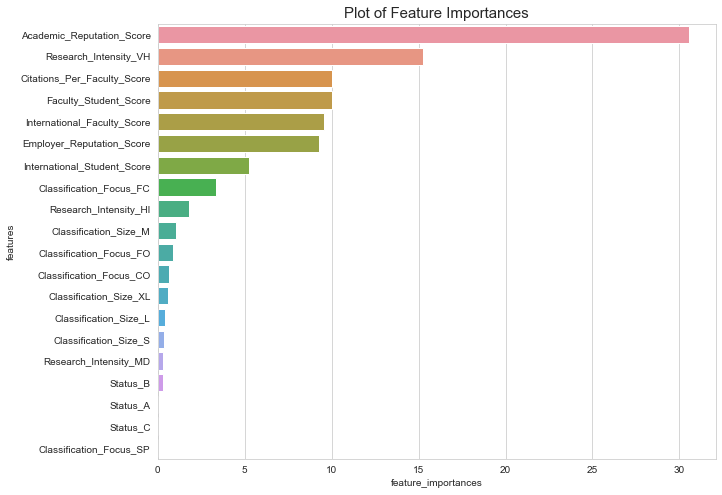

In [414]:
plot_importances(p_cols.drop(['Overall_Score'], axis = 1).columns, pipeline.steps[1][1].feature_importances_)

The result above shows that `academic_reputation_score` has the most contribution to `overall_score`, followed by `research_intensity_vh`, `faculty_student_score`, ...

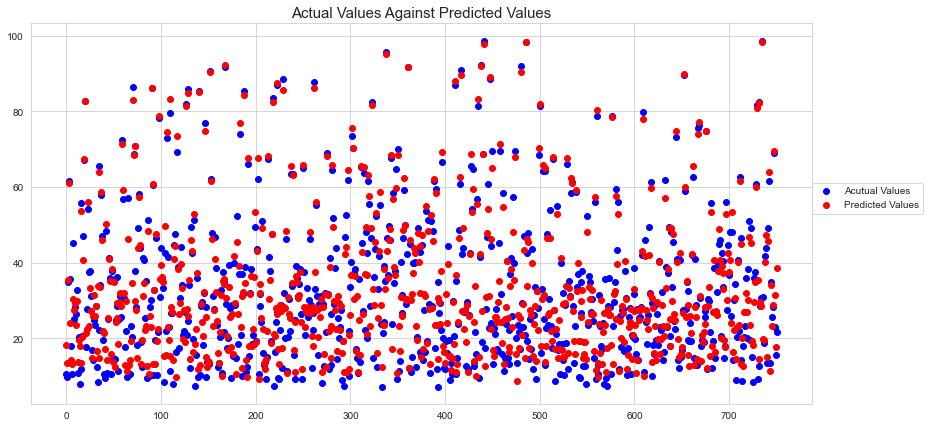

In [415]:
fig, ax = plt.subplots(figsize = (14,7))
x = np.arange(0, len(xtest), 1)
ax.scatter(x, fytest, c='b', label="Acutual Values")
ax.scatter(x, pipeline.predict(fxtest), c='r', label="Predicted Values")
ax.legend(loc=(1, 0.5));
plt.title('Actual Values Against Predicted Values', fontsize = 15)
plt.savefig("Actual_Predicted.png", bbox_inches='tight', dpi=500)
plt.show()

We plotted the actual value of the data and then plotted an overlay of the predicted data to show how close the predicted points are to the actual points.

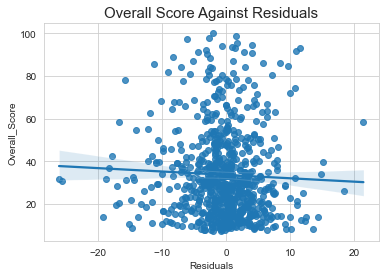

In [416]:
residuals = fytest - pipeline.predict(fxtest)
plt.figure()
a = sns.regplot(x = residuals, y = ytest)
a.set(xlabel = 'Residuals')
plt.title('Overall Score Against Residuals', fontsize = 15)
plt.savefig("overall_score_residuals.png", bbox_inches='tight', dpi=500)
plt.show()

We plotted the residual against the actual values and we can see that the distribution centers around 0 showing that our predicted values don't stray too far from the actual values

### Check for homoscedasciticity

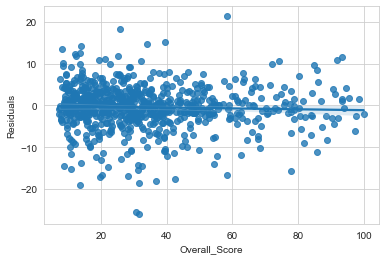

In [417]:
plt.figure()
a = sns.regplot(x = ytest, y = residuals)
a.set(ylabel = 'Residuals')
plt.show()

The almost constant distribution of the residuals along the x-axis shows that it is homoscedastic

### Check for normality

[Text(0.5, 0, 'Residuals')]

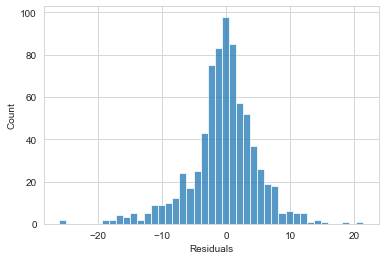

In [418]:
plt.figure()
a = sns.histplot(x = residuals)
a.set(xlabel = 'Residuals')

The umbel shape distribution shows that it is normal

In [419]:
import pickle as pk
with open('final_model.pickle', 'wb') as f:
    pk.dump(pipeline, f)

In [420]:
parameters = {'depth' : [4, 5,6,7,8,9,10],
             'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.1, 0.2,0.3],
             'iterations':[i for i in range(100,1000,50)]}

In [ ]:
grid_cbt = GridSearchCV(estimator = cbt, param_grid = parameters, cv = 4, n_jobs = -1, verbose = 2)
grid_cbt.fit(xtrain2, ytrain2)

Fitting 4 folds for each of 882 candidates, totalling 3528 fits


In [ ]:
grid_cbt.best_params_